# **Monitoring effectiveness of COVID-19 Vaccine Combinations in Thailand 2021-2022:**
# **Analysis of the whole country's dynamic cohort from the national registration**
Note that if you cannot run R in your jupyter environment, please access the following: 

# **Must read**

The data provided, were aggregated data. They cannot identify any individual.

**Preparation**

Install libraries for data analysis

In [11]:
install.packages("tidyverse")
install.packages("data.table")
install.packages("readxl")
install.packages("lubridate")
install.packages("stringr")
install.packages("survminer")
install.packages("epiDisplay")
install.packages("ggrepel")
install.packages("ggpubr")
install.packages("broom")
install.packages("EValue")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘textshaping’, ‘ragg’


Warning message in install.packages("tidyverse"):
“installation of package ‘textshaping’ had non-zero exit status”
Warning message in install.packages("tidyverse"):
“installation of package ‘ragg’ had non-zero exit status”
Warning message in install.packages("tidyverse"):
“installation of package ‘tidyverse’ had non-zero exit status”
Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/

Import the essential libraries

In [12]:
library(tidyverse)
library(readxl)
library(stringr)
library(lubridate)
library(epiDisplay)
library(data.table)
library(ggrepel)
library(ggpubr)
library(broom)
library(EValue)

**Set colors for visualization**

In [13]:
safe_colorblind_palette <- c("dark red", "#E69F00", "#56B4E9", "#009E73", 
                             "#0072B2", "#D55E00", "#CC79A7")

**Import data**

Note that we import data from an online source that can be expired. Data will be re-uploaded upon written request to the corresponding author.

*import claim data*

In [14]:
options(warn=-1)
temp <- tempfile()
download.file("https://drive.google.com/uc?id=1ABRKjOpv_BCJg7kW2EMUhiiVQCGPhKcd&authuser=0&export=download", temp)
cvtab<-readRDS(temp)
names(cvtab)<-tolower(names(cvtab))
options(warn=0)

Let's explore data

In [15]:
glimpse(cvtab)

Rows: 3,195,192
Columns: 11
$ province <chr> "กระบี่", "กระบี่", "กระบี่", "กระบี่", "กระบี่", "กระบี่", "กระบี่", "กระบี่…
$ agegroup <fct> 18-40, 18-40, 18-40, 18-40, 18-40, 18-40, 18-40, 18-40, 18-40…
$ gender   <chr> "ชาย", "ชาย", "ชาย", "ชาย", "ชาย", "ชาย", "ชาย", "ชาย", "ชาย"…
$ vac_type <chr> "AZ", "AZ", "AZ", "AZ", "AZ", "AZ", "AZ", "AZ", "AZ", "AZ", "…
$ inf_type <chr> "Death", "Death", "Death", "Death", "Death", "Death", "Death"…
$ vac_date <chr> "2021-05", "2021-05", "2021-05", "2021-05", "2021-05", "2021-…
$ inf_date <chr> "2021-07", "2021-08", "2021-09", "2021-10", "2021-11", "2021-…
$ a        <dbl> 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0…
$ b        <dbl> 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1…
$ c        <dbl> 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 3926, 3918, 3907, 3888…
$ d        <dbl> 70361, 70141, 69699, 68894, 68222, 67230, 65802, 63518, 60735…


*   a: Number of vaccinated population who had outcome
*   b: Number of unvaccinated population who had outcome
*   c: Number of vaccinated population who had no outcome
*   b: Number of unvaccinated population who had no outcome

In [16]:
atrisk<-unique(cvtab[inf_type=="Severe"],by=c("vac_type","vac_date","inf_date","province","gender","agegroup"))  %>% group_by(vac_type,vac_date,inf_date) %>% summarise(atrisk = sum(a+c))

`summarise()` has grouped output by 'vac_type', 'vac_date'. You can override
using the `.groups` argument.


In [17]:
atrisk<-as.data.table(atrisk)
atrisk<-atrisk[vac_type %in% c("SV-AZ","AZ-PZ", "AZ-AZ-MN", "AZ-AZ-PZ","SP-SP-PZ","SV-AZ-AZ","SV-AZ-PZ","SV-SV-AZ")]

In [18]:
atrisk<-unique(atrisk,by=c("vac_type","vac_date"))

In [19]:
atrisk$vac_type<-factor(atrisk$vac_type,levels=c("SV-AZ","AZ-PZ","SV-SV-AZ","SV-AZ-AZ","SV-AZ-PZ","SP-SP-PZ","AZ-AZ-PZ","AZ-AZ-MN"))

In [20]:
atrisk<-atrisk[,-c("vac_date")]

In [21]:
t1<-atrisk %>% spread(key = vac_type,value=atrisk) %>% as.data.table()

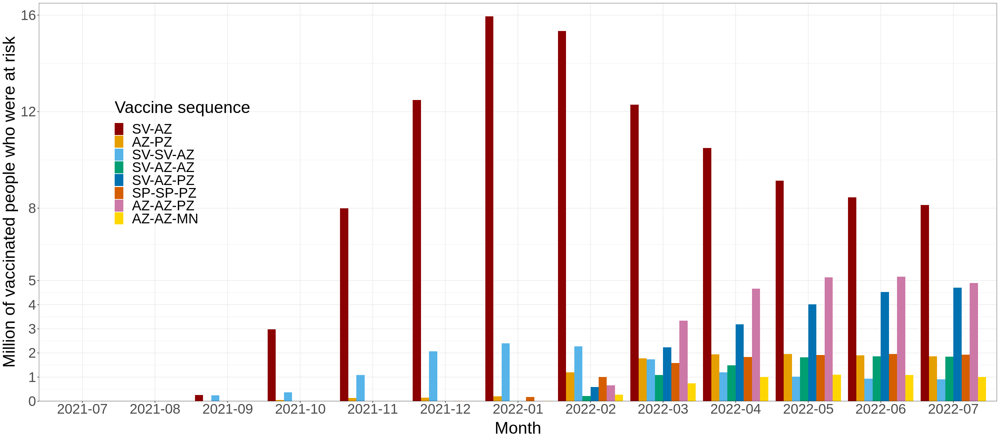

In [22]:
options(repr.plot.width=25, repr.plot.height=11)
ggplot(atrisk, aes(fill=vac_type, y=atrisk, x=inf_date)) + 
    geom_bar(position="dodge", stat="identity")+
      scale_fill_manual(values = c(safe_colorblind_palette,"gold","orange"))+
  scale_x_discrete(name = "Month")+
  scale_y_continuous(expand=c(0,0),breaks=c(0:5,8,12,16)*1000000,limits=c(0,16.5)*1000000,labels = scales::label_comma(scale = 0.000001),name = "Million of vaccinated people who were at risk")+
  guides(fill=guide_legend(title="Vaccine sequence"))+
  theme_bw()+
  theme(legend.position = c(0.15,0.6),
legend.title=element_text(size=30),
legend.text=element_text(size=25),
legend.background = element_blank(),
legend.title.align = 0.5,
  axis.text.x = element_text(size=25),
        axis.title.x = element_text(size=30,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=25),
        axis.title.y = element_text(size=30,margin = margin(t = 0, r = 5, b = 0, l = 0)))

# **Data manipulation**

**Create factors for stratification analysis according to Mantel-Haenszel stratification method**

Ref: Rothman, K.J., Greenland, S. and Lash, T. (2008) Modern epidemiology. Third Edition. Lippincott Williams & Wilkins, Philadelphia, 274-278.

In [23]:
stratum<-cvtab %>% mutate(Ni = as.numeric(a+c),
                            N0 = as.numeric(b+d),
                            Mi = as.numeric(a+b),
                            M0 = as.numeric(c+d),
                            total = as.numeric(a+b+c+d))
stratum<-stratum %>% mutate(ufactor = a*N0/total, lfactor = b*Ni/total)
stratum<-stratum %>% mutate(vfactor = (Mi*Ni*N0/(total^2))-(a*b/total))
stratum<-stratum %>% mutate(xfactor = Ni*Mi/total,yfactor= Ni*Mi*N0*M0/(total^2*(total-1)))
stratum<-stratum %>% mutate(month = round(interval(ymd(paste(vac_date,"01",sep="-")),
                                             ymd(paste(inf_date,"01",sep="-")))/duration(30,"days"),0))

In [24]:
stratum[inf_date=="2021-07" & vac_type=="SV-SV" & inf_type=="Severe"] %>% group_by(province) %>% summarise(a=sum(a),b=sum(b),c=sum(c),d=sum(d))

province,a,b,c,d
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
กระบี่,0,0,10820,299589
กรุงเทพมหานคร,9,422,152558,3672238
กาญจนบุรี,0,57,12037,538291
กาฬสินธุ์,0,9,10807,658371
กำแพงเพชร,2,16,8611,465500
ขอนแก่น,0,22,23649,1282548
จันทบุรี,0,6,9437,343583
ฉะเชิงเทรา,0,5,9856,495272
ชลบุรี,0,8,32573,1037175


We exclude SAR-CoV-2 infection after 1 Dec 2021 because individuals with suspected SAR-CoV-2 infection could be confirmed by ATK.

Ref: https://ddc.moph.go.th/viralpneumonia/file/g_srrt/g_srrt_221264.pdf

**Calculate vaccine effectiveness for each regimen in time series after complete vaccination**

In [25]:
ve<-stratum %>% group_by(vac_type,inf_type,month) %>%
  summarise(rrmh=sum(ufactor)/sum(lfactor),
            lnvar =sum(vfactor)/(sum(ufactor)*sum(lfactor)),
            z =abs((sum(a)-sum(xfactor))/sqrt(sum(yfactor)))) %>% as.data.table()
ve<-ve %>% mutate(power=pnorm(z-qnorm(1-0.025/2))+pnorm(-z-qnorm(1-0.025/2))) %>% as.data.table()

`summarise()` has grouped output by 'vac_type', 'inf_type'. You can override
using the `.groups` argument.


In [26]:
ve<-ve[rrmh != "NaN" & lnvar != "NaN" & lnvar != Inf]

**Select only the vaccine regimens with adequate sample size**

Calculate confidence interval and exclude extreme interval [CI should not be infinite]

In [27]:
ve <- ve %>% mutate(rrmh_lower = exp(log(rrmh)-qnorm(1-0.05/2)*sqrt(lnvar)),
                          rrmh_upper = exp(log(rrmh)+qnorm(1-0.05/2)*sqrt(lnvar)))
ve <- ve %>% mutate(VE = (1-rrmh)*100,
                          lower_VE = (1-rrmh_upper)*100,
                          upper_VE = (1-rrmh_lower)*100)

Creating dose number

In [28]:
ve$dose<-str_count(ve$vac_type, pattern = "-")+1

In [29]:
ve<-ve[month<=7]

## **Visualization**

**2-dose regimen against severe COVID-19**

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2 3.4.0.
ℹ Please use `linewidth` instead.”


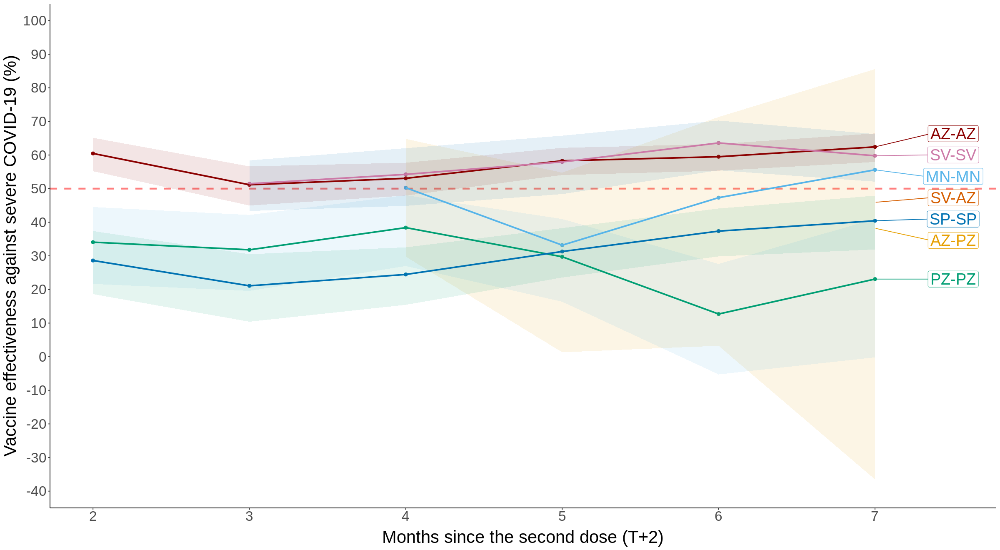

In [30]:
options(repr.plot.width=20, repr.plot.height=11)
ve_severe_d2<-ve[inf_type=="Severe" & dose==2]
ggplot(ve_severe_d2[!(vac_type %in% c("SV-AZ","AZ-PZ"))])+
  geom_hline(yintercept = 50,col="red",linetype=2,size=1.2,alpha=0.5)+
  geom_point(aes(x=month,y=VE,col=vac_type),size=2,show.legend = FALSE)+
  geom_ribbon(aes(x=month,y=VE,ymax=upper_VE,ymin=lower_VE,group=vac_type,fill=vac_type),alpha=0.1,show.legend = FALSE)+
  geom_line(aes(x=month,y=VE,col=vac_type),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_severe_d2[order(-month)],by=c("vac_type")),
                   aes(label = vac_type,x=month,y=VE,col=vac_type),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 1:max(ve_severe_d2$month),limits = c(2,max(ve_severe_d2$month)+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-45,105),breaks=c(4:1*-10,0:10*10),name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

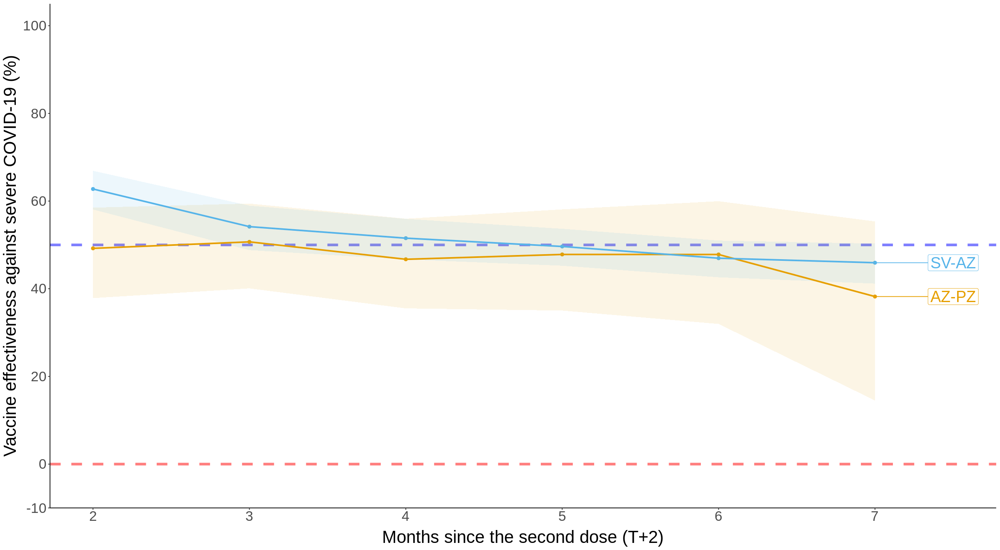

In [31]:
ve_severe_d2<-ve_severe_d2[vac_type %in% c("SV-AZ","AZ-PZ")]
ggplot(ve_severe_d2)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.8,alpha=0.5)+
  geom_hline(yintercept = 0,col="red",linetype=2,size=1.8,alpha=0.5)+
  geom_point(aes(x=month,y=VE,col=vac_type),size=2,show.legend = FALSE)+
  geom_ribbon(aes(x=month,y=VE,ymax=upper_VE,ymin=lower_VE,group=vac_type,fill=vac_type),alpha=0.1,show.legend = FALSE)+
  geom_line(aes(x=month,y=VE,col=vac_type),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_severe_d2[order(-month)],by=c("vac_type")),
                   aes(label = vac_type,x=month,y=VE,col=vac_type),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette[c(2,3)])+
  scale_color_manual(values = safe_colorblind_palette[c(2,3)])+
  scale_x_continuous(breaks = 1:max(ve_severe_d2$month),limits = c(2,max(ve_severe_d2$month)+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-10,105),breaks=c(-10,0:5*20),name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

**3-dose regimen against severe COVID-19**

Warning message in max(ids, na.rm = TRUE):
“no non-missing arguments to max; returning -Inf”


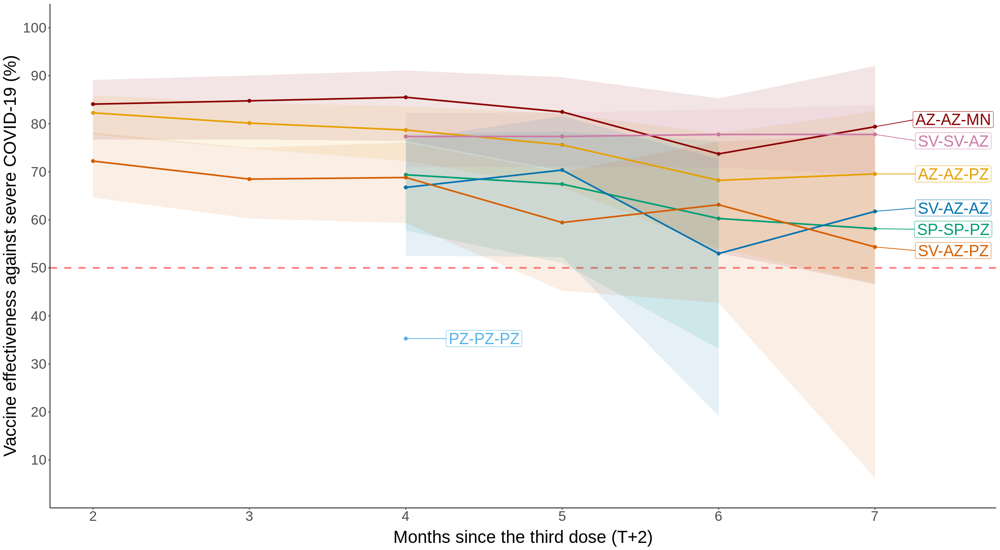

In [32]:
ve_severe_d3<-ve[inf_type=="Severe" & dose==3]
ggplot(ve_severe_d3)+
  geom_hline(yintercept = 50,col="red",linetype=2,size=1.2,alpha=0.5)+
  geom_point(aes(x=month,y=VE,col=vac_type),size=2,show.legend = FALSE)+
  geom_ribbon(aes(x=month,y=VE,ymax=upper_VE,ymin=lower_VE,group=vac_type,fill=vac_type),alpha=0.1,show.legend = FALSE)+
  geom_line(aes(x=month,y=VE,col=vac_type),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_severe_d3[order(-month)],by=c("vac_type")),
                   aes(label = vac_type,x=month,y=VE,col=vac_type),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 1:max(ve_severe_d3$month),limits = c(2,max(ve_severe_d3$month)+0.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=1:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

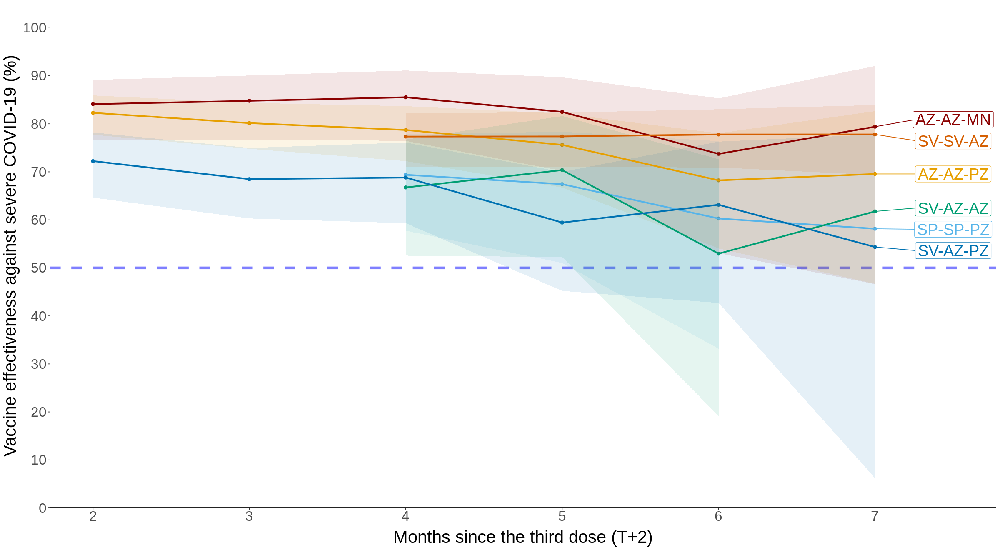

In [33]:
ve_severe_d3<-ve_severe_d3[vac_type %in% c("AZ-AZ-MN", "AZ-AZ-PZ","SP-SP-PZ","SV-AZ-AZ","SV-AZ-PZ","SV-SV-AZ")]
ggplot(ve_severe_d3)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.8,alpha=0.5)+
  geom_point(aes(x=month,y=VE,col=vac_type),size=2,show.legend = FALSE)+
  geom_ribbon(aes(x=month,y=VE,ymax=upper_VE,ymin=lower_VE,group=vac_type,fill=vac_type),alpha=0.1,show.legend = FALSE)+
  geom_line(aes(x=month,y=VE,col=vac_type),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_severe_d3[order(-month)],by=c("vac_type")),
                   aes(label = vac_type,x=month,y=VE,col=vac_type),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 1:max(ve_severe_d3$month),limits = c(2,max(ve_severe_d3$month)+0.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

**2-dose regimen against death from COVID-19**

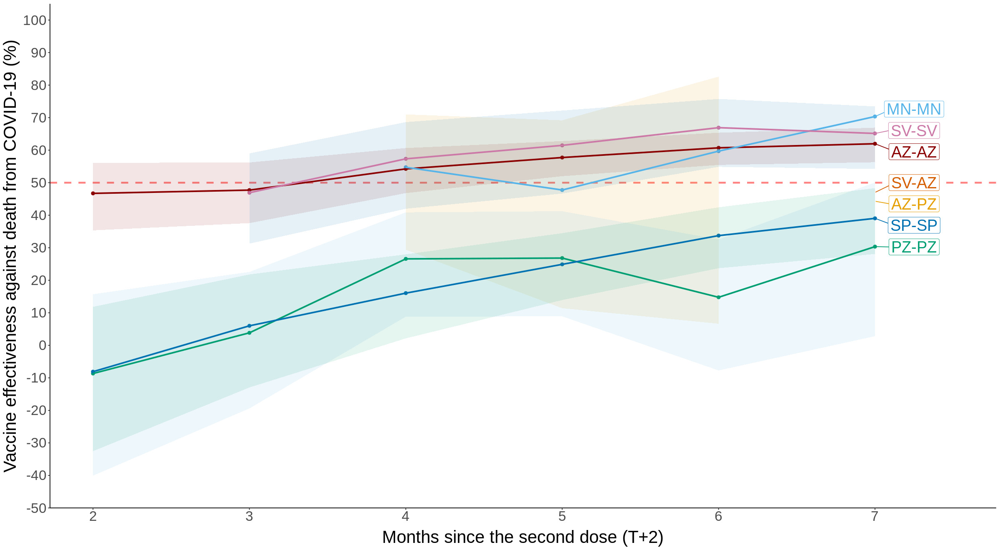

In [34]:
ve_death_d2<-ve[inf_type=="Death" & dose==2]
ggplot(ve_death_d2[!(vac_type %in% c("SV-AZ","AZ-PZ"))])+
  geom_hline(yintercept = 50,col="red",linetype=2,size=1.2,alpha=0.5)+
  geom_point(aes(x=month,y=VE,col=vac_type),size=2,show.legend = FALSE)+
  geom_ribbon(aes(x=month,y=VE,ymax=upper_VE,ymin=lower_VE,group=vac_type,fill=vac_type),alpha=0.1,show.legend = FALSE)+
  geom_line(aes(x=month,y=VE,col=vac_type),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_death_d2[order(-month)],by=c("vac_type")),
                   aes(label = vac_type,x=month,y=VE,col=vac_type),
                   nudge_x = 0.25,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 1:max(ve_death_d2$month),limits = c(2,max(ve_death_d2$month)+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-50,105),breaks=c(5:1*-10,0:10*10),name = "Vaccine effectiveness against death from COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

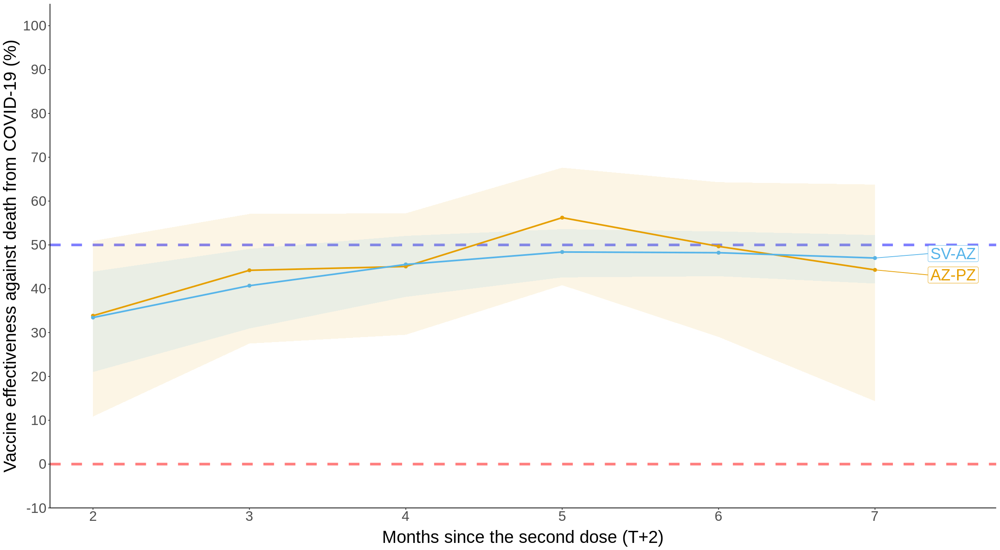

In [35]:
ve_death_d2<-ve_death_d2[vac_type %in% c("SV-AZ","AZ-PZ")]
ggplot(ve_death_d2)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.8,alpha=0.5)+
  geom_hline(yintercept = 0,col="red",linetype=2,size=1.8,alpha=0.5)+
  geom_point(aes(x=month,y=VE,col=vac_type),size=2,show.legend = FALSE)+
  geom_ribbon(aes(x=month,y=VE,ymax=upper_VE,ymin=lower_VE,group=vac_type,fill=vac_type),alpha=0.1,show.legend = FALSE)+
  geom_line(aes(x=month,y=VE,col=vac_type),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_death_d2[order(-month)],by=c("vac_type")),
                   aes(label = vac_type,x=month,y=VE,col=vac_type),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette[2:3])+
  scale_color_manual(values = safe_colorblind_palette[2:3])+
  scale_x_continuous(breaks = 1:max(ve_death_d2$month),limits = c(2,max(ve_death_d2$month)+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-10,105),breaks=c(-10,0:10*10),name = "Vaccine effectiveness against death from COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

**3-dose regimen against death from COVID-19**

Warning message in max(ids, na.rm = TRUE):
“no non-missing arguments to max; returning -Inf”


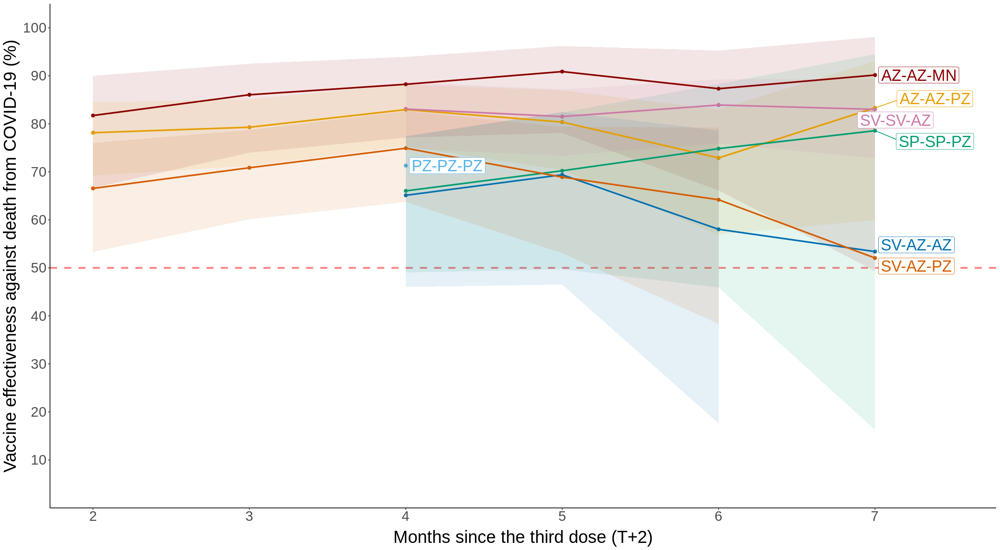

In [36]:
ve_death_d3<-ve[inf_type=="Death" & dose==3]
ggplot(ve_death_d3)+
  geom_hline(yintercept = 50,col="red",linetype=2,size=1.2,alpha=0.5)+
  geom_point(aes(x=month,y=VE,col=vac_type),size=2,show.legend = FALSE)+
  geom_ribbon(aes(x=month,y=VE,ymax=upper_VE,ymin=lower_VE,group=vac_type,fill=vac_type),alpha=0.1,show.legend = FALSE)+
  geom_line(aes(x=month,y=VE,col=vac_type),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_death_d3[order(-month)],by=c("vac_type")),
                   aes(label = vac_type,x=month,y=VE,col=vac_type),
                   nudge_x = 0.25,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 1:max(ve_death_d3$month),limits = c(2,max(ve_death_d3$month)+0.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=c(1:10*10),name = "Vaccine effectiveness against death from COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

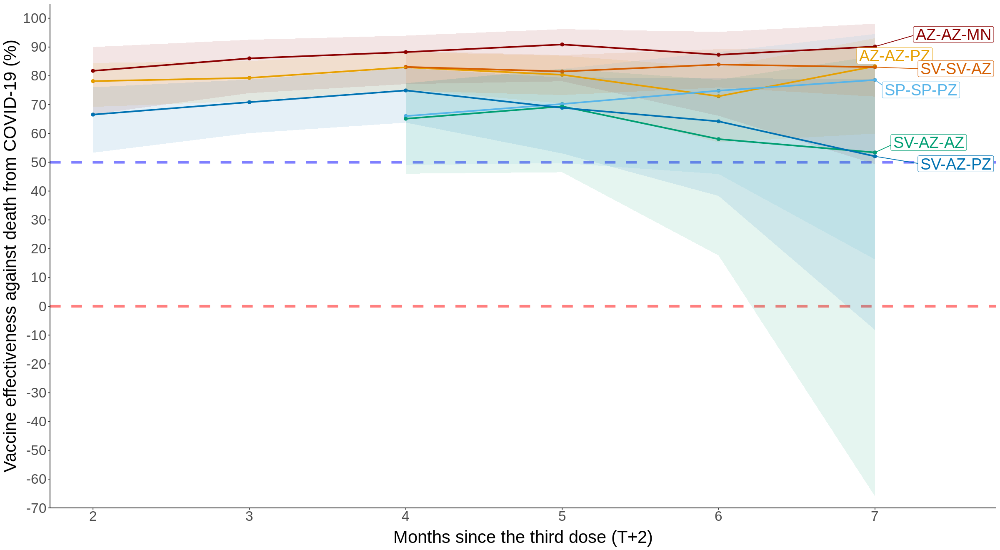

In [37]:
ve_death_d3<-ve_death_d3[vac_type %in% c("AZ-AZ-MN", "AZ-AZ-PZ","SP-SP-PZ","SV-AZ-AZ","SV-AZ-PZ","SV-SV-AZ")]
ggplot(ve_death_d3)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.8,alpha=0.5)+
  geom_hline(yintercept = 0,col="red",linetype=2,size=1.8,alpha=0.5)+
  geom_point(aes(x=month,y=VE,col=vac_type),size=2,show.legend = FALSE)+
  geom_ribbon(aes(x=month,y=VE,ymax=upper_VE,ymin=lower_VE,group=vac_type,fill=vac_type),alpha=0.1,show.legend = FALSE)+
  geom_line(aes(x=month,y=VE,col=vac_type),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_death_d3[order(-month)],by=c("vac_type")),
                   aes(label = vac_type,x=month,y=VE,col=vac_type),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 1:max(ve_death_d3$month),limits = c(2,max(ve_death_d3$month)+0.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-70,105),breaks=c(7:1*-10,0:10*10),name = "Vaccine effectiveness against death from COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

# **Select major vaccine sequences**

In [38]:
stratum<-stratum[vac_type %in% c("AZ-PZ","SV-AZ", "AZ-AZ-MN", "AZ-AZ-PZ","SP-SP-PZ","SV-AZ-AZ","SV-AZ-PZ","SV-SV-AZ")]
stratum$dose<-str_count(stratum$vac_type, pattern = "-")+1

In [39]:
stratum$month<-stratum$month-2

# **Regression model for 2-dose vaccination against severe COVID-19**

Manipulate data for regression analysis

In [40]:
d2_severe<-stratum[inf_type=="Severe" & dose == 2]
d2_severe<-d2_severe[,c("province", "agegroup", "gender", "vac_type", "inf_type", "vac_date", "inf_date","month","a","b","c","d")]
d2_severe$male<-d2_severe$gender=="ชาย"

d2_severe_a<-d2_severe[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","a", "inf_date")]
names(d2_severe_a)[7]<-"Freq"
d2_severe_a$severe<-TRUE

d2_severe_b<-d2_severe[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","b", "inf_date")]
names(d2_severe_b)[7]<-"Freq"
d2_severe_b$vac_type<-"None"
d2_severe_b<-unique(d2_severe_b,by=c("province", "agegroup", "male", "vac_date", "month", "inf_date"))
d2_severe_b$severe<-TRUE


d2_severe_c<-d2_severe[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","c", "inf_date")]
names(d2_severe_c)[7]<-"Freq"
d2_severe_c$severe<-FALSE

d2_severe_d<-d2_severe[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","d", "inf_date")]
names(d2_severe_d)[7]<-"Freq"
d2_severe_d$vac_type<-"None"
d2_severe_d<-unique(d2_severe_d,by=c("province", "agegroup", "male", "vac_date", "month", "inf_date"))
d2_severe_d$severe<-FALSE

d2_s<-rbind(d2_severe_a,d2_severe_b,d2_severe_c,d2_severe_d)

In [41]:
d2_s$agegroup<-factor(d2_s$agegroup,levels = c("18-40","41-60","61-80","Over 80"))
d2_s$vac_type<-factor(d2_s$vac_type,levels=c("None","AZ-PZ","SV-AZ"))
d2_s$vac_date<-factor(d2_s$vac_date,levels = c("2021-05","2021-06","2021-07","2021-08","2021-09",
                                               "2021-10","2021-11","2021-12","2022-01","2022-02",
                                               "2022-03","2022-04"))
namep<-unique(d2_s[province !="กรุงเทพมหานคร"]$province)
d2_s$province<-factor(d2_s$province,levels = c("กรุงเทพมหานคร",namep)) #Bangkok, the capital, as a reference

**Full model for 2-dose vaccination against severe COVID-19**

In [42]:
full_d2_s<-glm(severe ~ vac_type*agegroup*month+male+province+inf_date, binomial, weight=Freq, data=d2_s)

In [43]:
summary(full_d2_s)


Call:
glm(formula = severe ~ vac_type * agegroup * month + male + province + 
    inf_date, family = binomial, data = d2_s, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-12.408   -0.266    0.000    0.000   60.518  

Coefficients:
                                      Estimate Std. Error  z value Pr(>|z|)    
(Intercept)                         -10.893996   0.032676 -333.392  < 2e-16 ***
vac_typeAZ-PZ                        -1.275145   0.140807   -9.056  < 2e-16 ***
vac_typeSV-AZ                        -1.112258   0.054301  -20.483  < 2e-16 ***
agegroup41-60                         1.112344   0.024333   45.713  < 2e-16 ***
agegroup61-80                         1.962717   0.024589   79.820  < 2e-16 ***
agegroupOver 80                       2.927934   0.032386   90.406  < 2e-16 ***
month                                -0.149489   0.004479  -33.373  < 2e-16 ***
maleTRUE                              0.393037   0.008295   47.385  < 2e-16 ***
provinceกร

**SV-AZ sequence**

In [44]:
d2_s_svaz<-d2_s[vac_type %in% c("None","SV-AZ")]

In [45]:
model_d2_s_svaz_inter<-glm(severe ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d2_s_svaz)

In [46]:
car::vif(model_d2_s_svaz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,5.126745,1,2.264232
month,4.539778,1,2.130676
male,1.003921,1,1.001959
agegroup,1.036499,3,1.005993
province,1.090044,76,1.000567
inf_date,4.613588,12,1.065782
vac_type:month,2.911317,1,1.706258


In [47]:
summary(model_d2_s_svaz_inter)


Call:
glm(formula = severe ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d2_s_svaz, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.175   -0.521    0.000    0.000   60.074  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -11.146228   0.028860 -386.223  < 2e-16 ***
vac_typeSV-AZ          -0.814992   0.023574  -34.572  < 2e-16 ***
month                  -0.090188   0.002607  -34.588  < 2e-16 ***
maleTRUE                0.394600   0.008371   47.138  < 2e-16 ***
agegroup41-60           1.167714   0.013819   84.503  < 2e-16 ***
agegroup61-80           2.352751   0.013675  172.053  < 2e-16 ***
agegroupOver 80         3.741826   0.016421  227.870  < 2e-16 ***
provinceกระบี่           -0.908745   0.063179  -14.384  < 2e-16 ***
provinceกาญจนบุรี         0.158137   0.033450    4.728 2.27e-06 ***
provinceกาฬสินธุ์         -1.143526   0.044373  -25.771  < 2e

Initial OR

In [48]:
exp(summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ",2])

[1] 0.4226566 0.4426430 0.4635745

Initial VE

In [49]:
(1-exp(summary(model_d2_s_svaz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_s_svaz_inter)$coef[2,2]))*100

[1] 53.64255 55.73570 57.73434

In [50]:
se_svaz <- sqrt(vcov(model_d2_s_svaz_inter)["vac_typeSV-AZ","vac_typeSV-AZ"] + 
  vcov(model_d2_s_svaz_inter)["vac_typeSV-AZ:month","vac_typeSV-AZ:month"]+ 
  2*vcov(model_d2_s_svaz_inter)["vac_typeSV-AZ","vac_typeSV-AZ:month"])
se_svaz

[1] 0.02011475

In [51]:
sqrt(sum(vcov(model_d2_s_svaz_inter)[c("vac_typeSV-AZ","vac_typeSV-AZ:month"),c("vac_typeSV-AZ","vac_typeSV-AZ:month")]))

[1] 0.02011475

OR at 7 months after the last dose (T=5)

In [52]:
exp(summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ",1]+
  summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ:month",1]*5+
  qnorm(c(0.025,0.50,0.975))*se_svaz)

[1] 0.5019329 0.5221165 0.5431117

Sensitivity analysis using E-Value

In [53]:
evalues.OR(exp(summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ",2])[2], 
exp(summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ",2])[1], 
exp(summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.05735701,-0.07734344,-0.03642547
E-values,0.53154752,NA,0.32285703


VE at 7 months after the last dose (T=5)

In [54]:
(1-exp(summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ",1]+
  summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ:month",1]*5+
  qnorm(c(0.975,0.50,0.025))*se_svaz))*100

[1] 45.68883 47.78835 49.80671

VE over time

In [55]:
ve_svaz<-NULL
for(i in 0:500){
  ve_svaz<-rbind(ve_svaz,(1-exp(summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ",1]+
  summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ:month",1]*i/100+
  qnorm(c(0.975,0.50,0.025))*se_svaz))*100)
}

In [56]:
ve_svaz<-cbind(0:500/100,ve_svaz)

In [57]:
ve_svaz<-as.data.frame(ve_svaz)
names(ve_svaz)<-c("month","lower","estimate","upper")

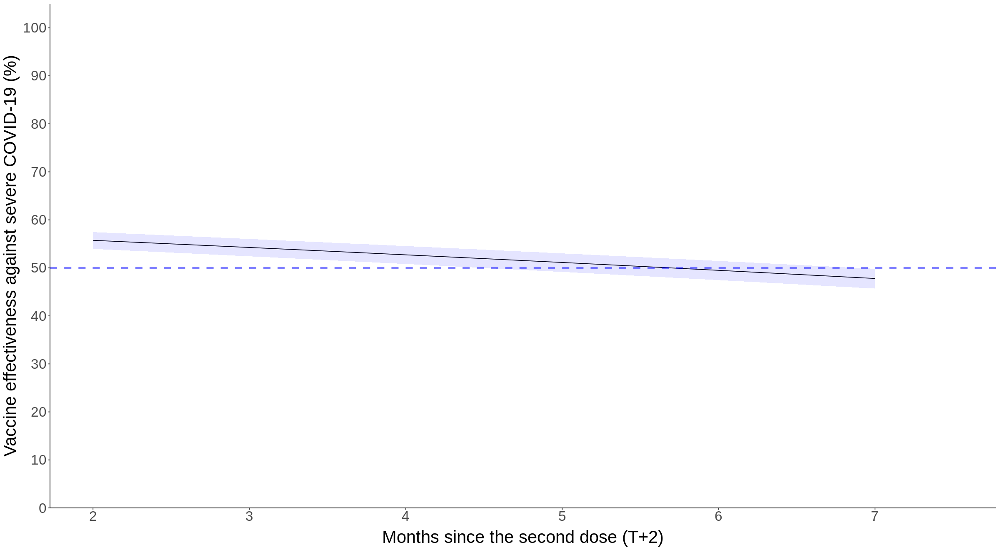

In [58]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svaz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

Estimated time to need a booster shot

In [59]:
(log(0.5)-summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ",1]-qnorm(c(0.975,0.50,0.025))*se_svaz)/summary(model_d2_s_svaz_inter)$coef["vac_typeSV-AZ:month",1]+2

[1] 4.495663 5.689415 6.883168

*Stratified by age group: 18-40*

In [60]:
d2_s_svaz_18_40<-d2_s_svaz[agegroup=="18-40"]

In [61]:
model_d2_s_svaz_inter_18_40<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_s_svaz_18_40)
summary(model_d2_s_svaz_inter_18_40)


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_s_svaz_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-5.5875  -0.3725   0.0000   0.0000  21.2790  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -1.083e+01  7.038e-02 -153.903  < 2e-16 ***
vac_typeSV-AZ         -5.942e-01  7.033e-02   -8.448  < 2e-16 ***
month                 -6.314e-02  8.082e-03   -7.812 5.64e-15 ***
maleTRUE               5.036e-02  2.377e-02    2.119 0.034112 *  
provinceกระบี่          -4.212e-01  1.640e-01   -2.568 0.010230 *  
provinceกาญจนบุรี        8.231e-01  8.314e-02    9.900  < 2e-16 ***
provinceกาฬสินธุ์        -4.083e-01  1.238e-01   -3.299 0.000970 ***
provinceกำแพงเพชร     -2.696e-01  1.311e-01   -2.055 0.039844 *  
provinceขอนแก่น        -1.856e-01  8.972e-02   -2.068 0.038608 *  
provinceจันทบุรี          4.372e-01  1.109e-01    3.942 8.09e-

Initial OR

In [62]:
exp(summary(model_d2_s_svaz_inter_18_40)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_svaz_inter_18_40)$coef["vac_typeSV-AZ",2])

[1] 0.4809396 0.5520232 0.6336132

Initial VE

In [63]:
(1-exp(summary(model_d2_s_svaz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_s_svaz_inter_18_40)$coef[2,2]))*100

[1] 36.63868 44.79768 51.90604

OR at 7 month after the last dose (T=5)

In [64]:
se_svaz_18_40 <- sqrt(vcov(model_d2_s_svaz_inter_18_40)["vac_typeSV-AZ","vac_typeSV-AZ"] + 
  vcov(model_d2_s_svaz_inter_18_40)["vac_typeSV-AZ:month","vac_typeSV-AZ:month"]+ 
  2*vcov(model_d2_s_svaz_inter_18_40)["vac_typeSV-AZ","vac_typeSV-AZ:month"])

exp(summary(model_d2_s_svaz_inter_18_40)$coef["vac_typeSV-AZ",1]+
  summary(model_d2_s_svaz_inter_18_40)$coef["vac_typeSV-AZ:month",1]*5+
  qnorm(c(0.025,0.50,0.975))*se_svaz_18_40)

[1] 0.4952584 0.5566855 0.6257314

VE at 7 month after the last dose (T=5)

In [65]:
(1-exp(summary(model_d2_s_svaz_inter_18_40)$coef["vac_typeSV-AZ",1]+
  summary(model_d2_s_svaz_inter_18_40)$coef["vac_typeSV-AZ:month",1]*5+
  qnorm(c(0.975,0.50,0.025))*se_svaz_18_40))*100

[1] 37.42686 44.33145 50.47416

VE overtime

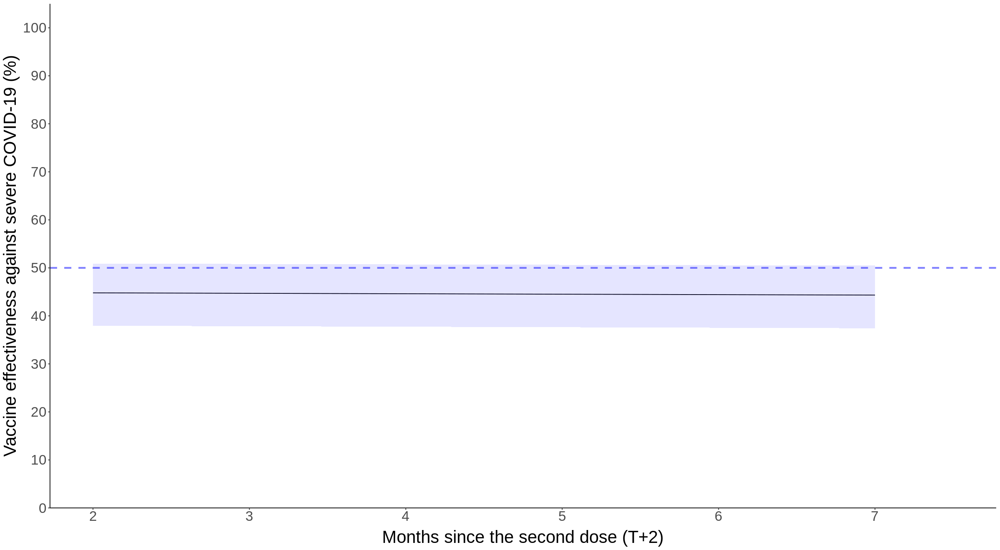

In [66]:
ve_svaz_18_40<-NULL
for(i in 0:500){
  ve_svaz_18_40<-rbind(ve_svaz_18_40,(1-exp(summary(model_d2_s_svaz_inter_18_40)$coef["vac_typeSV-AZ",1]+
                                  summary(model_d2_s_svaz_inter_18_40)$coef["vac_typeSV-AZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_svaz_18_40))*100)
}

ve_svaz_18_40<-cbind(0:500/100,ve_svaz_18_40)

ve_svaz_18_40<-as.data.frame(ve_svaz_18_40)
names(ve_svaz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svaz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

*Stratified by age group: 41_60*


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_s_svaz_41_60, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-10.977   -0.672    0.000    0.000   44.838  

Coefficients:
                       Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -9.727182   0.042472 -229.028  < 2e-16 ***
vac_typeSV-AZ         -0.836973   0.041327  -20.252  < 2e-16 ***
month                 -0.100844   0.004771  -21.138  < 2e-16 ***
maleTRUE               0.316280   0.014173   22.315  < 2e-16 ***
provinceกระบี่          -1.050086   0.123600   -8.496  < 2e-16 ***
provinceกาญจนบุรี        0.318361   0.056006    5.684 1.31e-08 ***
provinceกาฬสินธุ์        -0.809241   0.071897  -11.256  < 2e-16 ***
provinceกำแพงเพชร     -0.207760   0.067261   -3.089 0.002009 ** 
provinceขอนแก่น        -0.643572   0.053796  -11.963  < 2e-16 ***
provinceจันทบุรี         -0.140916   0.074304   -1.896 0.057898 .  
prov

[1] 0.3993278 0.4330192 0.4695532

[1] 53.04468 56.69808 60.06722

[1] 0.4833928 0.5180919 0.5552817

[1] 44.47183 48.19081 51.66072

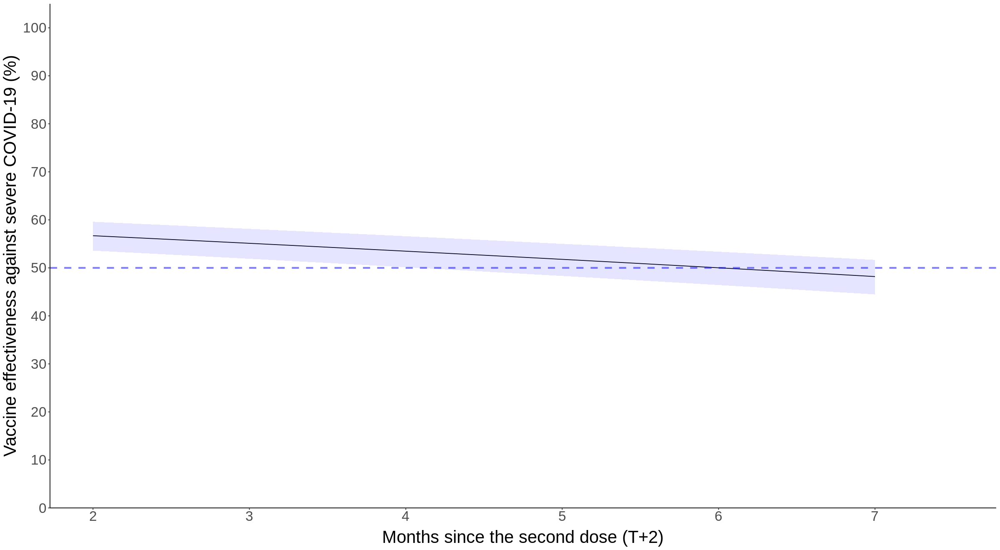

In [67]:
#Stratified by age group: 41_60
d2_s_svaz_41_60<-d2_s_svaz[agegroup=="41-60"]

model_d2_s_svaz_inter_41_60<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_s_svaz_41_60)
summary(model_d2_s_svaz_inter_41_60)

#Initial OR
exp(summary(model_d2_s_svaz_inter_41_60)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_svaz_inter_41_60)$coef["vac_typeSV-AZ",2])

#initial VE
(1-exp(summary(model_d2_s_svaz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_s_svaz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svaz_41_60 <- sqrt(vcov(model_d2_s_svaz_inter_41_60)["vac_typeSV-AZ","vac_typeSV-AZ"] + 
                        vcov(model_d2_s_svaz_inter_41_60)["vac_typeSV-AZ:month","vac_typeSV-AZ:month"]+ 
                        2*vcov(model_d2_s_svaz_inter_41_60)["vac_typeSV-AZ","vac_typeSV-AZ:month"])

exp(summary(model_d2_s_svaz_inter_41_60)$coef["vac_typeSV-AZ",1]+
      summary(model_d2_s_svaz_inter_41_60)$coef["vac_typeSV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svaz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_s_svaz_inter_41_60)$coef["vac_typeSV-AZ",1]+
         summary(model_d2_s_svaz_inter_41_60)$coef["vac_typeSV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svaz_41_60))*100

#VE overtime
ve_svaz_41_60<-NULL
for(i in 0:500){
  ve_svaz_41_60<-rbind(ve_svaz_41_60,(1-exp(summary(model_d2_s_svaz_inter_41_60)$coef["vac_typeSV-AZ",1]+
                                              summary(model_d2_s_svaz_inter_41_60)$coef["vac_typeSV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svaz_41_60))*100)
}

ve_svaz_41_60<-cbind(0:500/100,ve_svaz_41_60)

ve_svaz_41_60<-as.data.frame(ve_svaz_41_60)
names(ve_svaz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svaz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_s_svaz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.531   -0.703    0.000    0.000   59.975  

Coefficients:
                       Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -9.091696   0.047002 -193.432  < 2e-16 ***
vac_typeSV-AZ         -0.986752   0.037260  -26.483  < 2e-16 ***
month                 -0.111191   0.004076  -27.280  < 2e-16 ***
maleTRUE               0.505660   0.013401   37.733  < 2e-16 ***
provinceกระบี่          -0.669437   0.088272   -7.584 3.36e-14 ***
provinceกาญจนบุรี       -0.173542   0.058082   -2.988 0.002809 ** 
provinceกาฬสินธุ์        -1.344192   0.067762  -19.837  < 2e-16 ***
provinceกำแพงเพชร     -0.795451   0.072622  -10.953  < 2e-16 ***
provinceขอนแก่น        -0.918499   0.041964  -21.888  < 2e-16 ***
provinceจันทบุรี         -0.722841   0.079590   -9.082  < 2e-16 ***
prov

[1] 0.3465320 0.3727857 0.4010283

[1] 59.89717 62.72143 65.34680

[1] 0.4608452 0.4905598 0.5221903

[1] 47.78097 50.94402 53.91548

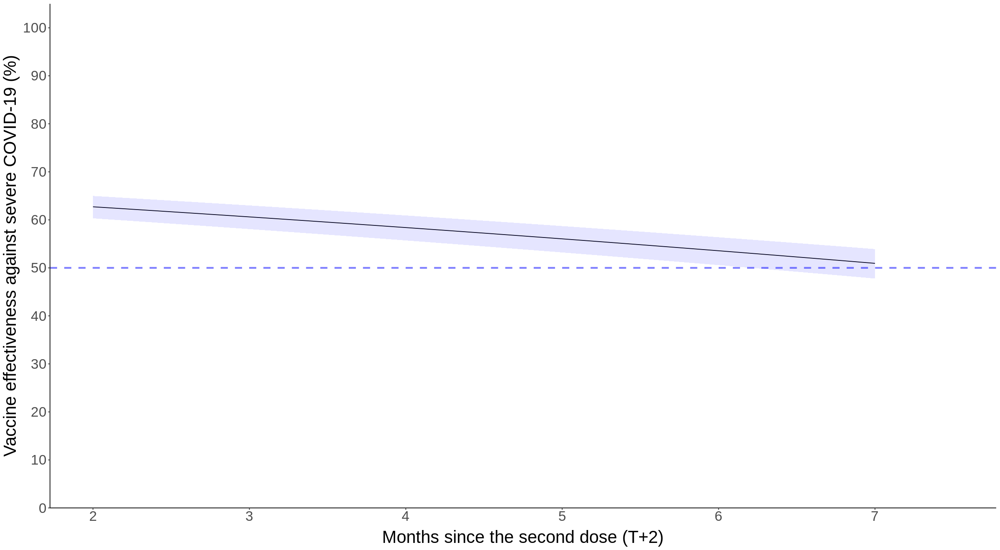

In [68]:
#Stratified by age group: 61_80
d2_s_svaz_61_80<-d2_s_svaz[agegroup=="61-80"]

model_d2_s_svaz_inter_61_80<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_s_svaz_61_80)
summary(model_d2_s_svaz_inter_61_80)

#Initial OR
exp(summary(model_d2_s_svaz_inter_61_80)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_svaz_inter_61_80)$coef["vac_typeSV-AZ",2])

#initial VE
(1-exp(summary(model_d2_s_svaz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_s_svaz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svaz_61_80 <- sqrt(vcov(model_d2_s_svaz_inter_61_80)["vac_typeSV-AZ","vac_typeSV-AZ"] + 
                        vcov(model_d2_s_svaz_inter_61_80)["vac_typeSV-AZ:month","vac_typeSV-AZ:month"]+ 
                        2*vcov(model_d2_s_svaz_inter_61_80)["vac_typeSV-AZ","vac_typeSV-AZ:month"])

exp(summary(model_d2_s_svaz_inter_61_80)$coef["vac_typeSV-AZ",1]+
      summary(model_d2_s_svaz_inter_61_80)$coef["vac_typeSV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svaz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_s_svaz_inter_61_80)$coef["vac_typeSV-AZ",1]+
         summary(model_d2_s_svaz_inter_61_80)$coef["vac_typeSV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svaz_61_80))*100

#VE overtime
ve_svaz_61_80<-NULL
for(i in 0:500){
  ve_svaz_61_80<-rbind(ve_svaz_61_80,(1-exp(summary(model_d2_s_svaz_inter_61_80)$coef["vac_typeSV-AZ",1]+
                                              summary(model_d2_s_svaz_inter_61_80)$coef["vac_typeSV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svaz_61_80))*100)
}

ve_svaz_61_80<-cbind(0:500/100,ve_svaz_61_80)

ve_svaz_61_80<-as.data.frame(ve_svaz_61_80)
names(ve_svaz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svaz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_s_svaz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.3516  -0.4192   0.0000   0.0000  29.1717  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -8.487114   0.112718 -75.295  < 2e-16 ***
vac_typeSV-AZ          -0.544872   0.059663  -9.132  < 2e-16 ***
month                  -0.057001   0.005935  -9.604  < 2e-16 ***
maleTRUE                0.598739   0.022571  26.527  < 2e-16 ***
provinceกระบี่           -1.970185   0.238259  -8.269  < 2e-16 ***
provinceกาญจนบุรี         0.077301   0.100865   0.766 0.443450    
provinceกาฬสินธุ์         -2.632419   0.220960 -11.914  < 2e-16 ***
provinceกำแพงเพชร      -0.854286   0.140422  -6.084 1.17e-09 ***
provinceขอนแก่น         -1.149591   0.076156 -15.095  < 2e-16 ***
provinceจันทบุรี          -0.472372   0.126959  -3.721 0.000199 ***
pro

[1] 0.5159164 0.5799158 0.6518542

[1] 34.81458 42.00842 48.40836

[1] 0.5617712 0.6200008 0.6842662

[1] 31.57338 37.99992 43.82288

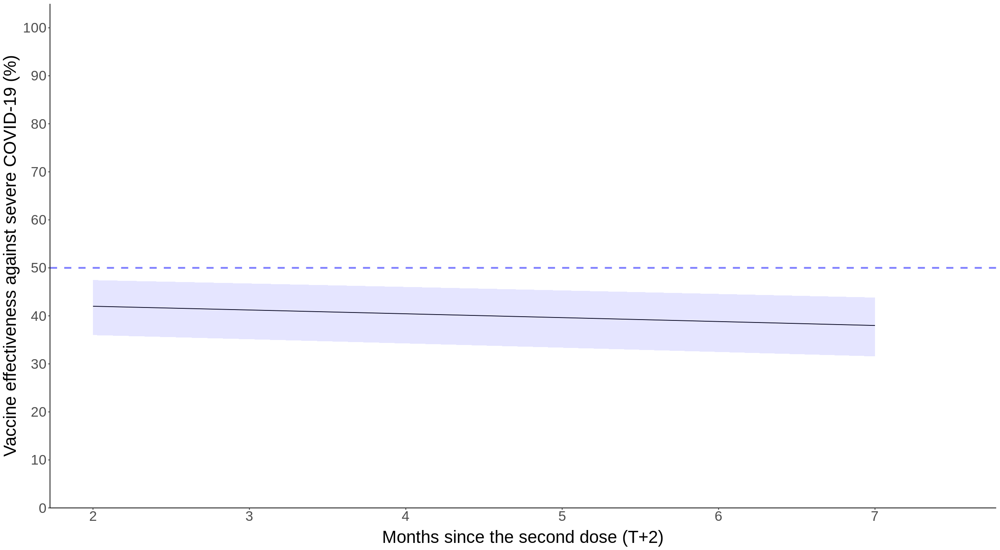

In [69]:
#Stratified by age group: 81_100
d2_s_svaz_81_100<-d2_s_svaz[agegroup=="Over 80"]

model_d2_s_svaz_inter_81_100<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_s_svaz_81_100)
summary(model_d2_s_svaz_inter_81_100)

#Initial OR
exp(summary(model_d2_s_svaz_inter_81_100)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_svaz_inter_81_100)$coef["vac_typeSV-AZ",2])

#initial VE
(1-exp(summary(model_d2_s_svaz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_s_svaz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svaz_81_100 <- sqrt(vcov(model_d2_s_svaz_inter_81_100)["vac_typeSV-AZ","vac_typeSV-AZ"] + 
                        vcov(model_d2_s_svaz_inter_81_100)["vac_typeSV-AZ:month","vac_typeSV-AZ:month"]+ 
                        2*vcov(model_d2_s_svaz_inter_81_100)["vac_typeSV-AZ","vac_typeSV-AZ:month"])

exp(summary(model_d2_s_svaz_inter_81_100)$coef["vac_typeSV-AZ",1]+
      summary(model_d2_s_svaz_inter_81_100)$coef["vac_typeSV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svaz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_s_svaz_inter_81_100)$coef["vac_typeSV-AZ",1]+
         summary(model_d2_s_svaz_inter_81_100)$coef["vac_typeSV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svaz_81_100))*100

#VE overtime
ve_svaz_81_100<-NULL
for(i in 0:500){
  ve_svaz_81_100<-rbind(ve_svaz_81_100,(1-exp(summary(model_d2_s_svaz_inter_81_100)$coef["vac_typeSV-AZ",1]+
                                              summary(model_d2_s_svaz_inter_81_100)$coef["vac_typeSV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svaz_81_100))*100)
}

ve_svaz_81_100<-cbind(0:500/100,ve_svaz_81_100)

ve_svaz_81_100<-as.data.frame(ve_svaz_81_100)
names(ve_svaz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svaz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [70]:
ve_svaz_18_40$Age<-"18-40"
ve_svaz_41_60$Age<-"41-60"
ve_svaz_61_80$Age<-"61-80"
ve_svaz_81_100$Age<-"Over 80"
ve_svaz_all<-rbind(ve_svaz_18_40,ve_svaz_41_60,ve_svaz_61_80,ve_svaz_81_100)
ve_svaz_all<-as.data.table(ve_svaz_all)

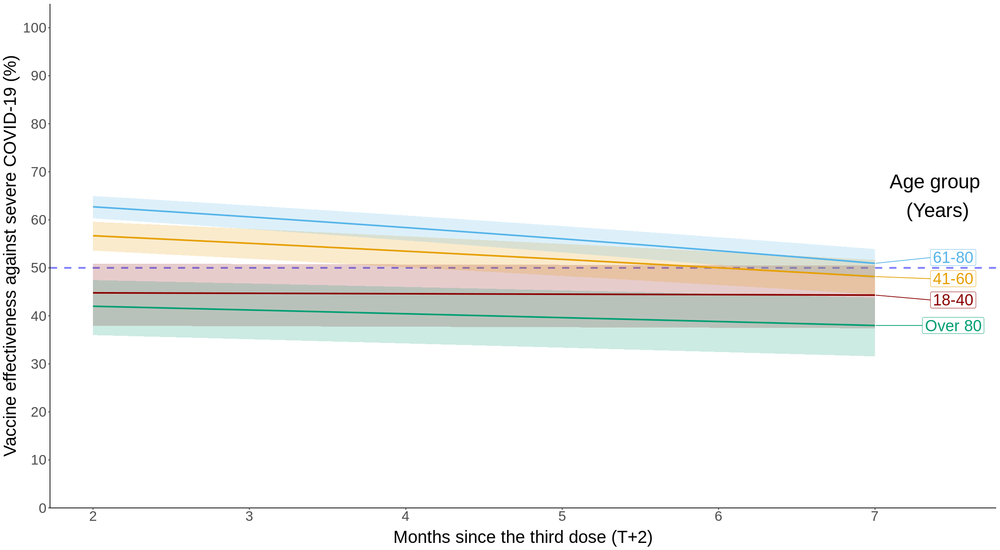

In [71]:
ggplot(ve_svaz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_svaz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_svaz_all$month)+2),limits = c(2,max(ve_svaz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
          annotate("text", x=7.4, y=65, label= "Age group \n(Years)",size=10)

**AZ-PZ sequence**

In [72]:
d2_s_azpz<-d2_s[vac_type %in% c("None","AZ-PZ")]

In [73]:
model_d2_s_azpz_inter<-glm(severe ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d2_s_azpz)

In [74]:
car::vif(model_d2_s_azpz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.467497,1,1.570827
month,4.539496,1,2.130609
male,1.004671,1,1.002333
agegroup,1.034122,3,1.005608
province,1.071265,76,1.000453
inf_date,4.603431,12,1.065684
vac_type:month,2.041606,1,1.428848


In [75]:
summary(model_d2_s_azpz_inter)


Call:
glm(formula = severe ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d2_s_azpz, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.002   -0.274    0.000    0.000   60.173  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -11.106848   0.029406 -377.707  < 2e-16 ***
vac_typeAZ-PZ          -0.793463   0.048188  -16.466  < 2e-16 ***
month                  -0.094846   0.002772  -34.216  < 2e-16 ***
maleTRUE                0.352673   0.009220   38.252  < 2e-16 ***
agegroup41-60           1.157018   0.015002   77.124  < 2e-16 ***
agegroup61-80           2.331107   0.014824  157.249  < 2e-16 ***
agegroupOver 80         3.678806   0.017844  206.169  < 2e-16 ***
provinceกระบี่           -0.890794   0.073301  -12.153  < 2e-16 ***
provinceกาญจนบุรี         0.215766   0.035524    6.074 1.25e-09 ***
provinceกาฬสินธุ์         -1.212186   0.051407  -23.580  < 2e

Initial OR

In [76]:
exp(summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ",2])

[1] 0.4115147 0.4522757 0.4970741

Initial VE

In [77]:
(1-exp(summary(model_d2_s_azpz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_s_azpz_inter)$coef[2,2]))*100

[1] 50.29259 54.77243 58.84853

In [78]:
se_azpz <- sqrt(vcov(model_d2_s_azpz_inter)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                  vcov(model_d2_s_azpz_inter)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                  2*vcov(model_d2_s_azpz_inter)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])
se_azpz

[1] 0.03843774

In [79]:
sqrt(sum(vcov(model_d2_s_azpz_inter)[c("vac_typeAZ-PZ","vac_typeAZ-PZ:month"),c("vac_typeAZ-PZ","vac_typeAZ-PZ:month")]))

[1] 0.03843774

OR at 7 months after the last dose (T=5)

In [80]:
exp(summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz)

[1] 0.5229890 0.5639113 0.6080356

Sensitivity analysis using E-Value

In [81]:
evalues.OR(exp(summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ",2])[2], 
exp(summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ",2])[1], 
exp(summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.04772429,-0.08848529,-0.002925858
E-values,0.43318287,NA,0.024252678


VE at 7 months after the last dose (T=5)

In [82]:
(1-exp(summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz))*100

[1] 39.19644 43.60887 47.70110

VE over time

In [83]:
ve_azpz<-NULL
for(i in 0:500){
  ve_azpz<-rbind(ve_azpz,(1-exp(summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ",1]+
                                  summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_azpz))*100)
}

In [84]:
ve_azpz<-cbind(0:500/100,ve_azpz)
ve_azpz<-as.data.frame(ve_azpz)
names(ve_azpz)<-c("month","lower","estimate","upper")

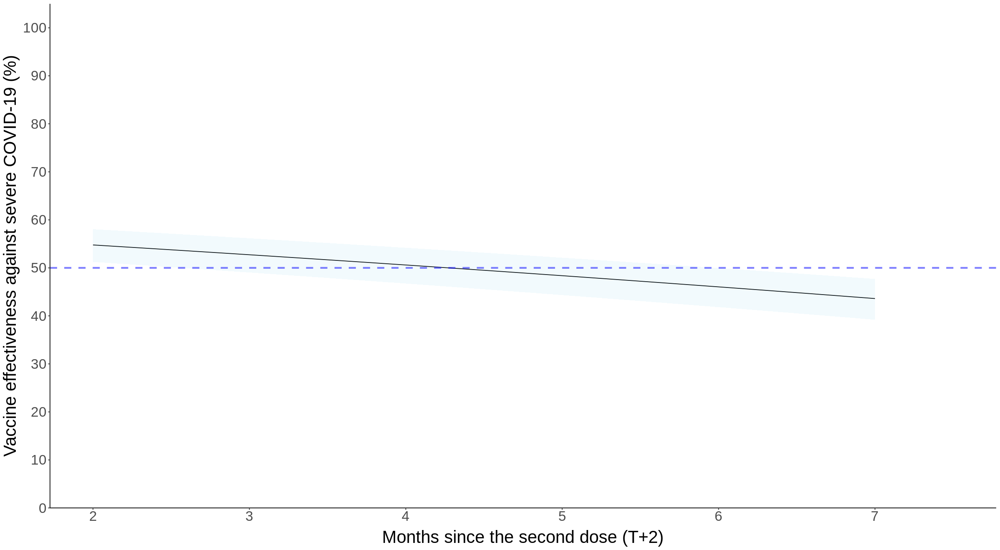

In [85]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azpz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="skyblue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [86]:
(log(0.5)-summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ",1]-qnorm(c(0.975,0.50,0.025))*se_azpz)/summary(model_d2_s_azpz_inter)$coef["vac_typeAZ-PZ:month",1]+2

[1] 2.56616 4.27366 5.98116

*Stratified by age*


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_s_azpz_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-5.5965  -0.1741   0.0000   0.0000  21.2992  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -10.821757   0.071288 -151.803  < 2e-16 ***
vac_typeAZ-PZ          -0.597797   0.152046   -3.932 8.43e-05 ***
month                  -0.065962   0.008656   -7.620 2.53e-14 ***
maleTRUE                0.020481   0.025602    0.800 0.423728    
provinceกระบี่           -0.362608   0.178913   -2.027 0.042691 *  
provinceกาญจนบุรี         0.850385   0.087589    9.709  < 2e-16 ***
provinceกาฬสินธุ์         -0.618377   0.144184   -4.289 1.80e-05 ***
provinceกำแพงเพชร      -0.219628   0.137815   -1.594 0.111016    
provinceขอนแก่น         -0.230224   0.096742   -2.380 0.017323 *  
provinceจันทบุรี           0.493195   0.116088    4.248 2.15e-

[1] 0.4082804 0.5500218 0.7409712

[1] 25.90288 44.99782 59.17196

[1] 0.7058202 0.8930007 1.1298207

[1] -12.98207  10.69993  29.41798


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_s_azpz_41_60, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-10.722   -0.286    0.000    0.000   44.952  

Coefficients:
                       Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -9.713115   0.043248 -224.593  < 2e-16 ***
vac_typeAZ-PZ         -0.876522   0.094913   -9.235  < 2e-16 ***
month                 -0.099698   0.005171  -19.279  < 2e-16 ***
maleTRUE               0.254427   0.015694   16.212  < 2e-16 ***
provinceกระบี่          -1.045545   0.144335   -7.244 4.36e-13 ***
provinceกาญจนบุรี        0.346565   0.060725    5.707 1.15e-08 ***
provinceกาฬสินธุ์        -0.798492   0.079232  -10.078  < 2e-16 ***
provinceกำแพงเพชร     -0.298723   0.077743   -3.842 0.000122 ***
provinceขอนแก่น        -0.685922   0.060258  -11.383  < 2e-16 ***
provinceจันทบุรี          0.057707   0.076410    0.755 0.450116    
prov

[1] 0.3455746 0.4162282 0.5013271

[1] 49.86729 58.37718 65.44254

[1] 0.3762521 0.4351738 0.5033227

[1] 49.66773 56.48262 62.37479

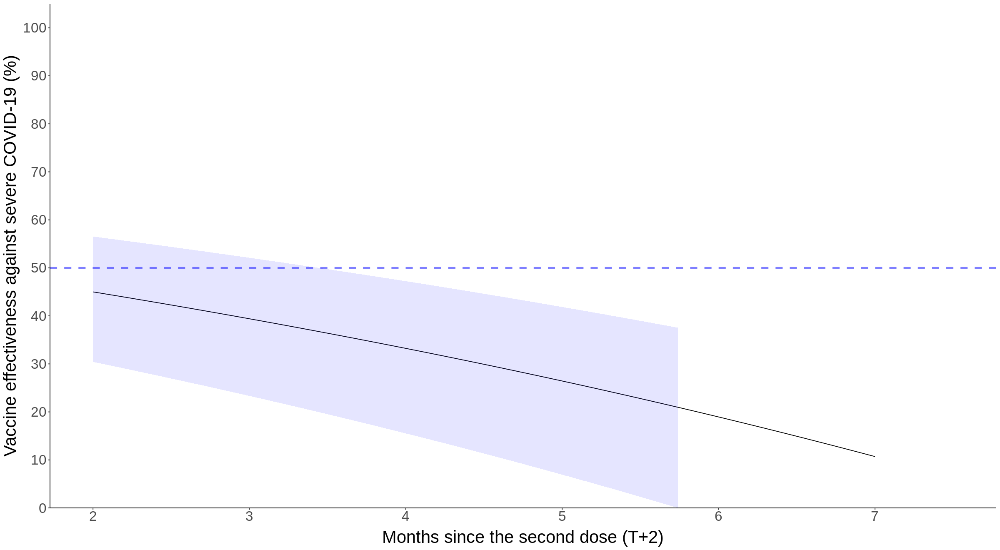


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_s_azpz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.252   -0.399    0.000    0.000   60.031  

Coefficients:
                       Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -9.078032   0.047129 -192.622  < 2e-16 ***
vac_typeAZ-PZ         -0.909162   0.070433  -12.908  < 2e-16 ***
month                 -0.120336   0.004289  -28.055  < 2e-16 ***
maleTRUE               0.481029   0.014827   32.442  < 2e-16 ***
provinceกระบี่          -0.685898   0.106472   -6.442 1.18e-10 ***
provinceกาญจนบุรี       -0.031500   0.059622   -0.528 0.597272    
provinceกาฬสินธุ์        -1.466900   0.082741  -17.729  < 2e-16 ***
provinceกำแพงเพชร     -0.860144   0.084782  -10.145  < 2e-16 ***
provinceขอนแก่น        -0.938446   0.046844  -20.033  < 2e-16 ***
provinceจันทบุรี         -0.674670   0.088168   -7.652 1.98e-14 ***
prov

[1] 0.3509161 0.4028617 0.4624967

[1] 53.75033 59.71383 64.90839

[1] 0.4839836 0.5412039 0.6051893

[1] 39.48107 45.87961 51.60164

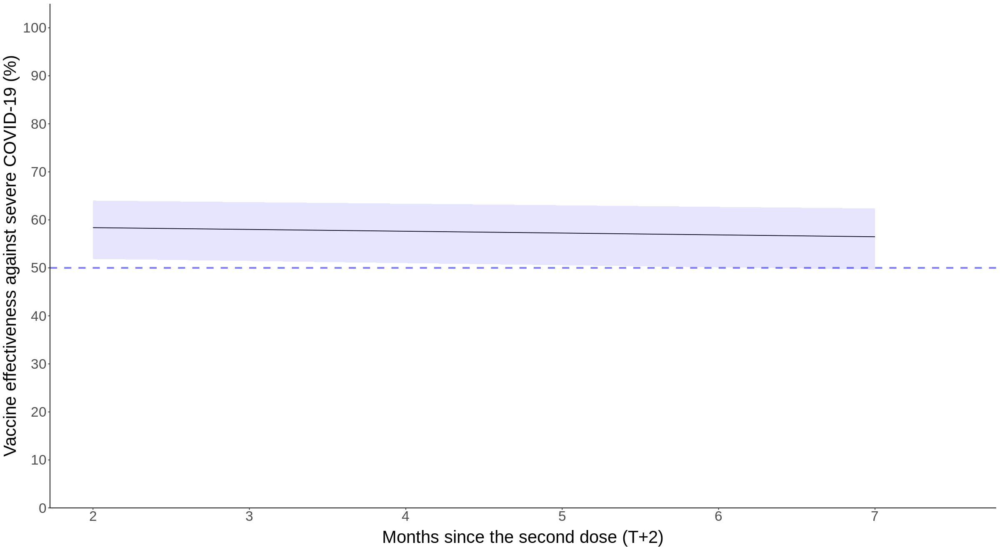


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_s_azpz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.0558  -0.2383   0.0000   0.0000  29.2627  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -8.497849   0.113000 -75.202  < 2e-16 ***
vac_typeAZ-PZ          -0.582916   0.116298  -5.012 5.38e-07 ***
month                  -0.059160   0.006164  -9.597  < 2e-16 ***
maleTRUE                0.569120   0.024664  23.075  < 2e-16 ***
provinceกระบี่           -1.560055   0.238178  -6.550 5.76e-11 ***
provinceกาญจนบุรี         0.085227   0.112038   0.761 0.446840    
provinceกาฬสินธุ์         -2.475338   0.244968 -10.105  < 2e-16 ***
provinceกำแพงเพชร      -1.053987   0.177520  -5.937 2.90e-09 ***
provinceขอนแก่น         -1.162567   0.086117 -13.500  < 2e-16 ***
provinceจันทบุรี          -0.374140   0.139241  -2.687 0.007210 ** 
pro

[1] 0.4444774 0.5582682 0.7011907

[1] 29.88093 44.17318 55.55226

[1] 0.3124815 0.3742728 0.4482830

[1] 55.17170 62.57272 68.75185

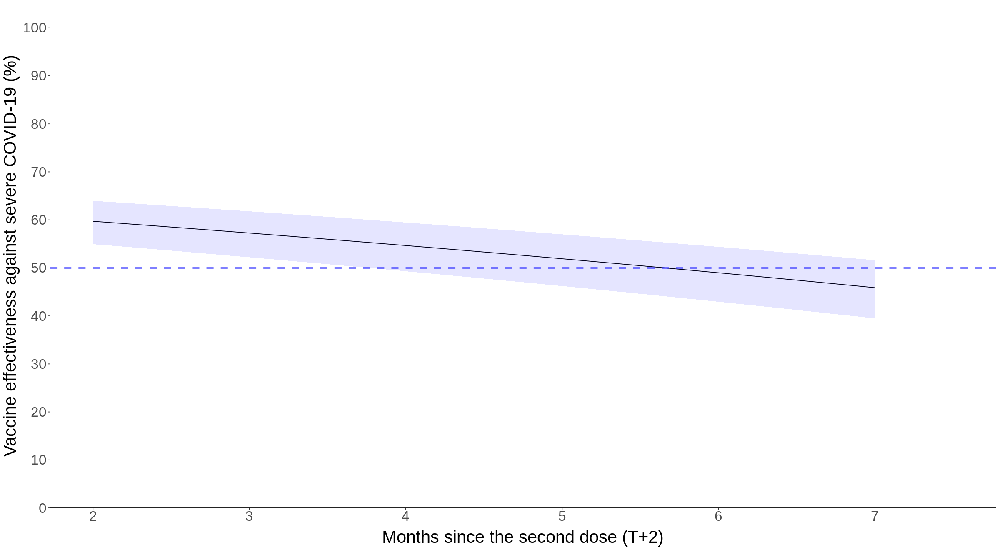

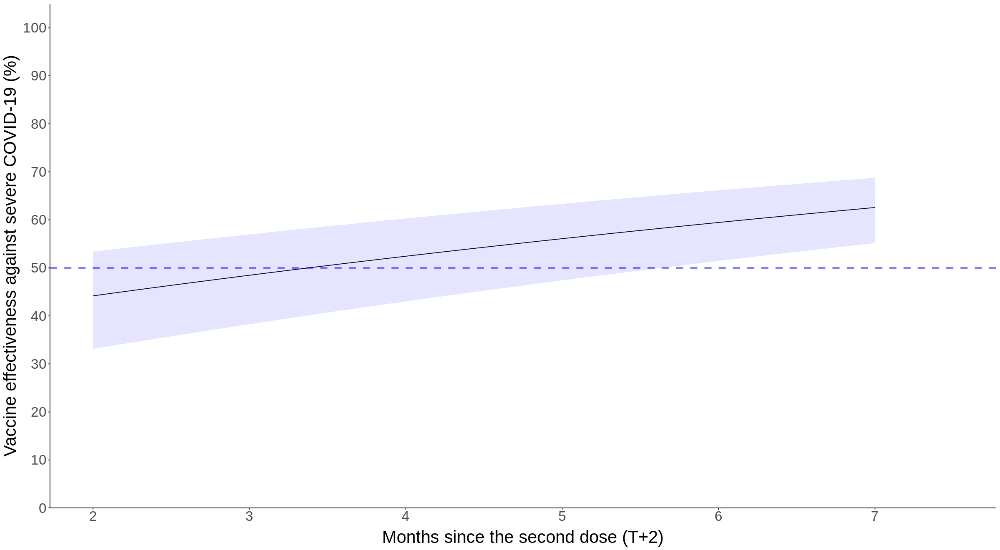

In [87]:
#Stratified by age group: 18-40
d2_s_azpz_18_40<-d2_s_azpz[agegroup=="18-40"]

model_d2_s_azpz_inter_18_40<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_s_azpz_18_40)
summary(model_d2_s_azpz_inter_18_40)

#Initial OR
exp(summary(model_d2_s_azpz_inter_18_40)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_azpz_inter_18_40)$coef["vac_typeAZ-PZ",2])

#Initial VE
(1-exp(summary(model_d2_s_azpz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_s_azpz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azpz_18_40 <- sqrt(vcov(model_d2_s_azpz_inter_18_40)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                        vcov(model_d2_s_azpz_inter_18_40)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                        2*vcov(model_d2_s_azpz_inter_18_40)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])

exp(summary(model_d2_s_azpz_inter_18_40)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_s_azpz_inter_18_40)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_s_azpz_inter_18_40)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_s_azpz_inter_18_40)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz_18_40))*100

#VE overtime
ve_azpz_18_40<-NULL
for(i in 0:500){
  ve_azpz_18_40<-rbind(ve_azpz_18_40,(1-exp(summary(model_d2_s_azpz_inter_18_40)$coef["vac_typeAZ-PZ",1]+
                                              summary(model_d2_s_azpz_inter_18_40)$coef["vac_typeAZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azpz_18_40))*100)
}

ve_azpz_18_40<-cbind(0:500/100,ve_azpz_18_40)

ve_azpz_18_40<-as.data.frame(ve_azpz_18_40)
names(ve_azpz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azpz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d2_s_azpz_41_60<-d2_s_azpz[agegroup=="41-60"]

model_d2_s_azpz_inter_41_60<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_s_azpz_41_60)
summary(model_d2_s_azpz_inter_41_60)

#Initial OR
exp(summary(model_d2_s_azpz_inter_41_60)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_azpz_inter_41_60)$coef["vac_typeAZ-PZ",2])

#initial VE
(1-exp(summary(model_d2_s_azpz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_s_azpz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azpz_41_60 <- sqrt(vcov(model_d2_s_azpz_inter_41_60)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                        vcov(model_d2_s_azpz_inter_41_60)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                        2*vcov(model_d2_s_azpz_inter_41_60)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])

exp(summary(model_d2_s_azpz_inter_41_60)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_s_azpz_inter_41_60)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_s_azpz_inter_41_60)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_s_azpz_inter_41_60)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz_41_60))*100

#VE overtime
ve_azpz_41_60<-NULL
for(i in 0:500){
  ve_azpz_41_60<-rbind(ve_azpz_41_60,(1-exp(summary(model_d2_s_azpz_inter_41_60)$coef["vac_typeAZ-PZ",1]+
                                              summary(model_d2_s_azpz_inter_41_60)$coef["vac_typeAZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azpz_41_60))*100)
}

ve_azpz_41_60<-cbind(0:500/100,ve_azpz_41_60)

ve_azpz_41_60<-as.data.frame(ve_azpz_41_60)
names(ve_azpz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azpz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d2_s_azpz_61_80<-d2_s_azpz[agegroup=="61-80"]

model_d2_s_azpz_inter_61_80<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_s_azpz_61_80)
summary(model_d2_s_azpz_inter_61_80)

#Initial OR
exp(summary(model_d2_s_azpz_inter_61_80)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_azpz_inter_61_80)$coef["vac_typeAZ-PZ",2])

#initial VE
(1-exp(summary(model_d2_s_azpz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_s_azpz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azpz_61_80 <- sqrt(vcov(model_d2_s_azpz_inter_61_80)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                        vcov(model_d2_s_azpz_inter_61_80)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                        2*vcov(model_d2_s_azpz_inter_61_80)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])

exp(summary(model_d2_s_azpz_inter_61_80)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_s_azpz_inter_61_80)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_s_azpz_inter_61_80)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_s_azpz_inter_61_80)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz_61_80))*100

#VE overtime
ve_azpz_61_80<-NULL
for(i in 0:500){
  ve_azpz_61_80<-rbind(ve_azpz_61_80,(1-exp(summary(model_d2_s_azpz_inter_61_80)$coef["vac_typeAZ-PZ",1]+
                                              summary(model_d2_s_azpz_inter_61_80)$coef["vac_typeAZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azpz_61_80))*100)
}

ve_azpz_61_80<-cbind(0:500/100,ve_azpz_61_80)

ve_azpz_61_80<-as.data.frame(ve_azpz_61_80)
names(ve_azpz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azpz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d2_s_azpz_81_100<-d2_s_azpz[agegroup=="Over 80"]

model_d2_s_azpz_inter_81_100<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_s_azpz_81_100)
summary(model_d2_s_azpz_inter_81_100)

#Initial OR
exp(summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",2])

#initial VE
(1-exp(summary(model_d2_s_azpz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_s_azpz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azpz_81_100 <- sqrt(vcov(model_d2_s_azpz_inter_81_100)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                        vcov(model_d2_s_azpz_inter_81_100)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                        2*vcov(model_d2_s_azpz_inter_81_100)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])

exp(summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz_81_100))*100

#VE overtime
ve_azpz_81_100<-NULL
for(i in 0:500){
  ve_azpz_81_100<-rbind(ve_azpz_81_100,(1-exp(summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+
                                              summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azpz_81_100))*100)
}

ve_azpz_81_100<-cbind(0:500/100,ve_azpz_81_100)

ve_azpz_81_100<-as.data.frame(ve_azpz_81_100)
names(ve_azpz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azpz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [88]:
summary(model_d2_s_azpz_inter_81_100)

#Initial OR
exp(summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",2])

#initial VE
(1-exp(summary(model_d2_s_azpz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_s_azpz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azpz_81_100 <- sqrt(vcov(model_d2_s_azpz_inter_81_100)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                        vcov(model_d2_s_azpz_inter_81_100)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                        2*vcov(model_d2_s_azpz_inter_81_100)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])

exp(summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz_81_100))*100


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_s_azpz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.0558  -0.2383   0.0000   0.0000  29.2627  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -8.497849   0.113000 -75.202  < 2e-16 ***
vac_typeAZ-PZ          -0.582916   0.116298  -5.012 5.38e-07 ***
month                  -0.059160   0.006164  -9.597  < 2e-16 ***
maleTRUE                0.569120   0.024664  23.075  < 2e-16 ***
provinceกระบี่           -1.560055   0.238178  -6.550 5.76e-11 ***
provinceกาญจนบุรี         0.085227   0.112038   0.761 0.446840    
provinceกาฬสินธุ์         -2.475338   0.244968 -10.105  < 2e-16 ***
provinceกำแพงเพชร      -1.053987   0.177520  -5.937 2.90e-09 ***
provinceขอนแก่น         -1.162567   0.086117 -13.500  < 2e-16 ***
provinceจันทบุรี          -0.374140   0.139241  -2.687 0.007210 ** 
pro

[1] 0.4444774 0.5582682 0.7011907

[1] 29.88093 44.17318 55.55226

[1] 0.3124815 0.3742728 0.4482830

[1] 55.17170 62.57272 68.75185

In [89]:
summary(model_d2_s_azpz_inter_81_100)

#Initial OR
exp(summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",2])

#initial VE
(1-exp(summary(model_d2_s_azpz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_s_azpz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azpz_81_100 <- sqrt(vcov(model_d2_s_azpz_inter_81_100)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                        vcov(model_d2_s_azpz_inter_81_100)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                        2*vcov(model_d2_s_azpz_inter_81_100)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])

exp(summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_s_azpz_inter_81_100)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz_81_100))*100


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_s_azpz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.0558  -0.2383   0.0000   0.0000  29.2627  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -8.497849   0.113000 -75.202  < 2e-16 ***
vac_typeAZ-PZ          -0.582916   0.116298  -5.012 5.38e-07 ***
month                  -0.059160   0.006164  -9.597  < 2e-16 ***
maleTRUE                0.569120   0.024664  23.075  < 2e-16 ***
provinceกระบี่           -1.560055   0.238178  -6.550 5.76e-11 ***
provinceกาญจนบุรี         0.085227   0.112038   0.761 0.446840    
provinceกาฬสินธุ์         -2.475338   0.244968 -10.105  < 2e-16 ***
provinceกำแพงเพชร      -1.053987   0.177520  -5.937 2.90e-09 ***
provinceขอนแก่น         -1.162567   0.086117 -13.500  < 2e-16 ***
provinceจันทบุรี          -0.374140   0.139241  -2.687 0.007210 ** 
pro

[1] 0.4444774 0.5582682 0.7011907

[1] 29.88093 44.17318 55.55226

[1] 0.3124815 0.3742728 0.4482830

[1] 55.17170 62.57272 68.75185

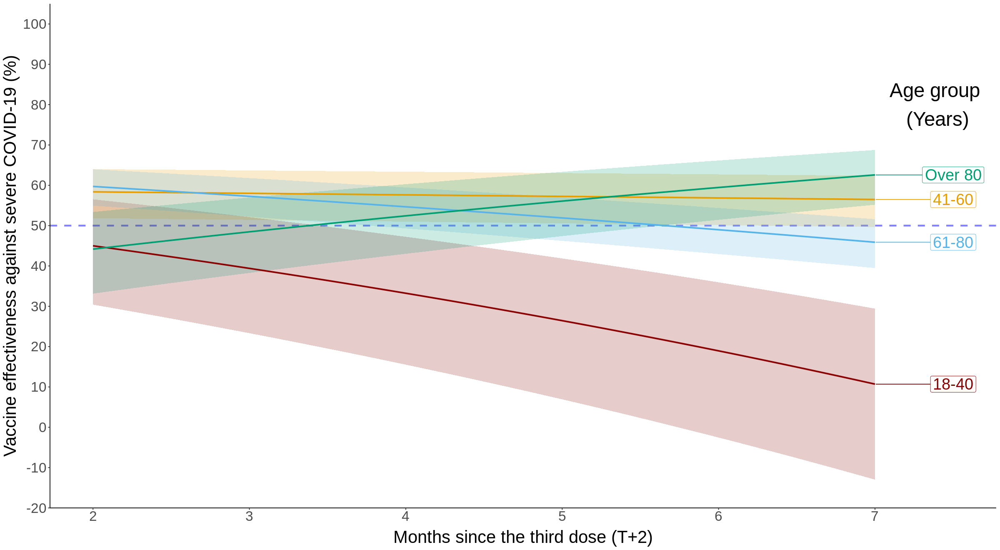

In [90]:
ve_azpz_18_40$Age<-"18-40"
ve_azpz_41_60$Age<-"41-60"
ve_azpz_61_80$Age<-"61-80"
ve_azpz_81_100$Age<-"Over 80"
ve_azpz_all<-rbind(ve_azpz_18_40,ve_azpz_41_60,ve_azpz_61_80,ve_azpz_81_100)
ve_azpz_all<-as.data.table(ve_azpz_all)

ggplot(ve_azpz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_azpz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_azpz_all$month)+2),limits = c(2,max(ve_azpz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-20,105),breaks=c(2:1*-10,0:10*10),name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
          annotate("text", x=7.4, y=80, label= "Age group \n(Years)",size=10)

**Summarize for 2 dose vaccine effectiveness**

In [91]:
ve_svaz$Vaccination<-"SV-AZ"
ve_azpz$Vaccination<-"AZ-PZ"
d2_sm<-rbind(ve_svaz,ve_azpz)

d2_sm$Vaccination<-factor(d2_sm$Vaccination,levels=c("SV-AZ","AZ-PZ"))

d2_sm<-as.data.table(d2_sm)

d2_sm<-d2_sm[month<=5]

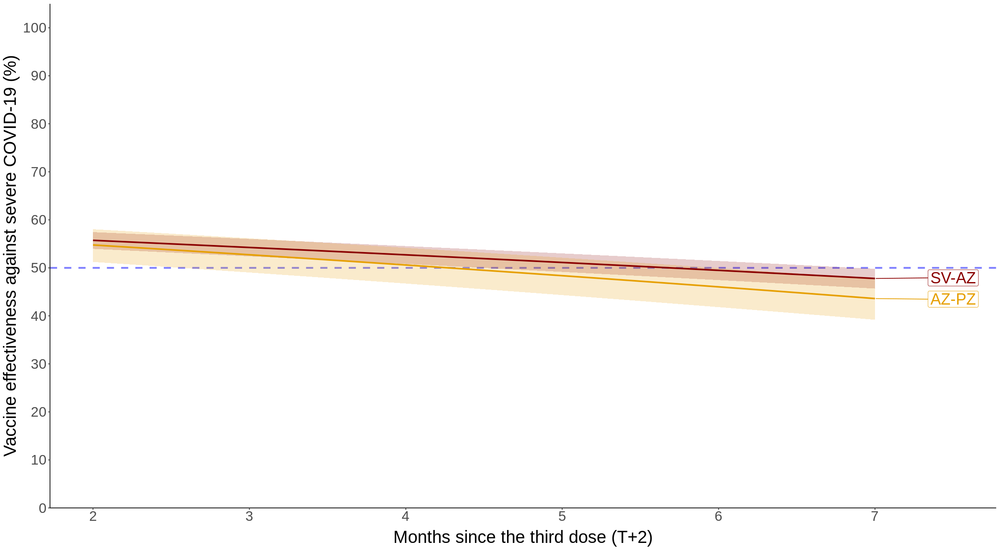

In [92]:
ggplot(d2_sm)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Vaccination,fill=Vaccination),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Vaccination),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(d2_sm[order(-month)],by=c("Vaccination")),
                   aes(label = Vaccination,x=month+2,y=estimate,col=Vaccination),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(d2_sm$month)+2),limits = c(2,max(d2_sm$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

# **Regression model for 3-dose vaccination against severe COVID-19**

In [93]:
d3_severe<-stratum[inf_type=="Severe" & dose == 3]
d3_severe<-d3_severe[,c("province", "agegroup", "gender", "vac_type", "inf_type", "vac_date", "inf_date","month","a","b","c","d")]
d3_severe$male<-d3_severe$gender=="ชาย"

d3_severe_a<-d3_severe[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","a", "inf_date")]
names(d3_severe_a)[7]<-"Freq"
d3_severe_a$severe<-TRUE

d3_severe_b<-d3_severe[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","b", "inf_date")]
names(d3_severe_b)[7]<-"Freq"
d3_severe_b$vac_type<-"None"
d3_severe_b<-unique(d3_severe_b,by=c("province", "agegroup", "male", "vac_date", "month", "inf_date"))
d3_severe_b$severe<-TRUE

d3_severe_c<-d3_severe[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","c", "inf_date")]
names(d3_severe_c)[7]<-"Freq"
d3_severe_c$severe<-FALSE

d3_severe_d<-d3_severe[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","d", "inf_date")]
names(d3_severe_d)[7]<-"Freq"
d3_severe_d$vac_type<-"None"
d3_severe_d<-unique(d3_severe_d,by=c("province", "agegroup", "male", "vac_date", "month", "inf_date"))
d3_severe_d$severe<-FALSE

d3_s<-rbind(d3_severe_a,d3_severe_b,d3_severe_c,d3_severe_d)

In [94]:
d3_s$agegroup<-factor(d3_s$agegroup,levels = c("18-40","41-60","61-80","Over 80"))
d3_s$vac_type<-factor(d3_s$vac_type,levels=c("None","SV-AZ-AZ","SV-AZ-PZ","SP-SP-PZ","AZ-AZ-PZ","AZ-AZ-MN","SV-SV-AZ"))
d3_s$vac_date<-factor(d3_s$vac_date,levels = c("2021-05","2021-06","2021-07","2021-08","2021-09",
                                               "2021-10","2021-11","2021-12","2022-01","2022-02",
                                               "2022-03","2022-04","2022-05"))
namep<-unique(d3_s[province !="กรุงเทพมหานคร"]$province)
d3_s$province<-factor(d3_s$province,levels = c("กรุงเทพมหานคร",namep))

**Full model for 3-dose against severe COVID-19**

In [95]:
full_d3_s<-glm(severe ~ vac_type*agegroup*month+male+province+inf_date, binomial, weight=Freq, data=d3_s)

In [96]:
summary(full_d3_s)


Call:
glm(formula = severe ~ vac_type * agegroup * month + male + province + 
    inf_date, family = binomial, data = d3_s, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-12.47    0.00    0.00    0.00   60.48  

Coefficients:
                                         Estimate Std. Error  z value Pr(>|z|)
(Intercept)                            -10.870704   0.032544 -334.028  < 2e-16
vac_typeSV-AZ-AZ                        -1.819116   0.245355   -7.414 1.22e-13
vac_typeSV-AZ-PZ                        -1.967578   0.181620  -10.833  < 2e-16
vac_typeSP-SP-PZ                        -1.952151   0.171467  -11.385  < 2e-16
vac_typeAZ-AZ-PZ                        -2.371255   0.161391  -14.693  < 2e-16
vac_typeAZ-AZ-MN                        -3.423174   0.485153   -7.056 1.72e-12
vac_typeSV-SV-AZ                        -1.925800   0.149789  -12.857  < 2e-16
agegroup41-60                            1.114493   0.024287   45.889  < 2e-16
agegroup61-80                

In [97]:
model1<-glm(severe ~ vac_type*agegroup+male+province+inf_date, binomial, weight=Freq, data=d3_s)
model2<-glm(severe ~ agegroup*month+male+province+inf_date, binomial, weight=Freq, data=d3_s)
model3<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s)
lrtest(model1,full_d3_s)
lrtest(model2,full_d3_s)
lrtest(model3,full_d3_s)

Likelihood ratio test for MLE method 
Chi-squared 28 d.f. =  2511.179 , P value =  0 


Likelihood ratio test for MLE method 
Chi-squared 48 d.f. =  5160.63 , P value =  0 


Likelihood ratio test for MLE method 
Chi-squared 42 d.f. =  55218.86 , P value =  0 


In [98]:
rm(model1,model2,model3)

**SV-SV-AZ**

In [99]:
d3_s_svsvaz<-d3_s[vac_type %in% c("None","SV-SV-AZ")]

In [100]:
model_d3_s_svsvaz_inter<-glm(severe ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d3_s_svsvaz)

In [101]:
summary(model_d3_s_svsvaz_inter)


Call:
glm(formula = severe ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d3_s_svsvaz, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-13.02   -0.21    0.00    0.00   60.16  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -11.098074   0.029384 -377.691  < 2e-16 ***
vac_typeSV-SV-AZ        -1.671853   0.067007  -24.951  < 2e-16 ***
month                   -0.093249   0.002783  -33.508  < 2e-16 ***
maleTRUE                 0.355296   0.009262   38.362  < 2e-16 ***
agegroup41-60            1.156259   0.014966   77.257  < 2e-16 ***
agegroup61-80            2.321839   0.014866  156.184  < 2e-16 ***
agegroupOver 80          3.678006   0.017932  205.108  < 2e-16 ***
provinceกระบี่            -0.927382   0.074400  -12.465  < 2e-16 ***
provinceกาญจนบุรี          0.205957   0.035542    5.795 6.84e-09 ***
provinceกาฬสินธุ์          -1.212794   0.051853  -23.389  <

In [102]:
car::vif(model_d3_s_svsvaz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.926398,1,1.710672
month,4.511539,1,2.124038
male,1.004612,1,1.002303
agegroup,1.042020,3,1.006884
province,1.135869,76,1.000838
inf_date,4.557600,12,1.065240
vac_type:month,2.666191,1,1.632848


Initial OR

In [103]:
exp(summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ",2])

[1] 0.1647735 0.1878986 0.2142692

Initial VE

In [104]:
(1-exp(summary(model_d3_s_svsvaz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svsvaz_inter)$coef[2,2]))*100

[1] 78.57308 81.21014 83.52265

In [105]:
se_svsvaz <- sqrt(vcov(model_d3_s_svsvaz_inter)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ"] + 
                  vcov(model_d3_s_svsvaz_inter)["vac_typeSV-SV-AZ:month","vac_typeSV-SV-AZ:month"]+ 
                  2*vcov(model_d3_s_svsvaz_inter)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"])
se_svsvaz

[1] 0.05372836

In [106]:
sqrt(sum(vcov(model_d3_s_svsvaz_inter)[c("vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"),c("vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month")]))

[1] 0.05372836

OR at 7 months after the last dose (T=5)

In [107]:
exp(summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+
      summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svsvaz)

[1] 0.1595744 0.1772951 0.1969838

Sensitivity analsysis using E-value

In [108]:
evalues.OR(exp(summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ",2])[2], 
exp(summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ",2])[1], 
exp(summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.3121014,-0.3352265,-0.2857308
E-values,6.7038310,NA,5.3897312


VE at 7 months after the last dose (T=5)

In [109]:
(1-exp(summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+
         summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svsvaz))*100

[1] 80.30162 82.27049 84.04256

VE over time in a year

In [110]:
ve_svsvaz<-NULL
for(i in 0:500){
  ve_svsvaz<-rbind(ve_svsvaz,(1-exp(summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+
                                  summary(model_d3_s_svsvaz_inter)$coef["vac_typeSV-SV-AZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_svsvaz))*100)
}

In [111]:
ve_svsvaz<-cbind(0:500/100,ve_svsvaz)

In [112]:
ve_svsvaz<-as.data.frame(ve_svsvaz)
names(ve_svsvaz)<-c("month","lower","estimate","upper")

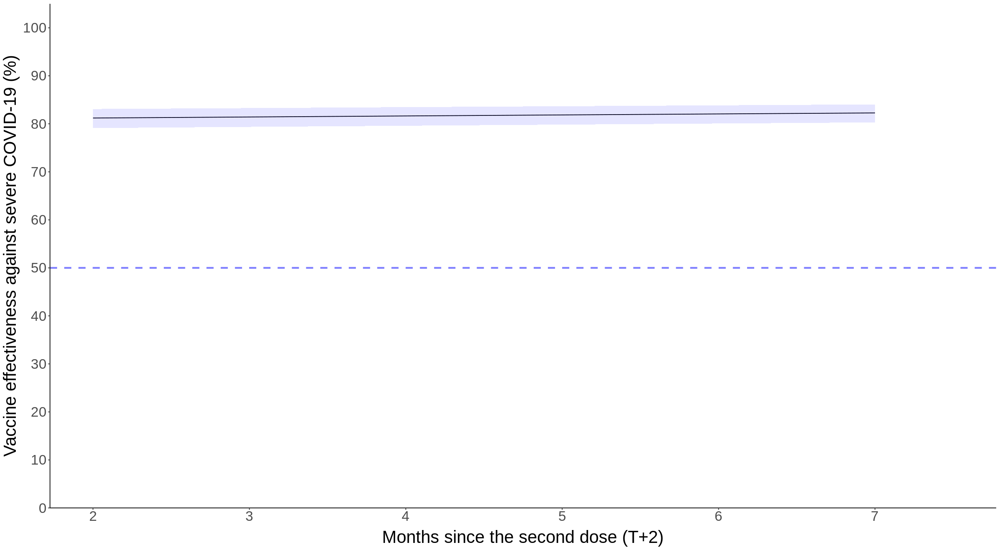

In [113]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svsvaz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

*Stratified by age group*


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svsvaz_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-5.6209  -0.1687   0.0000   0.0000  21.2761  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -10.813049   0.070744 -152.848  < 2e-16 ***
vac_typeSV-SV-AZ        -1.195347   0.157235   -7.602 2.91e-14 ***
month                   -0.067471   0.008613   -7.833 4.75e-15 ***
maleTRUE                 0.035157   0.025570    1.375 0.169155    
provinceกระบี่            -0.425263   0.181138   -2.348 0.018888 *  
provinceกาญจนบุรี          0.832664   0.087106    9.559  < 2e-16 ***
provinceกาฬสินธุ์          -0.615098   0.143897   -4.275 1.92e-05 ***
provinceกำแพงเพชร       -0.219270   0.137518   -1.594 0.110828    
provinceขอนแก่น          -0.238584   0.096311   -2.477 0.013241 *  
provinceจันทบุรี            0.443658   0.117834   

[1] 0.2223459 0.3025990 0.4118186

[1] 58.81814 69.74010 77.76541

[1] 0.2951738 0.3787454 0.4859782

[1] 51.40218 62.12546 70.48262


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svsvaz_41_60, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-10.80   -0.28    0.00    0.00   44.92  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.710539   0.042894 -226.384  < 2e-16 ***
vac_typeSV-SV-AZ       -1.638957   0.087722  -18.684  < 2e-16 ***
month                  -0.097150   0.005146  -18.877  < 2e-16 ***
maleTRUE                0.265298   0.015612   16.993  < 2e-16 ***
provinceกระบี่           -1.068298   0.144206   -7.408 1.28e-13 ***
provinceกาญจนบุรี         0.332925   0.060442    5.508 3.63e-08 ***
provinceกาฬสินธุ์         -0.795453   0.079393  -10.019  < 2e-16 ***
provinceกำแพงเพชร      -0.276401   0.077180   -3.581 0.000342 ***
provinceขอนแก่น         -0.707721   0.060508  -11.696  < 2e-16 ***
provinceจันทบุรี           0.053748   0.076344    0.704 0.481418    
p

[1] 0.1635087 0.1941824 0.2306104

[1] 76.93896 80.58176 83.64913

[1] 0.1697754 0.1954221 0.2249429

[1] 77.50571 80.45779 83.02246

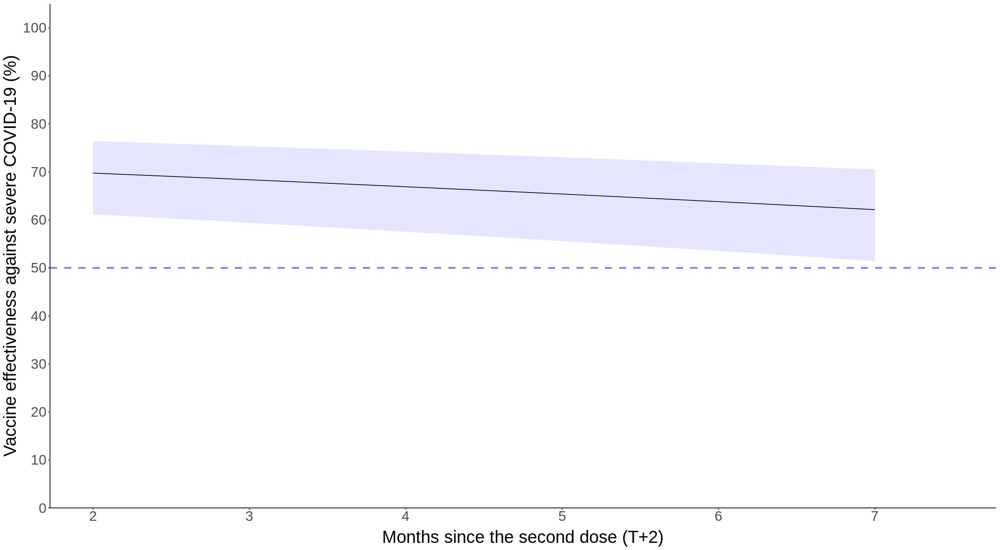


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svsvaz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.287   -0.211    0.000    0.000   60.012  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.066551   0.047187 -192.139  < 2e-16 ***
vac_typeSV-SV-AZ       -1.978119   0.193178  -10.240  < 2e-16 ***
month                  -0.119001   0.004335  -27.450  < 2e-16 ***
maleTRUE                0.473569   0.015018   31.534  < 2e-16 ***
provinceกระบี่           -0.734565   0.109394   -6.715 1.88e-11 ***
provinceกาญจนบุรี        -0.044348   0.059909   -0.740  0.45915    
provinceกาฬสินธุ์         -1.487368   0.084295  -17.645  < 2e-16 ***
provinceกำแพงเพชร      -0.936043   0.089137  -10.501  < 2e-16 ***
provinceขอนแก่น         -0.956211   0.047393  -20.176  < 2e-16 ***
provinceจันทบุรี          -0.659836   0.088204   -7.481 7.39

[1] 0.09472846 0.13832922 0.20199816

[1] 79.80018 86.16708 90.52715

[1] 0.04927380 0.06595471 0.08828269

[1] 91.17173 93.40453 95.07262

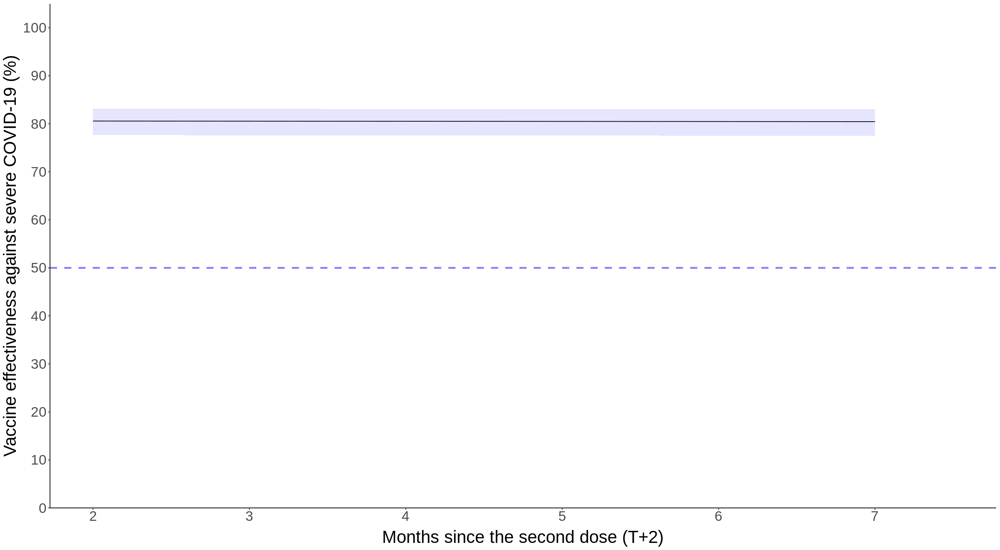


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svsvaz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.1169  -0.1464   0.0000   0.0000  29.2147  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.492054   0.112989 -75.158  < 2e-16 ***
vac_typeSV-SV-AZ        -1.082778   0.310634  -3.486 0.000491 ***
month                   -0.060474   0.006182  -9.782  < 2e-16 ***
maleTRUE                 0.586608   0.024940  23.521  < 2e-16 ***
provinceกระบี่            -1.552540   0.238166  -6.519 7.09e-11 ***
provinceกาญจนบุรี          0.069378   0.112008   0.619 0.535648    
provinceกาฬสินธุ์          -2.473702   0.244958 -10.098  < 2e-16 ***
provinceกำแพงเพชร       -1.034473   0.177499  -5.828 5.61e-09 ***
provinceขอนแก่น          -1.210250   0.087710 -13.798  < 2e-16 ***
provinceจันทบุรี           -0.378346   0.139225  -2.718 0.0

[1] 0.1842227 0.3386533 0.6225406

[1] 37.74594 66.13467 81.57773

[1] 0.3284811 0.5321770 0.8621878

[1] 13.78122 46.78230 67.15189

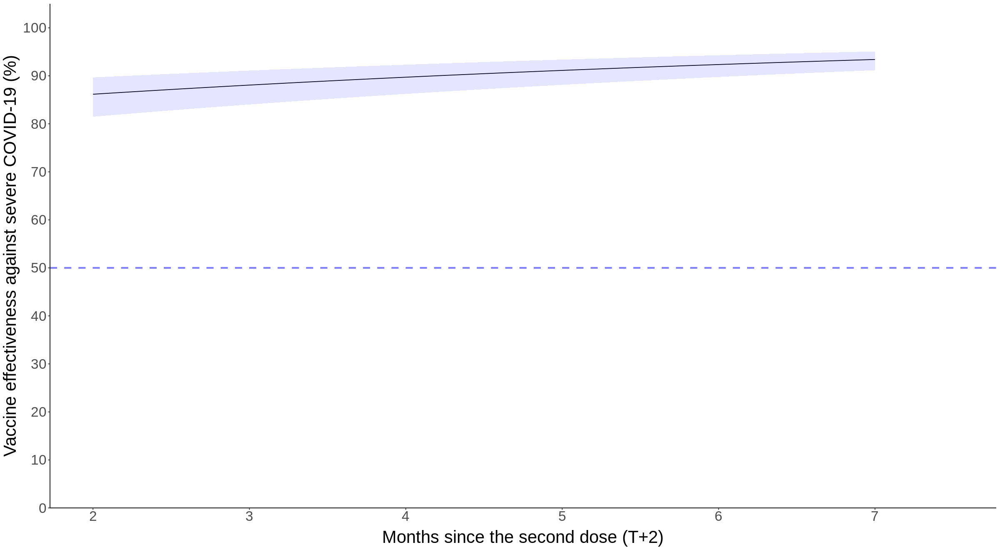

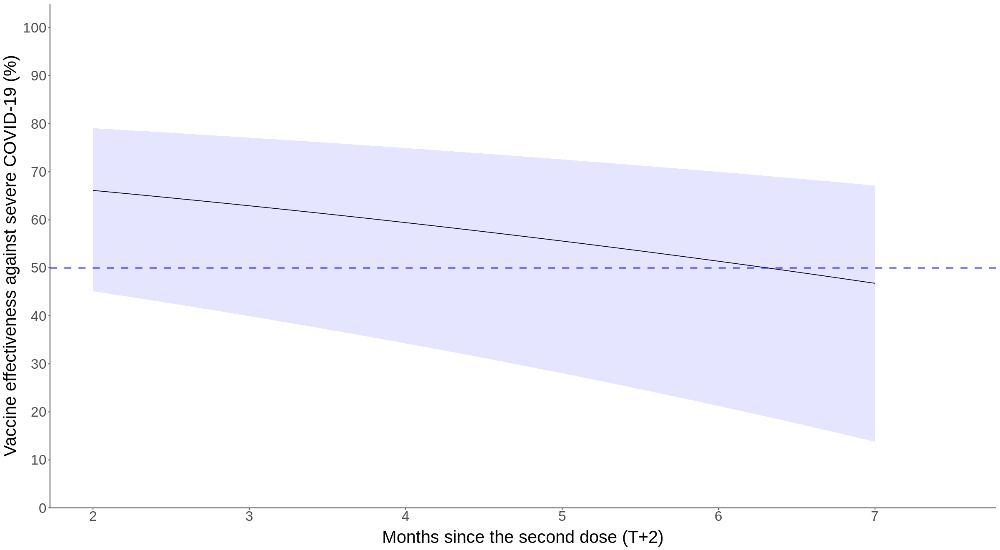

In [114]:
#Stratified by age group: 18-40
d3_s_svsvaz_18_40<-d3_s_svsvaz[agegroup=="18-40"]

model_d3_s_svsvaz_inter_18_40<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_svsvaz_18_40)
summary(model_d3_s_svsvaz_inter_18_40)

#Initial OR
exp(summary(model_d3_s_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ",2])

#Initial VE
(1-exp(summary(model_d3_s_svsvaz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svsvaz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svsvaz_18_40 <- sqrt(vcov(model_d3_s_svsvaz_inter_18_40)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ"] + 
                        vcov(model_d3_s_svsvaz_inter_18_40)["vac_typeSV-SV-AZ:month","vac_typeSV-SV-AZ:month"]+ 
                        2*vcov(model_d3_s_svsvaz_inter_18_40)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"])

exp(summary(model_d3_s_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ",1]+
      summary(model_d3_s_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svsvaz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ",1]+
         summary(model_d3_s_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svsvaz_18_40))*100

#VE overtime
ve_svsvaz_18_40<-NULL
for(i in 0:500){
  ve_svsvaz_18_40<-rbind(ve_svsvaz_18_40,(1-exp(summary(model_d3_s_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ",1]+
                                              summary(model_d3_s_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svsvaz_18_40))*100)
}

ve_svsvaz_18_40<-cbind(0:500/100,ve_svsvaz_18_40)

ve_svsvaz_18_40<-as.data.frame(ve_svsvaz_18_40)
names(ve_svsvaz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svsvaz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d3_s_svsvaz_41_60<-d3_s_svsvaz[agegroup=="41-60"]

model_d3_s_svsvaz_inter_41_60<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_svsvaz_41_60)
summary(model_d3_s_svsvaz_inter_41_60)

#Initial OR
exp(summary(model_d3_s_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ",2])

#initial VE
(1-exp(summary(model_d3_s_svsvaz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svsvaz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svsvaz_41_60 <- sqrt(vcov(model_d3_s_svsvaz_inter_41_60)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ"] + 
                        vcov(model_d3_s_svsvaz_inter_41_60)["vac_typeSV-SV-AZ:month","vac_typeSV-SV-AZ:month"]+ 
                        2*vcov(model_d3_s_svsvaz_inter_41_60)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"])

exp(summary(model_d3_s_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ",1]+
      summary(model_d3_s_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svsvaz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ",1]+
         summary(model_d3_s_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svsvaz_41_60))*100

#VE overtime
ve_svsvaz_41_60<-NULL
for(i in 0:500){
  ve_svsvaz_41_60<-rbind(ve_svsvaz_41_60,(1-exp(summary(model_d3_s_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ",1]+
                                              summary(model_d3_s_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svsvaz_41_60))*100)
}

ve_svsvaz_41_60<-cbind(0:500/100,ve_svsvaz_41_60)

ve_svsvaz_41_60<-as.data.frame(ve_svsvaz_41_60)
names(ve_svsvaz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svsvaz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d3_s_svsvaz_61_80<-d3_s_svsvaz[agegroup=="61-80"]

model_d3_s_svsvaz_inter_61_80<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_svsvaz_61_80)
summary(model_d3_s_svsvaz_inter_61_80)

#Initial OR
exp(summary(model_d3_s_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ",2])

#initial VE
(1-exp(summary(model_d3_s_svsvaz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svsvaz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svsvaz_61_80 <- sqrt(vcov(model_d3_s_svsvaz_inter_61_80)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ"] + 
                        vcov(model_d3_s_svsvaz_inter_61_80)["vac_typeSV-SV-AZ:month","vac_typeSV-SV-AZ:month"]+ 
                        2*vcov(model_d3_s_svsvaz_inter_61_80)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"])

exp(summary(model_d3_s_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ",1]+
      summary(model_d3_s_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svsvaz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ",1]+
         summary(model_d3_s_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svsvaz_61_80))*100

#VE overtime
ve_svsvaz_61_80<-NULL
for(i in 0:500){
  ve_svsvaz_61_80<-rbind(ve_svsvaz_61_80,(1-exp(summary(model_d3_s_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ",1]+
                                              summary(model_d3_s_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svsvaz_61_80))*100)
}

ve_svsvaz_61_80<-cbind(0:500/100,ve_svsvaz_61_80)

ve_svsvaz_61_80<-as.data.frame(ve_svsvaz_61_80)
names(ve_svsvaz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svsvaz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d3_s_svsvaz_81_100<-d3_s_svsvaz[agegroup=="Over 80"]

model_d3_s_svsvaz_inter_81_100<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_svsvaz_81_100)
summary(model_d3_s_svsvaz_inter_81_100)

#Initial OR
exp(summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",2])

#initial VE
(1-exp(summary(model_d3_s_svsvaz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svsvaz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svsvaz_81_100 <- sqrt(vcov(model_d3_s_svsvaz_inter_81_100)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ"] + 
                        vcov(model_d3_s_svsvaz_inter_81_100)["vac_typeSV-SV-AZ:month","vac_typeSV-SV-AZ:month"]+ 
                        2*vcov(model_d3_s_svsvaz_inter_81_100)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"])

exp(summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+
      summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svsvaz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+
         summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svsvaz_81_100))*100

#VE overtime
ve_svsvaz_81_100<-NULL
for(i in 0:500){
  ve_svsvaz_81_100<-rbind(ve_svsvaz_81_100,(1-exp(summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+
                                              summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svsvaz_81_100))*100)
}

ve_svsvaz_81_100<-cbind(0:500/100,ve_svsvaz_81_100)

ve_svsvaz_81_100<-as.data.frame(ve_svsvaz_81_100)
names(ve_svsvaz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svsvaz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [115]:
summary(model_d3_s_svsvaz_inter_81_100)

#Initial OR
exp(summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",2])

#initial VE
(1-exp(summary(model_d3_s_svsvaz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svsvaz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svsvaz_81_100 <- sqrt(vcov(model_d3_s_svsvaz_inter_81_100)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ"] + 
                        vcov(model_d3_s_svsvaz_inter_81_100)["vac_typeSV-SV-AZ:month","vac_typeSV-SV-AZ:month"]+ 
                        2*vcov(model_d3_s_svsvaz_inter_81_100)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"])

exp(summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+
      summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svsvaz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+
         summary(model_d3_s_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svsvaz_81_100))*100


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svsvaz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.1169  -0.1464   0.0000   0.0000  29.2147  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.492054   0.112989 -75.158  < 2e-16 ***
vac_typeSV-SV-AZ        -1.082778   0.310634  -3.486 0.000491 ***
month                   -0.060474   0.006182  -9.782  < 2e-16 ***
maleTRUE                 0.586608   0.024940  23.521  < 2e-16 ***
provinceกระบี่            -1.552540   0.238166  -6.519 7.09e-11 ***
provinceกาญจนบุรี          0.069378   0.112008   0.619 0.535648    
provinceกาฬสินธุ์          -2.473702   0.244958 -10.098  < 2e-16 ***
provinceกำแพงเพชร       -1.034473   0.177499  -5.828 5.61e-09 ***
provinceขอนแก่น          -1.210250   0.087710 -13.798  < 2e-16 ***
provinceจันทบุรี           -0.378346   0.139225  -2.718 0.0

[1] 0.1842227 0.3386533 0.6225406

[1] 37.74594 66.13467 81.57773

[1] 0.3284811 0.5321770 0.8621878

[1] 13.78122 46.78230 67.15189

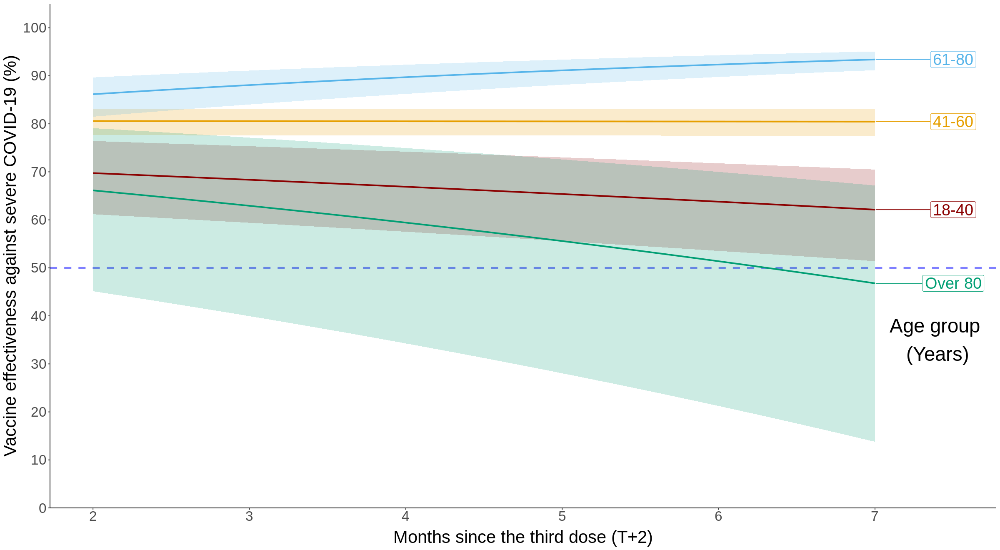

In [116]:
ve_svsvaz_18_40$Age<-"18-40"
ve_svsvaz_41_60$Age<-"41-60"
ve_svsvaz_61_80$Age<-"61-80"
ve_svsvaz_81_100$Age<-"Over 80"
ve_svsvaz_all<-rbind(ve_svsvaz_18_40,ve_svsvaz_41_60,ve_svsvaz_61_80,ve_svsvaz_81_100)
ve_svsvaz_all<-as.data.table(ve_svsvaz_all)

ggplot(ve_svsvaz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_svsvaz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_svsvaz_all$month)+2),limits = c(2,max(ve_svsvaz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
          annotate("text", x=7.4, y=35, label= "Age group \n(Years)",size=10)

**SV-AZ-AZ**

In [117]:
d3_s_svazaz<-d3_s[vac_type %in% c("None","SV-AZ-AZ")]

In [118]:
model_d3_s_svazaz_inter<-glm(severe ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d3_s_svazaz)

In [119]:
summary(model_d3_s_svazaz_inter)


Call:
glm(formula = severe ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d3_s_svazaz, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-13.09   -0.20    0.00    0.00   60.12  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -11.097698   0.029468 -376.604  < 2e-16 ***
vac_typeSV-AZ-AZ        -1.434765   0.076569  -18.738  < 2e-16 ***
month                   -0.095745   0.002785  -34.373  < 2e-16 ***
maleTRUE                 0.357714   0.009293   38.492  < 2e-16 ***
agegroup41-60            1.157162   0.015096   76.652  < 2e-16 ***
agegroup61-80            2.329713   0.014936  155.983  < 2e-16 ***
agegroupOver 80          3.682728   0.017976  204.864  < 2e-16 ***
provinceกระบี่            -0.936459   0.074429  -12.582  < 2e-16 ***
provinceกาญจนบุรี          0.201983   0.035500    5.690 1.27e-08 ***
provinceกาฬสินธุ์          -1.218539   0.051825  -23.512  <

In [120]:
car::vif(model_d3_s_svazaz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.059781,1,1.435194
month,4.520964,1,2.126256
male,1.004682,1,1.002338
agegroup,1.034162,3,1.005614
province,1.065533,76,1.000418
inf_date,4.594762,12,1.065600
vac_type:month,1.893176,1,1.375927


Initial OR

In [121]:
exp(summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ",2])

[1] 0.2049809 0.2381712 0.2767357

Initial VE

In [122]:
(1-exp(summary(model_d3_s_svazaz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svazaz_inter)$coef[2,2]))*100

[1] 72.32643 76.18288 79.50191

In [123]:
se_svazaz <- sqrt(vcov(model_d3_s_svazaz_inter)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ"] + 
                  vcov(model_d3_s_svazaz_inter)["vac_typeSV-AZ-AZ:month","vac_typeSV-AZ-AZ:month"]+ 
                  2*vcov(model_d3_s_svazaz_inter)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"])
se_svazaz

[1] 0.05774746

In [124]:
sqrt(sum(vcov(model_d3_s_svazaz_inter)[c("vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"),c("vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month")]))

[1] 0.05774746

OR at 7 months after the last dose (T=5)

In [125]:
exp(summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+
      summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazaz)

[1] 0.3035699 0.3399488 0.3806871

In [126]:
evalues.OR(exp(summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ",2])[2], 
exp(summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ",2])[1], 
exp(summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.2618288,-0.2950191,-0.2232643
E-values,4.4491539,NA,3.2724885


VE at 7 months after the last dose (T=5)

In [127]:
(1-exp(summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+
         summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazaz))*100

[1] 61.93129 66.00512 69.64301

VE over time within one year

In [128]:
ve_svazaz<-NULL
for(i in 0:500){
  ve_svazaz<-rbind(ve_svazaz,(1-exp(summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+
                                  summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_svazaz))*100)
}

In [129]:
ve_svazaz<-cbind(0:500/100,ve_svazaz)

In [130]:
ve_svazaz<-as.data.frame(ve_svazaz)
names(ve_svazaz)<-c("month","lower","estimate","upper")

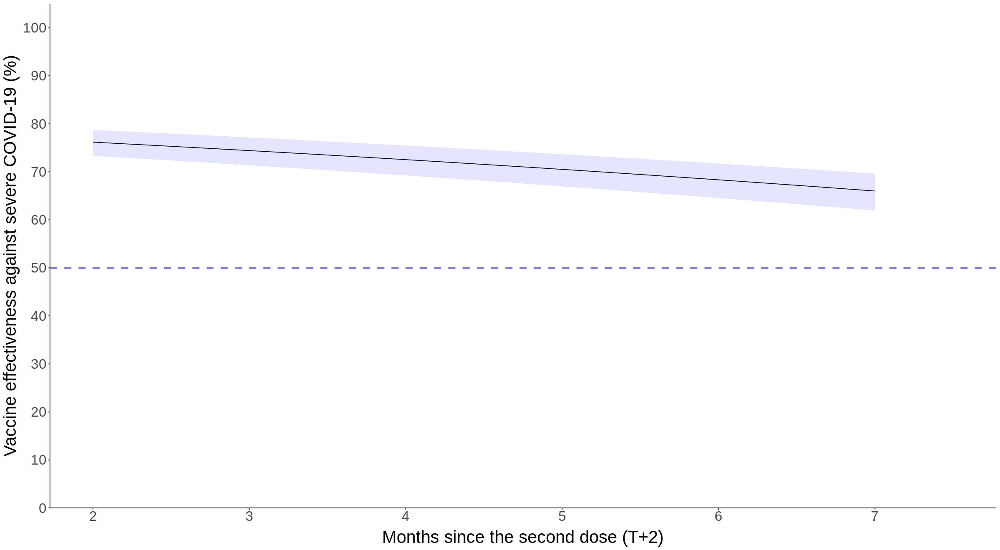

In [131]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svazaz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [132]:
(log(0.5)-summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]-qnorm(c(0.975,0.50,0.025))*se_svazaz)/summary(model_d3_s_svazaz_inter)$coef["vac_typeSV-AZ-AZ:month",1]+2

[1] 10.83118 12.42169 14.01221

*Stratified by age group*


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svazaz_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-5.6511  -0.1185   0.0000   0.0000  21.2785  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -10.802347   0.071262 -151.586  < 2e-16 ***
vac_typeSV-AZ-AZ        -1.127307   0.253486   -4.447 8.70e-06 ***
month                   -0.070459   0.008673   -8.124 4.51e-16 ***
maleTRUE                 0.021992   0.025771    0.853 0.393463    
provinceกระบี่            -0.409375   0.181389   -2.257 0.024015 *  
provinceกาญจนบุรี          0.831244   0.087586    9.491  < 2e-16 ***
provinceกาฬสินธุ์          -0.596668   0.143054   -4.171 3.03e-05 ***
provinceกำแพงเพชร       -0.209629   0.136859   -1.532 0.125591    
provinceขอนแก่น          -0.237539   0.096742   -2.455 0.014073 *  
provinceจันทบุรี            0.469861   0.117126   

[1] 0.1970828 0.3239044 0.5323348

[1] 46.76652 67.60956 80.29172

[1] 0.1127358 0.1674217 0.2486346

[1] 75.13654 83.25783 88.72642


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svazaz_41_60, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-10.77   -0.21    0.00    0.00   44.93  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.712322   0.043306 -224.273  < 2e-16 ***
vac_typeSV-AZ-AZ       -1.709625   0.146283  -11.687  < 2e-16 ***
month                  -0.101057   0.005186  -19.487  < 2e-16 ***
maleTRUE                0.263785   0.015781   16.715  < 2e-16 ***
provinceกระบี่           -1.050392   0.144353   -7.277 3.43e-13 ***
provinceกาญจนบุรี         0.346695   0.060565    5.724 1.04e-08 ***
provinceกาฬสินธุ์         -0.790905   0.079636   -9.932  < 2e-16 ***
provinceกำแพงเพชร      -0.232081   0.075784   -3.062 0.002196 ** 
provinceขอนแก่น         -0.706160   0.060893  -11.597  < 2e-16 ***
provinceจันทบุรี           0.045086   0.077107    0.585 0.558738    
p

[1] 0.1358322 0.1809336 0.2410104

[1] 75.89896 81.90664 86.41678

[1] 0.1272783 0.1587445 0.1979899

[1] 80.20101 84.12555 87.27217

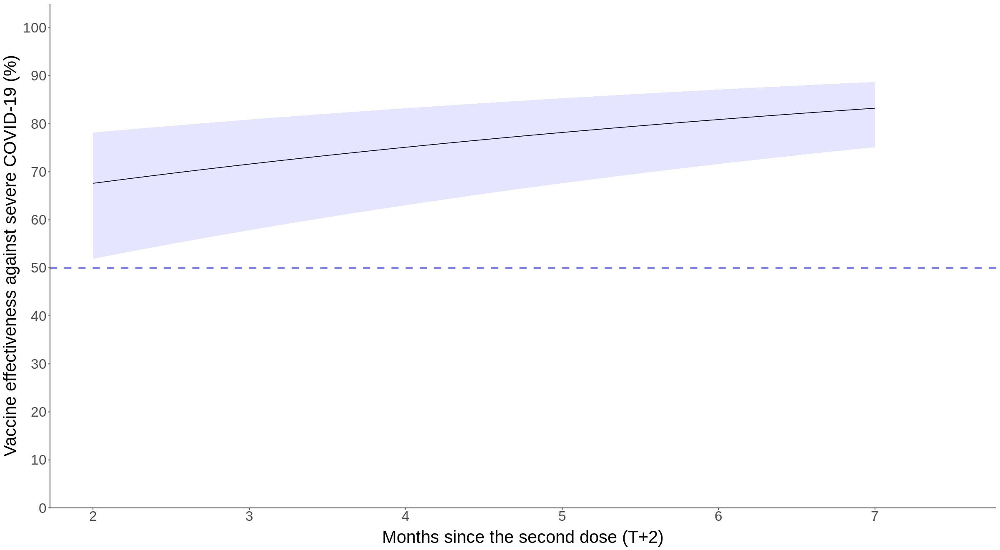


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svazaz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.336   -0.299    0.000    0.000   59.984  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.064724   0.047178 -192.140  < 2e-16 ***
vac_typeSV-AZ-AZ       -1.478813   0.111564  -13.255  < 2e-16 ***
month                  -0.119982   0.004326  -27.737  < 2e-16 ***
maleTRUE                0.479299   0.014976   32.004  < 2e-16 ***
provinceกระบี่           -0.766959   0.109411   -7.010 2.38e-12 ***
provinceกาญจนบุรี        -0.055410   0.059752   -0.927  0.35375    
provinceกาฬสินธุ์         -1.499309   0.084291  -17.787  < 2e-16 ***
provinceกำแพงเพชร      -0.941716   0.087653  -10.744  < 2e-16 ***
provinceขอนแก่น         -0.964464   0.047262  -20.407  < 2e-16 ***
provinceจันทบุรี          -0.678982   0.088206   -7.698 1.39

[1] 0.1831454 0.2279081 0.2836113

[1] 71.63887 77.20919 81.68546

[1] 0.3442345 0.4060099 0.4788714

[1] 52.11286 59.39901 65.57655

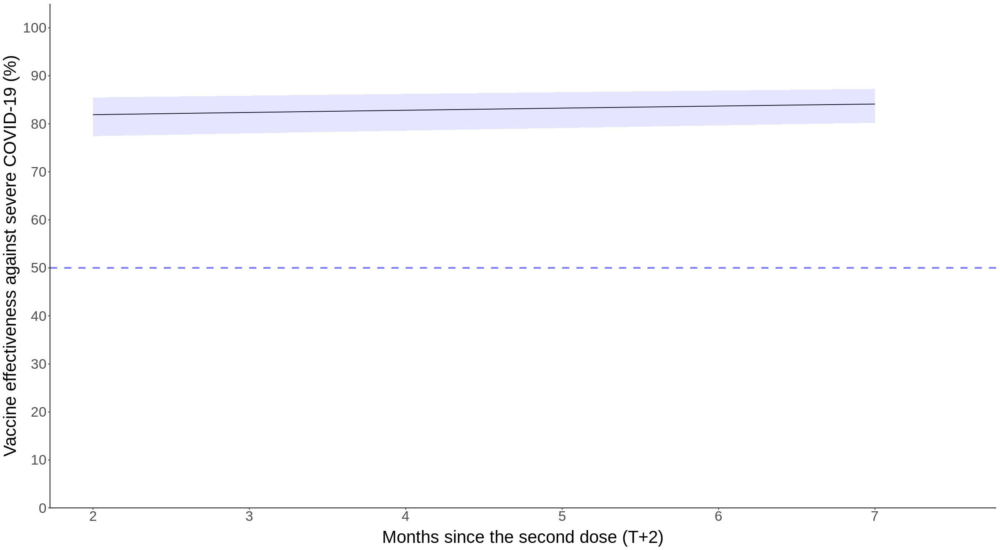


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svazaz_81_100, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-9.128  -0.190   0.000   0.000  29.210  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.489276   0.112994 -75.130  < 2e-16 ***
vac_typeSV-AZ-AZ        -0.944541   0.189215  -4.992 5.98e-07 ***
month                   -0.061111   0.006177  -9.893  < 2e-16 ***
maleTRUE                 0.586314   0.024887  23.559  < 2e-16 ***
provinceกระบี่            -1.588704   0.238203  -6.670 2.57e-11 ***
provinceกาญจนบุรี          0.063697   0.111465   0.571 0.567693    
provinceกาฬสินธุ์          -2.482310   0.244964 -10.133  < 2e-16 ***
provinceกำแพงเพชร       -1.071604   0.177551  -6.035 1.58e-09 ***
provinceขอนแก่น          -1.223393   0.087738 -13.944  < 2e-16 ***
provinceจันทบุรี           -0.376457   0.138070  -2.727 0.006400 ** 


[1] 0.2683679 0.3888580 0.5634449

[1] 43.65551 61.11420 73.16321

[1] 0.7060636 0.9279730 1.2196266

[1] -21.962663   7.202695  29.393639

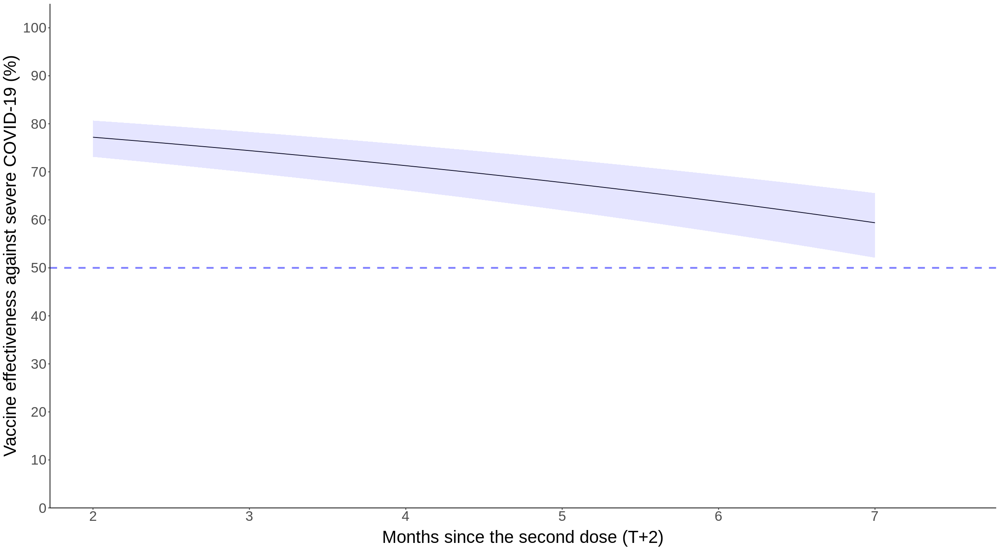

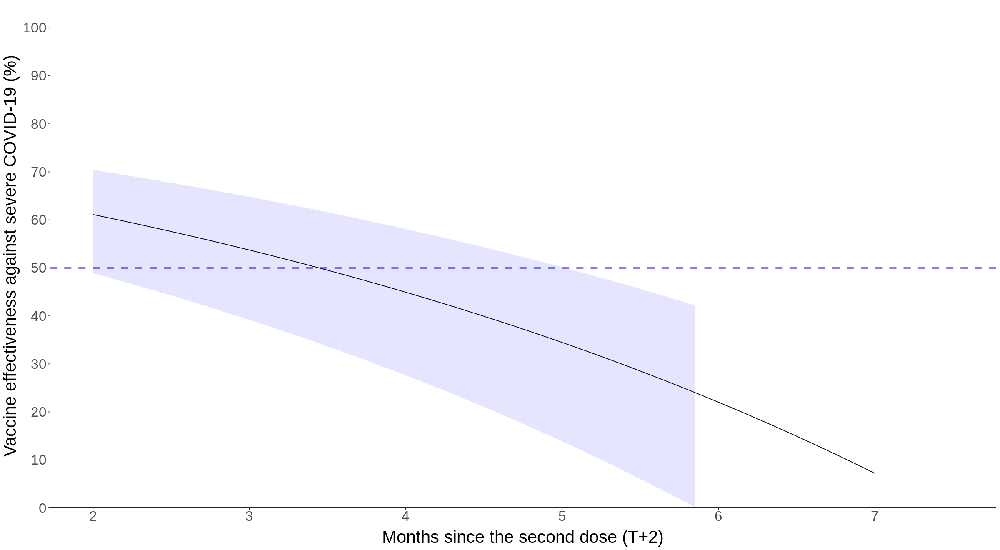

In [133]:
#Stratified by age group: 18-40
d3_s_svazaz_18_40<-d3_s_svazaz[agegroup=="18-40"]

model_d3_s_svazaz_inter_18_40<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_svazaz_18_40)
summary(model_d3_s_svazaz_inter_18_40)

#Initial OR
exp(summary(model_d3_s_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ",2])

#Initial VE
(1-exp(summary(model_d3_s_svazaz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svazaz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazaz_18_40 <- sqrt(vcov(model_d3_s_svazaz_inter_18_40)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ"] + 
                        vcov(model_d3_s_svazaz_inter_18_40)["vac_typeSV-AZ-AZ:month","vac_typeSV-AZ-AZ:month"]+ 
                        2*vcov(model_d3_s_svazaz_inter_18_40)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"])

exp(summary(model_d3_s_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ",1]+
      summary(model_d3_s_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazaz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ",1]+
         summary(model_d3_s_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazaz_18_40))*100

#VE overtime
ve_svazaz_18_40<-NULL
for(i in 0:500){
  ve_svazaz_18_40<-rbind(ve_svazaz_18_40,(1-exp(summary(model_d3_s_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ",1]+
                                              summary(model_d3_s_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazaz_18_40))*100)
}

ve_svazaz_18_40<-cbind(0:500/100,ve_svazaz_18_40)

ve_svazaz_18_40<-as.data.frame(ve_svazaz_18_40)
names(ve_svazaz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svazaz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d3_s_svazaz_41_60<-d3_s_svazaz[agegroup=="41-60"]

model_d3_s_svazaz_inter_41_60<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_svazaz_41_60)
summary(model_d3_s_svazaz_inter_41_60)

#Initial OR
exp(summary(model_d3_s_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ",2])

#initial VE
(1-exp(summary(model_d3_s_svazaz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svazaz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazaz_41_60 <- sqrt(vcov(model_d3_s_svazaz_inter_41_60)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ"] + 
                        vcov(model_d3_s_svazaz_inter_41_60)["vac_typeSV-AZ-AZ:month","vac_typeSV-AZ-AZ:month"]+ 
                        2*vcov(model_d3_s_svazaz_inter_41_60)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"])

exp(summary(model_d3_s_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ",1]+
      summary(model_d3_s_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazaz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ",1]+
         summary(model_d3_s_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazaz_41_60))*100

#VE overtime
ve_svazaz_41_60<-NULL
for(i in 0:500){
  ve_svazaz_41_60<-rbind(ve_svazaz_41_60,(1-exp(summary(model_d3_s_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ",1]+
                                              summary(model_d3_s_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazaz_41_60))*100)
}

ve_svazaz_41_60<-cbind(0:500/100,ve_svazaz_41_60)

ve_svazaz_41_60<-as.data.frame(ve_svazaz_41_60)
names(ve_svazaz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svazaz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d3_s_svazaz_61_80<-d3_s_svazaz[agegroup=="61-80"]

model_d3_s_svazaz_inter_61_80<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_svazaz_61_80)
summary(model_d3_s_svazaz_inter_61_80)

#Initial OR
exp(summary(model_d3_s_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ",2])

#initial VE
(1-exp(summary(model_d3_s_svazaz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svazaz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazaz_61_80 <- sqrt(vcov(model_d3_s_svazaz_inter_61_80)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ"] + 
                        vcov(model_d3_s_svazaz_inter_61_80)["vac_typeSV-AZ-AZ:month","vac_typeSV-AZ-AZ:month"]+ 
                        2*vcov(model_d3_s_svazaz_inter_61_80)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"])

exp(summary(model_d3_s_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ",1]+
      summary(model_d3_s_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazaz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ",1]+
         summary(model_d3_s_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazaz_61_80))*100

#VE overtime
ve_svazaz_61_80<-NULL
for(i in 0:500){
  ve_svazaz_61_80<-rbind(ve_svazaz_61_80,(1-exp(summary(model_d3_s_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ",1]+
                                              summary(model_d3_s_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazaz_61_80))*100)
}

ve_svazaz_61_80<-cbind(0:500/100,ve_svazaz_61_80)

ve_svazaz_61_80<-as.data.frame(ve_svazaz_61_80)
names(ve_svazaz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svazaz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d3_s_svazaz_81_100<-d3_s_svazaz[agegroup=="Over 80"]

model_d3_s_svazaz_inter_81_100<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_svazaz_81_100)
summary(model_d3_s_svazaz_inter_81_100)

#Initial OR
exp(summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",2])

#initial VE
(1-exp(summary(model_d3_s_svazaz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svazaz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazaz_81_100 <- sqrt(vcov(model_d3_s_svazaz_inter_81_100)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ"] + 
                        vcov(model_d3_s_svazaz_inter_81_100)["vac_typeSV-AZ-AZ:month","vac_typeSV-AZ-AZ:month"]+ 
                        2*vcov(model_d3_s_svazaz_inter_81_100)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"])

exp(summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+
      summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazaz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+
         summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazaz_81_100))*100

#VE overtime
ve_svazaz_81_100<-NULL
for(i in 0:500){
  ve_svazaz_81_100<-rbind(ve_svazaz_81_100,(1-exp(summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+
                                              summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazaz_81_100))*100)
}

ve_svazaz_81_100<-cbind(0:500/100,ve_svazaz_81_100)

ve_svazaz_81_100<-as.data.frame(ve_svazaz_81_100)
names(ve_svazaz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svazaz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [134]:
summary(model_d3_s_svazaz_inter_81_100)

#Initial OR
exp(summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",2])

#initial VE
(1-exp(summary(model_d3_s_svazaz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svazaz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazaz_81_100 <- sqrt(vcov(model_d3_s_svazaz_inter_81_100)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ"] + 
                        vcov(model_d3_s_svazaz_inter_81_100)["vac_typeSV-AZ-AZ:month","vac_typeSV-AZ-AZ:month"]+ 
                        2*vcov(model_d3_s_svazaz_inter_81_100)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"])

exp(summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+
      summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazaz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+
         summary(model_d3_s_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazaz_81_100))*100


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svazaz_81_100, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-9.128  -0.190   0.000   0.000  29.210  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.489276   0.112994 -75.130  < 2e-16 ***
vac_typeSV-AZ-AZ        -0.944541   0.189215  -4.992 5.98e-07 ***
month                   -0.061111   0.006177  -9.893  < 2e-16 ***
maleTRUE                 0.586314   0.024887  23.559  < 2e-16 ***
provinceกระบี่            -1.588704   0.238203  -6.670 2.57e-11 ***
provinceกาญจนบุรี          0.063697   0.111465   0.571 0.567693    
provinceกาฬสินธุ์          -2.482310   0.244964 -10.133  < 2e-16 ***
provinceกำแพงเพชร       -1.071604   0.177551  -6.035 1.58e-09 ***
provinceขอนแก่น          -1.223393   0.087738 -13.944  < 2e-16 ***
provinceจันทบุรี           -0.376457   0.138070  -2.727 0.006400 ** 


[1] 0.2683679 0.3888580 0.5634449

[1] 43.65551 61.11420 73.16321

[1] 0.7060636 0.9279730 1.2196266

[1] -21.962663   7.202695  29.393639

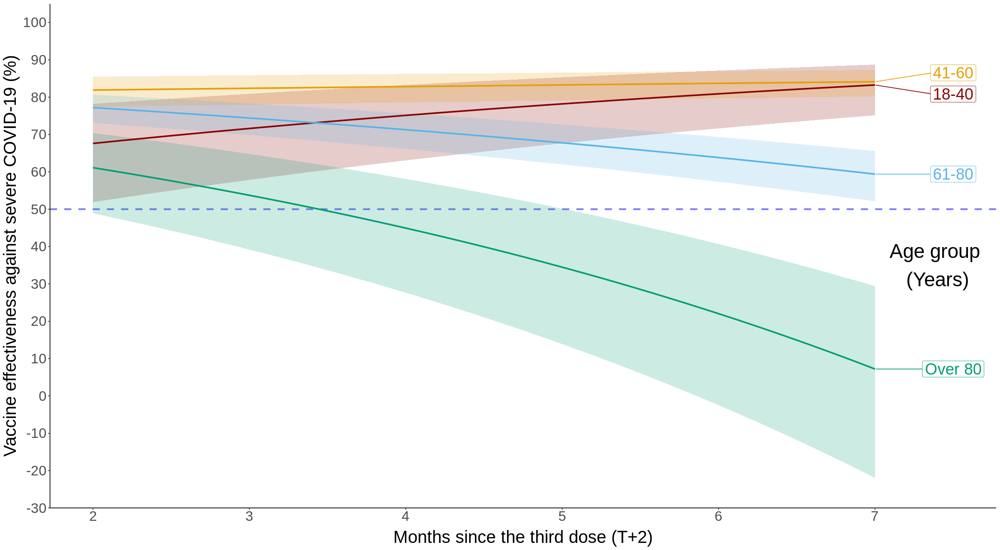

In [135]:
ve_svazaz_18_40$Age<-"18-40"
ve_svazaz_41_60$Age<-"41-60"
ve_svazaz_61_80$Age<-"61-80"
ve_svazaz_81_100$Age<-"Over 80"
ve_svazaz_all<-rbind(ve_svazaz_18_40,ve_svazaz_41_60,ve_svazaz_61_80,ve_svazaz_81_100)
ve_svazaz_all<-as.data.table(ve_svazaz_all)

ggplot(ve_svazaz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_svazaz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_svazaz_all$month)+2),limits = c(2,max(ve_svazaz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-30,105),breaks=c(3:1*-10,0:10*10),name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=35, label= "Age group \n(Years)",size=10)

**SV-AZ-PZ**

In [136]:
d3_s_svazpz<-d3_s[vac_type %in% c("None","SV-AZ-PZ")]

In [137]:
model_d3_s_svazpz_inter<-glm(severe ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d3_s_svazpz)

In [138]:
summary(model_d3_s_svazpz_inter)


Call:
glm(formula = severe ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d3_s_svazpz, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-13.07   -0.24    0.00    0.00   60.14  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -11.099360   0.029443 -376.977  < 2e-16 ***
vac_typeSV-AZ-PZ        -1.427866   0.053977  -26.453  < 2e-16 ***
month                   -0.095391   0.002779  -34.321  < 2e-16 ***
maleTRUE                 0.355160   0.009248   38.406  < 2e-16 ***
agegroup41-60            1.160773   0.015050   77.127  < 2e-16 ***
agegroup61-80            2.330916   0.014893  156.507  < 2e-16 ***
agegroupOver 80          3.689097   0.017914  205.929  < 2e-16 ***
provinceกระบี่            -0.924049   0.074422  -12.416  < 2e-16 ***
provinceกาญจนบุรี          0.205966   0.035477    5.806 6.41e-09 ***
provinceกาฬสินธุ์          -1.221113   0.051534  -23.695  <

In [139]:
car::vif(model_d3_s_svazpz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.292107,1,1.513971
month,4.550209,1,2.133122
male,1.004541,1,1.002268
agegroup,1.034380,3,1.005650
province,1.066649,76,1.000425
inf_date,4.671276,12,1.066334
vac_type:month,1.920689,1,1.385889


Initial OR

In [140]:
exp(summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ",2])

[1] 0.2157446 0.2398201 0.2665822

Initial VE

In [141]:
(1-exp(summary(model_d3_s_svazpz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svazpz_inter)$coef[2,2]))*100

[1] 73.34178 76.01799 78.42554

Varience estimation

In [142]:
se_svazpz <- sqrt(vcov(model_d3_s_svazpz_inter)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ"] + 
                  vcov(model_d3_s_svazpz_inter)["vac_typeSV-AZ-PZ:month","vac_typeSV-AZ-PZ:month"]+ 
                  2*vcov(model_d3_s_svazpz_inter)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"])
se_svazpz

[1] 0.04173931

In [143]:
sqrt(sum(vcov(model_d3_s_svazpz_inter)[c("vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"),c("vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month")]))

[1] 0.04173931

OR at 7 months after the last dose (T=5)

In [144]:
exp(summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+
      summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazpz)

[1] 0.3819718 0.4145337 0.4498715

In [145]:
evalues.OR(exp(summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ",2])[2], 
exp(summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ",2])[1], 
exp(summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.2601799,-0.2842554,-0.2334178
E-values,4.3911507,NA,3.5494862


VE at one year

In [146]:
(1-exp(summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+
         summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazpz))*100

[1] 55.01285 58.54663 61.80282

VE over time within a year

In [147]:
ve_svazpz<-NULL
for(i in 0:500){
  ve_svazpz<-rbind(ve_svazpz,(1-exp(summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+
                                  summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_svazpz))*100)
}

In [148]:
ve_svazpz<-cbind(0:500/100,ve_svazpz)
ve_svazpz<-as.data.frame(ve_svazpz)
names(ve_svazpz)<-c("month","lower","estimate","upper")

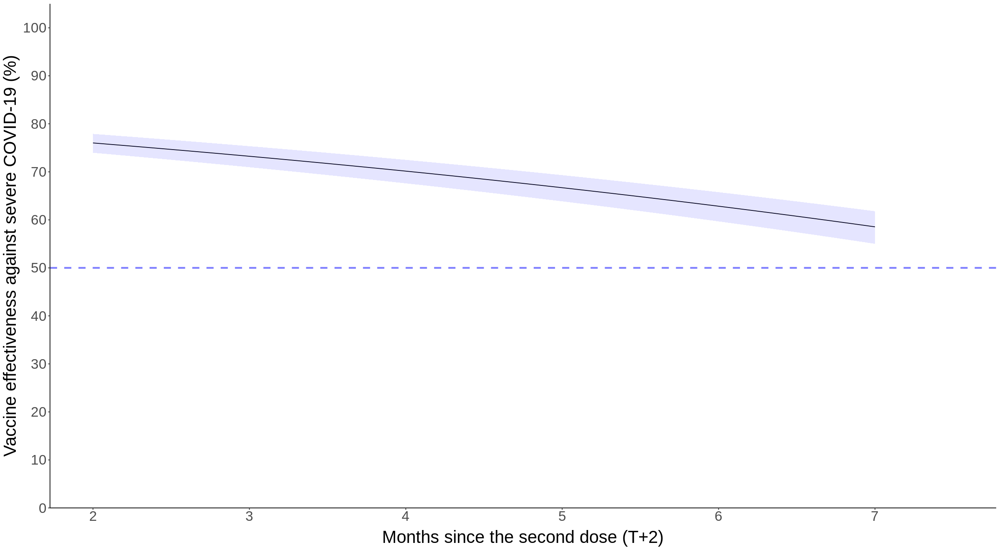

In [149]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svazpz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [150]:
(log(0.5)-summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]-qnorm(c(0.975,0.50,0.025))*se_svazpz)/summary(model_d3_s_svazpz_inter)$coef["vac_typeSV-AZ-PZ:month",1]+2

[1] 7.965219 8.712640 9.460061

*Stratified by age group*


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svazpz_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-5.6254  -0.1423   0.0000   0.0000  21.2843  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -10.811465   0.071359 -151.507  < 2e-16 ***
vac_typeSV-AZ-PZ        -1.289403   0.192416   -6.701 2.07e-11 ***
month                   -0.069621   0.008666   -8.033 9.48e-16 ***
maleTRUE                 0.025248   0.025715    0.982 0.326180    
provinceกระบี่            -0.397136   0.181422   -2.189 0.028596 *  
provinceกาญจนบุรี          0.839863   0.087657    9.581  < 2e-16 ***
provinceกาฬสินธุ์          -0.611723   0.144232   -4.241 2.22e-05 ***
provinceกำแพงเพชร       -0.184080   0.135964   -1.354 0.175770    
provinceขอนแก่น          -0.208799   0.095891   -2.177 0.029445 *  
provinceจันทบุรี            0.455769   0.118254   

[1] 0.1889013 0.2754352 0.4016094

[1] 59.83906 72.45648 81.10987

[1] 0.2033844 0.2730045 0.3664562

[1] 63.35438 72.69955 79.66156


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svazpz_41_60, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-10.832   -0.284    0.000    0.000   44.903  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.699455   0.043150 -224.786  < 2e-16 ***
vac_typeSV-AZ-PZ       -1.511219   0.094544  -15.984  < 2e-16 ***
month                  -0.101312   0.005169  -19.599  < 2e-16 ***
maleTRUE                0.261677   0.015693   16.675  < 2e-16 ***
provinceกระบี่           -1.057561   0.144307   -7.329 2.33e-13 ***
provinceกาญจนบุรี         0.325342   0.060656    5.364 8.15e-08 ***
provinceกาฬสินธุ์         -0.793960   0.078809  -10.075  < 2e-16 ***
provinceกำแพงเพชร      -0.269536   0.076501   -3.523 0.000426 ***
provinceขอนแก่น         -0.725689   0.060655  -11.964  < 2e-16 ***
provinceจันทบุรี           0.016711   0.077534    0.216 0.82

[1] 0.1833199 0.2206408 0.2655597

[1] 73.44403 77.93592 81.66801

[1] 0.3617467 0.4176376 0.4821638

[1] 51.78362 58.23624 63.82533

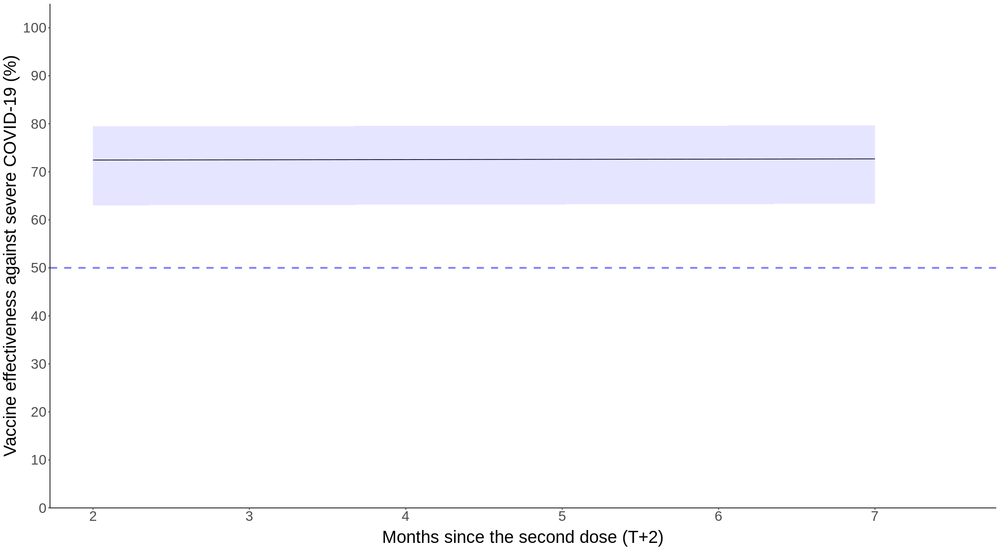


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svazpz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.298   -0.342    0.000    0.000   60.005  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.064812   0.047179 -192.136  < 2e-16 ***
vac_typeSV-AZ-PZ       -1.590416   0.081288  -19.565  < 2e-16 ***
month                  -0.119310   0.004318  -27.632  < 2e-16 ***
maleTRUE                0.473348   0.014899   31.771  < 2e-16 ***
provinceกระบี่           -0.740192   0.109397   -6.766 1.32e-11 ***
provinceกาญจนบุรี        -0.046084   0.059754   -0.771 0.440574    
provinceกาฬสินธุ์         -1.502976   0.083792  -17.937  < 2e-16 ***
provinceกำแพงเพชร      -0.950098   0.088833  -10.695  < 2e-16 ***
provinceขอนแก่น         -0.948942   0.046808  -20.273  < 2e-16 ***
provinceจันทบุรี          -0.635777   0.086739   -7.330 2.30

[1] 0.1738196 0.2038408 0.2390471

[1] 76.09529 79.61592 82.61804

[1] 0.2817933 0.3191576 0.3614762

[1] 63.85238 68.08424 71.82067

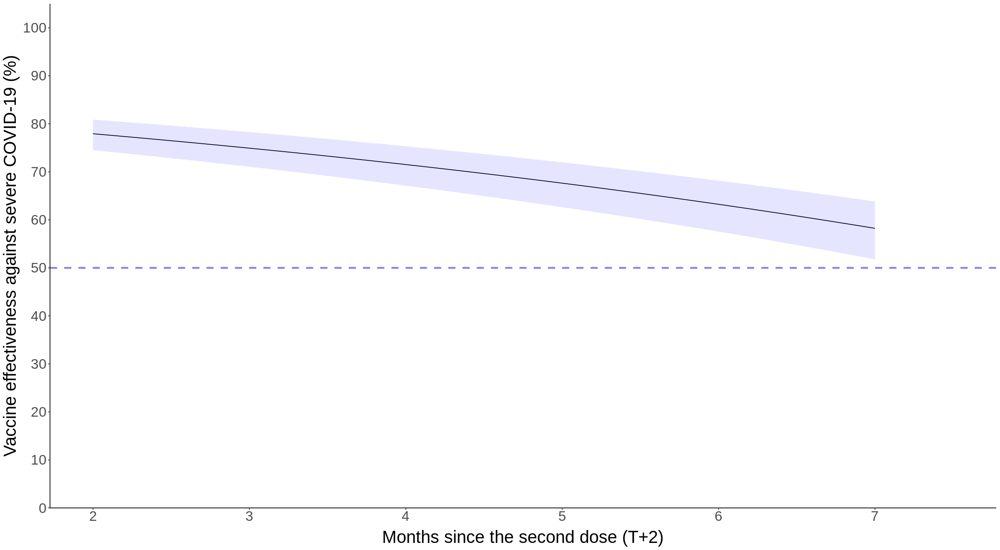


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svazpz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.1129  -0.2223   0.0000   0.0000  29.2239  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.492559   0.113009 -75.149  < 2e-16 ***
vac_typeSV-AZ-PZ        -0.991041   0.139114  -7.124 1.05e-12 ***
month                   -0.060983   0.006164  -9.893  < 2e-16 ***
maleTRUE                 0.582445   0.024780  23.505  < 2e-16 ***
provinceกระบี่            -1.556573   0.238183  -6.535 6.35e-11 ***
provinceกาญจนบุรี          0.115892   0.109289   1.060 0.288957    
provinceกาฬสินธุ์          -2.501226   0.244986 -10.210  < 2e-16 ***
provinceกำแพงเพชร       -1.053923   0.177528  -5.937 2.91e-09 ***
provinceขอนแก่น          -1.230303   0.087779 -14.016  < 2e-16 ***
provinceจันทบุรี           -0.390076   0.139255  -2.801 0.0

[1] 0.2826068 0.3711900 0.4875397

[1] 51.24603 62.88100 71.73932

[1] 0.8505923 1.0442618 1.2820276

[1] -28.202756  -4.426184  14.940768

Warning message:
“Removed 21 rows containing missing values (`geom_line()`).”


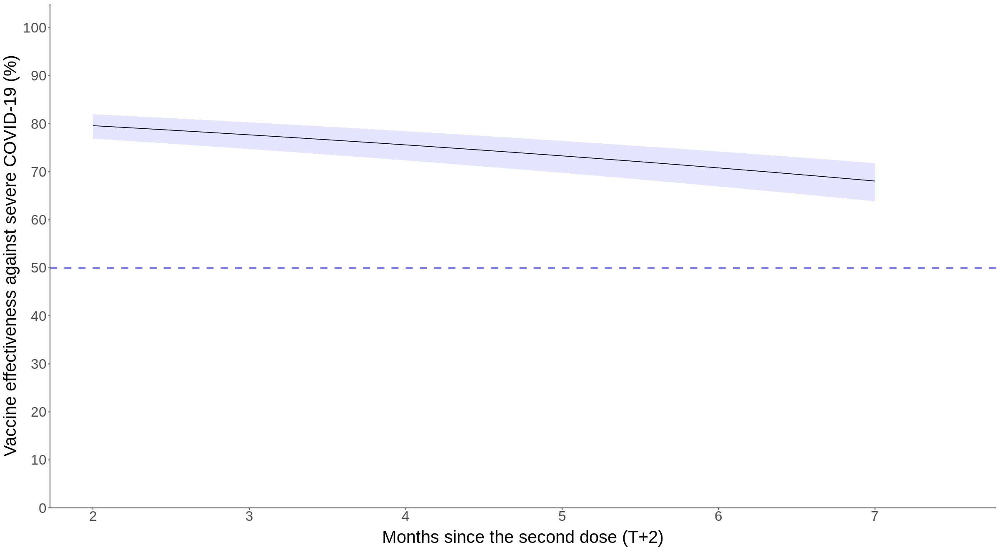

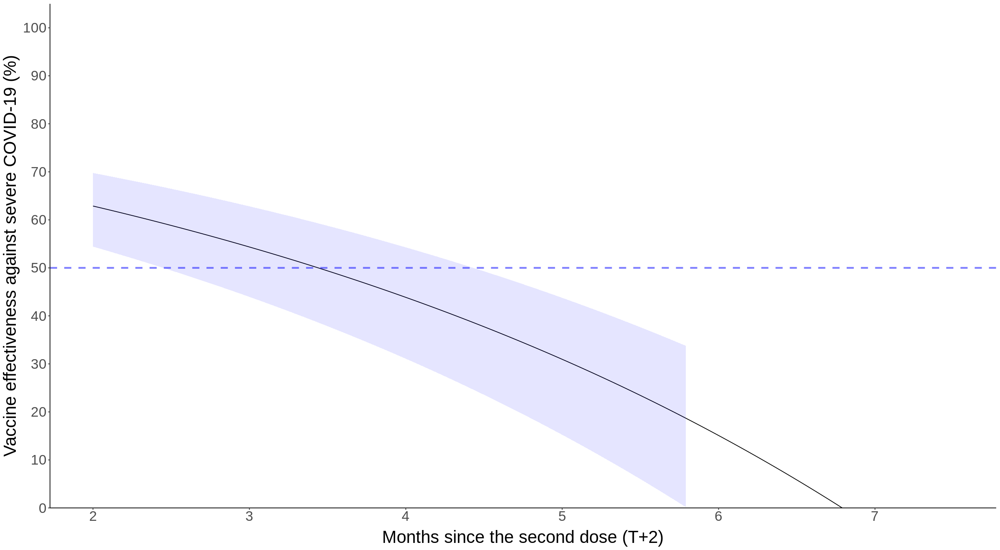

In [151]:
#Stratified by age group: 18-40
d3_s_svazpz_18_40<-d3_s_svazpz[agegroup=="18-40"]

model_d3_s_svazpz_inter_18_40<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_svazpz_18_40)
summary(model_d3_s_svazpz_inter_18_40)

#Initial OR
exp(summary(model_d3_s_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ",2])

#Initial VE
(1-exp(summary(model_d3_s_svazpz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svazpz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazpz_18_40 <- sqrt(vcov(model_d3_s_svazpz_inter_18_40)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ"] + 
                        vcov(model_d3_s_svazpz_inter_18_40)["vac_typeSV-AZ-PZ:month","vac_typeSV-AZ-PZ:month"]+ 
                        2*vcov(model_d3_s_svazpz_inter_18_40)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"])

exp(summary(model_d3_s_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ",1]+
      summary(model_d3_s_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazpz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ",1]+
         summary(model_d3_s_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazpz_18_40))*100

#VE overtime
ve_svazpz_18_40<-NULL
for(i in 0:500){
  ve_svazpz_18_40<-rbind(ve_svazpz_18_40,(1-exp(summary(model_d3_s_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ",1]+
                                              summary(model_d3_s_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazpz_18_40))*100)
}

ve_svazpz_18_40<-cbind(0:500/100,ve_svazpz_18_40)

ve_svazpz_18_40<-as.data.frame(ve_svazpz_18_40)
names(ve_svazpz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svazpz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d3_s_svazpz_41_60<-d3_s_svazpz[agegroup=="41-60"]

model_d3_s_svazpz_inter_41_60<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_svazpz_41_60)
summary(model_d3_s_svazpz_inter_41_60)

#Initial OR
exp(summary(model_d3_s_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_s_svazpz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svazpz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazpz_41_60 <- sqrt(vcov(model_d3_s_svazpz_inter_41_60)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ"] + 
                        vcov(model_d3_s_svazpz_inter_41_60)["vac_typeSV-AZ-PZ:month","vac_typeSV-AZ-PZ:month"]+ 
                        2*vcov(model_d3_s_svazpz_inter_41_60)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"])

exp(summary(model_d3_s_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ",1]+
      summary(model_d3_s_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazpz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ",1]+
         summary(model_d3_s_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazpz_41_60))*100

#VE overtime
ve_svazpz_41_60<-NULL
for(i in 0:500){
  ve_svazpz_41_60<-rbind(ve_svazpz_41_60,(1-exp(summary(model_d3_s_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ",1]+
                                              summary(model_d3_s_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazpz_41_60))*100)
}

ve_svazpz_41_60<-cbind(0:500/100,ve_svazpz_41_60)

ve_svazpz_41_60<-as.data.frame(ve_svazpz_41_60)
names(ve_svazpz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svazpz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d3_s_svazpz_61_80<-d3_s_svazpz[agegroup=="61-80"]

model_d3_s_svazpz_inter_61_80<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_svazpz_61_80)
summary(model_d3_s_svazpz_inter_61_80)

#Initial OR
exp(summary(model_d3_s_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_s_svazpz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svazpz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazpz_61_80 <- sqrt(vcov(model_d3_s_svazpz_inter_61_80)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ"] + 
                        vcov(model_d3_s_svazpz_inter_61_80)["vac_typeSV-AZ-PZ:month","vac_typeSV-AZ-PZ:month"]+ 
                        2*vcov(model_d3_s_svazpz_inter_61_80)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"])

exp(summary(model_d3_s_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ",1]+
      summary(model_d3_s_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazpz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ",1]+
         summary(model_d3_s_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazpz_61_80))*100

#VE overtime
ve_svazpz_61_80<-NULL
for(i in 0:500){
  ve_svazpz_61_80<-rbind(ve_svazpz_61_80,(1-exp(summary(model_d3_s_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ",1]+
                                              summary(model_d3_s_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazpz_61_80))*100)
}

ve_svazpz_61_80<-cbind(0:500/100,ve_svazpz_61_80)

ve_svazpz_61_80<-as.data.frame(ve_svazpz_61_80)
names(ve_svazpz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svazpz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d3_s_svazpz_81_100<-d3_s_svazpz[agegroup=="Over 80"]

model_d3_s_svazpz_inter_81_100<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_svazpz_81_100)
summary(model_d3_s_svazpz_inter_81_100)

#Initial OR
exp(summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_s_svazpz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svazpz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazpz_81_100 <- sqrt(vcov(model_d3_s_svazpz_inter_81_100)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ"] + 
                        vcov(model_d3_s_svazpz_inter_81_100)["vac_typeSV-AZ-PZ:month","vac_typeSV-AZ-PZ:month"]+ 
                        2*vcov(model_d3_s_svazpz_inter_81_100)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"])

exp(summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+
      summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazpz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+
         summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazpz_81_100))*100

#VE overtime
ve_svazpz_81_100<-NULL
for(i in 0:500){
  ve_svazpz_81_100<-rbind(ve_svazpz_81_100,(1-exp(summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+
                                              summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazpz_81_100))*100)
}

ve_svazpz_81_100<-cbind(0:500/100,ve_svazpz_81_100)

ve_svazpz_81_100<-as.data.frame(ve_svazpz_81_100)
names(ve_svazpz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svazpz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [152]:
summary(model_d3_s_svazpz_inter_81_100)

#Initial OR
exp(summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_s_svazpz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_svazpz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazpz_81_100 <- sqrt(vcov(model_d3_s_svazpz_inter_81_100)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ"] + 
                        vcov(model_d3_s_svazpz_inter_81_100)["vac_typeSV-AZ-PZ:month","vac_typeSV-AZ-PZ:month"]+ 
                        2*vcov(model_d3_s_svazpz_inter_81_100)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"])

exp(summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+
      summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazpz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+
         summary(model_d3_s_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazpz_81_100))*100


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_svazpz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.1129  -0.2223   0.0000   0.0000  29.2239  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.492559   0.113009 -75.149  < 2e-16 ***
vac_typeSV-AZ-PZ        -0.991041   0.139114  -7.124 1.05e-12 ***
month                   -0.060983   0.006164  -9.893  < 2e-16 ***
maleTRUE                 0.582445   0.024780  23.505  < 2e-16 ***
provinceกระบี่            -1.556573   0.238183  -6.535 6.35e-11 ***
provinceกาญจนบุรี          0.115892   0.109289   1.060 0.288957    
provinceกาฬสินธุ์          -2.501226   0.244986 -10.210  < 2e-16 ***
provinceกำแพงเพชร       -1.053923   0.177528  -5.937 2.91e-09 ***
provinceขอนแก่น          -1.230303   0.087779 -14.016  < 2e-16 ***
provinceจันทบุรี           -0.390076   0.139255  -2.801 0.0

[1] 0.2826068 0.3711900 0.4875397

[1] 51.24603 62.88100 71.73932

[1] 0.8505923 1.0442618 1.2820276

[1] -28.202756  -4.426184  14.940768

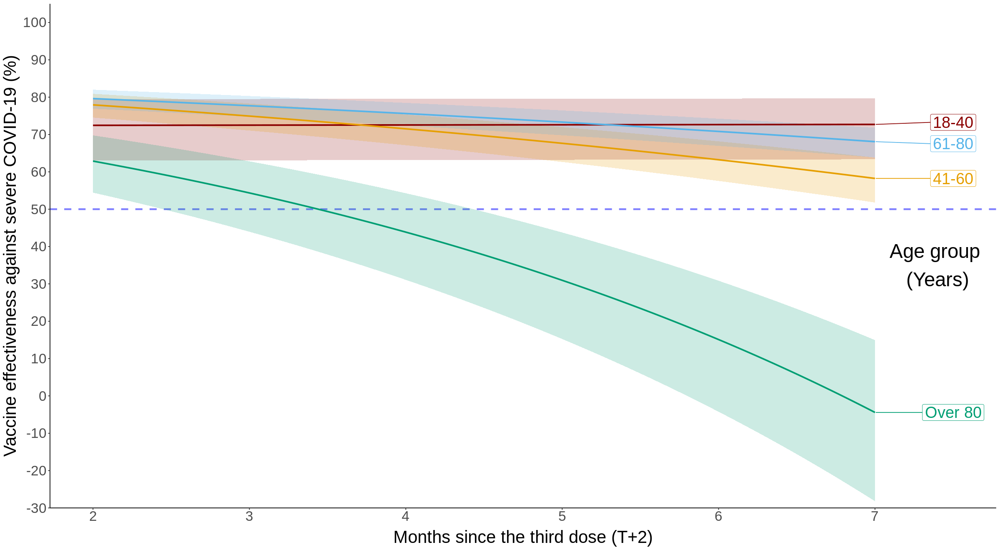

In [153]:
ve_svazpz_18_40$Age<-"18-40"
ve_svazpz_41_60$Age<-"41-60"
ve_svazpz_61_80$Age<-"61-80"
ve_svazpz_81_100$Age<-"Over 80"
ve_svazpz_all<-rbind(ve_svazpz_18_40,ve_svazpz_41_60,ve_svazpz_61_80,ve_svazpz_81_100)
ve_svazpz_all<-as.data.table(ve_svazpz_all)

ggplot(ve_svazpz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_svazpz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_svazpz_all$month)+2),limits = c(2,max(ve_svazpz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-30,105),breaks=c(3:1*-10,0:10*10),name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=35, label= "Age group \n(Years)",size=10)

**SP-SP-PZ**

In [154]:
d3_s_spsppz<-d3_s[vac_type %in% c("None","SP-SP-PZ")]

In [155]:
model_d3_s_spsppz_inter<-glm(severe ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d3_s_spsppz)

In [156]:
summary(model_d3_s_spsppz_inter)


Call:
glm(formula = severe ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d3_s_spsppz, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.104   -0.193    0.000    0.000   60.115  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -11.089494   0.029424 -376.881  < 2e-16 ***
vac_typeSP-SP-PZ        -1.600847   0.084689  -18.903  < 2e-16 ***
month                   -0.095905   0.002785  -34.439  < 2e-16 ***
maleTRUE                 0.354708   0.009296   38.156  < 2e-16 ***
agegroup41-60            1.154798   0.015053   76.717  < 2e-16 ***
agegroup61-80            2.327441   0.014907  156.126  < 2e-16 ***
agegroupOver 80          3.678507   0.017965  204.754  < 2e-16 ***
provinceกระบี่            -0.925638   0.074414  -12.439  < 2e-16 ***
provinceกาญจนบุรี          0.196282   0.035461    5.535 3.11e-08 ***
provinceกาฬสินธุ์          -1.222946   0.051868  

In [157]:
car::vif(model_d3_s_spsppz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.201616,1,1.483784
month,4.509930,1,2.123660
male,1.004690,1,1.002342
agegroup,1.036138,3,1.005934
province,1.063780,76,1.000407
inf_date,4.570653,12,1.065367
vac_type:month,2.064160,1,1.436719


Initial OR

In [158]:
exp(summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",2])

[1] 0.1708731 0.2017255 0.2381487

Initial VE

In [159]:
(1-exp(summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",2]))*100

[1] 82.91269 79.82745 76.18513

In [160]:
se_spsppz <- sqrt(vcov(model_d3_s_spsppz_inter)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ"] + 
                  vcov(model_d3_s_spsppz_inter)["vac_typeSP-SP-PZ:month","vac_typeSP-SP-PZ:month"]+ 
                  2*vcov(model_d3_s_spsppz_inter)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"])
se_spsppz

[1] 0.06325285

In [161]:
sqrt(sum(vcov(model_d3_s_spsppz_inter)[c("vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"),c("vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month")]))

[1] 0.06325285

OR at one year

In [162]:
exp(summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+
      summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_spsppz)

[1] 0.2813245 0.3184553 0.3604869

In [163]:
evalues.OR(exp(summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",2])[2], 
exp(summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",2])[1], 
exp(summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.2982745,-0.3291269,-0.2618513
E-values,5.9721150,NA,4.4499540


VE at one year

In [164]:
(1-exp(summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+
         summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_spsppz))*100

[1] 63.95131 68.15447 71.86755

VE overtime within a year

In [165]:
ve_spsppz<-NULL
for(i in 0:500){
  ve_spsppz<-rbind(ve_spsppz,(1-exp(summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+
                                  summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_spsppz))*100)
}

In [166]:
ve_spsppz<-cbind(0:500/100,ve_spsppz)
ve_spsppz<-as.data.frame(ve_spsppz)
names(ve_spsppz)<-c("month","lower","estimate","upper")

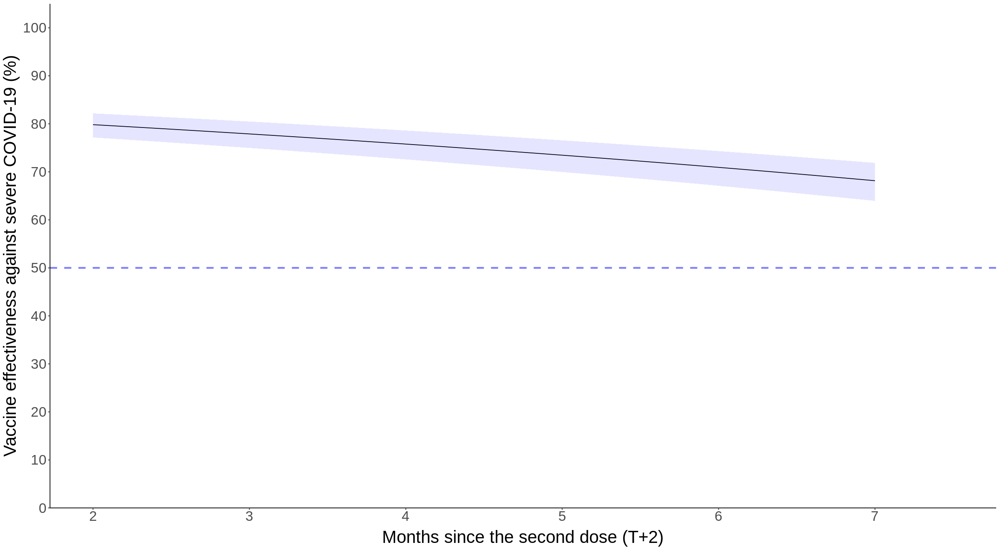

In [167]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_spsppz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [168]:
(log(0.5)-summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]-qnorm(c(0.975,0.50,0.025))*se_spsppz)/summary(model_d3_s_spsppz_inter)$coef["vac_typeSP-SP-PZ:month",1]+2

[1] 10.58269 11.94033 13.29798


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_spsppz_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-5.6823  -0.1578   0.0000   0.0000  21.2591  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -10.791329   0.070821 -152.375  < 2e-16 ***
vac_typeSP-SP-PZ        -1.284143   0.181750   -7.065 1.60e-12 ***
month                   -0.072017   0.008638   -8.337  < 2e-16 ***
maleTRUE                 0.030608   0.025674    1.192 0.233187    
provinceกระบี่            -0.420457   0.181207   -2.320 0.020324 *  
provinceกาญจนบุรี          0.805768   0.087208    9.240  < 2e-16 ***
provinceกาฬสินธุ์          -0.635039   0.143958   -4.411 1.03e-05 ***
provinceกำแพงเพชร       -0.242495   0.137577   -1.763 0.077966 .  
provinceขอนแก่น          -0.237680   0.095475   -2.489 0.012794 *  
provinceจันทบุรี            0.431095   0.117921   

[1] 0.1939088 0.2768877 0.3953757

[1] 60.46243 72.31123 80.60912

[1] 0.4811692 0.6308645 0.8271313

[1] 17.28687 36.91355 51.88308


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_spsppz_41_60, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-10.808   -0.212    0.000    0.000   44.913  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.701710   0.043196 -224.598  < 2e-16 ***
vac_typeSP-SP-PZ       -2.057709   0.157285  -13.083  < 2e-16 ***
month                  -0.101189   0.005184  -19.520  < 2e-16 ***
maleTRUE                0.259533   0.015777   16.450  < 2e-16 ***
provinceกระบี่           -1.050642   0.144319   -7.280 3.34e-13 ***
provinceกาญจนบุรี         0.346915   0.060222    5.761 8.38e-09 ***
provinceกาฬสินธุ์         -0.798237   0.079576  -10.031  < 2e-16 ***
provinceกำแพงเพชร      -0.297127   0.077885   -3.815 0.000136 ***
provinceขอนแก่น         -0.713212   0.060746  -11.741  < 2e-16 ***
provinceจันทบุรี           0.026520   0.077557    0.342 0.73

[1] 0.09385706 0.12774630 0.17387203

[1] 82.61280 87.22537 90.61429

[1] 0.2070947 0.2603651 0.3273381

[1] 67.26619 73.96349 79.29053

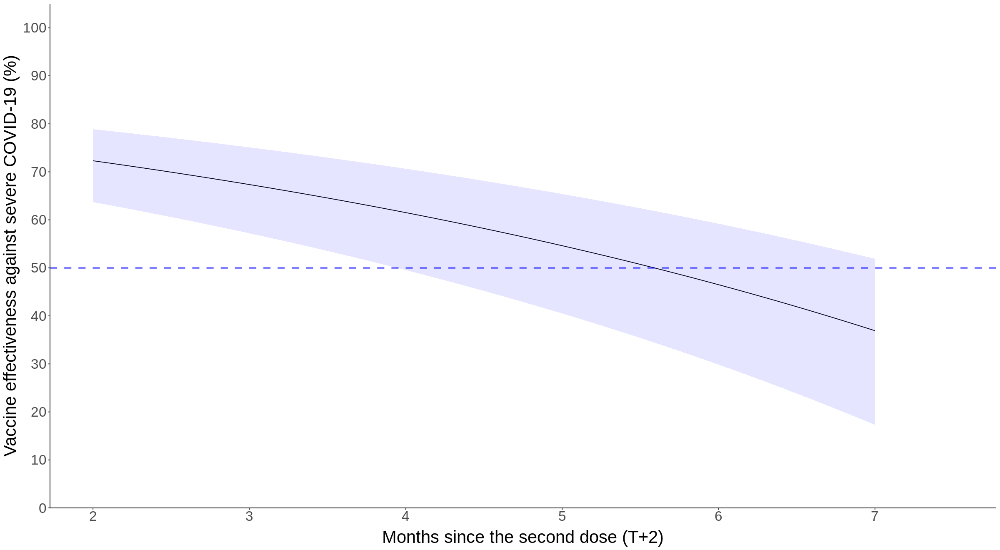


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_spsppz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.314   -0.264    0.000    0.000   59.997  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.064982   0.047176 -192.150  < 2e-16 ***
vac_typeSP-SP-PZ       -1.336350   0.143633   -9.304  < 2e-16 ***
month                  -0.120047   0.004327  -27.741  < 2e-16 ***
maleTRUE                0.476572   0.015003   31.765  < 2e-16 ***
provinceกระบี่           -0.737564   0.109390   -6.743 1.56e-11 ***
provinceกาญจนบุรี        -0.061649   0.059912   -1.029  0.30349    
provinceกาฬสินธุ์         -1.491141   0.084289  -17.691  < 2e-16 ***
provinceกำแพงเพชร      -0.941617   0.089130  -10.564  < 2e-16 ***
provinceขอนแก่น         -0.963880   0.047381  -20.343  < 2e-16 ***
provinceจันทบุรี          -0.664741   0.088198   -7.537 4.81

[1] 0.1983216 0.2628032 0.3482501

[1] 65.17499 73.71968 80.16784

[1] 0.3391173 0.4186519 0.5168401

[1] 48.31599 58.13481 66.08827

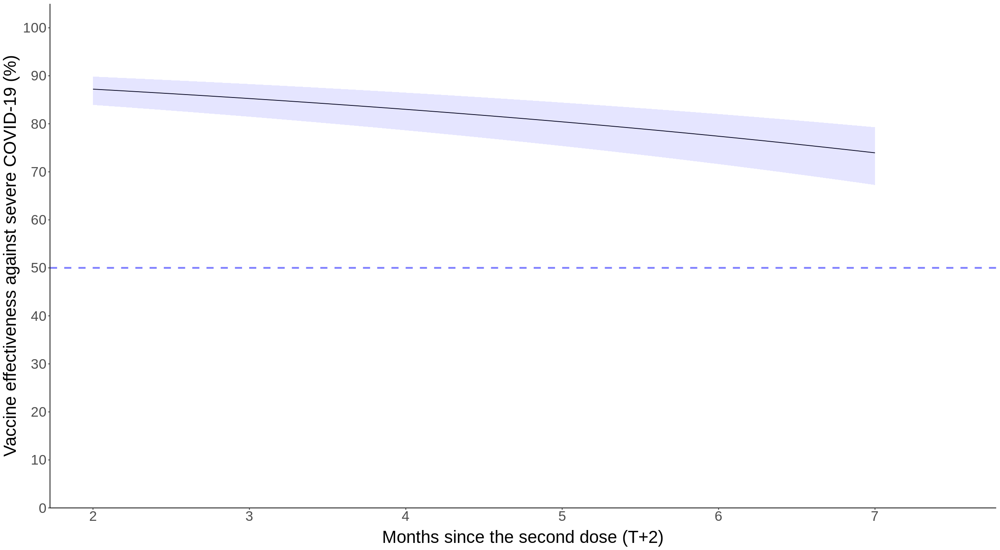


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_spsppz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.1809  -0.1621   0.0000   0.0000  29.1985  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.478240   0.112941 -75.068  < 2e-16 ***
vac_typeSP-SP-PZ        -0.590690   0.228799  -2.582 0.009832 ** 
month                   -0.060890   0.006180  -9.853  < 2e-16 ***
maleTRUE                 0.580395   0.024924  23.286  < 2e-16 ***
provinceกระบี่            -1.567347   0.238144  -6.581 4.66e-11 ***
provinceกาญจนบุรี          0.043493   0.111983   0.388 0.697731    
provinceกาฬสินธุ์          -2.487887   0.244937 -10.157  < 2e-16 ***
provinceกำแพงเพชร       -1.048689   0.177471  -5.909 3.44e-09 ***
provinceขอนแก่น          -1.224468   0.087656 -13.969  < 2e-16 ***
provinceจันทบุรี           -0.342266   0.135767  -2.521 0.0

[1] 0.3537631 0.5539450 0.8674027

[1] 13.25973 44.60550 64.62369

[1] 0.3366288 0.4719184 0.6615803

[1] 33.84197 52.80816 66.33712

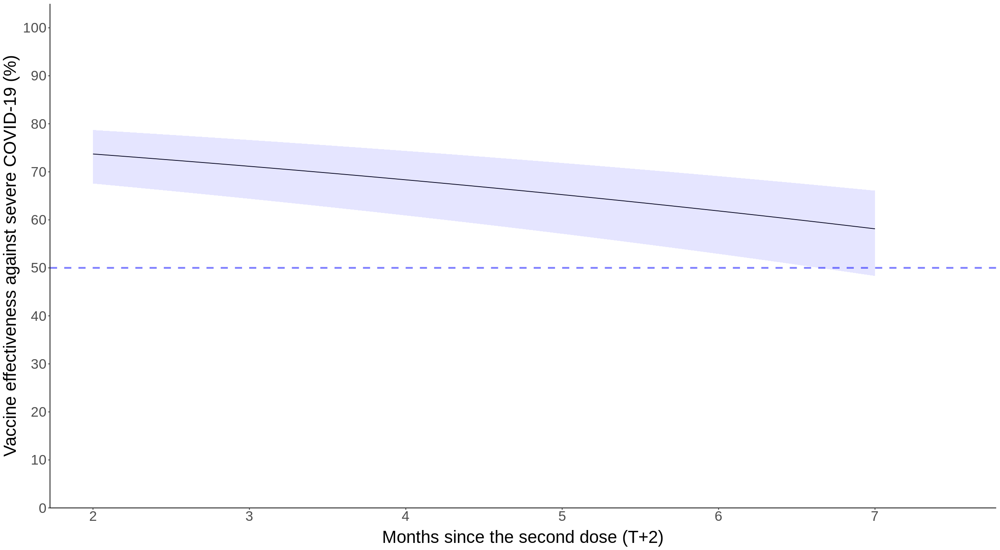

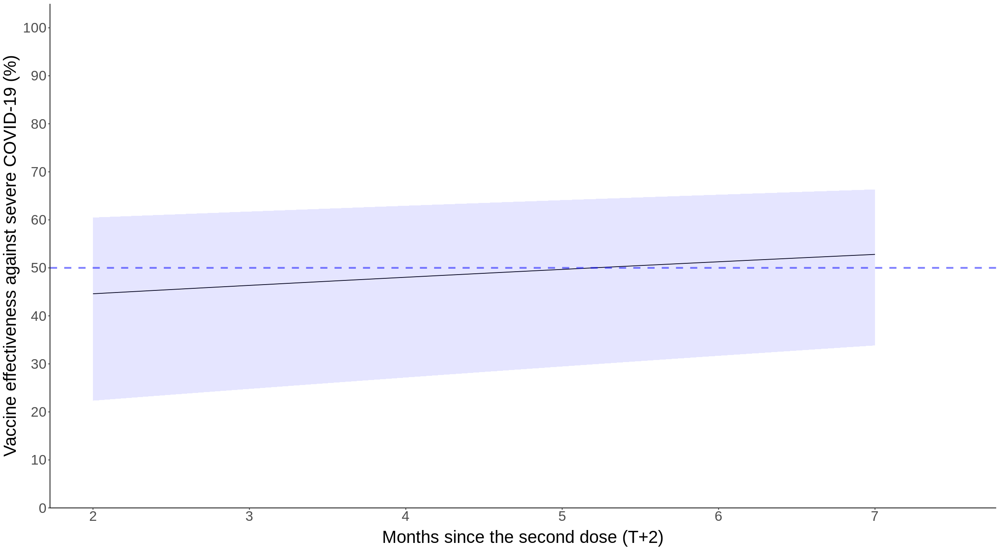

In [169]:
#Stratified by age group: 18-40
d3_s_spsppz_18_40<-d3_s_spsppz[agegroup=="18-40"]

model_d3_s_spsppz_inter_18_40<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_spsppz_18_40)
summary(model_d3_s_spsppz_inter_18_40)

#Initial OR
exp(summary(model_d3_s_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ",2])

#Initial VE
(1-exp(summary(model_d3_s_spsppz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_spsppz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_spsppz_18_40 <- sqrt(vcov(model_d3_s_spsppz_inter_18_40)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ"] + 
                        vcov(model_d3_s_spsppz_inter_18_40)["vac_typeSP-SP-PZ:month","vac_typeSP-SP-PZ:month"]+ 
                        2*vcov(model_d3_s_spsppz_inter_18_40)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"])

exp(summary(model_d3_s_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ",1]+
      summary(model_d3_s_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_spsppz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ",1]+
         summary(model_d3_s_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_spsppz_18_40))*100

#VE overtime
ve_spsppz_18_40<-NULL
for(i in 0:500){
  ve_spsppz_18_40<-rbind(ve_spsppz_18_40,(1-exp(summary(model_d3_s_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ",1]+
                                              summary(model_d3_s_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_spsppz_18_40))*100)
}

ve_spsppz_18_40<-cbind(0:500/100,ve_spsppz_18_40)

ve_spsppz_18_40<-as.data.frame(ve_spsppz_18_40)
names(ve_spsppz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_spsppz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d3_s_spsppz_41_60<-d3_s_spsppz[agegroup=="41-60"]

model_d3_s_spsppz_inter_41_60<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_spsppz_41_60)
summary(model_d3_s_spsppz_inter_41_60)

#Initial OR
exp(summary(model_d3_s_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ",2])

#initial VE
(1-exp(summary(model_d3_s_spsppz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_spsppz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_spsppz_41_60 <- sqrt(vcov(model_d3_s_spsppz_inter_41_60)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ"] + 
                        vcov(model_d3_s_spsppz_inter_41_60)["vac_typeSP-SP-PZ:month","vac_typeSP-SP-PZ:month"]+ 
                        2*vcov(model_d3_s_spsppz_inter_41_60)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"])

exp(summary(model_d3_s_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ",1]+
      summary(model_d3_s_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_spsppz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ",1]+
         summary(model_d3_s_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_spsppz_41_60))*100

#VE overtime
ve_spsppz_41_60<-NULL
for(i in 0:500){
  ve_spsppz_41_60<-rbind(ve_spsppz_41_60,(1-exp(summary(model_d3_s_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ",1]+
                                              summary(model_d3_s_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_spsppz_41_60))*100)
}

ve_spsppz_41_60<-cbind(0:500/100,ve_spsppz_41_60)

ve_spsppz_41_60<-as.data.frame(ve_spsppz_41_60)
names(ve_spsppz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_spsppz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d3_s_spsppz_61_80<-d3_s_spsppz[agegroup=="61-80"]

model_d3_s_spsppz_inter_61_80<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_spsppz_61_80)
summary(model_d3_s_spsppz_inter_61_80)

#Initial OR
exp(summary(model_d3_s_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ",2])

#initial VE
(1-exp(summary(model_d3_s_spsppz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_spsppz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_spsppz_61_80 <- sqrt(vcov(model_d3_s_spsppz_inter_61_80)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ"] + 
                        vcov(model_d3_s_spsppz_inter_61_80)["vac_typeSP-SP-PZ:month","vac_typeSP-SP-PZ:month"]+ 
                        2*vcov(model_d3_s_spsppz_inter_61_80)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"])

exp(summary(model_d3_s_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ",1]+
      summary(model_d3_s_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_spsppz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ",1]+
         summary(model_d3_s_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_spsppz_61_80))*100

#VE overtime
ve_spsppz_61_80<-NULL
for(i in 0:500){
  ve_spsppz_61_80<-rbind(ve_spsppz_61_80,(1-exp(summary(model_d3_s_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ",1]+
                                              summary(model_d3_s_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_spsppz_61_80))*100)
}

ve_spsppz_61_80<-cbind(0:500/100,ve_spsppz_61_80)

ve_spsppz_61_80<-as.data.frame(ve_spsppz_61_80)
names(ve_spsppz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_spsppz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d3_s_spsppz_81_100<-d3_s_spsppz[agegroup=="Over 80"]

model_d3_s_spsppz_inter_81_100<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_spsppz_81_100)
summary(model_d3_s_spsppz_inter_81_100)

#Initial OR
exp(summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",2])

#initial VE
(1-exp(summary(model_d3_s_spsppz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_spsppz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_spsppz_81_100 <- sqrt(vcov(model_d3_s_spsppz_inter_81_100)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ"] + 
                        vcov(model_d3_s_spsppz_inter_81_100)["vac_typeSP-SP-PZ:month","vac_typeSP-SP-PZ:month"]+ 
                        2*vcov(model_d3_s_spsppz_inter_81_100)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"])

exp(summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+
      summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_spsppz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+
         summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_spsppz_81_100))*100

#VE overtime
ve_spsppz_81_100<-NULL
for(i in 0:500){
  ve_spsppz_81_100<-rbind(ve_spsppz_81_100,(1-exp(summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+
                                              summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_spsppz_81_100))*100)
}

ve_spsppz_81_100<-cbind(0:500/100,ve_spsppz_81_100)

ve_spsppz_81_100<-as.data.frame(ve_spsppz_81_100)
names(ve_spsppz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_spsppz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [170]:
summary(model_d3_s_spsppz_inter_81_100)

#Initial OR
exp(summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",2])

#initial VE
(1-exp(summary(model_d3_s_spsppz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_spsppz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_spsppz_81_100 <- sqrt(vcov(model_d3_s_spsppz_inter_81_100)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ"] + 
                        vcov(model_d3_s_spsppz_inter_81_100)["vac_typeSP-SP-PZ:month","vac_typeSP-SP-PZ:month"]+ 
                        2*vcov(model_d3_s_spsppz_inter_81_100)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"])

exp(summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+
      summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_spsppz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+
         summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_spsppz_81_100))*100


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_spsppz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.1809  -0.1621   0.0000   0.0000  29.1985  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.478240   0.112941 -75.068  < 2e-16 ***
vac_typeSP-SP-PZ        -0.590690   0.228799  -2.582 0.009832 ** 
month                   -0.060890   0.006180  -9.853  < 2e-16 ***
maleTRUE                 0.580395   0.024924  23.286  < 2e-16 ***
provinceกระบี่            -1.567347   0.238144  -6.581 4.66e-11 ***
provinceกาญจนบุรี          0.043493   0.111983   0.388 0.697731    
provinceกาฬสินธุ์          -2.487887   0.244937 -10.157  < 2e-16 ***
provinceกำแพงเพชร       -1.048689   0.177471  -5.909 3.44e-09 ***
provinceขอนแก่น          -1.224468   0.087656 -13.969  < 2e-16 ***
provinceจันทบุรี           -0.342266   0.135767  -2.521 0.0

[1] 0.3537631 0.5539450 0.8674027

[1] 13.25973 44.60550 64.62369

[1] 0.3366288 0.4719184 0.6615803

[1] 33.84197 52.80816 66.33712

In [171]:
exp(summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",2])

[1] 0.3537631 0.5539450 0.8674027

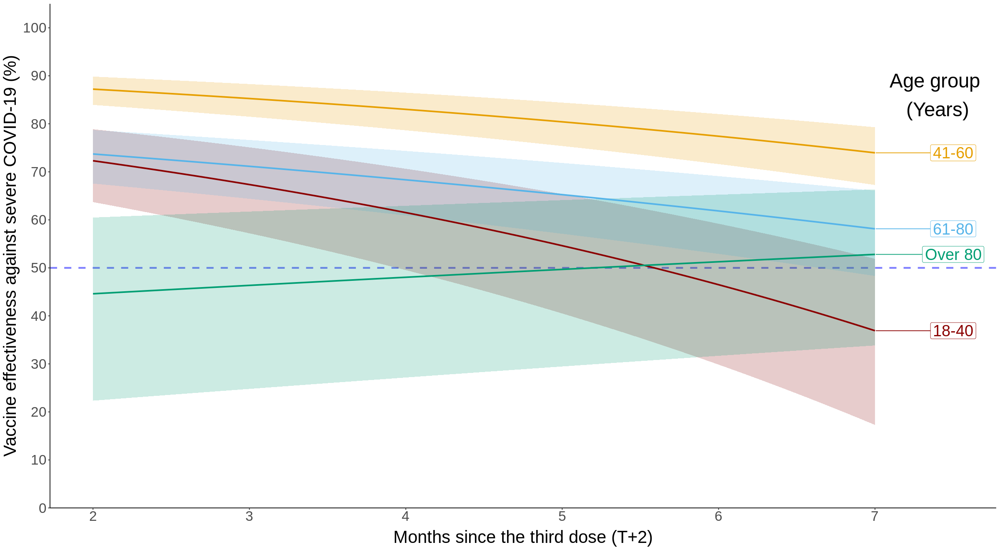

In [172]:
ve_spsppz_18_40$Age<-"18-40"
ve_spsppz_41_60$Age<-"41-60"
ve_spsppz_61_80$Age<-"61-80"
ve_spsppz_81_100$Age<-"Over 80"
ve_spsppz_all<-rbind(ve_spsppz_18_40,ve_spsppz_41_60,ve_spsppz_61_80,ve_spsppz_81_100)
ve_spsppz_all<-as.data.table(ve_spsppz_all)

ggplot(ve_spsppz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_spsppz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_spsppz_all$month)+2),limits = c(2,max(ve_spsppz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=86, label= "Age group \n(Years)",size=10)

**AZ-AZ-PZ**

In [173]:
d3_s_azazpz<-d3_s[vac_type %in% c("None","AZ-AZ-PZ")]

In [174]:
model_d3_s_azazpz_inter<-glm(severe ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d3_s_azazpz)

In [175]:
summary(model_d3_s_azazpz_inter)


Call:
glm(formula = severe ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d3_s_azazpz, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.078   -0.236    0.000    0.000   60.129  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -11.093406   0.029222 -379.620  < 2e-16 ***
vac_typeAZ-AZ-PZ        -2.006207   0.046197  -43.428  < 2e-16 ***
month                   -0.096719   0.002768  -34.936  < 2e-16 ***
maleTRUE                 0.360684   0.009201   39.199  < 2e-16 ***
agegroup41-60            1.152246   0.015024   76.693  < 2e-16 ***
agegroup61-80            2.322132   0.014842  156.461  < 2e-16 ***
agegroupOver 80          3.693631   0.017771  207.845  < 2e-16 ***
provinceกระบี่            -0.935655   0.074134  -12.621  < 2e-16 ***
provinceกาญจนบุรี          0.194329   0.035271    5.510 3.60e-08 ***
provinceกาฬสินธุ์          -1.225366   0.051751  

In [176]:
car::vif(model_d3_s_azazpz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.697574,1,1.642429
month,4.574936,1,2.138910
male,1.004665,1,1.002330
agegroup,1.037857,3,1.006212
province,1.089550,76,1.000564
inf_date,4.756153,12,1.067134
vac_type:month,2.067884,1,1.438014


Initial OR

In [177]:
exp(summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",2])

[1] 0.1228550 0.1344979 0.1472442

Initial VE

In [178]:
(1-exp(summary(model_d3_s_azazpz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_azazpz_inter)$coef[2,2]))*100

[1] 85.27558 86.55021 87.71450

In [179]:
se_azazpz <- sqrt(vcov(model_d3_s_azazpz_inter)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ"] + 
                  vcov(model_d3_s_azazpz_inter)["vac_typeAZ-AZ-PZ:month","vac_typeAZ-AZ-PZ:month"]+ 
                  2*vcov(model_d3_s_azazpz_inter)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"])
se_azazpz

[1] 0.03631244

In [180]:
sqrt(sum(vcov(model_d3_s_azazpz_inter)[c("vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"),c("vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month")]))

[1] 0.03631244

OR at one year

In [181]:
exp(summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+
      summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazpz)

[1] 0.2640419 0.2835189 0.3044327

In [182]:
evalues.OR(exp(summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",2])[2], 
exp(summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",2])[1], 
exp(summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.3655021,-0.377145,-0.3527558
E-values,10.9378625,NA,9.6487690


VE at one year

In [183]:
(1-exp(summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+
         summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazpz))*100

[1] 69.55673 71.64811 73.59581

VE over time within a year

In [184]:
ve_azazpz<-NULL
for(i in 0:500){
  ve_azazpz<-rbind(ve_azazpz,(1-exp(summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+
                                  summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_azazpz))*100)
}

In [185]:
ve_azazpz<-cbind(0:500/100,ve_azazpz)
ve_azazpz<-as.data.frame(ve_azazpz)
names(ve_azazpz)<-c("month","lower","estimate","upper")

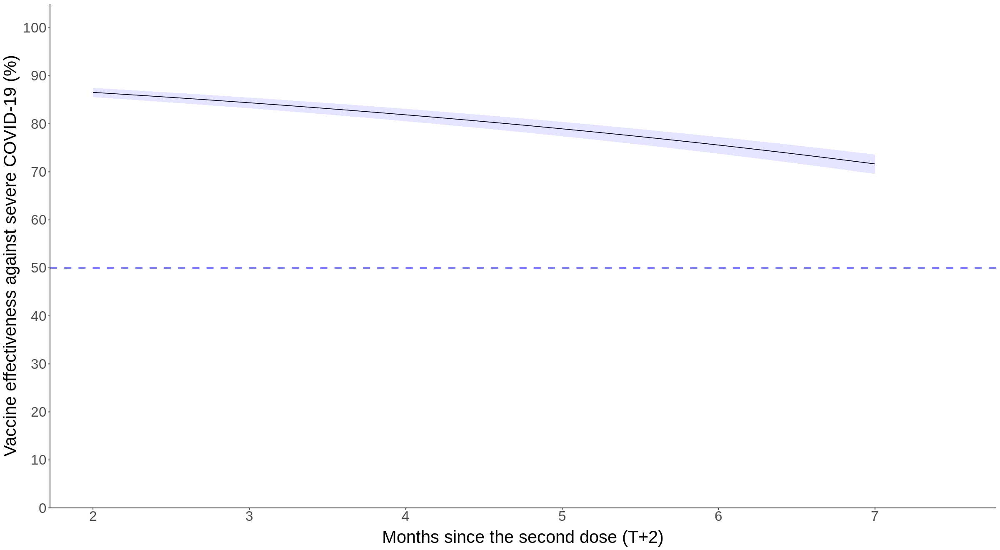

In [186]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azazpz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [187]:
(log(0.5)-summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]-qnorm(c(0.975,0.50,0.025))*se_azazpz)/summary(model_d3_s_azazpz_inter)$coef["vac_typeAZ-AZ-PZ:month",1]+2

[1] 10.32666 10.80385 11.28104

*Stratified by age group*


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_azazpz_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-5.7098  -0.1454   0.0000   0.0000  21.2465  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -10.781669   0.070152 -153.690  < 2e-16 ***
vac_typeAZ-AZ-PZ        -1.582342   0.173602   -9.115  < 2e-16 ***
month                   -0.071413   0.008645   -8.260  < 2e-16 ***
maleTRUE                 0.033771   0.025644    1.317 0.187861    
provinceกระบี่            -0.436859   0.180916   -2.415 0.015748 *  
provinceกาญจนบุรี          0.810506   0.086303    9.391  < 2e-16 ***
provinceกาฬสินธุ์          -0.646554   0.143597   -4.503 6.71e-06 ***
provinceกำแพงเพชร       -0.251693   0.137201   -1.834 0.066583 .  
provinceขอนแก่น          -0.267693   0.095871   -2.792 0.005235 ** 
provinceจันทบุรี            0.419550   0.117487   

[1] 0.1462270 0.2054932 0.2887802

[1] 71.12198 79.45068 85.37730

[1] 0.8209868 1.0617132 1.3730244

[1] -37.30244  -6.17132  17.90132

Warning message:
“Removed 19 rows containing missing values (`geom_line()`).”



Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_azazpz_41_60, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-10.812   -0.232    0.000    0.000   44.911  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.703514   0.042928 -226.040  < 2e-16 ***
vac_typeAZ-AZ-PZ       -2.210762   0.109150  -20.254  < 2e-16 ***
month                  -0.102919   0.005168  -19.913  < 2e-16 ***
maleTRUE                0.262916   0.015724   16.721  < 2e-16 ***
provinceกระบี่           -1.038117   0.142857   -7.267 3.68e-13 ***
provinceกาญจนบุรี         0.328958   0.060459    5.441 5.30e-08 ***
provinceกาฬสินธุ์         -0.801607   0.079413  -10.094  < 2e-16 ***
provinceกำแพงเพชร      -0.289358   0.077365   -3.740 0.000184 ***
provinceขอนแก่น         -0.715213   0.060603  -11.802  < 2e-16 ***
provinceจันทบุรี           0.023105   0.077387    0.299 0.76

[1] 0.08850532 0.10961707 0.13576475

[1] 86.42352 89.03829 91.14947

[1] 0.2543569 0.2990882 0.3516859

[1] 64.83141 70.09118 74.56431

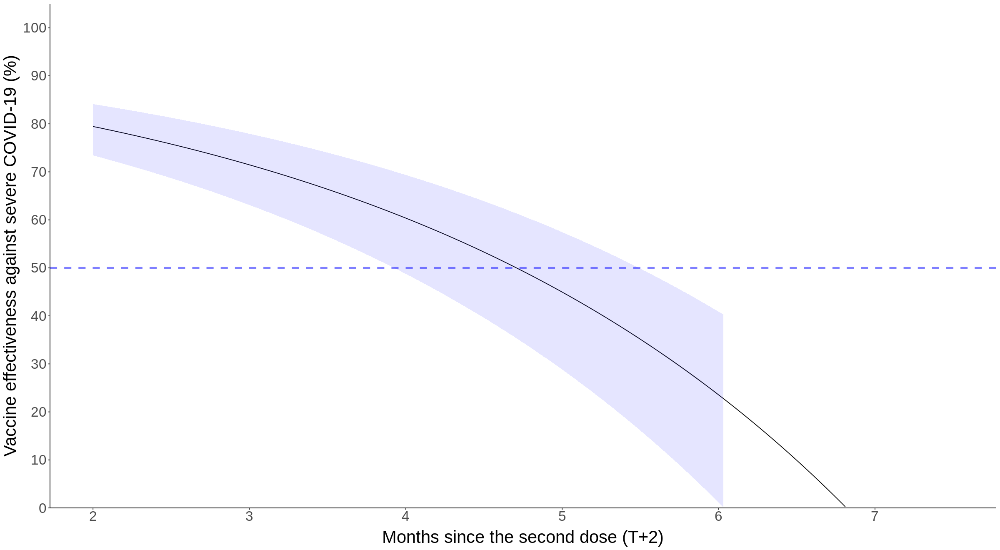


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_azazpz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.283   -0.356    0.000    0.000   60.014  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.071164   0.046891 -193.453  < 2e-16 ***
vac_typeAZ-AZ-PZ       -2.355675   0.065371  -36.035  < 2e-16 ***
month                  -0.119735   0.004297  -27.866  < 2e-16 ***
maleTRUE                0.478827   0.014766   32.427  < 2e-16 ***
provinceกระบี่           -0.758752   0.109230   -6.946 3.75e-12 ***
provinceกาญจนบุรี        -0.047730   0.059219   -0.806 0.420248    
provinceกาฬสินธุ์         -1.490810   0.084112  -17.724  < 2e-16 ***
provinceกำแพงเพชร      -0.886451   0.086560  -10.241  < 2e-16 ***
provinceขอนแก่น         -0.954917   0.047003  -20.316  < 2e-16 ***
provinceจันทบุรี          -0.679188   0.088004   -7.718 1.18

[1] 0.08342566 0.09482951 0.10779220

[1] 89.22078 90.51705 91.65743

[1] 0.1460404 0.1618812 0.1794403

[1] 82.05597 83.81188 85.39596

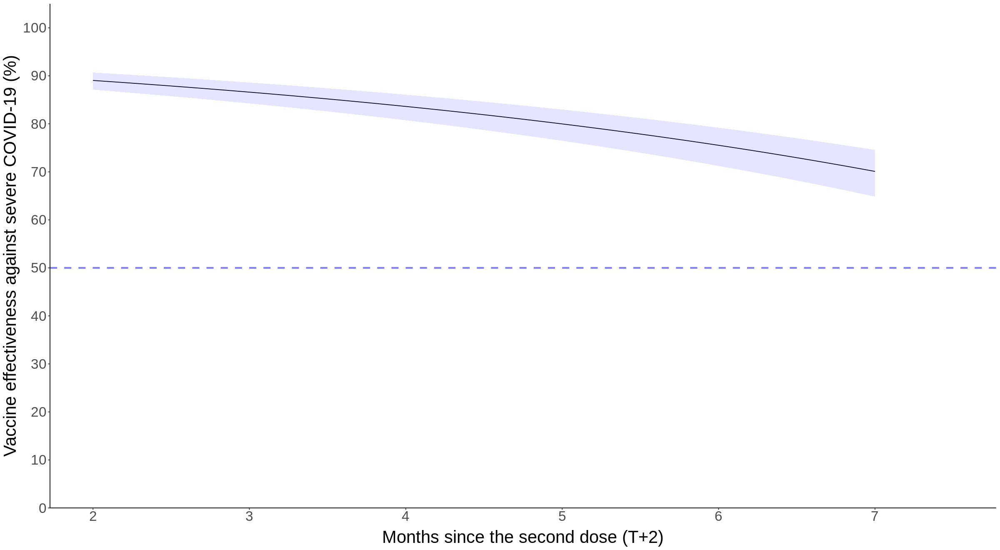


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_azazpz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.0197  -0.2341   0.0000   0.0000  29.2452  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.505498   0.112688 -75.478  < 2e-16 ***
vac_typeAZ-AZ-PZ        -1.669534   0.097613 -17.104  < 2e-16 ***
month                   -0.061916   0.006129 -10.102  < 2e-16 ***
maleTRUE                 0.586191   0.024429  23.996  < 2e-16 ***
provinceกระบี่            -1.563465   0.237973  -6.570 5.03e-11 ***
provinceกาญจนบุรี          0.051490   0.111564   0.462 0.644419    
provinceกาฬสินธุ์          -2.464857   0.244803 -10.069  < 2e-16 ***
provinceกำแพงเพชร       -0.975140   0.172306  -5.659 1.52e-08 ***
provinceขอนแก่น          -1.200848   0.087270 -13.760  < 2e-16 ***
provinceจันทบุรี           -0.339888   0.135445  -2.509 0.0

[1] 0.1555401 0.1883347 0.2280439

[1] 77.19561 81.16653 84.44599

[1] 0.3109228 0.3617888 0.4209763

[1] 57.90237 63.82112 68.90772

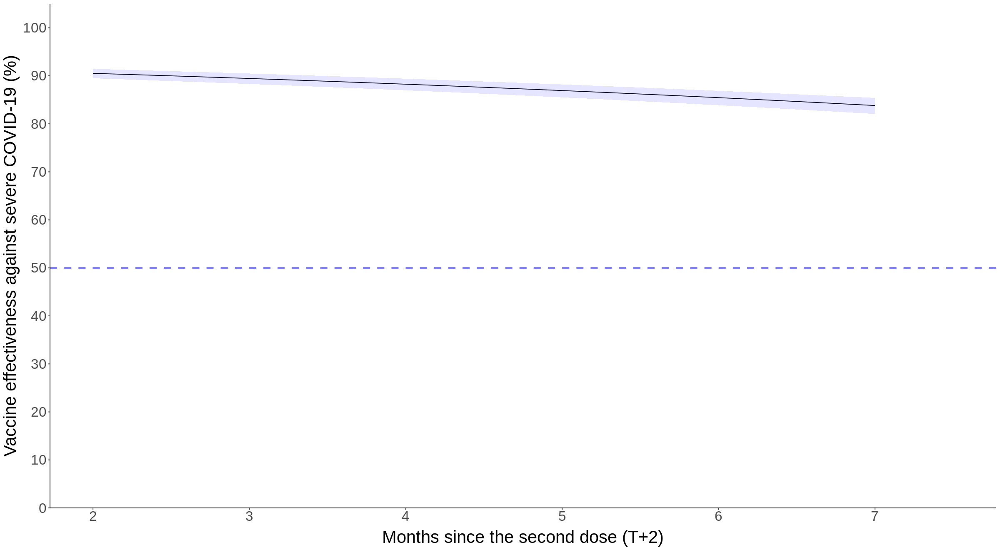

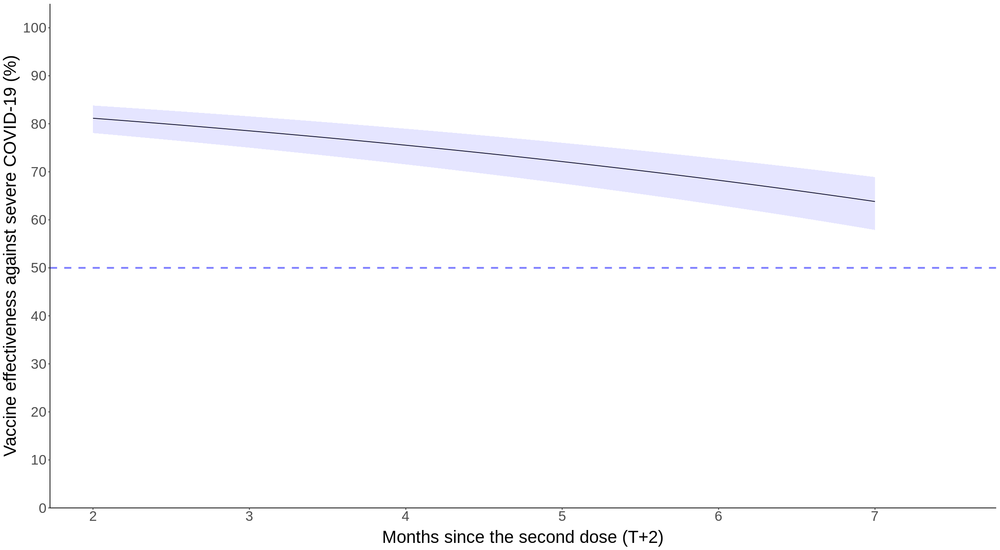

In [188]:
#Stratified by age group: 18-40
d3_s_azazpz_18_40<-d3_s_azazpz[agegroup=="18-40"]

model_d3_s_azazpz_inter_18_40<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_azazpz_18_40)
summary(model_d3_s_azazpz_inter_18_40)

#Initial OR
exp(summary(model_d3_s_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ",2])

#Initial VE
(1-exp(summary(model_d3_s_azazpz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_azazpz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazpz_18_40 <- sqrt(vcov(model_d3_s_azazpz_inter_18_40)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ"] + 
                        vcov(model_d3_s_azazpz_inter_18_40)["vac_typeAZ-AZ-PZ:month","vac_typeAZ-AZ-PZ:month"]+ 
                        2*vcov(model_d3_s_azazpz_inter_18_40)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"])

exp(summary(model_d3_s_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ",1]+
      summary(model_d3_s_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazpz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ",1]+
         summary(model_d3_s_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazpz_18_40))*100

#VE overtime
ve_azazpz_18_40<-NULL
for(i in 0:500){
  ve_azazpz_18_40<-rbind(ve_azazpz_18_40,(1-exp(summary(model_d3_s_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ",1]+
                                              summary(model_d3_s_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazpz_18_40))*100)
}

ve_azazpz_18_40<-cbind(0:500/100,ve_azazpz_18_40)

ve_azazpz_18_40<-as.data.frame(ve_azazpz_18_40)
names(ve_azazpz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azazpz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d3_s_azazpz_41_60<-d3_s_azazpz[agegroup=="41-60"]

model_d3_s_azazpz_inter_41_60<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_azazpz_41_60)
summary(model_d3_s_azazpz_inter_41_60)

#Initial OR
exp(summary(model_d3_s_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_s_azazpz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_azazpz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazpz_41_60 <- sqrt(vcov(model_d3_s_azazpz_inter_41_60)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ"] + 
                        vcov(model_d3_s_azazpz_inter_41_60)["vac_typeAZ-AZ-PZ:month","vac_typeAZ-AZ-PZ:month"]+ 
                        2*vcov(model_d3_s_azazpz_inter_41_60)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"])

exp(summary(model_d3_s_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ",1]+
      summary(model_d3_s_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazpz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ",1]+
         summary(model_d3_s_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazpz_41_60))*100

#VE overtime
ve_azazpz_41_60<-NULL
for(i in 0:500){
  ve_azazpz_41_60<-rbind(ve_azazpz_41_60,(1-exp(summary(model_d3_s_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ",1]+
                                              summary(model_d3_s_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazpz_41_60))*100)
}

ve_azazpz_41_60<-cbind(0:500/100,ve_azazpz_41_60)

ve_azazpz_41_60<-as.data.frame(ve_azazpz_41_60)
names(ve_azazpz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azazpz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d3_s_azazpz_61_80<-d3_s_azazpz[agegroup=="61-80"]

model_d3_s_azazpz_inter_61_80<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_azazpz_61_80)
summary(model_d3_s_azazpz_inter_61_80)

#Initial OR
exp(summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_s_azazpz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_azazpz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazpz_61_80 <- sqrt(vcov(model_d3_s_azazpz_inter_61_80)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ"] + 
                        vcov(model_d3_s_azazpz_inter_61_80)["vac_typeAZ-AZ-PZ:month","vac_typeAZ-AZ-PZ:month"]+ 
                        2*vcov(model_d3_s_azazpz_inter_61_80)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"])

exp(summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",1]+
      summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazpz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",1]+
         summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazpz_61_80))*100

#VE overtime
ve_azazpz_61_80<-NULL
for(i in 0:500){
  ve_azazpz_61_80<-rbind(ve_azazpz_61_80,(1-exp(summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",1]+
                                              summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazpz_61_80))*100)
}

ve_azazpz_61_80<-cbind(0:500/100,ve_azazpz_61_80)

ve_azazpz_61_80<-as.data.frame(ve_azazpz_61_80)
names(ve_azazpz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azazpz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d3_s_azazpz_81_100<-d3_s_azazpz[agegroup=="Over 80"]

model_d3_s_azazpz_inter_81_100<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_azazpz_81_100)
summary(model_d3_s_azazpz_inter_81_100)

#Initial OR
exp(summary(model_d3_s_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_s_azazpz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_azazpz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazpz_81_100 <- sqrt(vcov(model_d3_s_azazpz_inter_81_100)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ"] + 
                        vcov(model_d3_s_azazpz_inter_81_100)["vac_typeAZ-AZ-PZ:month","vac_typeAZ-AZ-PZ:month"]+ 
                        2*vcov(model_d3_s_azazpz_inter_81_100)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"])

exp(summary(model_d3_s_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",1]+
      summary(model_d3_s_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazpz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",1]+
         summary(model_d3_s_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazpz_81_100))*100

#VE overtime
ve_azazpz_81_100<-NULL
for(i in 0:500){
  ve_azazpz_81_100<-rbind(ve_azazpz_81_100,(1-exp(summary(model_d3_s_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",1]+
                                              summary(model_d3_s_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazpz_81_100))*100)
}

ve_azazpz_81_100<-cbind(0:500/100,ve_azazpz_81_100)

ve_azazpz_81_100<-as.data.frame(ve_azazpz_81_100)
names(ve_azazpz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azazpz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [189]:
summary(model_d3_s_azazpz_inter_61_80)

#Initial OR
exp(summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_s_azazpz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_azazpz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazpz_61_80 <- sqrt(vcov(model_d3_s_azazpz_inter_61_80)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ"] + 
                        vcov(model_d3_s_azazpz_inter_61_80)["vac_typeAZ-AZ-PZ:month","vac_typeAZ-AZ-PZ:month"]+ 
                        2*vcov(model_d3_s_azazpz_inter_61_80)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"])

exp(summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",1]+
      summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazpz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",1]+
         summary(model_d3_s_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazpz_61_80))*100


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_azazpz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.283   -0.356    0.000    0.000   60.014  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.071164   0.046891 -193.453  < 2e-16 ***
vac_typeAZ-AZ-PZ       -2.355675   0.065371  -36.035  < 2e-16 ***
month                  -0.119735   0.004297  -27.866  < 2e-16 ***
maleTRUE                0.478827   0.014766   32.427  < 2e-16 ***
provinceกระบี่           -0.758752   0.109230   -6.946 3.75e-12 ***
provinceกาญจนบุรี        -0.047730   0.059219   -0.806 0.420248    
provinceกาฬสินธุ์         -1.490810   0.084112  -17.724  < 2e-16 ***
provinceกำแพงเพชร      -0.886451   0.086560  -10.241  < 2e-16 ***
provinceขอนแก่น         -0.954917   0.047003  -20.316  < 2e-16 ***
provinceจันทบุรี          -0.679188   0.088004   -7.718 1.18

[1] 0.08342566 0.09482951 0.10779220

[1] 89.22078 90.51705 91.65743

[1] 0.1460404 0.1618812 0.1794403

[1] 82.05597 83.81188 85.39596

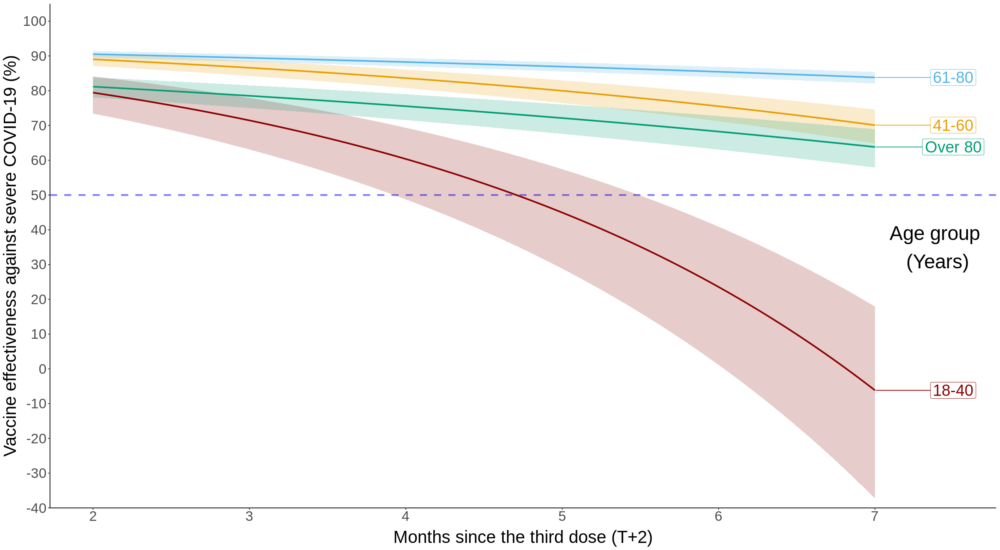

In [190]:
ve_azazpz_18_40$Age<-"18-40"
ve_azazpz_41_60$Age<-"41-60"
ve_azazpz_61_80$Age<-"61-80"
ve_azazpz_81_100$Age<-"Over 80"
ve_azazpz_all<-rbind(ve_azazpz_18_40,ve_azazpz_41_60,ve_azazpz_61_80,ve_azazpz_81_100)
ve_azazpz_all<-as.data.table(ve_azazpz_all)

ggplot(ve_azazpz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_azazpz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_azazpz_all$month)+2),limits = c(2,max(ve_azazpz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-40,105),breaks=c(4:1*-10,0:10*10),name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=35, label= "Age group \n(Years)",size=10)

**AZ-AZ-MN**

In [191]:
d3_s_azazmn<-d3_s[vac_type %in% c("None","AZ-AZ-MN")]

In [192]:
model_d3_s_azazmn_inter<-glm(severe ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d3_s_azazmn)

In [193]:
summary(model_d3_s_azazmn_inter)


Call:
glm(formula = severe ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d3_s_azazmn, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-13.07   -0.15    0.00    0.00   60.13  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -11.092031   0.029426 -376.950  < 2e-16 ***
vac_typeAZ-AZ-MN        -2.193416   0.095864  -22.880  < 2e-16 ***
month                   -0.095992   0.002786  -34.452  < 2e-16 ***
maleTRUE                 0.353317   0.009301   37.986  < 2e-16 ***
agegroup41-60            1.158869   0.015118   76.653  < 2e-16 ***
agegroup61-80            2.326662   0.014958  155.546  < 2e-16 ***
agegroupOver 80          3.684113   0.017978  204.923  < 2e-16 ***
provinceกระบี่            -0.923662   0.074403  -12.414  < 2e-16 ***
provinceกาญจนบุรี          0.203072   0.035528    5.716 1.09e-08 ***
provinceกาฬสินธุ์          -1.220740   0.051853  -23.542  <

In [194]:
car::vif(model_d3_s_azazmn_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.296815,1,1.515525
month,4.508114,1,2.123232
male,1.004745,1,1.002369
agegroup,1.034558,3,1.005678
province,1.072061,76,1.000458
inf_date,4.576978,12,1.065428
vac_type:month,2.168735,1,1.472663


Initial OR

In [195]:
exp(summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN",2])

[1] 0.09242975 0.11153513 0.13458962

Initial VE

In [196]:
(1-exp(summary(model_d3_s_azazmn_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_azazmn_inter)$coef[2,2]))*100

[1] 86.54104 88.84649 90.75703

In [197]:
se_azazmn <- sqrt(vcov(model_d3_s_azazmn_inter)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN"] + 
                  vcov(model_d3_s_azazmn_inter)["vac_typeAZ-AZ-MN:month","vac_typeAZ-AZ-MN:month"]+ 
                  2*vcov(model_d3_s_azazmn_inter)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"])
se_azazmn

[1] 0.07060148

In [198]:
sqrt(sum(vcov(model_d3_s_azazmn_inter)[c("vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"),c("vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month")]))

[1] 0.07060148

OR at one year

In [199]:
exp(summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+
      summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazmn)

[1] 0.2406297 0.2763410 0.3173521

In [200]:
evalues.OR(exp(summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN",2])[2], 
exp(summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN",2])[1], 
exp(summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.3884649,-0.4075703,-0.3654104
E-values,14.0025786,NA,10.9277120


VE at one year

In [201]:
(1-exp(summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+
         summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazmn))*100

[1] 68.26479 72.36590 75.93703

VE overtime within a year

In [202]:
ve_azazmn<-NULL
for(i in 0:500){
  ve_azazmn<-rbind(ve_azazmn,(1-exp(summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+
                                  summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_azazmn))*100)
}

In [203]:
ve_azazmn<-cbind(0:500/100,ve_azazmn)
ve_azazmn<-as.data.frame(ve_azazmn)
names(ve_azazmn)<-c("month","lower","estimate","upper")

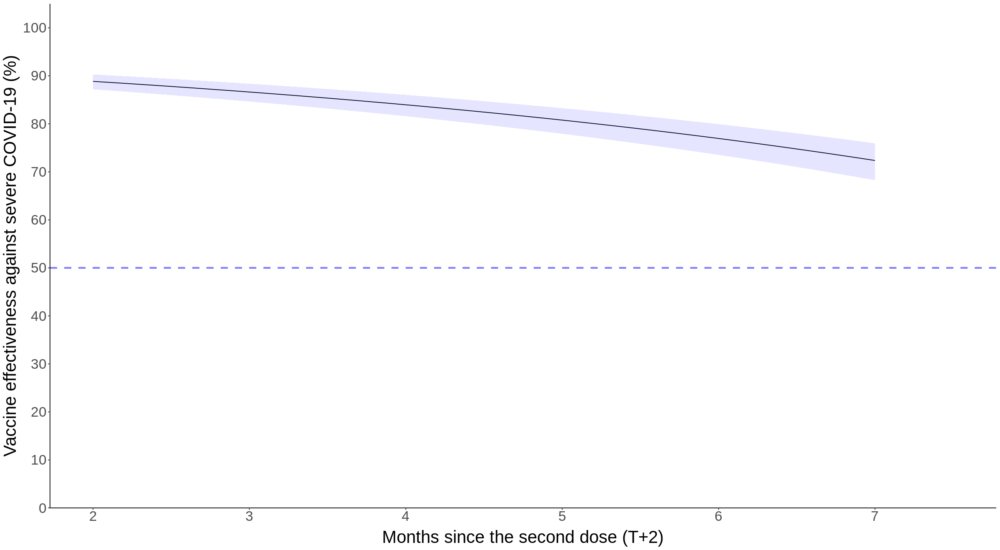

In [204]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azazmn,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [205]:
(log(0.5)-summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]-qnorm(c(0.975,0.50,0.025))*se_azazmn)/summary(model_d3_s_azazmn_inter)$coef["vac_typeAZ-AZ-MN:month",1]+2

[1]  9.505226 10.267802 11.030378

*Stratified by age group*


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_azazmn_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-5.6589  -0.0774   0.0000   0.0000  21.2774  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -10.799597   0.071161 -151.763  < 2e-16 ***
vac_typeAZ-AZ-MN        -2.627893   0.490052   -5.362 8.21e-08 ***
month                   -0.071245   0.008677   -8.211  < 2e-16 ***
maleTRUE                 0.020371   0.025807    0.789 0.429896    
provinceกระบี่            -0.403029   0.181343   -2.222 0.026252 *  
provinceกาญจนบุรี          0.835789   0.087490    9.553  < 2e-16 ***
provinceกาฬสินธุ์          -0.613970   0.144131   -4.260 2.05e-05 ***
provinceกำแพงเพชร       -0.218993   0.137759   -1.590 0.111906    
provinceขอนแก่น          -0.236614   0.096660   -2.448 0.014369 *  
provinceจันทบุรี            0.450355   0.118132   

[1] 0.02764316 0.07223048 0.18873540

[1] 81.12646 92.77695 97.23568

[1] 0.3276596 0.6546848 1.3081019

[1] -30.81019  34.53152  67.23404


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_azazmn_41_60, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-10.745   -0.129    0.000    0.000   44.941  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.711484   0.043293 -224.321  < 2e-16 ***
vac_typeAZ-AZ-MN       -2.578776   0.258924   -9.960  < 2e-16 ***
month                  -0.101306   0.005190  -19.519  < 2e-16 ***
maleTRUE                0.257801   0.015805   16.311  < 2e-16 ***
provinceกระบี่           -1.038411   0.144348   -7.194 6.30e-13 ***
provinceกาญจนบุรี         0.347552   0.060752    5.721 1.06e-08 ***
provinceกาฬสินธุ์         -0.785935   0.079629   -9.870  < 2e-16 ***
provinceกำแพงเพชร      -0.282634   0.077940   -3.626 0.000287 ***
provinceขอนแก่น         -0.700125   0.060882  -11.500  < 2e-16 ***
provinceจันทบุรี           0.039467   0.077611    0.509 0.61

[1] 0.04567260 0.07586684 0.12602255

[1] 87.39775 92.41332 95.43274

[1] 0.1602154 0.2313528 0.3340761

[1] 66.59239 76.86472 83.97846

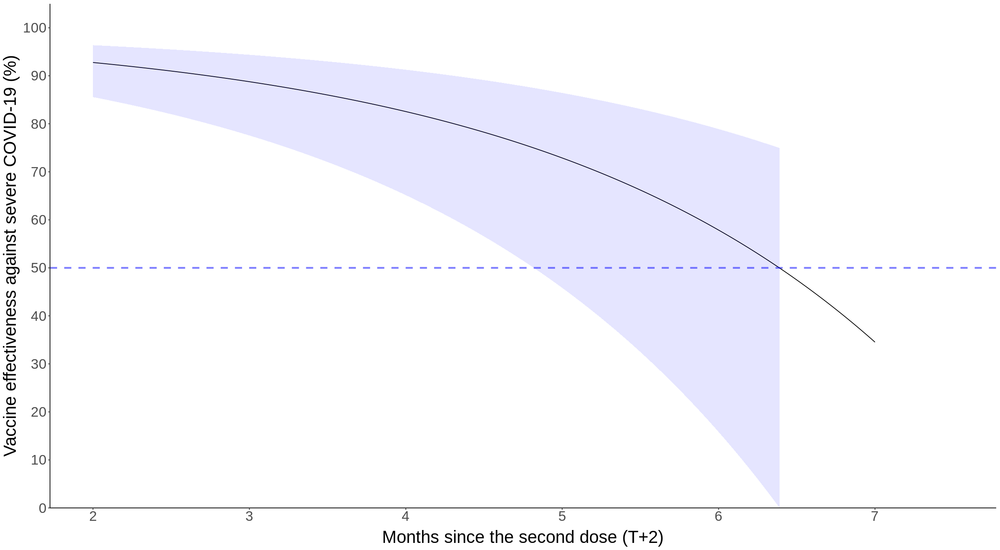


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_azazmn_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-13.335   -0.215    0.000    0.000   59.985  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -9.060045   0.047105 -192.337  < 2e-16 ***
vac_typeAZ-AZ-MN       -2.515729   0.132296  -19.016  < 2e-16 ***
month                  -0.120410   0.004326  -27.836  < 2e-16 ***
maleTRUE                0.474639   0.014990   31.664  < 2e-16 ***
provinceกระบี่           -0.742392   0.109356   -6.789 1.13e-11 ***
provinceกาญจนบุรี        -0.048782   0.059759   -0.816  0.41432    
provinceกาฬสินธุ์         -1.496718   0.084244  -17.766  < 2e-16 ***
provinceกำแพงเพชร      -0.944507   0.089091  -10.602  < 2e-16 ***
provinceขอนแก่น         -0.965597   0.047302  -20.414  < 2e-16 ***
provinceจันทบุรี          -0.671056   0.088151   -7.613 2.69

[1] 0.06234800 0.08080399 0.10472324

[1] 89.52768 91.91960 93.76520

[1] 0.1088066 0.1320412 0.1602371

[1] 83.97629 86.79588 89.11934

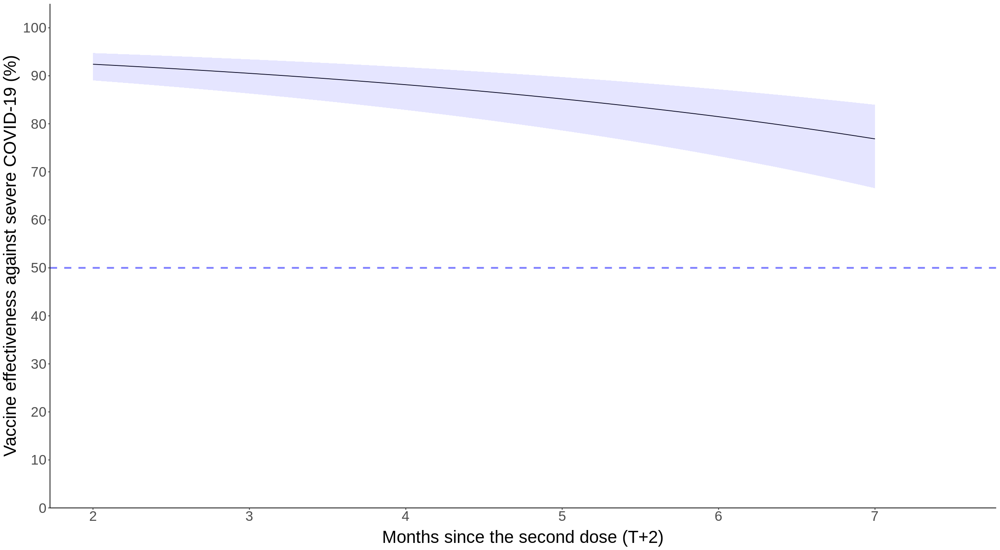


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_azazmn_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.0988  -0.1438   0.0000   0.0000  29.2170  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.490327   0.112908 -75.197  < 2e-16 ***
vac_typeAZ-AZ-MN        -1.646178   0.178447  -9.225  < 2e-16 ***
month                   -0.060921   0.006175  -9.866  < 2e-16 ***
maleTRUE                 0.583679   0.024845  23.493  < 2e-16 ***
provinceกระบี่            -1.555661   0.238122  -6.533 6.44e-11 ***
provinceกาญจนบุรี          0.065912   0.111903   0.589 0.555855    
provinceกาฬสินธุ์          -2.477149   0.244915 -10.114  < 2e-16 ***
provinceกำแพงเพชร       -1.036411   0.177442  -5.841 5.19e-09 ***
provinceขอนแก่น          -1.212705   0.087588 -13.845  < 2e-16 ***
provinceจันทบุรี           -0.384662   0.139134  -2.765 0.0

[1] 0.1358875 0.1927853 0.2735068

[1] 72.64932 80.72147 86.41125

[1] 0.4055080 0.5259117 0.6820656

[1] 31.79344 47.40883 59.44920

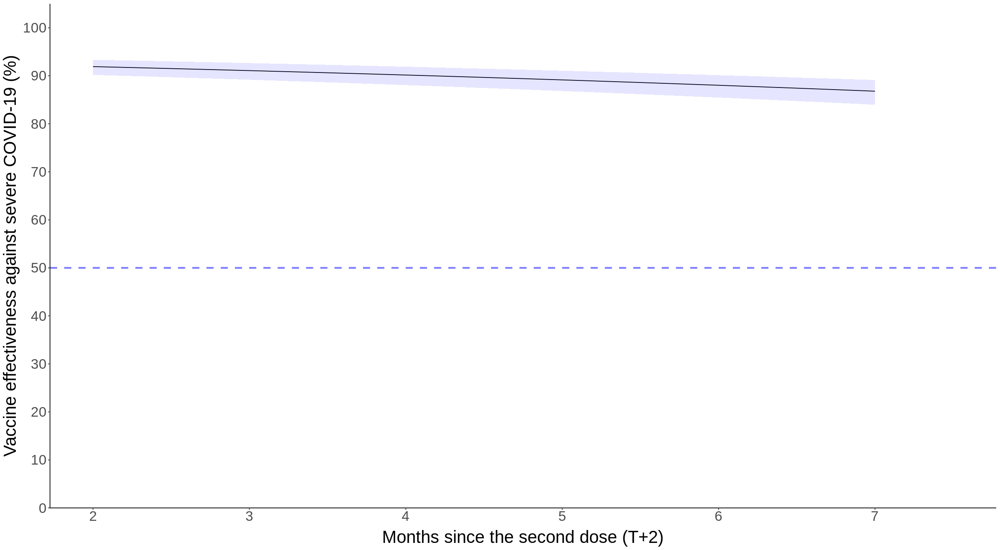

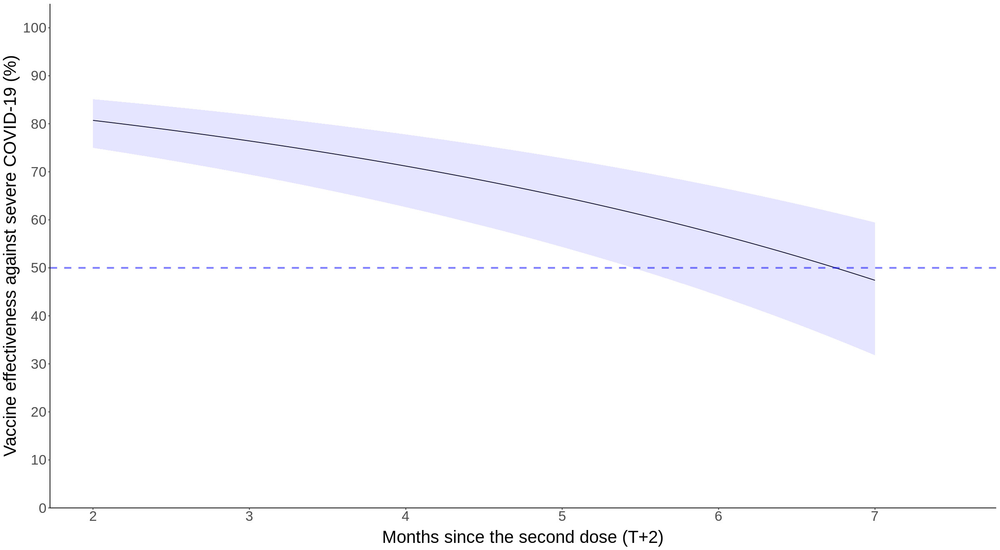

In [206]:
#Stratified by age group: 18-40
d3_s_azazmn_18_40<-d3_s_azazmn[agegroup=="18-40"]

model_d3_s_azazmn_inter_18_40<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_azazmn_18_40)
summary(model_d3_s_azazmn_inter_18_40)

#Initial OR
exp(summary(model_d3_s_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN",2])

#Initial VE
(1-exp(summary(model_d3_s_azazmn_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_azazmn_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazmn_18_40 <- sqrt(vcov(model_d3_s_azazmn_inter_18_40)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN"] + 
                        vcov(model_d3_s_azazmn_inter_18_40)["vac_typeAZ-AZ-MN:month","vac_typeAZ-AZ-MN:month"]+ 
                        2*vcov(model_d3_s_azazmn_inter_18_40)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"])

exp(summary(model_d3_s_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN",1]+
      summary(model_d3_s_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazmn_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN",1]+
         summary(model_d3_s_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazmn_18_40))*100

#VE overtime
ve_azazmn_18_40<-NULL
for(i in 0:500){
  ve_azazmn_18_40<-rbind(ve_azazmn_18_40,(1-exp(summary(model_d3_s_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN",1]+
                                              summary(model_d3_s_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazmn_18_40))*100)
}

ve_azazmn_18_40<-cbind(0:500/100,ve_azazmn_18_40)

ve_azazmn_18_40<-as.data.frame(ve_azazmn_18_40)
names(ve_azazmn_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azazmn_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d3_s_azazmn_41_60<-d3_s_azazmn[agegroup=="41-60"]

model_d3_s_azazmn_inter_41_60<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_azazmn_41_60)
summary(model_d3_s_azazmn_inter_41_60)

#Initial OR
exp(summary(model_d3_s_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN",2])

#initial VE
(1-exp(summary(model_d3_s_azazmn_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_azazmn_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazmn_41_60 <- sqrt(vcov(model_d3_s_azazmn_inter_41_60)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN"] + 
                        vcov(model_d3_s_azazmn_inter_41_60)["vac_typeAZ-AZ-MN:month","vac_typeAZ-AZ-MN:month"]+ 
                        2*vcov(model_d3_s_azazmn_inter_41_60)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"])

exp(summary(model_d3_s_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN",1]+
      summary(model_d3_s_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazmn_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN",1]+
         summary(model_d3_s_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazmn_41_60))*100

#VE overtime
ve_azazmn_41_60<-NULL
for(i in 0:500){
  ve_azazmn_41_60<-rbind(ve_azazmn_41_60,(1-exp(summary(model_d3_s_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN",1]+
                                              summary(model_d3_s_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazmn_41_60))*100)
}

ve_azazmn_41_60<-cbind(0:500/100,ve_azazmn_41_60)

ve_azazmn_41_60<-as.data.frame(ve_azazmn_41_60)
names(ve_azazmn_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azazmn_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d3_s_azazmn_61_80<-d3_s_azazmn[agegroup=="61-80"]

model_d3_s_azazmn_inter_61_80<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_azazmn_61_80)
summary(model_d3_s_azazmn_inter_61_80)

#Initial OR
exp(summary(model_d3_s_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN",2])

#initial VE
(1-exp(summary(model_d3_s_azazmn_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_azazmn_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazmn_61_80 <- sqrt(vcov(model_d3_s_azazmn_inter_61_80)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN"] + 
                        vcov(model_d3_s_azazmn_inter_61_80)["vac_typeAZ-AZ-MN:month","vac_typeAZ-AZ-MN:month"]+ 
                        2*vcov(model_d3_s_azazmn_inter_61_80)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"])

exp(summary(model_d3_s_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN",1]+
      summary(model_d3_s_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazmn_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN",1]+
         summary(model_d3_s_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazmn_61_80))*100

#VE overtime
ve_azazmn_61_80<-NULL
for(i in 0:500){
  ve_azazmn_61_80<-rbind(ve_azazmn_61_80,(1-exp(summary(model_d3_s_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN",1]+
                                              summary(model_d3_s_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazmn_61_80))*100)
}

ve_azazmn_61_80<-cbind(0:500/100,ve_azazmn_61_80)

ve_azazmn_61_80<-as.data.frame(ve_azazmn_61_80)
names(ve_azazmn_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azazmn_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d3_s_azazmn_81_100<-d3_s_azazmn[agegroup=="Over 80"]

model_d3_s_azazmn_inter_81_100<-glm(severe ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_s_azazmn_81_100)
summary(model_d3_s_azazmn_inter_81_100)

#Initial OR
exp(summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",2])

#initial VE
(1-exp(summary(model_d3_s_azazmn_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_azazmn_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazmn_81_100 <- sqrt(vcov(model_d3_s_azazmn_inter_81_100)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN"] + 
                        vcov(model_d3_s_azazmn_inter_81_100)["vac_typeAZ-AZ-MN:month","vac_typeAZ-AZ-MN:month"]+ 
                        2*vcov(model_d3_s_azazmn_inter_81_100)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"])

exp(summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+
      summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazmn_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+
         summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazmn_81_100))*100

#VE overtime
ve_azazmn_81_100<-NULL
for(i in 0:500){
  ve_azazmn_81_100<-rbind(ve_azazmn_81_100,(1-exp(summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+
                                              summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazmn_81_100))*100)
}

ve_azazmn_81_100<-cbind(0:500/100,ve_azazmn_81_100)

ve_azazmn_81_100<-as.data.frame(ve_azazmn_81_100)
names(ve_azazmn_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azazmn_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

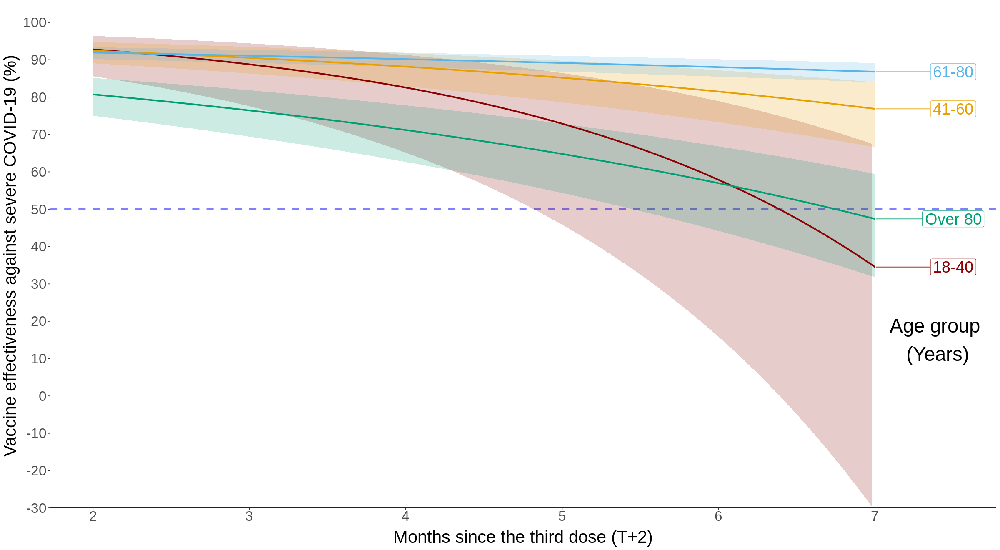

In [207]:
ve_azazmn_18_40$Age<-"18-40"
ve_azazmn_41_60$Age<-"41-60"
ve_azazmn_61_80$Age<-"61-80"
ve_azazmn_81_100$Age<-"Over 80"
ve_azazmn_all<-rbind(ve_azazmn_18_40,ve_azazmn_41_60,ve_azazmn_61_80,ve_azazmn_81_100)
ve_azazmn_all<-as.data.table(ve_azazmn_all)

ggplot(ve_azazmn_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_azazmn_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_azazmn_all$month)+2),limits = c(2,max(ve_azazmn_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-30,105),breaks=c(3:1*-10,0:10*10),name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=15, label= "Age group \n(Years)",size=10)

In [208]:
summary(model_d3_s_azazmn_inter_81_100)

#Initial OR
exp(summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",2])

#initial VE
(1-exp(summary(model_d3_s_azazmn_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_s_azazmn_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazmn_81_100 <- sqrt(vcov(model_d3_s_azazmn_inter_81_100)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN"] + 
                        vcov(model_d3_s_azazmn_inter_81_100)["vac_typeAZ-AZ-MN:month","vac_typeAZ-AZ-MN:month"]+ 
                        2*vcov(model_d3_s_azazmn_inter_81_100)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"])

exp(summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+
      summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazmn_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+
         summary(model_d3_s_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazmn_81_100))*100


Call:
glm(formula = severe ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_s_azazmn_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-9.0988  -0.1438   0.0000   0.0000  29.2170  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.490327   0.112908 -75.197  < 2e-16 ***
vac_typeAZ-AZ-MN        -1.646178   0.178447  -9.225  < 2e-16 ***
month                   -0.060921   0.006175  -9.866  < 2e-16 ***
maleTRUE                 0.583679   0.024845  23.493  < 2e-16 ***
provinceกระบี่            -1.555661   0.238122  -6.533 6.44e-11 ***
provinceกาญจนบุรี          0.065912   0.111903   0.589 0.555855    
provinceกาฬสินธุ์          -2.477149   0.244915 -10.114  < 2e-16 ***
provinceกำแพงเพชร       -1.036411   0.177442  -5.841 5.19e-09 ***
provinceขอนแก่น          -1.212705   0.087588 -13.845  < 2e-16 ***
provinceจันทบุรี           -0.384662   0.139134  -2.765 0.0

[1] 0.1358875 0.1927853 0.2735068

[1] 72.64932 80.72147 86.41125

[1] 0.4055080 0.5259117 0.6820656

[1] 31.79344 47.40883 59.44920

**Summary of 3-dose VE against severe COVID-19**

In [209]:
ve_svsvaz$Vaccination<-"SV-SV-AZ"
ve_svazaz$Vaccination<-"SV-AZ-AZ"
ve_svazpz$Vaccination<-"SV-AZ-PZ"
ve_spsppz$Vaccination<-"SP-SP-PZ"
ve_azazpz$Vaccination<-"AZ-AZ-PZ"
ve_azazmn$Vaccination<-"AZ-AZ-MN"
d3_sm<-rbind(ve_svsvaz,
ve_svazaz,
ve_svazpz,
ve_spsppz,
ve_azazpz,
ve_azazmn)

In [210]:
d3_sm$Vaccination<-factor(d3_sm$Vaccination,levels=c("SV-SV-AZ","SV-AZ-AZ","SV-AZ-PZ","SP-SP-PZ","AZ-AZ-PZ","AZ-AZ-MN"))

In [211]:
d3_sm<-as.data.table(d3_sm)

In [212]:
d3_sm<-d3_sm[month<=5]

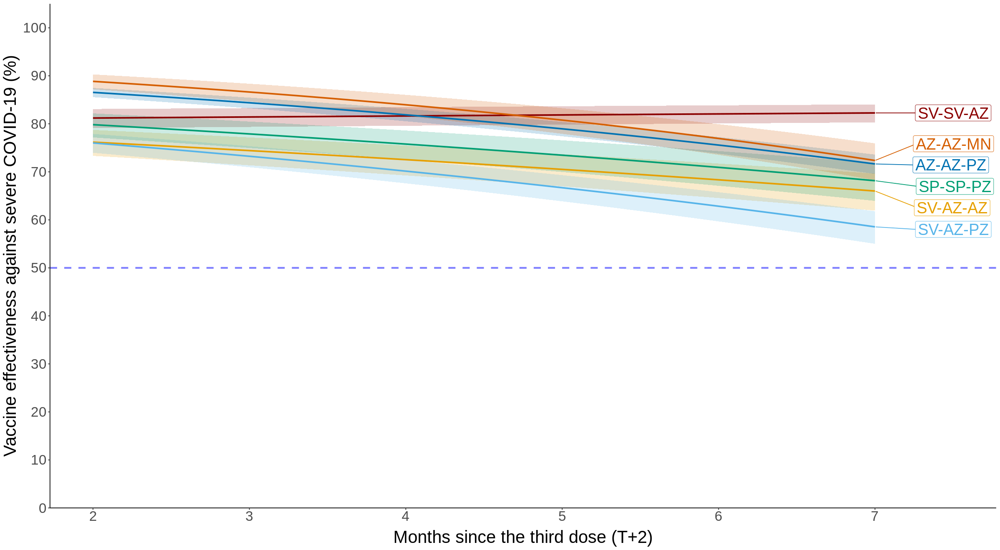

In [213]:
ggplot(d3_sm)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Vaccination,fill=Vaccination),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Vaccination),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(d3_sm[order(-month)],by=c("Vaccination")),
                   aes(label = Vaccination,x=month+2,y=estimate,col=Vaccination),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(d3_sm$month)+2),limits = c(2,max(d3_sm$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

# **Regression model for 2-dose vaccination against death from COVID-19**

In [214]:
d2_death<-stratum[inf_type=="Death" & dose == 2]
d2_death<-d2_death[,c("province", "agegroup", "gender", "vac_type", "inf_type", "vac_date", "inf_date","month","a","b","c","d")]
d2_death$male<-d2_death$gender=="ชาย"

d2_death_a<-d2_death[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","a","inf_date")]
names(d2_death_a)[7]<-"Freq"
d2_death_a$death<-TRUE

d2_death_b<-d2_death[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","b","inf_date")]
names(d2_death_b)[7]<-"Freq"
d2_death_b$vac_type<-"None"
d2_death_b<-unique(d2_death_b,by=c("province", "agegroup", "male", "vac_date", "month","inf_date"))
d2_death_b$death<-TRUE


d2_death_c<-d2_death[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","c","inf_date")]
names(d2_death_c)[7]<-"Freq"
d2_death_c$death<-FALSE

d2_death_d<-d2_death[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","d","inf_date")]
names(d2_death_d)[7]<-"Freq"
d2_death_d$vac_type<-"None"
d2_death_d<-unique(d2_death_d,by=c("province", "agegroup", "male", "vac_date", "month","inf_date"))
d2_death_d$death<-FALSE

d2_d<-rbind(d2_death_a,d2_death_b,d2_death_c,d2_death_d)

In [215]:
d2_d$agegroup<-factor(d2_d$agegroup,levels = c("18-40","41-60","61-80","Over 80"))
d2_d$vac_type<-factor(d2_d$vac_type,levels=c("None","AZ-PZ","SV-AZ"))
d2_d$vac_date<-factor(d2_d$vac_date,levels = c("2021-05","2021-06","2021-07","2021-08","2021-09",
                                               "2021-10","2021-11","2021-12","2022-01","2022-02",
                                               "2022-03","2022-04"))
namep<-unique(d2_d[province !="กรุงเทพมหานคร"]$province)
d2_d$province<-factor(d2_d$province,levels = c("กรุงเทพมหานคร",namep)) #Bangkok, the capital, as a reference

Full model for 2-dose vaccination against death from COVID-**19**

In [216]:
full_d2_d<-glm(death ~ vac_type*agegroup*month+male+province+inf_date, binomial, weight=Freq, data=d2_d)

In [217]:
summary(full_d2_d)


Call:
glm(formula = death ~ vac_type * agegroup * month + male + province + 
    inf_date, family = binomial, data = d2_d, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-10.961   -0.182    0.000    0.000   55.574  

Coefficients:
                                      Estimate Std. Error  z value Pr(>|z|)    
(Intercept)                         -1.365e+01  7.445e-02 -183.383  < 2e-16 ***
vac_typeAZ-PZ                       -6.098e-01  2.085e-01   -2.924 0.003453 ** 
vac_typeSV-AZ                       -2.620e-01  8.675e-02   -3.020 0.002530 ** 
agegroup41-60                        1.806e+00  5.450e-02   33.135  < 2e-16 ***
agegroup61-80                        3.284e+00  5.284e-02   62.146  < 2e-16 ***
agegroupOver 80                      4.556e+00  5.782e-02   78.800  < 2e-16 ***
month                               -4.749e-02  7.719e-03   -6.152 7.65e-10 ***
maleTRUE                             6.062e-01  1.149e-02   52.764  < 2e-16 ***
provinceกระ

In [218]:
model1<-glm(death ~ vac_type*agegroup+male+province+inf_date, binomial, weight=Freq, data=d2_d)
model2<-glm(death ~ agegroup*month+male+province+inf_date, binomial, weight=Freq, data=d2_d)
model3<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_d)
lrtest(model1,full_d2_d)
lrtest(model2,full_d2_d)
lrtest(model3,full_d2_d)

Likelihood ratio test for MLE method 
Chi-squared 12 d.f. =  722.647 , P value =  6.245042e-147 


Likelihood ratio test for MLE method 
Chi-squared 16 d.f. =  1081.803 , P value =  3.346461e-220 


Likelihood ratio test for MLE method 
Chi-squared 18 d.f. =  49067.37 , P value =  0 


In [219]:
rm(model1,model2,model3)

**SV-AZ**

In [220]:
d2_d_svaz<-d2_d[vac_type %in% c("None","SV-AZ")]

In [221]:
model_d2_d_svaz_inter<-glm(death ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d2_d_svaz)

In [222]:
summary(model_d2_d_svaz_inter)


Call:
glm(formula = death ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d2_d_svaz, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-11.286   -0.357    0.000    0.000   55.746  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -13.392494   0.060181 -222.537  < 2e-16 ***
vac_typeSV-AZ          -0.642054   0.031103  -20.643  < 2e-16 ***
month                  -0.078343   0.003416  -22.936  < 2e-16 ***
maleTRUE                0.606834   0.011606   52.288  < 2e-16 ***
agegroup41-60           1.544100   0.023062   66.955  < 2e-16 ***
agegroup61-80           2.955106   0.022499  131.342  < 2e-16 ***
agegroupOver 80         4.518677   0.024751  182.569  < 2e-16 ***
provinceกระบี่           -1.283741   0.097361  -13.185  < 2e-16 ***
provinceกาญจนบุรี        -0.443018   0.057121   -7.756 8.78e-15 ***
provinceกาฬสินธุ์         -0.965708   0.052630  -18.349  < 2e-

In [223]:
car::vif(model_d2_d_svaz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,5.426283,1,2.329438
month,4.199320,1,2.049224
male,1.003944,1,1.001970
agegroup,1.039850,3,1.006534
province,1.101196,76,1.000634
inf_date,3.693958,12,1.055955
vac_type:month,2.946552,1,1.716552


In [224]:
exp(summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ",2])

[1] 0.4950909 0.5262107 0.5592866

In [225]:
(1-exp(summary(model_d2_d_svaz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_d_svaz_inter)$coef[2,2]))*100

[1] 44.07134 47.37893 50.49091

In [226]:
se_svaz <- sqrt(vcov(model_d2_d_svaz_inter)["vac_typeSV-AZ","vac_typeSV-AZ"] + 
                  vcov(model_d2_d_svaz_inter)["vac_typeSV-AZ:month","vac_typeSV-AZ:month"]+ 
                  2*vcov(model_d2_d_svaz_inter)["vac_typeSV-AZ","vac_typeSV-AZ:month"])
se_svaz

[1] 0.02660972

In [227]:
sqrt(sum(vcov(model_d2_d_svaz_inter)[c("vac_typeSV-AZ","vac_typeSV-AZ:month"),c("vac_typeSV-AZ","vac_typeSV-AZ:month")]))

[1] 0.02660972

In [228]:
exp(summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ",1]+
      summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svaz)

[1] 0.5143236 0.5418595 0.5708696

In [229]:
evalues.OR(exp(summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ",2])[2], 
exp(summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ",2])[1], 
exp(summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,0.02621071,-0.004909111,0.05928662
E-values,-0.20575825,NA,-0.43924075


In [230]:
(1-exp(summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ",1]+
         summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svaz))*100

[1] 42.91304 45.81405 48.56764

In [231]:
ve_svaz<-NULL
for(i in 0:500){
  ve_svaz<-rbind(ve_svaz,(1-exp(summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ",1]+
                                  summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_svaz))*100)
}

In [232]:
ve_svaz<-cbind(0:500/100,ve_svaz)
ve_svaz<-as.data.frame(ve_svaz)
names(ve_svaz)<-c("month","lower","estimate","upper")

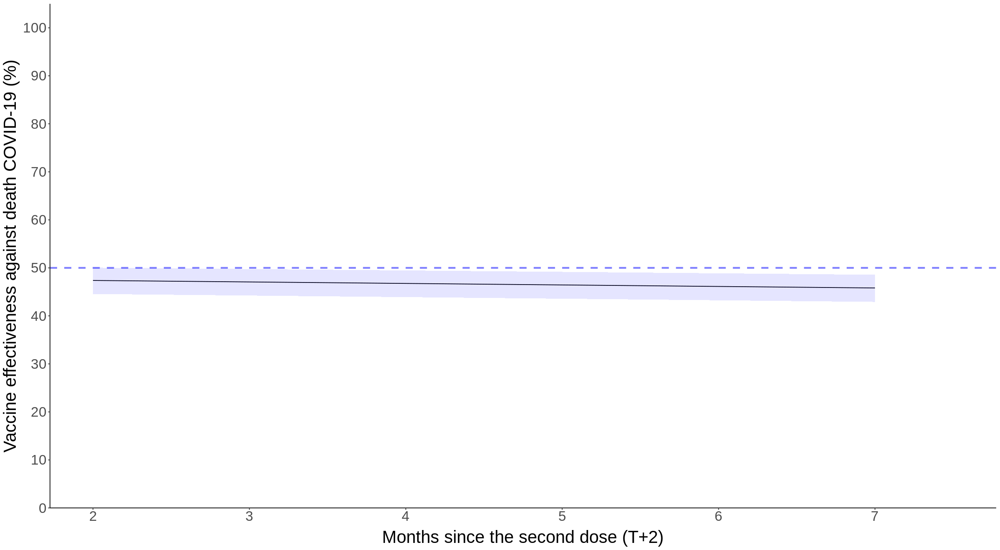

In [233]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svaz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [234]:
(log(0.5)-summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ",1]-qnorm(c(0.975,0.50,0.025))*se_svaz)/summary(model_d2_d_svaz_inter)$coef["vac_typeSV-AZ:month",1]+2

[1] -15.616083  -6.717572   2.180938

*Stratified by age group*


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_d_svaz_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.5388  -0.1947   0.0000   0.0000  14.4601  

Coefficients:
                       Estimate Std. Error z value Pr(>|z|)    
(Intercept)           -14.35738    0.26291 -54.610  < 2e-16 ***
vac_typeSV-AZ          -0.51227    0.11320  -4.525 6.03e-06 ***
month                  -0.06716    0.01273  -5.276 1.32e-07 ***
maleTRUE                0.38866    0.04247   9.150  < 2e-16 ***
provinceกระบี่           -0.21009    0.28653  -0.733 0.463418    
provinceกาญจนบุรี         0.21180    0.20452   1.036 0.300384    
provinceกาฬสินธุ์          0.59832    0.16777   3.566 0.000362 ***
provinceกำแพงเพชร       0.06606    0.22493   0.294 0.768984    
provinceขอนแก่น          0.30388    0.15356   1.979 0.047818 *  
provinceจันทบุรี           0.25078    0.23258   1.078 0.280908    
provinceฉะเชิงเท

[1] 0.4799174 0.5991330 0.7479627

[1] 25.20373 40.08670 52.00826

[1] 0.4882329 0.5903007 0.7137065

[1] 28.62935 40.96993 51.17671


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_d_svaz_41_60, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-6.697  -0.456   0.000   0.000  35.587  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -12.224438   0.116469 -104.959  < 2e-16 ***
vac_typeSV-AZ          -0.701081   0.056847  -12.333  < 2e-16 ***
month                  -0.089270   0.006480  -13.776  < 2e-16 ***
maleTRUE                0.495230   0.020776   23.836  < 2e-16 ***
provinceกระบี่           -2.279211   0.319056   -7.144 9.09e-13 ***
provinceกาญจนบุรี         0.212915   0.085593    2.488 0.012863 *  
provinceกาฬสินธุ์         -0.422138   0.088617   -4.764 1.90e-06 ***
provinceกำแพงเพชร       0.223738   0.082515    2.711 0.006698 ** 
provinceขอนแก่น         -0.832062   0.083958   -9.910  < 2e-16 ***
provinceจันทบุรี          -0.638249   0.132904   -4.802 1.57e-06 ***
prov

[1] 0.4437477 0.4960490 0.5545147

[1] 44.54853 50.39510 55.62523

[1] 0.4861047 0.5349475 0.5886979

[1] 41.13021 46.50525 51.38953

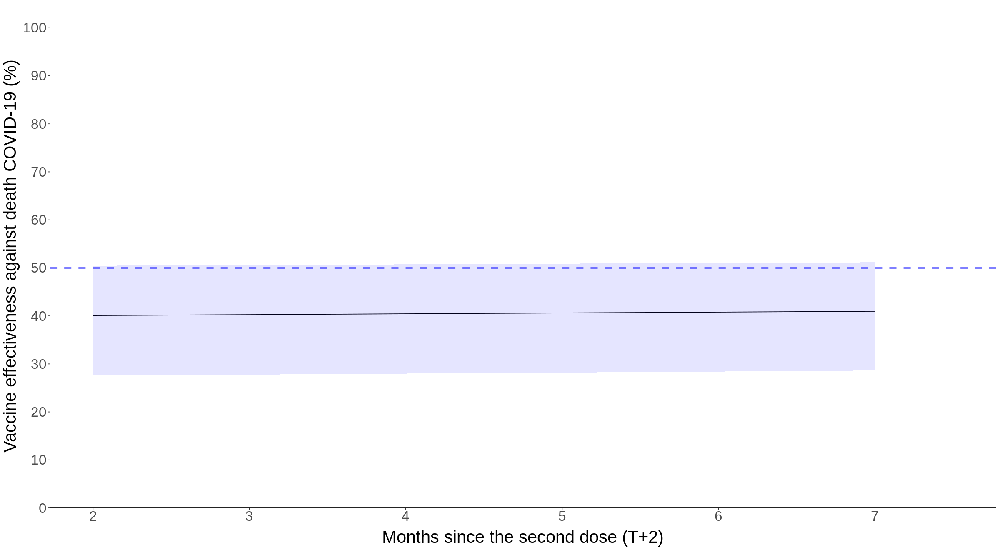


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_d_svaz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-12.507   -0.506    0.000    0.000   54.680  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -10.198840   0.077524 -131.558  < 2e-16 ***
vac_typeSV-AZ          -0.736176   0.048185  -15.278  < 2e-16 ***
month                  -0.090261   0.005312  -16.991  < 2e-16 ***
maleTRUE                0.704866   0.017740   39.733  < 2e-16 ***
provinceกระบี่           -0.806159   0.115948   -6.953 3.58e-12 ***
provinceกาญจนบุรี        -1.217185   0.115809  -10.510  < 2e-16 ***
provinceกาฬสินธุ์         -1.200597   0.078687  -15.258  < 2e-16 ***
provinceกำแพงเพชร      -0.598040   0.082259   -7.270 3.59e-13 ***
provinceขอนแก่น         -1.124847   0.056325  -19.971  < 2e-16 ***
provinceจันทบุรี          -0.987829   0.111363   -8.870  < 2e-1

[1] 0.4357804 0.4789421 0.5263788

[1] 47.36212 52.10579 56.42196

[1] 0.4828641 0.5236281 0.5678335

[1] 43.21665 47.63719 51.71359

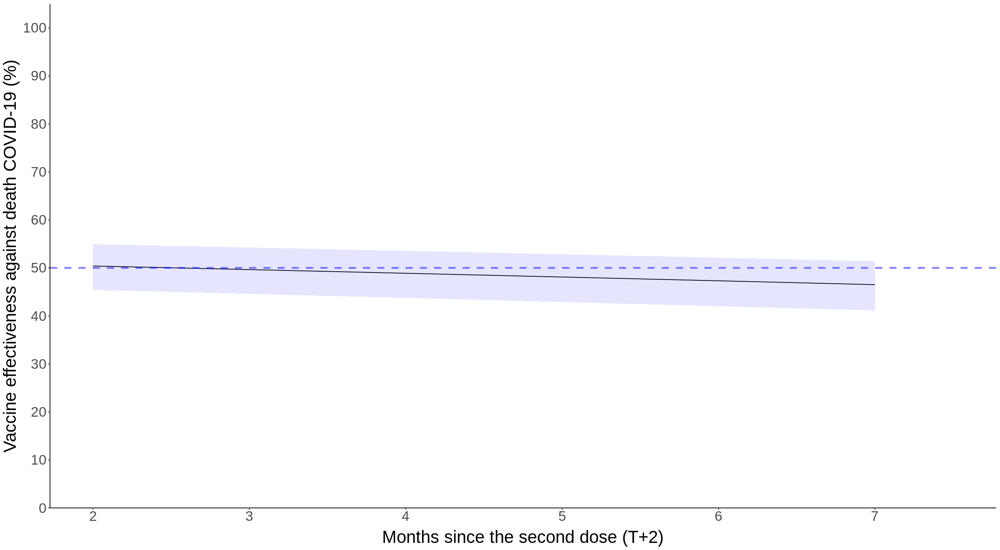


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_d_svaz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-8.2470  -0.3343   0.0000   0.0000  28.4943  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -8.833813   0.134007 -65.920  < 2e-16 ***
vac_typeSV-AZ          -0.476359   0.070832  -6.725 1.75e-11 ***
month                  -0.056617   0.007073  -8.004 1.20e-15 ***
maleTRUE                0.653827   0.026966  24.247  < 2e-16 ***
provinceกระบี่           -2.599187   0.380161  -6.837 8.08e-12 ***
provinceกาญจนบุรี        -0.295010   0.139477  -2.115 0.034421 *  
provinceกาฬสินธุ์         -2.794785   0.280319  -9.970  < 2e-16 ***
provinceกำแพงเพชร      -0.656321   0.149936  -4.377 1.20e-05 ***
provinceขอนแก่น         -1.795452   0.116989 -15.347  < 2e-16 ***
provinceจันทบุรี          -0.779605   0.171507  -4.546 5.48e-06 ***
prov

[1] 0.5405405 0.6210408 0.7135296

[1] 28.64704 37.89592 45.94595

[1] 0.5243379 0.5893732 0.6624752

[1] 33.75248 41.06268 47.56621

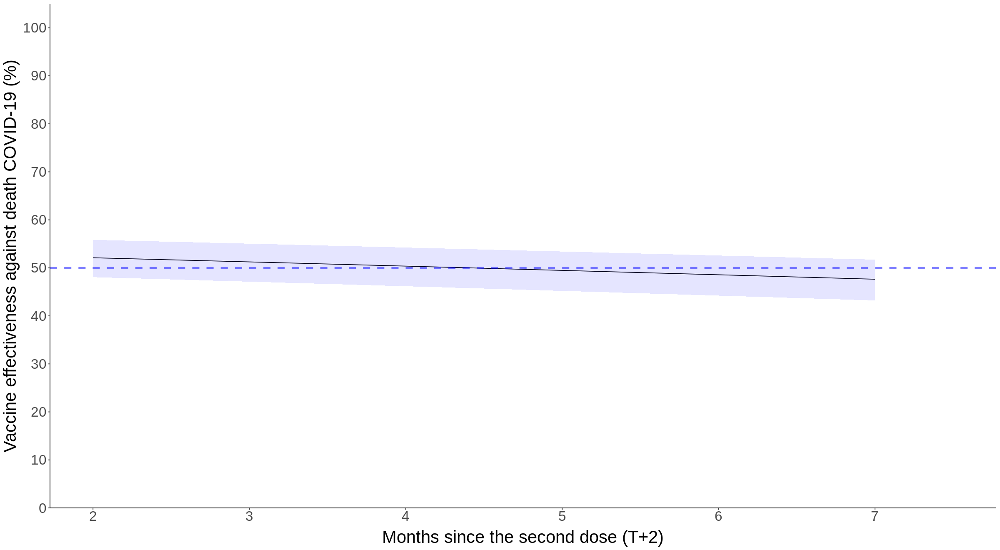

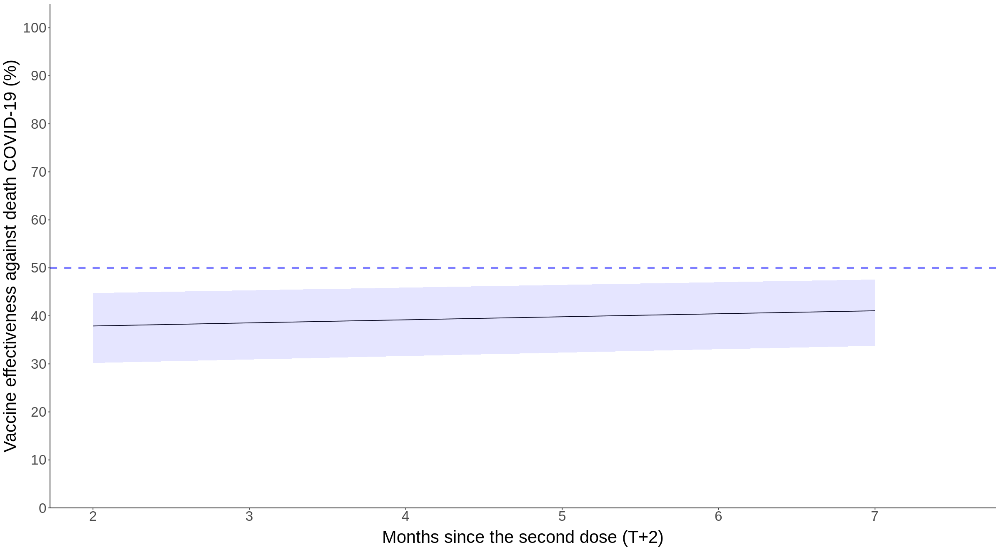

In [235]:
#Stratified by age group: 18-40
d2_d_svaz_18_40<-d2_d_svaz[agegroup=="18-40"]

model_d2_d_svaz_inter_18_40<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_d_svaz_18_40)
summary(model_d2_d_svaz_inter_18_40)

#Initial OR
exp(summary(model_d2_d_svaz_inter_18_40)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_svaz_inter_18_40)$coef["vac_typeSV-AZ",2])

#Initial VE
(1-exp(summary(model_d2_d_svaz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_d_svaz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svaz_18_40 <- sqrt(vcov(model_d2_d_svaz_inter_18_40)["vac_typeSV-AZ","vac_typeSV-AZ"] + 
                        vcov(model_d2_d_svaz_inter_18_40)["vac_typeSV-AZ:month","vac_typeSV-AZ:month"]+ 
                        2*vcov(model_d2_d_svaz_inter_18_40)["vac_typeSV-AZ","vac_typeSV-AZ:month"])

exp(summary(model_d2_d_svaz_inter_18_40)$coef["vac_typeSV-AZ",1]+
      summary(model_d2_d_svaz_inter_18_40)$coef["vac_typeSV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svaz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_d_svaz_inter_18_40)$coef["vac_typeSV-AZ",1]+
         summary(model_d2_d_svaz_inter_18_40)$coef["vac_typeSV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svaz_18_40))*100

#VE overtime
ve_d_svaz_18_40<-NULL
for(i in 0:500){
  ve_d_svaz_18_40<-rbind(ve_d_svaz_18_40,(1-exp(summary(model_d2_d_svaz_inter_18_40)$coef["vac_typeSV-AZ",1]+
                                              summary(model_d2_d_svaz_inter_18_40)$coef["vac_typeSV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svaz_18_40))*100)
}

ve_d_svaz_18_40<-cbind(0:500/100,ve_d_svaz_18_40)

ve_d_svaz_18_40<-as.data.frame(ve_d_svaz_18_40)
names(ve_d_svaz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svaz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d2_d_svaz_41_60<-d2_d_svaz[agegroup=="41-60"]

model_d2_d_svaz_inter_41_60<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_d_svaz_41_60)
summary(model_d2_d_svaz_inter_41_60)

#Initial OR
exp(summary(model_d2_d_svaz_inter_41_60)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_svaz_inter_41_60)$coef["vac_typeSV-AZ",2])

#initial VE
(1-exp(summary(model_d2_d_svaz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_d_svaz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svaz_41_60 <- sqrt(vcov(model_d2_d_svaz_inter_41_60)["vac_typeSV-AZ","vac_typeSV-AZ"] + 
                        vcov(model_d2_d_svaz_inter_41_60)["vac_typeSV-AZ:month","vac_typeSV-AZ:month"]+ 
                        2*vcov(model_d2_d_svaz_inter_41_60)["vac_typeSV-AZ","vac_typeSV-AZ:month"])

exp(summary(model_d2_d_svaz_inter_41_60)$coef["vac_typeSV-AZ",1]+
      summary(model_d2_d_svaz_inter_41_60)$coef["vac_typeSV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svaz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_d_svaz_inter_41_60)$coef["vac_typeSV-AZ",1]+
         summary(model_d2_d_svaz_inter_41_60)$coef["vac_typeSV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svaz_41_60))*100

#VE overtime
ve_d_svaz_41_60<-NULL
for(i in 0:500){
  ve_d_svaz_41_60<-rbind(ve_d_svaz_41_60,(1-exp(summary(model_d2_d_svaz_inter_41_60)$coef["vac_typeSV-AZ",1]+
                                              summary(model_d2_d_svaz_inter_41_60)$coef["vac_typeSV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svaz_41_60))*100)
}

ve_d_svaz_41_60<-cbind(0:500/100,ve_d_svaz_41_60)

ve_d_svaz_41_60<-as.data.frame(ve_d_svaz_41_60)
names(ve_d_svaz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svaz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d2_d_svaz_61_80<-d2_d_svaz[agegroup=="61-80"]

model_d2_d_svaz_inter_61_80<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_d_svaz_61_80)
summary(model_d2_d_svaz_inter_61_80)

#Initial OR
exp(summary(model_d2_d_svaz_inter_61_80)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_svaz_inter_61_80)$coef["vac_typeSV-AZ",2])

#initial VE
(1-exp(summary(model_d2_d_svaz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_d_svaz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svaz_61_80 <- sqrt(vcov(model_d2_d_svaz_inter_61_80)["vac_typeSV-AZ","vac_typeSV-AZ"] + 
                        vcov(model_d2_d_svaz_inter_61_80)["vac_typeSV-AZ:month","vac_typeSV-AZ:month"]+ 
                        2*vcov(model_d2_d_svaz_inter_61_80)["vac_typeSV-AZ","vac_typeSV-AZ:month"])

exp(summary(model_d2_d_svaz_inter_61_80)$coef["vac_typeSV-AZ",1]+
      summary(model_d2_d_svaz_inter_61_80)$coef["vac_typeSV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svaz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_d_svaz_inter_61_80)$coef["vac_typeSV-AZ",1]+
         summary(model_d2_d_svaz_inter_61_80)$coef["vac_typeSV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svaz_61_80))*100

#VE overtime
ve_d_svaz_61_80<-NULL
for(i in 0:500){
  ve_d_svaz_61_80<-rbind(ve_d_svaz_61_80,(1-exp(summary(model_d2_d_svaz_inter_61_80)$coef["vac_typeSV-AZ",1]+
                                              summary(model_d2_d_svaz_inter_61_80)$coef["vac_typeSV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svaz_61_80))*100)
}

ve_d_svaz_61_80<-cbind(0:500/100,ve_d_svaz_61_80)

ve_d_svaz_61_80<-as.data.frame(ve_d_svaz_61_80)
names(ve_d_svaz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svaz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d2_d_svaz_81_100<-d2_d_svaz[agegroup=="Over 80"]

model_d2_d_svaz_inter_81_100<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_d_svaz_81_100)
summary(model_d2_d_svaz_inter_81_100)

#Initial OR
exp(summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ",2])

#initial VE
(1-exp(summary(model_d2_d_svaz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_d_svaz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svaz_81_100 <- sqrt(vcov(model_d2_d_svaz_inter_81_100)["vac_typeSV-AZ","vac_typeSV-AZ"] + 
                        vcov(model_d2_d_svaz_inter_81_100)["vac_typeSV-AZ:month","vac_typeSV-AZ:month"]+ 
                        2*vcov(model_d2_d_svaz_inter_81_100)["vac_typeSV-AZ","vac_typeSV-AZ:month"])

exp(summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ",1]+
      summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svaz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ",1]+
         summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svaz_81_100))*100

#VE overtime
ve_d_svaz_81_100<-NULL
for(i in 0:500){
  ve_d_svaz_81_100<-rbind(ve_d_svaz_81_100,(1-exp(summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ",1]+
                                              summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svaz_81_100))*100)
}

ve_d_svaz_81_100<-cbind(0:500/100,ve_d_svaz_81_100)

ve_d_svaz_81_100<-as.data.frame(ve_d_svaz_81_100)
names(ve_d_svaz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svaz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [236]:
summary(model_d2_d_svaz_inter_81_100)

#Initial OR
exp(summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ",2])

#initial VE
(1-exp(summary(model_d2_d_svaz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_d_svaz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svaz_81_100 <- sqrt(vcov(model_d2_d_svaz_inter_81_100)["vac_typeSV-AZ","vac_typeSV-AZ"] + 
                        vcov(model_d2_d_svaz_inter_81_100)["vac_typeSV-AZ:month","vac_typeSV-AZ:month"]+ 
                        2*vcov(model_d2_d_svaz_inter_81_100)["vac_typeSV-AZ","vac_typeSV-AZ:month"])

exp(summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ",1]+
      summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svaz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ",1]+
         summary(model_d2_d_svaz_inter_81_100)$coef["vac_typeSV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svaz_81_100))*100


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_d_svaz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-8.2470  -0.3343   0.0000   0.0000  28.4943  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -8.833813   0.134007 -65.920  < 2e-16 ***
vac_typeSV-AZ          -0.476359   0.070832  -6.725 1.75e-11 ***
month                  -0.056617   0.007073  -8.004 1.20e-15 ***
maleTRUE                0.653827   0.026966  24.247  < 2e-16 ***
provinceกระบี่           -2.599187   0.380161  -6.837 8.08e-12 ***
provinceกาญจนบุรี        -0.295010   0.139477  -2.115 0.034421 *  
provinceกาฬสินธุ์         -2.794785   0.280319  -9.970  < 2e-16 ***
provinceกำแพงเพชร      -0.656321   0.149936  -4.377 1.20e-05 ***
provinceขอนแก่น         -1.795452   0.116989 -15.347  < 2e-16 ***
provinceจันทบุรี          -0.779605   0.171507  -4.546 5.48e-06 ***
prov

[1] 0.5405405 0.6210408 0.7135296

[1] 28.64704 37.89592 45.94595

[1] 0.5243379 0.5893732 0.6624752

[1] 33.75248 41.06268 47.56621

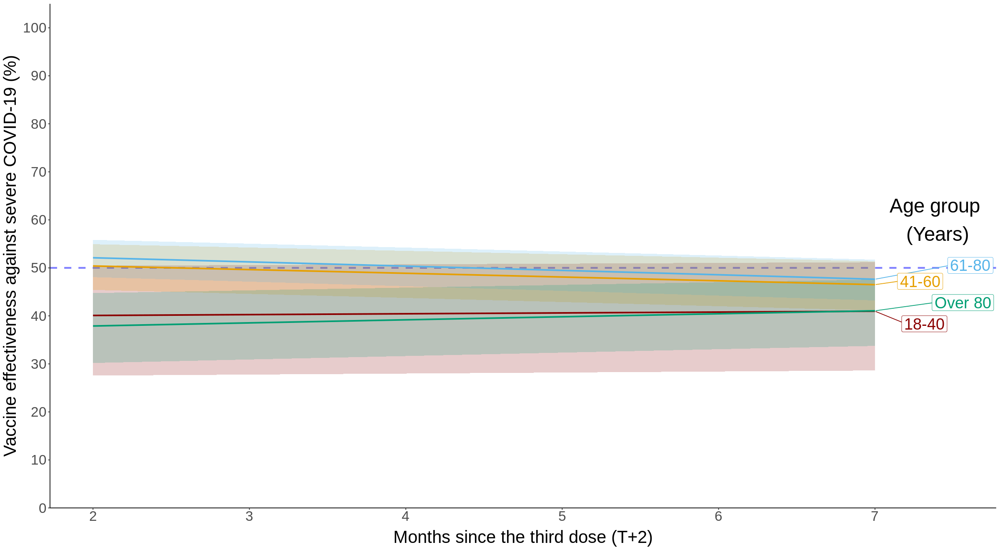

In [237]:
ve_d_svaz_18_40$Age<-"18-40"
ve_d_svaz_41_60$Age<-"41-60"
ve_d_svaz_61_80$Age<-"61-80"
ve_d_svaz_81_100$Age<-"Over 80"
ve_d_svaz_all<-rbind(ve_d_svaz_18_40,ve_d_svaz_41_60,ve_d_svaz_61_80,ve_d_svaz_81_100)
ve_d_svaz_all<-as.data.table(ve_d_svaz_all)

ggplot(ve_d_svaz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_d_svaz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_d_svaz_all$month)+2),limits = c(2,max(ve_d_svaz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=60, label= "Age group \n(Years)",size=10)

**AZ-PZ**

In [238]:
d2_d_azpz<-d2_d[vac_type %in% c("None","AZ-PZ")]

In [239]:
model_d2_d_azpz_inter<-glm(death ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d2_d_azpz)

In [240]:
summary(model_d2_d_azpz_inter)


Call:
glm(formula = death ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d2_d_azpz, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-11.130   -0.188    0.000    0.000   55.742  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -13.422790   0.061350 -218.790  < 2e-16 ***
vac_typeAZ-PZ          -0.775604   0.062338  -12.442  < 2e-16 ***
month                  -0.086270   0.003608  -23.913  < 2e-16 ***
maleTRUE                0.584044   0.013051   44.750  < 2e-16 ***
agegroup41-60           1.564596   0.026143   59.848  < 2e-16 ***
agegroup61-80           3.012384   0.025381  118.686  < 2e-16 ***
agegroupOver 80         4.548988   0.027725  164.074  < 2e-16 ***
provinceกระบี่           -1.274775   0.117911  -10.811  < 2e-16 ***
provinceกาญจนบุรี        -0.452395   0.064211   -7.045 1.85e-12 ***
provinceกาฬสินธุ์         -1.033235   0.062387  -16.562  < 2e-

In [241]:
car::vif(model_d2_d_azpz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.459011,1,1.568123
month,3.810734,1,1.952110
male,1.005060,1,1.002527
agegroup,1.037264,3,1.006116
province,1.077843,76,1.000493
inf_date,3.750439,12,1.056623
vac_type:month,2.019045,1,1.420931


In [242]:
exp(summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ",2])

[1] 0.4074715 0.4604254 0.5202611

In [243]:
(1-exp(summary(model_d2_d_azpz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_d_azpz_inter)$coef[2,2]))*100

[1] 47.97389 53.95746 59.25285

In [244]:
se_azpz <- sqrt(vcov(model_d2_d_azpz_inter)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                  vcov(model_d2_d_azpz_inter)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                  2*vcov(model_d2_d_azpz_inter)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])
se_azpz

[1] 0.04967912

In [245]:
sqrt(sum(vcov(model_d2_d_azpz_inter)[c("vac_typeAZ-PZ","vac_typeAZ-PZ:month"),c("vac_typeAZ-PZ","vac_typeAZ-PZ:month")]))

[1] 0.04967912

In [246]:
exp(summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz)

[1] 0.4456798 0.4912583 0.5414980

In [247]:
evalues.OR(exp(summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ",2])[2], 
exp(summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ",2])[1], 
exp(summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.03957455,-0.09252846,0.0202611
E-values,0.35307906,NA,-0.1607859


In [248]:
(1-exp(summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz))*100

[1] 45.85020 50.87417 55.43202

In [249]:
ve_azpz<-NULL
for(i in 0:500){
  ve_azpz<-rbind(ve_azpz,(1-exp(summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ",1]+
                                  summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_azpz))*100)
}

In [250]:
ve_azpz<-cbind(0:500/100,ve_azpz)
ve_azpz<-as.data.frame(ve_azpz)
names(ve_azpz)<-c("month","lower","estimate","upper")

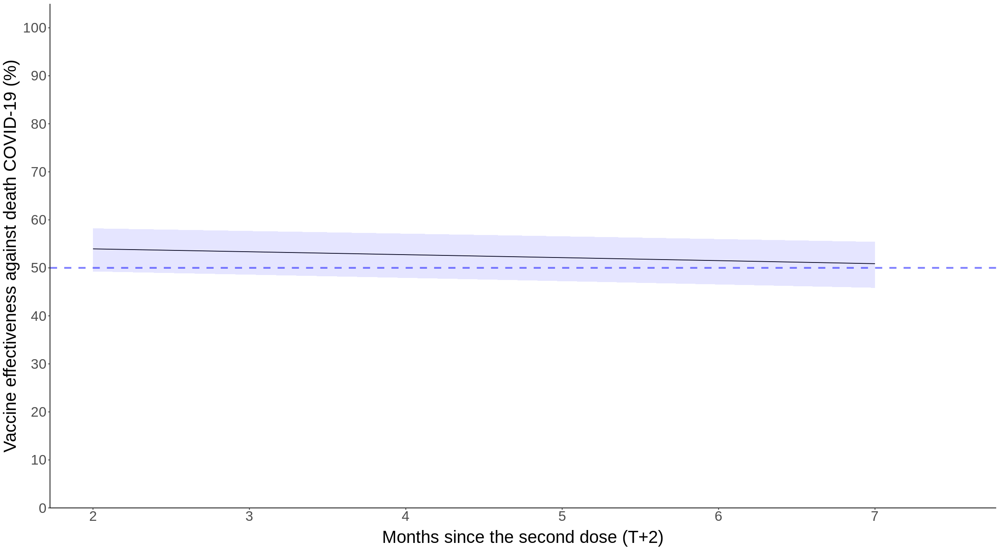

In [251]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azpz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [252]:
(log(0.5)-summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ",1]-qnorm(c(0.975,0.50,0.025))*se_azpz)/summary(model_d2_d_azpz_inter)$coef["vac_typeAZ-PZ:month",1]+2

[1]  0.8497114  8.3605570 15.8714026

*Stratified by age group*


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_d_azpz_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.4511  -0.0911   0.0000   0.0000  14.4882  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)           -14.420357   0.265801 -54.253  < 2e-16 ***
vac_typeAZ-PZ          -0.878926   0.227804  -3.858 0.000114 ***
month                  -0.073903   0.013544  -5.456 4.86e-08 ***
maleTRUE                0.404217   0.048096   8.404  < 2e-16 ***
provinceกระบี่           -0.336900   0.370035  -0.910 0.362583    
provinceกาญจนบุรี         0.355980   0.221269   1.609 0.107657    
provinceกาฬสินธุ์          0.427706   0.197444   2.166 0.030295 *  
provinceกำแพงเพชร       0.234979   0.239547   0.981 0.326627    
provinceขอนแก่น          0.116564   0.181039   0.644 0.519664    
provinceจันทบุรี           0.543103   0.235440   2.307 0.021069 *  
provi

[1] 0.2656934 0.4152288 0.6489244

[1] 35.10756 58.47712 73.43066

[1] 0.9023152 1.2874190 1.8368832

[1] -83.688316 -28.741898   9.768478

Warning message:
“Removed 112 rows containing missing values (`geom_line()`).”



Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_d_azpz_41_60, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-6.766  -0.191   0.000   0.000  35.580  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -12.181377   0.117081 -104.043  < 2e-16 ***
vac_typeAZ-PZ          -0.890488   0.131354   -6.779 1.21e-11 ***
month                  -0.087127   0.007027  -12.399  < 2e-16 ***
maleTRUE                0.454492   0.023835   19.068  < 2e-16 ***
provinceกระบี่           -2.407072   0.410545   -5.863 4.54e-09 ***
provinceกาญจนบุรี         0.110184   0.098756    1.116 0.264542    
provinceกาฬสินธุ์         -0.449986   0.099536   -4.521 6.16e-06 ***
provinceกำแพงเพชร       0.142830   0.095044    1.503 0.132898    
provinceขอนแก่น         -0.947238   0.097920   -9.674  < 2e-16 ***
provinceจันทบุรี          -0.352981   0.133306   -2.648 0.008099 ** 
prov

[1] 0.3172906 0.4104556 0.5309763

[1] 46.90237 58.95444 68.27094

[1] 0.1791841 0.2191846 0.2681146

[1] 73.18854 78.08154 82.08159

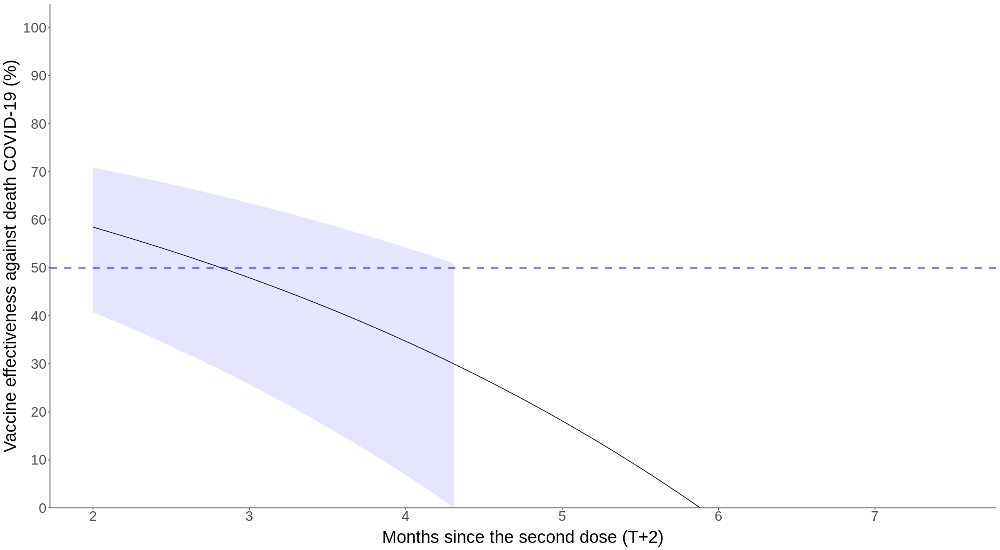


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_d_azpz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-11.982   -0.286    0.000    0.000   54.751  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)           -10.198085   0.077779 -131.117  < 2e-16 ***
vac_typeAZ-PZ          -0.774273   0.089439   -8.657  < 2e-16 ***
month                  -0.105075   0.005569  -18.869  < 2e-16 ***
maleTRUE                0.689212   0.019907   34.621  < 2e-16 ***
provinceกระบี่           -0.771801   0.140060   -5.511 3.58e-08 ***
provinceกาญจนบุรี        -1.042059   0.119438   -8.725  < 2e-16 ***
provinceกาฬสินธุ์         -1.348939   0.098869  -13.644  < 2e-16 ***
provinceกำแพงเพชร      -0.614390   0.095389   -6.441 1.19e-10 ***
provinceขอนแก่น         -1.144223   0.064321  -17.789  < 2e-16 ***
provinceจันทบุรี          -0.842277   0.120252   -7.004 2.48e-1

[1] 0.3869073 0.4610386 0.5493734

[1] 45.06266 53.89614 61.30927

[1] 0.4415674 0.5087829 0.5862299

[1] 41.37701 49.12171 55.84326

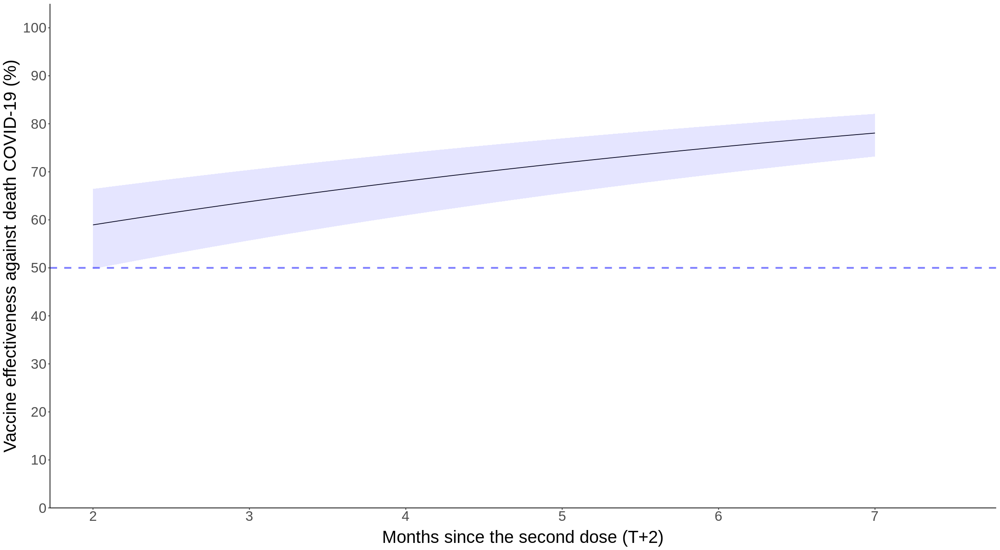


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_d_azpz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.8897  -0.1951   0.0000   0.0000  28.6031  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -8.845053   0.134371 -65.826  < 2e-16 ***
vac_typeAZ-PZ          -0.631487   0.136487  -4.627 3.72e-06 ***
month                  -0.063088   0.007291  -8.653  < 2e-16 ***
maleTRUE                0.614507   0.029419  20.888  < 2e-16 ***
provinceกระบี่           -2.179903   0.380095  -5.735 9.74e-09 ***
provinceกาญจนบุรี        -0.383528   0.163210  -2.350 0.018778 *  
provinceกาฬสินธุ์         -2.418560   0.280284  -8.629  < 2e-16 ***
provinceกำแพงเพชร      -0.897419   0.193346  -4.642 3.46e-06 ***
provinceขอนแก่น         -1.702431   0.127944 -13.306  < 2e-16 ***
provinceจันทบุรี          -0.730052   0.193331  -3.776 0.000159 ***
prov

[1] 0.4069777 0.5318003 0.6949068

[1] 30.50932 46.81997 59.30223

[1] 0.3436569 0.4248154 0.5251404

[1] 47.48596 57.51846 65.63431

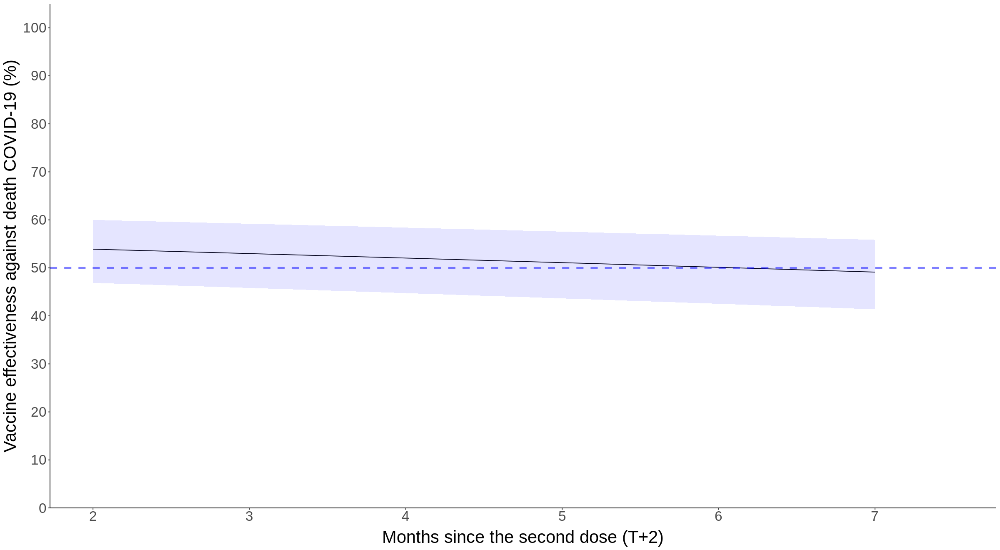

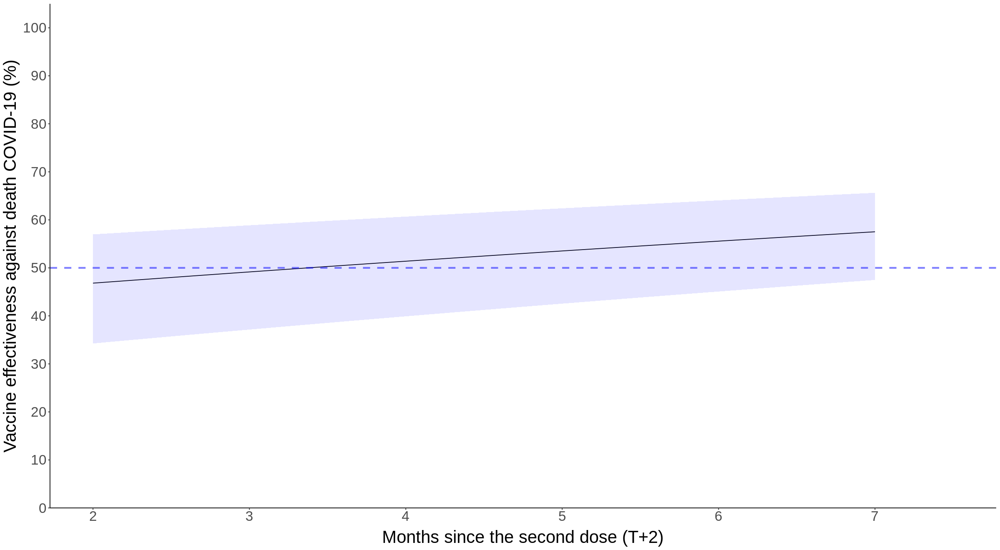

In [253]:
#Stratified by age group: 18-40
d2_d_azpz_18_40<-d2_d_azpz[agegroup=="18-40"]

model_d2_d_azpz_inter_18_40<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_d_azpz_18_40)
summary(model_d2_d_azpz_inter_18_40)

#Initial OR
exp(summary(model_d2_d_azpz_inter_18_40)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_azpz_inter_18_40)$coef["vac_typeAZ-PZ",2])

#Initial VE
(1-exp(summary(model_d2_d_azpz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_d_azpz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azpz_18_40 <- sqrt(vcov(model_d2_d_azpz_inter_18_40)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                        vcov(model_d2_d_azpz_inter_18_40)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                        2*vcov(model_d2_d_azpz_inter_18_40)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])

exp(summary(model_d2_d_azpz_inter_18_40)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_d_azpz_inter_18_40)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_d_azpz_inter_18_40)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_d_azpz_inter_18_40)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz_18_40))*100

#VE overtime
ve_d_azpz_18_40<-NULL
for(i in 0:500){
  ve_d_azpz_18_40<-rbind(ve_d_azpz_18_40,(1-exp(summary(model_d2_d_azpz_inter_18_40)$coef["vac_typeAZ-PZ",1]+
                                              summary(model_d2_d_azpz_inter_18_40)$coef["vac_typeAZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azpz_18_40))*100)
}

ve_d_azpz_18_40<-cbind(0:500/100,ve_d_azpz_18_40)

ve_d_azpz_18_40<-as.data.frame(ve_d_azpz_18_40)
names(ve_d_azpz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_azpz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d2_d_azpz_41_60<-d2_d_azpz[agegroup=="41-60"]

model_d2_d_azpz_inter_41_60<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_d_azpz_41_60)
summary(model_d2_d_azpz_inter_41_60)

#Initial OR
exp(summary(model_d2_d_azpz_inter_41_60)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_azpz_inter_41_60)$coef["vac_typeAZ-PZ",2])

#initial VE
(1-exp(summary(model_d2_d_azpz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_d_azpz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azpz_41_60 <- sqrt(vcov(model_d2_d_azpz_inter_41_60)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                        vcov(model_d2_d_azpz_inter_41_60)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                        2*vcov(model_d2_d_azpz_inter_41_60)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])

exp(summary(model_d2_d_azpz_inter_41_60)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_d_azpz_inter_41_60)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_d_azpz_inter_41_60)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_d_azpz_inter_41_60)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz_41_60))*100

#VE overtime
ve_d_azpz_41_60<-NULL
for(i in 0:500){
  ve_d_azpz_41_60<-rbind(ve_d_azpz_41_60,(1-exp(summary(model_d2_d_azpz_inter_41_60)$coef["vac_typeAZ-PZ",1]+
                                              summary(model_d2_d_azpz_inter_41_60)$coef["vac_typeAZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azpz_41_60))*100)
}

ve_d_azpz_41_60<-cbind(0:500/100,ve_d_azpz_41_60)

ve_d_azpz_41_60<-as.data.frame(ve_d_azpz_41_60)
names(ve_d_azpz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_azpz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d2_d_azpz_61_80<-d2_d_azpz[agegroup=="61-80"]

model_d2_d_azpz_inter_61_80<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_d_azpz_61_80)
summary(model_d2_d_azpz_inter_61_80)

#Initial OR
exp(summary(model_d2_d_azpz_inter_61_80)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_azpz_inter_61_80)$coef["vac_typeAZ-PZ",2])

#initial VE
(1-exp(summary(model_d2_d_azpz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_d_azpz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azpz_61_80 <- sqrt(vcov(model_d2_d_azpz_inter_61_80)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                        vcov(model_d2_d_azpz_inter_61_80)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                        2*vcov(model_d2_d_azpz_inter_61_80)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])

exp(summary(model_d2_d_azpz_inter_61_80)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_d_azpz_inter_61_80)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_d_azpz_inter_61_80)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_d_azpz_inter_61_80)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz_61_80))*100

#VE overtime
ve_d_azpz_61_80<-NULL
for(i in 0:500){
  ve_d_azpz_61_80<-rbind(ve_d_azpz_61_80,(1-exp(summary(model_d2_d_azpz_inter_61_80)$coef["vac_typeAZ-PZ",1]+
                                              summary(model_d2_d_azpz_inter_61_80)$coef["vac_typeAZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azpz_61_80))*100)
}

ve_d_azpz_61_80<-cbind(0:500/100,ve_d_azpz_61_80)

ve_d_azpz_61_80<-as.data.frame(ve_d_azpz_61_80)
names(ve_d_azpz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_azpz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d2_d_azpz_81_100<-d2_d_azpz[agegroup=="Over 80"]

model_d2_d_azpz_inter_81_100<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d2_d_azpz_81_100)
summary(model_d2_d_azpz_inter_81_100)

#Initial OR
exp(summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ",2])

#initial VE
(1-exp(summary(model_d2_d_azpz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_d_azpz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azpz_81_100 <- sqrt(vcov(model_d2_d_azpz_inter_81_100)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                        vcov(model_d2_d_azpz_inter_81_100)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                        2*vcov(model_d2_d_azpz_inter_81_100)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])

exp(summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz_81_100))*100

#VE overtime
ve_d_azpz_81_100<-NULL
for(i in 0:500){
  ve_d_azpz_81_100<-rbind(ve_d_azpz_81_100,(1-exp(summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+
                                              summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azpz_81_100))*100)
}

ve_d_azpz_81_100<-cbind(0:500/100,ve_d_azpz_81_100)

ve_d_azpz_81_100<-as.data.frame(ve_d_azpz_81_100)
names(ve_d_azpz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_azpz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [254]:
summary(model_d2_d_azpz_inter_81_100)

#Initial OR
exp(summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ",2])

#initial VE
(1-exp(summary(model_d2_d_azpz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d2_d_azpz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azpz_81_100 <- sqrt(vcov(model_d2_d_azpz_inter_81_100)["vac_typeAZ-PZ","vac_typeAZ-PZ"] + 
                        vcov(model_d2_d_azpz_inter_81_100)["vac_typeAZ-PZ:month","vac_typeAZ-PZ:month"]+ 
                        2*vcov(model_d2_d_azpz_inter_81_100)["vac_typeAZ-PZ","vac_typeAZ-PZ:month"])

exp(summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+
      summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azpz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ",1]+
         summary(model_d2_d_azpz_inter_81_100)$coef["vac_typeAZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azpz_81_100))*100


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d2_d_azpz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.8897  -0.1951   0.0000   0.0000  28.6031  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -8.845053   0.134371 -65.826  < 2e-16 ***
vac_typeAZ-PZ          -0.631487   0.136487  -4.627 3.72e-06 ***
month                  -0.063088   0.007291  -8.653  < 2e-16 ***
maleTRUE                0.614507   0.029419  20.888  < 2e-16 ***
provinceกระบี่           -2.179903   0.380095  -5.735 9.74e-09 ***
provinceกาญจนบุรี        -0.383528   0.163210  -2.350 0.018778 *  
provinceกาฬสินธุ์         -2.418560   0.280284  -8.629  < 2e-16 ***
provinceกำแพงเพชร      -0.897419   0.193346  -4.642 3.46e-06 ***
provinceขอนแก่น         -1.702431   0.127944 -13.306  < 2e-16 ***
provinceจันทบุรี          -0.730052   0.193331  -3.776 0.000159 ***
prov

[1] 0.4069777 0.5318003 0.6949068

[1] 30.50932 46.81997 59.30223

[1] 0.3436569 0.4248154 0.5251404

[1] 47.48596 57.51846 65.63431

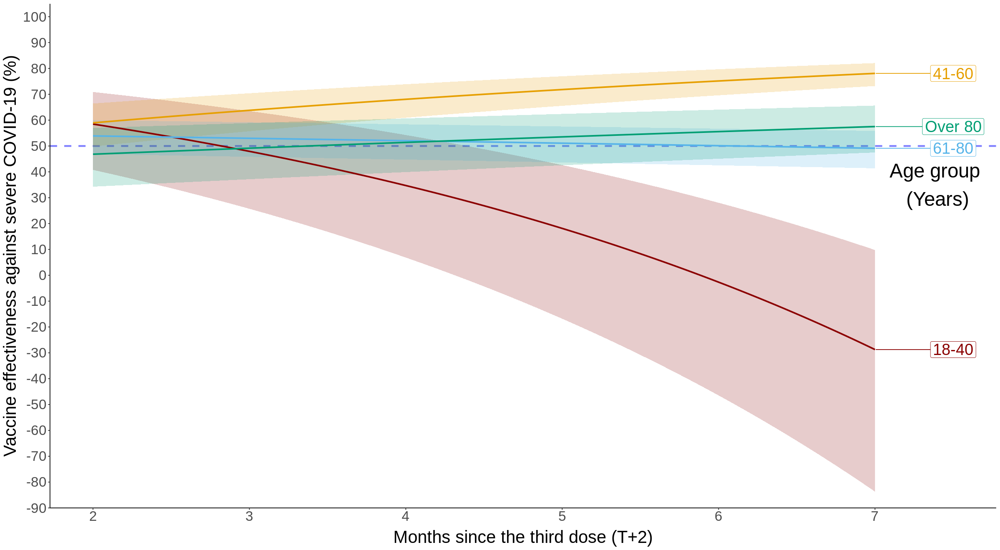

In [255]:
ve_d_azpz_18_40$Age<-"18-40"
ve_d_azpz_41_60$Age<-"41-60"
ve_d_azpz_61_80$Age<-"61-80"
ve_d_azpz_81_100$Age<-"Over 80"
ve_d_azpz_all<-rbind(ve_d_azpz_18_40,ve_d_azpz_41_60,ve_d_azpz_61_80,ve_d_azpz_81_100)
ve_d_azpz_all<-as.data.table(ve_d_azpz_all)

ggplot(ve_d_azpz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_d_azpz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_d_azpz_all$month)+2),limits = c(2,max(ve_d_azpz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-90,105),breaks=c(9:1*-10,0:10*10),name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=35, label= "Age group \n(Years)",size=10)

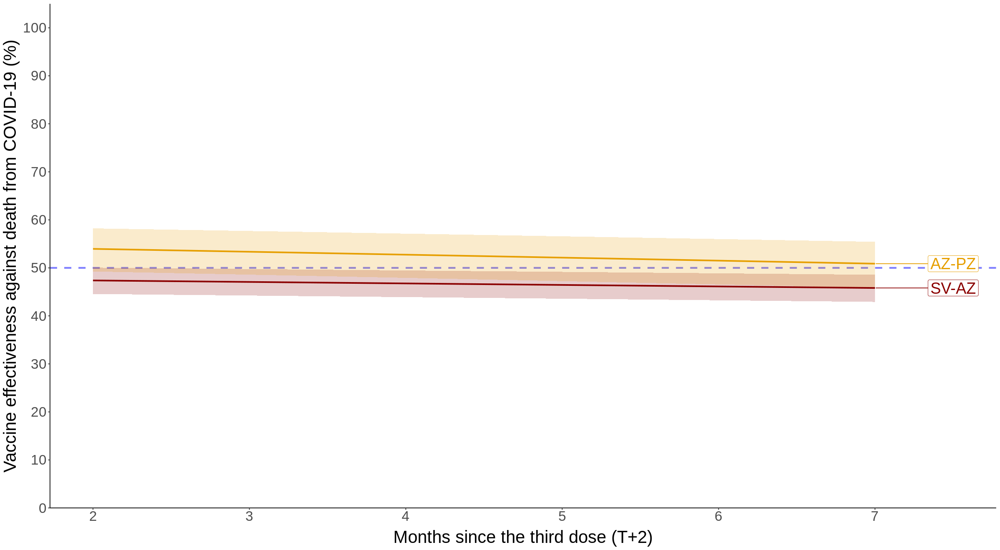

In [256]:
ve_svaz$Vaccination<-"SV-AZ"
ve_azpz$Vaccination<-"AZ-PZ"
d2_dm<-rbind(ve_svaz,ve_azpz)

d2_dm$Vaccination<-factor(d2_dm$Vaccination,levels=c("SV-AZ","AZ-PZ"))

d2_dm<-as.data.table(d2_dm)

d2_dm<-d2_dm[month<=5]

ggplot(d2_dm)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Vaccination,fill=Vaccination),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Vaccination),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(d2_dm[order(-month)],by=c("Vaccination")),
                   aes(label = Vaccination,x=month+2,y=estimate,col=Vaccination),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(d2_dm$month)+2),limits = c(2,max(d2_dm$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against death from COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

# **Regression model for 3-dose vaccination against death from COVID-19**

In [257]:
d3_death<-stratum[inf_type=="Death" & dose == 3]
d3_death<-d3_death[,c("province", "agegroup", "gender", "vac_type", "inf_type", "vac_date", "inf_date","month","a","b","c","d")]
d3_death$male<-d3_death$gender=="ชาย"

d3_death_a<-d3_death[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","a", "inf_date")]
names(d3_death_a)[7]<-"Freq"
d3_death_a$death<-TRUE

d3_death_b<-d3_death[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","b", "inf_date")]
names(d3_death_b)[7]<-"Freq"
d3_death_b$vac_type<-"None"
d3_death_b<-unique(d3_death_b,by=c("province", "agegroup", "male", "vac_date", "month", "inf_date"))
d3_death_b$death<-TRUE

d3_death_c<-d3_death[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","c", "inf_date")]
names(d3_death_c)[7]<-"Freq"
d3_death_c$death<-FALSE

d3_death_d<-d3_death[,c("province", "agegroup", "male", "vac_type", "vac_date", "month","d", "inf_date")]
names(d3_death_d)[7]<-"Freq"
d3_death_d$vac_type<-"None"
d3_death_d<-unique(d3_death_d,by=c("province", "agegroup", "male", "vac_date", "month", "inf_date"))
d3_death_d$death<-FALSE

d3_d<-rbind(d3_death_a,d3_death_b,d3_death_c,d3_death_d)

In [258]:
d3_d$agegroup<-factor(d3_d$agegroup,levels = c("18-40","41-60","61-80","Over 80"))
d3_d$vac_type<-factor(d3_d$vac_type,levels=c("None","SV-AZ-AZ","SV-AZ-PZ","SP-SP-PZ","AZ-AZ-PZ","AZ-AZ-MN","SV-SV-AZ"))
d3_d$vac_date<-factor(d3_d$vac_date,levels = c("2021-05","2021-06","2021-07","2021-08","2021-09",
                                               "2021-10","2021-11","2021-12","2022-01","2022-02",
                                               "2022-03","2022-04","2022-05"))
namep<-unique(d3_d[province !="กรุงเทพมหานคร"]$province)
d3_d$province<-factor(d3_d$province,levels = c("กรุงเทพมหานคร",namep))

**Full model for 3-dose vaccine against death from COVID-19**

In [259]:
full_d3_d<-glm(death ~ vac_type*agegroup*month+male+province+inf_date, binomial, weight=Freq, data=d3_d)

In [260]:
summary(full_d3_d)


Call:
glm(formula = death ~ vac_type * agegroup * month + male + province + 
    inf_date, family = binomial, data = d3_d, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-10.83    0.00    0.00    0.00   55.56  

Coefficients:
                                         Estimate Std. Error  z value Pr(>|z|)
(Intercept)                            -13.648033   0.074374 -183.505  < 2e-16
vac_typeSV-AZ-AZ                        -0.958284   0.337081   -2.843 0.004471
vac_typeSV-AZ-PZ                        -1.092109   0.258039   -4.232 2.31e-05
vac_typeSP-SP-PZ                        -1.000845   0.235505   -4.250 2.14e-05
vac_typeAZ-AZ-PZ                        -2.035660   0.293234   -6.942 3.86e-12
vac_typeAZ-AZ-MN                       -11.853132  40.643342   -0.292 0.770564
vac_typeSV-SV-AZ                        -1.616386   0.284943   -5.673 1.41e-08
agegroup41-60                            1.807228   0.054311   33.275  < 2e-16
agegroup61-80                 

**SV-SV-AZ**

In [261]:
d3_d_svsvaz<-d3_d[vac_type %in% c("None","SV-SV-AZ")]

In [262]:
model_d3_d_svsvaz_inter<-glm(death ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d3_d_svsvaz)

In [263]:
summary(model_d3_d_svsvaz_inter)


Call:
glm(formula = death ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d3_d_svsvaz, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-11.212   -0.133    0.000    0.000   55.713  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -1.341e+01  6.138e-02 -218.462  < 2e-16 ***
vac_typeSV-SV-AZ       -1.983e+00  1.150e-01  -17.248  < 2e-16 ***
month                  -8.499e-02  3.629e-03  -23.422  < 2e-16 ***
maleTRUE                5.853e-01  1.317e-02   44.457  < 2e-16 ***
agegroup41-60           1.569e+00  2.622e-02   59.847  < 2e-16 ***
agegroup61-80           3.006e+00  2.554e-02  117.734  < 2e-16 ***
agegroupOver 80         4.552e+00  2.791e-02  163.066  < 2e-16 ***
provinceกระบี่           -1.280e+00  1.179e-01  -10.853  < 2e-16 ***
provinceกาญจนบุรี        -4.747e-01  6.452e-02   -7.358 1.87e-13 ***
provinceกาฬสินธุ์         -1.046e+00  6.317e-02  -

In [264]:
car::vif(model_d3_d_svsvaz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.979192,1,1.726034
month,3.726196,1,1.930336
male,1.005042,1,1.002518
agegroup,1.044026,3,1.007207
province,1.100973,76,1.000633
inf_date,3.724702,12,1.056320
vac_type:month,2.825360,1,1.680881


In [265]:
exp(summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ",2])

[1] 0.1098642 0.1376342 0.1724236

In [266]:
(1-exp(summary(model_d3_d_svsvaz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svsvaz_inter)$coef[2,2]))*100

[1] 82.75764 86.23658 89.01358

In [267]:
se_svsvaz <- sqrt(vcov(model_d3_d_svsvaz_inter)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ"] + 
                  vcov(model_d3_d_svsvaz_inter)["vac_typeSV-SV-AZ:month","vac_typeSV-SV-AZ:month"]+ 
                  2*vcov(model_d3_d_svsvaz_inter)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"])
se_svsvaz

[1] 0.09153565

In [268]:
sqrt(sum(vcov(model_d3_d_svsvaz_inter)[c("vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"),c("vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month")]))

[1] 0.09153565

In [269]:
exp(summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+
      summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svsvaz)

[1] 0.1144665 0.1369600 0.1638736

In [270]:
evalues.OR(exp(summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ",2])[2], 
exp(summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ",2])[1], 
exp(summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.3623658,-0.3901358,-0.3275764
E-values,10.5985539,NA,7.6614844


In [271]:
(1-exp(summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+
         summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svsvaz))*100

[1] 83.61264 86.30400 88.55335

In [272]:
ve_svsvaz<-NULL
for(i in 0:500){
  ve_svsvaz<-rbind(ve_svsvaz,(1-exp(summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]+
                                  summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_svsvaz))*100)
}

In [273]:
ve_svsvaz<-cbind(0:500/100,ve_svsvaz)
ve_svsvaz<-as.data.frame(ve_svsvaz)
names(ve_svsvaz)<-c("month","lower","estimate","upper")

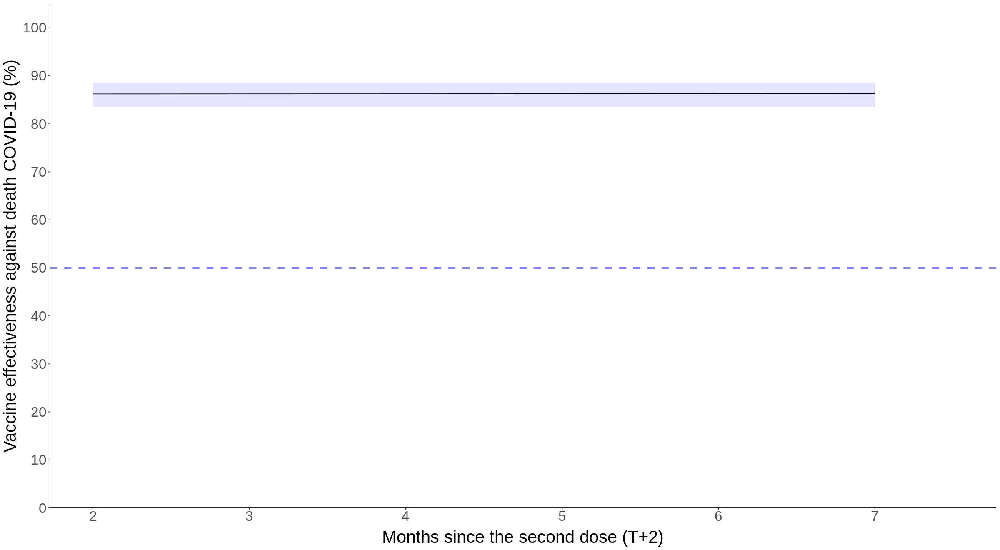

In [274]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svsvaz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [275]:
(log(0.5)-summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ",1]-qnorm(c(0.975,0.50,0.025))*se_svsvaz)/summary(model_d3_d_svsvaz_inter)$coef["vac_typeSV-SV-AZ:month",1]+2

[1] -1128.803 -1311.473 -1494.142

Stratified by age group

Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”



Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svsvaz_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.5580  -0.0892   0.0000   0.0000  14.4283  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -14.33303    0.26354 -54.386  < 2e-16 ***
vac_typeSV-SV-AZ        -1.70133    0.29856  -5.698 1.21e-08 ***
month                   -0.07853    0.01349  -5.820 5.90e-09 ***
maleTRUE                 0.42718    0.04842   8.822  < 2e-16 ***
provinceกระบี่            -0.45023    0.36832  -1.222 0.221563    
provinceกาญจนบุรี          0.25716    0.21845   1.177 0.239128    
provinceกาฬสินธุ์           0.36258    0.19432   1.866 0.062053 .  
provinceกำแพงเพชร        0.16617    0.23698   0.701 0.483173    
provinceขอนแก่น           0.03293    0.17761   0.185 0.852897    
provinceจันทบุรี            0.27658    0.25169   1.099 0.271814    
pro

[1] 0.1016212 0.1824413 0.3275382

[1] 67.24618 81.75587 89.83788

[1] 0.1979704 0.3190617 0.5142201

[1] 48.57799 68.09383 80.20296


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svsvaz_41_60, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-6.783  -0.180   0.000   0.000  35.576  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -12.180634   0.116885 -104.211  < 2e-16 ***
vac_typeSV-SV-AZ        -1.909688   0.146515  -13.034  < 2e-16 ***
month                   -0.086138   0.007017  -12.276  < 2e-16 ***
maleTRUE                 0.455966   0.023791   19.165  < 2e-16 ***
provinceกระบี่            -2.417813   0.410476   -5.890 3.86e-09 ***
provinceกาญจนบุรี          0.106379   0.098485    1.080 0.280071    
provinceกาฬสินธุ์          -0.441962   0.099929   -4.423 9.74e-06 ***
provinceกำแพงเพชร        0.158653   0.095046    1.669 0.095072 .  
provinceขอนแก่น          -0.959532   0.098584   -9.733  < 2e-16 ***
provinceจันทบุรี           -0.389516   0.136049   -2.863 0.00

[1] 0.1111525 0.1481266 0.1973998

[1] 80.26002 85.18734 88.88475

[1] 0.1055601 0.1331261 0.1678907

[1] 83.21093 86.68739 89.44399

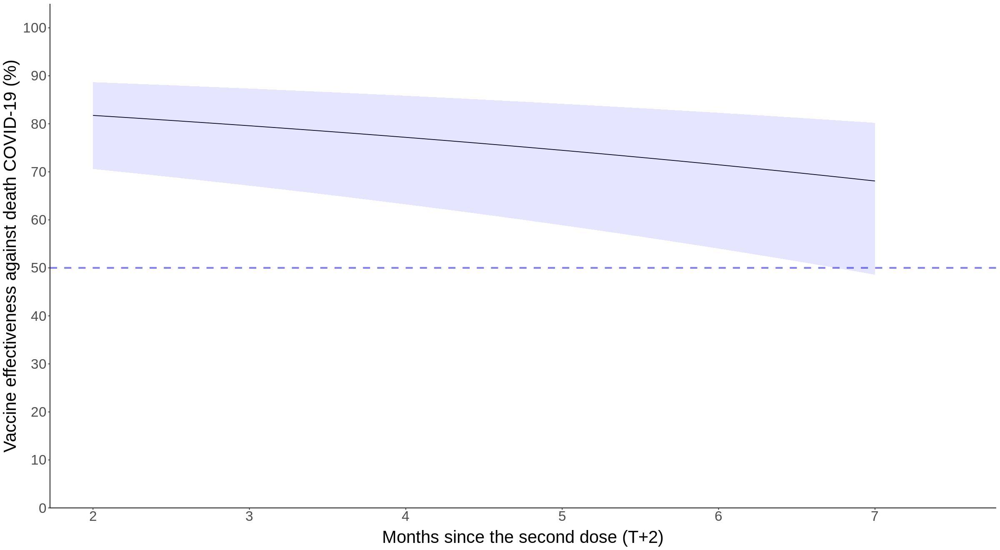


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svsvaz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-12.220   -0.121    0.000    0.000   54.683  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -10.173844   0.077792 -130.783  < 2e-16 ***
vac_typeSV-SV-AZ        -3.041695   0.424354   -7.168 7.62e-13 ***
month                   -0.103454   0.005634  -18.362  < 2e-16 ***
maleTRUE                 0.684182   0.020200   33.870  < 2e-16 ***
provinceกระบี่            -0.776865   0.140067   -5.546 2.92e-08 ***
provinceกาญจนบุรี         -1.099780   0.121809   -9.029  < 2e-16 ***
provinceกาฬสินธุ์          -1.397742   0.101452  -13.777  < 2e-16 ***
provinceกำแพงเพชร       -0.728577   0.101447   -7.182 6.88e-13 ***
provinceขอนแก่น          -1.175401   0.065063  -18.066  < 2e-16 ***
provinceจันทบุรี           -0.839413   0.120263   -

[1] 0.02078730 0.04775389 0.10970326

[1] 89.02967 95.22461 97.92127

[1] 0.01959729 0.03736100 0.07122637

[1] 92.87736 96.26390 98.04027

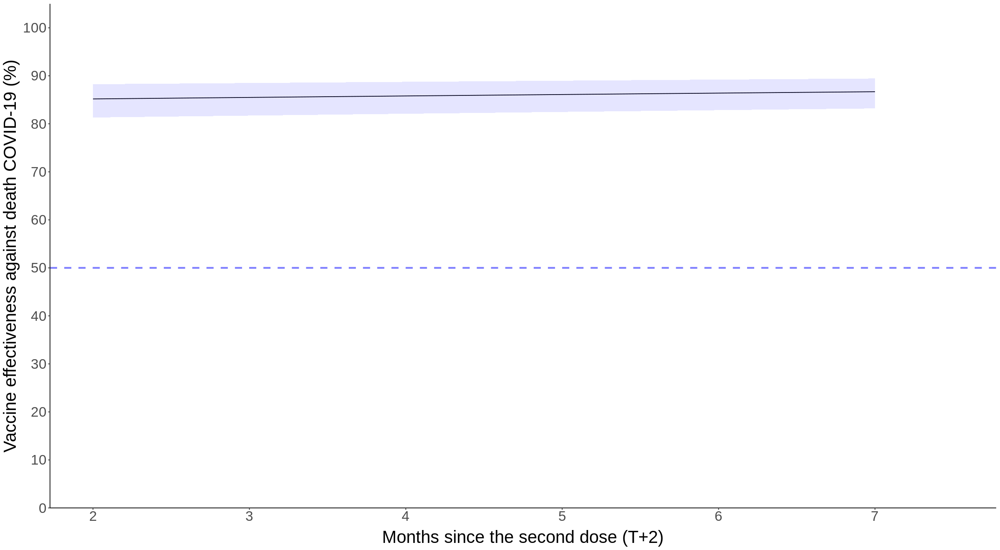


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svsvaz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.9263  -0.1126   0.0000   0.0000  28.5730  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.845813   0.134415 -65.810  < 2e-16 ***
vac_typeSV-SV-AZ        -0.864791   0.371734  -2.326 0.019999 *  
month                   -0.062020   0.007334  -8.457  < 2e-16 ***
maleTRUE                 0.629657   0.029785  21.140  < 2e-16 ***
provinceกระบี่            -2.162963   0.380105  -5.690 1.27e-08 ***
provinceกาญจนบุรี         -0.390124   0.163227  -2.390 0.016845 *  
provinceกาฬสินธุ์          -2.407004   0.280299  -8.587  < 2e-16 ***
provinceกำแพงเพชร       -0.866823   0.193358  -4.483 7.36e-06 ***
provinceขอนแก่น          -1.740200   0.130601 -13.325  < 2e-16 ***
provinceจันทบุรี           -0.724100   0.193353  -3.745 0.00

[1] 0.2032384 0.4211397 0.8726631

[1] 12.73369 57.88603 79.67616

[1] 0.1719185 0.3021612 0.5310740

[1] 46.89260 69.78388 82.80815

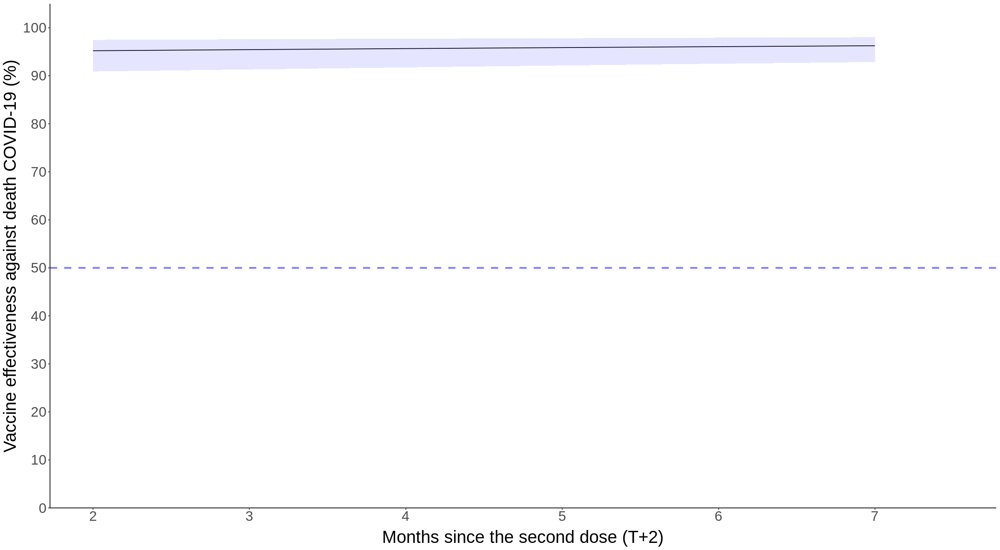

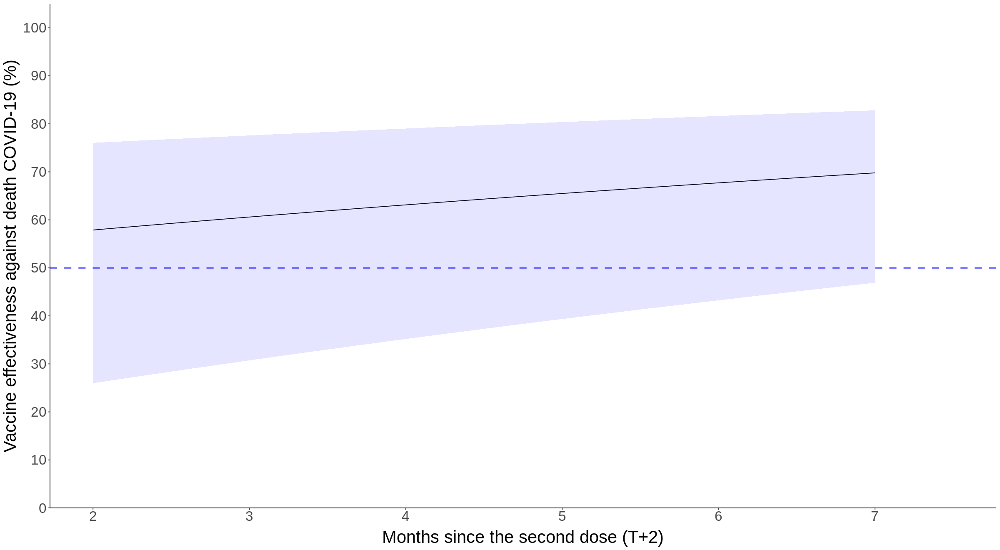

In [276]:
#Stratified by age group: 18-40
d3_d_svsvaz_18_40<-d3_d_svsvaz[agegroup=="18-40"]

model_d3_d_svsvaz_inter_18_40<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_svsvaz_18_40)
summary(model_d3_d_svsvaz_inter_18_40)

#Initial OR
exp(summary(model_d3_d_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ",2])

#Initial VE
(1-exp(summary(model_d3_d_svsvaz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svsvaz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svsvaz_18_40 <- sqrt(vcov(model_d3_d_svsvaz_inter_18_40)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ"] + 
                        vcov(model_d3_d_svsvaz_inter_18_40)["vac_typeSV-SV-AZ:month","vac_typeSV-SV-AZ:month"]+ 
                        2*vcov(model_d3_d_svsvaz_inter_18_40)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"])

exp(summary(model_d3_d_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ",1]+
      summary(model_d3_d_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svsvaz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ",1]+
         summary(model_d3_d_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svsvaz_18_40))*100

#VE overtime
ve_d_svsvaz_18_40<-NULL
for(i in 0:500){
  ve_d_svsvaz_18_40<-rbind(ve_d_svsvaz_18_40,(1-exp(summary(model_d3_d_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ",1]+
                                              summary(model_d3_d_svsvaz_inter_18_40)$coef["vac_typeSV-SV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svsvaz_18_40))*100)
}

ve_d_svsvaz_18_40<-cbind(0:500/100,ve_d_svsvaz_18_40)

ve_d_svsvaz_18_40<-as.data.frame(ve_d_svsvaz_18_40)
names(ve_d_svsvaz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svsvaz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d3_d_svsvaz_41_60<-d3_d_svsvaz[agegroup=="41-60"]

model_d3_d_svsvaz_inter_41_60<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_svsvaz_41_60)
summary(model_d3_d_svsvaz_inter_41_60)

#Initial OR
exp(summary(model_d3_d_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ",2])

#initial VE
(1-exp(summary(model_d3_d_svsvaz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svsvaz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svsvaz_41_60 <- sqrt(vcov(model_d3_d_svsvaz_inter_41_60)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ"] + 
                        vcov(model_d3_d_svsvaz_inter_41_60)["vac_typeSV-SV-AZ:month","vac_typeSV-SV-AZ:month"]+ 
                        2*vcov(model_d3_d_svsvaz_inter_41_60)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"])

exp(summary(model_d3_d_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ",1]+
      summary(model_d3_d_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svsvaz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ",1]+
         summary(model_d3_d_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svsvaz_41_60))*100

#VE overtime
ve_d_svsvaz_41_60<-NULL
for(i in 0:500){
  ve_d_svsvaz_41_60<-rbind(ve_d_svsvaz_41_60,(1-exp(summary(model_d3_d_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ",1]+
                                              summary(model_d3_d_svsvaz_inter_41_60)$coef["vac_typeSV-SV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svsvaz_41_60))*100)
}

ve_d_svsvaz_41_60<-cbind(0:500/100,ve_d_svsvaz_41_60)

ve_d_svsvaz_41_60<-as.data.frame(ve_d_svsvaz_41_60)
names(ve_d_svsvaz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svsvaz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d3_d_svsvaz_61_80<-d3_d_svsvaz[agegroup=="61-80"]

model_d3_d_svsvaz_inter_61_80<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_svsvaz_61_80)
summary(model_d3_d_svsvaz_inter_61_80)

#Initial OR
exp(summary(model_d3_d_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ",2])

#initial VE
(1-exp(summary(model_d3_d_svsvaz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svsvaz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svsvaz_61_80 <- sqrt(vcov(model_d3_d_svsvaz_inter_61_80)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ"] + 
                        vcov(model_d3_d_svsvaz_inter_61_80)["vac_typeSV-SV-AZ:month","vac_typeSV-SV-AZ:month"]+ 
                        2*vcov(model_d3_d_svsvaz_inter_61_80)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"])

exp(summary(model_d3_d_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ",1]+
      summary(model_d3_d_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svsvaz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ",1]+
         summary(model_d3_d_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svsvaz_61_80))*100

#VE overtime
ve_d_svsvaz_61_80<-NULL
for(i in 0:500){
  ve_d_svsvaz_61_80<-rbind(ve_d_svsvaz_61_80,(1-exp(summary(model_d3_d_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ",1]+
                                              summary(model_d3_d_svsvaz_inter_61_80)$coef["vac_typeSV-SV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svsvaz_61_80))*100)
}

ve_d_svsvaz_61_80<-cbind(0:500/100,ve_d_svsvaz_61_80)

ve_d_svsvaz_61_80<-as.data.frame(ve_d_svsvaz_61_80)
names(ve_d_svsvaz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svsvaz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d3_d_svsvaz_81_100<-d3_d_svsvaz[agegroup=="Over 80"]

model_d3_d_svsvaz_inter_81_100<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_svsvaz_81_100)
summary(model_d3_d_svsvaz_inter_81_100)

#Initial OR
exp(summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",2])

#initial VE
(1-exp(summary(model_d3_d_svsvaz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svsvaz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svsvaz_81_100 <- sqrt(vcov(model_d3_d_svsvaz_inter_81_100)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ"] + 
                        vcov(model_d3_d_svsvaz_inter_81_100)["vac_typeSV-SV-AZ:month","vac_typeSV-SV-AZ:month"]+ 
                        2*vcov(model_d3_d_svsvaz_inter_81_100)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"])

exp(summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+
      summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svsvaz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+
         summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svsvaz_81_100))*100

#VE overtime
ve_d_svsvaz_81_100<-NULL
for(i in 0:500){
  ve_d_svsvaz_81_100<-rbind(ve_d_svsvaz_81_100,(1-exp(summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+
                                              summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svsvaz_81_100))*100)
}

ve_d_svsvaz_81_100<-cbind(0:500/100,ve_d_svsvaz_81_100)

ve_d_svsvaz_81_100<-as.data.frame(ve_d_svsvaz_81_100)
names(ve_d_svsvaz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svsvaz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [277]:
summary(model_d3_d_svsvaz_inter_81_100)

#Initial OR
exp(summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",2])

#initial VE
(1-exp(summary(model_d3_d_svsvaz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svsvaz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svsvaz_81_100 <- sqrt(vcov(model_d3_d_svsvaz_inter_81_100)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ"] + 
                        vcov(model_d3_d_svsvaz_inter_81_100)["vac_typeSV-SV-AZ:month","vac_typeSV-SV-AZ:month"]+ 
                        2*vcov(model_d3_d_svsvaz_inter_81_100)["vac_typeSV-SV-AZ","vac_typeSV-SV-AZ:month"])

exp(summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+
      summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svsvaz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ",1]+
         summary(model_d3_d_svsvaz_inter_81_100)$coef["vac_typeSV-SV-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svsvaz_81_100))*100


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svsvaz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.9263  -0.1126   0.0000   0.0000  28.5730  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.845813   0.134415 -65.810  < 2e-16 ***
vac_typeSV-SV-AZ        -0.864791   0.371734  -2.326 0.019999 *  
month                   -0.062020   0.007334  -8.457  < 2e-16 ***
maleTRUE                 0.629657   0.029785  21.140  < 2e-16 ***
provinceกระบี่            -2.162963   0.380105  -5.690 1.27e-08 ***
provinceกาญจนบุรี         -0.390124   0.163227  -2.390 0.016845 *  
provinceกาฬสินธุ์          -2.407004   0.280299  -8.587  < 2e-16 ***
provinceกำแพงเพชร       -0.866823   0.193358  -4.483 7.36e-06 ***
provinceขอนแก่น          -1.740200   0.130601 -13.325  < 2e-16 ***
provinceจันทบุรี           -0.724100   0.193353  -3.745 0.00

[1] 0.2032384 0.4211397 0.8726631

[1] 12.73369 57.88603 79.67616

[1] 0.1719185 0.3021612 0.5310740

[1] 46.89260 69.78388 82.80815

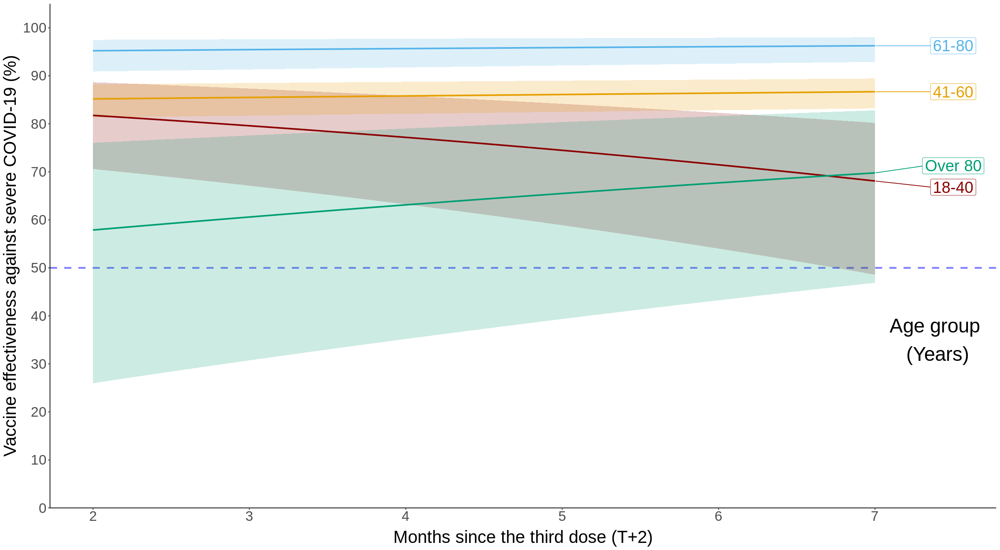

In [278]:
ve_d_svsvaz_18_40$Age<-"18-40"
ve_d_svsvaz_41_60$Age<-"41-60"
ve_d_svsvaz_61_80$Age<-"61-80"
ve_d_svsvaz_81_100$Age<-"Over 80"
ve_d_svsvaz_all<-rbind(ve_d_svsvaz_18_40,ve_d_svsvaz_41_60,ve_d_svsvaz_61_80,ve_d_svsvaz_81_100)
ve_d_svsvaz_all<-as.data.table(ve_d_svsvaz_all)

ggplot(ve_d_svsvaz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_d_svsvaz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_d_svsvaz_all$month)+2),limits = c(2,max(ve_d_svsvaz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=35, label= "Age group \n(Years)",size=10)

**SV-AZ-AZ**

In [279]:
d3_d_svazaz<-d3_d[vac_type %in% c("None","SV-AZ-AZ")]

In [280]:
model_d3_d_svazaz_inter<-glm(death ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d3_d_svazaz)

In [281]:
summary(model_d3_d_svazaz_inter)


Call:
glm(formula = death ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d3_d_svazaz, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-11.266   -0.142    0.000    0.000   55.671  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -13.412567   0.061449 -218.272  < 2e-16 ***
vac_typeSV-AZ-AZ        -1.271465   0.093264  -13.633  < 2e-16 ***
month                   -0.086409   0.003627  -23.827  < 2e-16 ***
maleTRUE                 0.588755   0.013165   44.722  < 2e-16 ***
agegroup41-60            1.575175   0.026398   59.670  < 2e-16 ***
agegroup61-80            3.019189   0.025660  117.660  < 2e-16 ***
agegroupOver 80          4.558732   0.028023  162.679  < 2e-16 ***
provinceกระบี่            -1.302929   0.117917  -11.050  < 2e-16 ***
provinceกาญจนบุรี         -0.493748   0.064538   -7.650 2.00e-14 ***
provinceกาฬสินธุ์          -1.059719   0.063185  -

In [282]:
car::vif(model_d3_d_svazaz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.092693,1,1.446614
month,3.760855,1,1.939292
male,1.005042,1,1.002518
agegroup,1.037491,3,1.006153
province,1.072074,76,1.000458
inf_date,3.764330,12,1.056786
vac_type:month,1.898376,1,1.377816


In [283]:
exp(summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ",2])

[1] 0.2335733 0.2804204 0.3366635

In [284]:
(1-exp(summary(model_d3_d_svazaz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svazaz_inter)$coef[2,2]))*100

[1] 66.33365 71.95796 76.64267

In [285]:
se_svazaz <- sqrt(vcov(model_d3_d_svazaz_inter)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ"] + 
                  vcov(model_d3_d_svazaz_inter)["vac_typeSV-AZ-AZ:month","vac_typeSV-AZ-AZ:month"]+ 
                  2*vcov(model_d3_d_svazaz_inter)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"])
se_svazaz

[1] 0.07050719

In [286]:
sqrt(sum(vcov(model_d3_d_svazaz_inter)[c("vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"),c("vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month")]))

[1] 0.07050719

In [287]:
exp(summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+
      summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazaz)

[1] 0.3384744 0.3886348 0.4462287

In [288]:
evalues.OR(exp(summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ",2])[2], 
exp(summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ",2])[1], 
exp(summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.2195796,-0.2664267,-0.1633365
E-values,3.1768926,NA,1.9753074


In [289]:
(1-exp(summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+
         summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazaz))*100

[1] 55.37713 61.13652 66.15256

In [290]:
ve_svazaz<-NULL
for(i in 0:500){
  ve_svazaz<-rbind(ve_svazaz,(1-exp(summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]+
                                  summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_svazaz))*100)
}

In [291]:
ve_svazaz<-cbind(0:500/100,ve_svazaz)
ve_svazaz<-as.data.frame(ve_svazaz)
names(ve_svazaz)<-c("month","lower","estimate","upper")

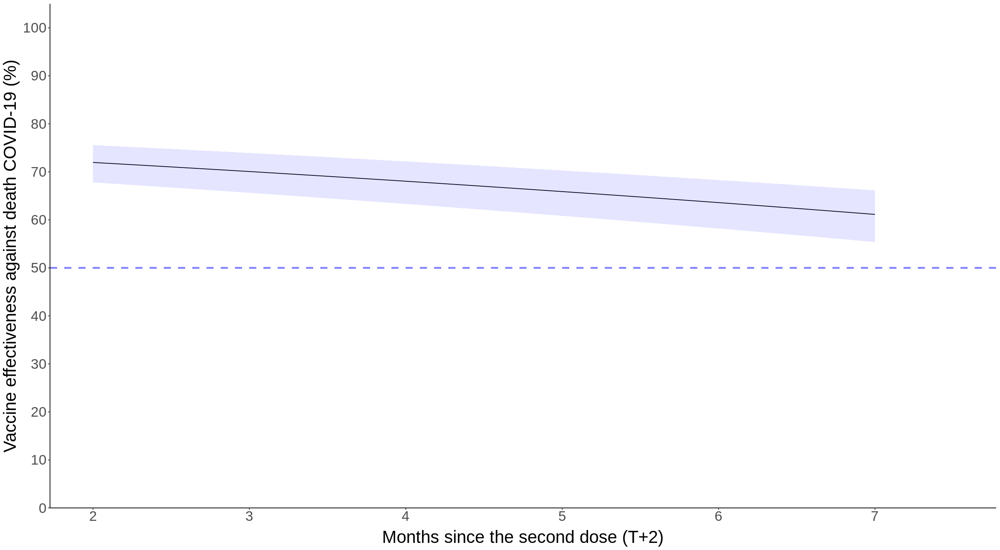

In [292]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svazaz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [293]:
(log(0.5)-summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ",1]-qnorm(c(0.975,0.50,0.025))*se_svazaz)/summary(model_d3_d_svazaz_inter)$coef["vac_typeSV-AZ-AZ:month",1]+2

[1]  8.743164 10.860391 12.977619


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svazaz_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.4981  -0.0655   0.0000   0.0000  14.4588  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -14.35589    0.26522 -54.128  < 2e-16 ***
vac_typeSV-AZ-AZ        -1.19468    0.35135  -3.400 0.000673 ***
month                   -0.07915    0.01356  -5.839 5.24e-09 ***
maleTRUE                 0.39531    0.04859   8.135 4.11e-16 ***
provinceกระบี่            -0.39368    0.36967  -1.065 0.286898    
provinceกาญจนบุรี          0.29471    0.22064   1.336 0.181633    
provinceกาฬสินธุ์           0.40632    0.19674   2.065 0.038901 *  
provinceกำแพงเพชร        0.24042    0.23482   1.024 0.305923    
provinceขอนแก่น           0.07720    0.18027   0.428 0.668484    
provinceจันทบุรี            0.42199    0.24351   1.733 0.083108 .  
pro

[1] 0.1520851 0.3028018 0.6028791

[1] 39.71209 69.71982 84.79149

[1] 0.2391486 0.4015753 0.6743203

[1] 32.56797 59.84247 76.08514


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svazaz_41_60, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-6.771  -0.163   0.000   0.000  35.565  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -12.181824   0.117129 -104.004  < 2e-16 ***
vac_typeSV-AZ-AZ        -1.451188   0.173683   -8.355  < 2e-16 ***
month                   -0.089439   0.007032  -12.719  < 2e-16 ***
maleTRUE                 0.464600   0.023953   19.396  < 2e-16 ***
provinceกระบี่            -2.417670   0.410560   -5.889 3.89e-09 ***
provinceกาญจนบุรี          0.097021   0.098812    0.982 0.326162    
provinceกาฬสินธุ์          -0.448420   0.100238   -4.474 7.69e-06 ***
provinceกำแพงเพชร        0.224193   0.092106    2.434 0.014930 *  
provinceขอนแก่น          -0.975035   0.099215   -9.827  < 2e-16 ***
provinceจันทบุรี           -0.467103   0.140592   -3.322 0.00

[1] 0.1666931 0.2342919 0.3293039

[1] 67.06961 76.57081 83.33069

[1] 0.1658274 0.2154603 0.2799485

[1] 72.00515 78.45397 83.41726

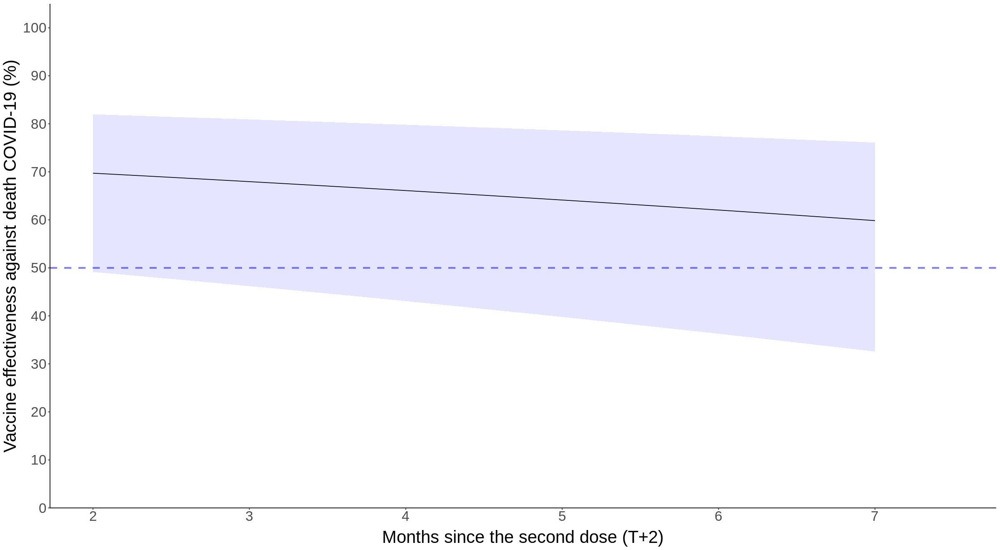


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svazaz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-12.243   -0.221    0.000    0.000   54.665  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -10.171755   0.077765 -130.800  < 2e-16 ***
vac_typeSV-AZ-AZ        -1.248517   0.133901   -9.324  < 2e-16 ***
month                   -0.103051   0.005625  -18.319  < 2e-16 ***
maleTRUE                 0.687095   0.020102   34.180  < 2e-16 ***
provinceกระบี่            -0.815012   0.140087   -5.818 5.96e-09 ***
provinceกาญจนบุรี         -1.120226   0.121805   -9.197  < 2e-16 ***
provinceกาฬสินธุ์          -1.409698   0.101437  -13.897  < 2e-16 ***
provinceกำแพงเพชร       -0.777426   0.101502   -7.659 1.87e-14 ***
provinceขอนแก่น          -1.178214   0.064682  -18.216  < 2e-16 ***
provinceจันทบุรี           -0.860591   0.120258   -

[1] 0.2206985 0.2869299 0.3730374

[1] 62.69626 71.30701 77.93015

[1] 0.3676519 0.4488386 0.5479534

[1] 45.20466 55.11614 63.23481

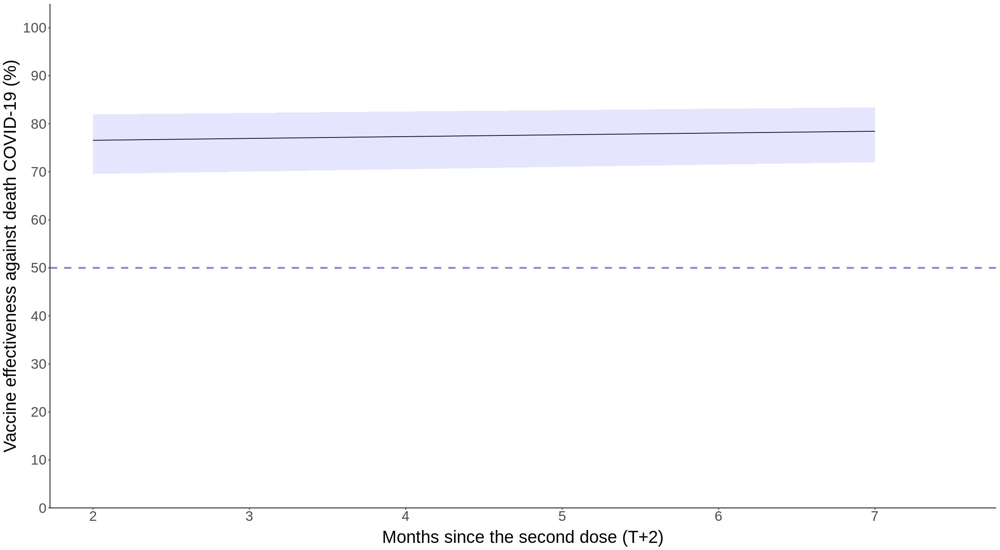


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svazaz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.9697  -0.1454   0.0000   0.0000  28.5490  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.834630   0.134362 -65.753  < 2e-16 ***
vac_typeSV-AZ-AZ        -1.114041   0.240773  -4.627 3.71e-06 ***
month                   -0.063632   0.007321  -8.692  < 2e-16 ***
maleTRUE                 0.631091   0.029731  21.226  < 2e-16 ***
provinceกระบี่            -2.203987   0.380111  -5.798 6.70e-09 ***
provinceกาญจนบุรี         -0.414870   0.163202  -2.542 0.011020 *  
provinceกาฬสินธุ์          -2.425167   0.280276  -8.653  < 2e-16 ***
provinceกำแพงเพชร       -0.909283   0.193375  -4.702 2.57e-06 ***
provinceขอนแก่น          -1.762506   0.130562 -13.499  < 2e-16 ***
provinceจันทบุรี           -0.748885   0.193326  -3.874 0.00

[1] 0.2047536 0.3282299 0.5261682

[1] 47.38318 67.17701 79.52464

[1] 0.4858045 0.6878144 0.9738252

[1]  2.617478 31.218555 51.419546

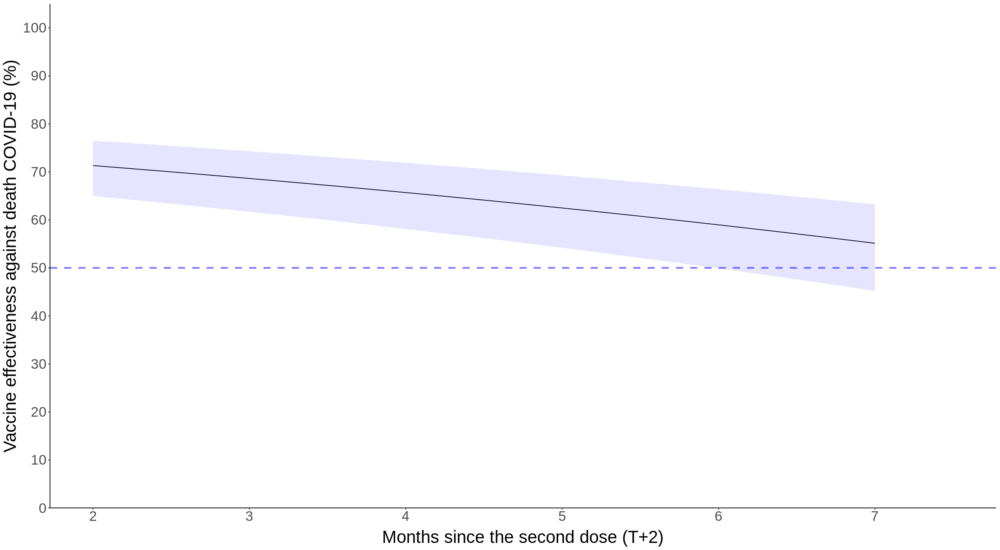

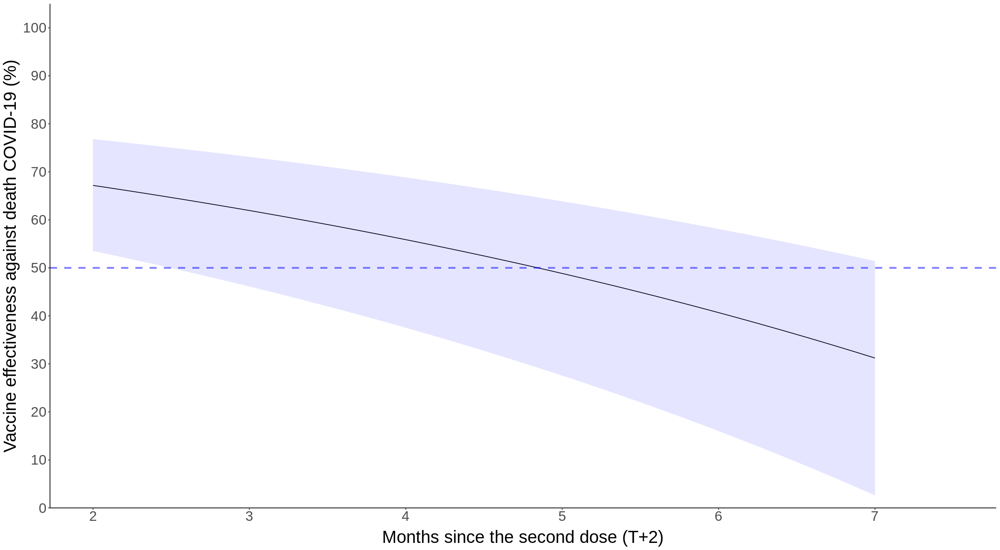

In [294]:
#Stratified by age group: 18-40
d3_d_svazaz_18_40<-d3_d_svazaz[agegroup=="18-40"]

model_d3_d_svazaz_inter_18_40<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_svazaz_18_40)
summary(model_d3_d_svazaz_inter_18_40)

#Initial OR
exp(summary(model_d3_d_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ",2])

#Initial VE
(1-exp(summary(model_d3_d_svazaz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svazaz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazaz_18_40 <- sqrt(vcov(model_d3_d_svazaz_inter_18_40)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ"] + 
                        vcov(model_d3_d_svazaz_inter_18_40)["vac_typeSV-AZ-AZ:month","vac_typeSV-AZ-AZ:month"]+ 
                        2*vcov(model_d3_d_svazaz_inter_18_40)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"])

exp(summary(model_d3_d_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ",1]+
      summary(model_d3_d_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazaz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ",1]+
         summary(model_d3_d_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazaz_18_40))*100

#VE overtime
ve_d_svazaz_18_40<-NULL
for(i in 0:500){
  ve_d_svazaz_18_40<-rbind(ve_d_svazaz_18_40,(1-exp(summary(model_d3_d_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ",1]+
                                              summary(model_d3_d_svazaz_inter_18_40)$coef["vac_typeSV-AZ-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazaz_18_40))*100)
}

ve_d_svazaz_18_40<-cbind(0:500/100,ve_d_svazaz_18_40)

ve_d_svazaz_18_40<-as.data.frame(ve_d_svazaz_18_40)
names(ve_d_svazaz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svazaz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d3_d_svazaz_41_60<-d3_d_svazaz[agegroup=="41-60"]

model_d3_d_svazaz_inter_41_60<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_svazaz_41_60)
summary(model_d3_d_svazaz_inter_41_60)

#Initial OR
exp(summary(model_d3_d_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ",2])

#initial VE
(1-exp(summary(model_d3_d_svazaz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svazaz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazaz_41_60 <- sqrt(vcov(model_d3_d_svazaz_inter_41_60)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ"] + 
                        vcov(model_d3_d_svazaz_inter_41_60)["vac_typeSV-AZ-AZ:month","vac_typeSV-AZ-AZ:month"]+ 
                        2*vcov(model_d3_d_svazaz_inter_41_60)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"])

exp(summary(model_d3_d_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ",1]+
      summary(model_d3_d_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazaz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ",1]+
         summary(model_d3_d_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazaz_41_60))*100

#VE overtime
ve_d_svazaz_41_60<-NULL
for(i in 0:500){
  ve_d_svazaz_41_60<-rbind(ve_d_svazaz_41_60,(1-exp(summary(model_d3_d_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ",1]+
                                              summary(model_d3_d_svazaz_inter_41_60)$coef["vac_typeSV-AZ-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazaz_41_60))*100)
}

ve_d_svazaz_41_60<-cbind(0:500/100,ve_d_svazaz_41_60)

ve_d_svazaz_41_60<-as.data.frame(ve_d_svazaz_41_60)
names(ve_d_svazaz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svazaz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d3_d_svazaz_61_80<-d3_d_svazaz[agegroup=="61-80"]

model_d3_d_svazaz_inter_61_80<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_svazaz_61_80)
summary(model_d3_d_svazaz_inter_61_80)

#Initial OR
exp(summary(model_d3_d_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ",2])

#initial VE
(1-exp(summary(model_d3_d_svazaz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svazaz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazaz_61_80 <- sqrt(vcov(model_d3_d_svazaz_inter_61_80)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ"] + 
                        vcov(model_d3_d_svazaz_inter_61_80)["vac_typeSV-AZ-AZ:month","vac_typeSV-AZ-AZ:month"]+ 
                        2*vcov(model_d3_d_svazaz_inter_61_80)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"])

exp(summary(model_d3_d_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ",1]+
      summary(model_d3_d_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazaz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ",1]+
         summary(model_d3_d_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazaz_61_80))*100

#VE overtime
ve_d_svazaz_61_80<-NULL
for(i in 0:500){
  ve_d_svazaz_61_80<-rbind(ve_d_svazaz_61_80,(1-exp(summary(model_d3_d_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ",1]+
                                              summary(model_d3_d_svazaz_inter_61_80)$coef["vac_typeSV-AZ-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazaz_61_80))*100)
}

ve_d_svazaz_61_80<-cbind(0:500/100,ve_d_svazaz_61_80)

ve_d_svazaz_61_80<-as.data.frame(ve_d_svazaz_61_80)
names(ve_d_svazaz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svazaz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d3_d_svazaz_81_100<-d3_d_svazaz[agegroup=="Over 80"]

model_d3_d_svazaz_inter_81_100<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_svazaz_81_100)
summary(model_d3_d_svazaz_inter_81_100)

#Initial OR
exp(summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",2])

#initial VE
(1-exp(summary(model_d3_d_svazaz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svazaz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazaz_81_100 <- sqrt(vcov(model_d3_d_svazaz_inter_81_100)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ"] + 
                        vcov(model_d3_d_svazaz_inter_81_100)["vac_typeSV-AZ-AZ:month","vac_typeSV-AZ-AZ:month"]+ 
                        2*vcov(model_d3_d_svazaz_inter_81_100)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"])

exp(summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+
      summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazaz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+
         summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazaz_81_100))*100

#VE overtime
ve_d_svazaz_81_100<-NULL
for(i in 0:500){
  ve_d_svazaz_81_100<-rbind(ve_d_svazaz_81_100,(1-exp(summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+
                                              summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazaz_81_100))*100)
}

ve_d_svazaz_81_100<-cbind(0:500/100,ve_d_svazaz_81_100)

ve_d_svazaz_81_100<-as.data.frame(ve_d_svazaz_81_100)
names(ve_d_svazaz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svazaz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [295]:
summary(model_d3_d_svazaz_inter_81_100)

#Initial OR
exp(summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",2])

#initial VE
(1-exp(summary(model_d3_d_svazaz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svazaz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazaz_81_100 <- sqrt(vcov(model_d3_d_svazaz_inter_81_100)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ"] + 
                        vcov(model_d3_d_svazaz_inter_81_100)["vac_typeSV-AZ-AZ:month","vac_typeSV-AZ-AZ:month"]+ 
                        2*vcov(model_d3_d_svazaz_inter_81_100)["vac_typeSV-AZ-AZ","vac_typeSV-AZ-AZ:month"])

exp(summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+
      summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazaz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ",1]+
         summary(model_d3_d_svazaz_inter_81_100)$coef["vac_typeSV-AZ-AZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazaz_81_100))*100



Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svazaz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.9697  -0.1454   0.0000   0.0000  28.5490  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.834630   0.134362 -65.753  < 2e-16 ***
vac_typeSV-AZ-AZ        -1.114041   0.240773  -4.627 3.71e-06 ***
month                   -0.063632   0.007321  -8.692  < 2e-16 ***
maleTRUE                 0.631091   0.029731  21.226  < 2e-16 ***
provinceกระบี่            -2.203987   0.380111  -5.798 6.70e-09 ***
provinceกาญจนบุรี         -0.414870   0.163202  -2.542 0.011020 *  
provinceกาฬสินธุ์          -2.425167   0.280276  -8.653  < 2e-16 ***
provinceกำแพงเพชร       -0.909283   0.193375  -4.702 2.57e-06 ***
provinceขอนแก่น          -1.762506   0.130562 -13.499  < 2e-16 ***
provinceจันทบุรี           -0.748885   0.193326  -3.874 0.00

[1] 0.2047536 0.3282299 0.5261682

[1] 47.38318 67.17701 79.52464

[1] 0.4858045 0.6878144 0.9738252

[1]  2.617478 31.218555 51.419546

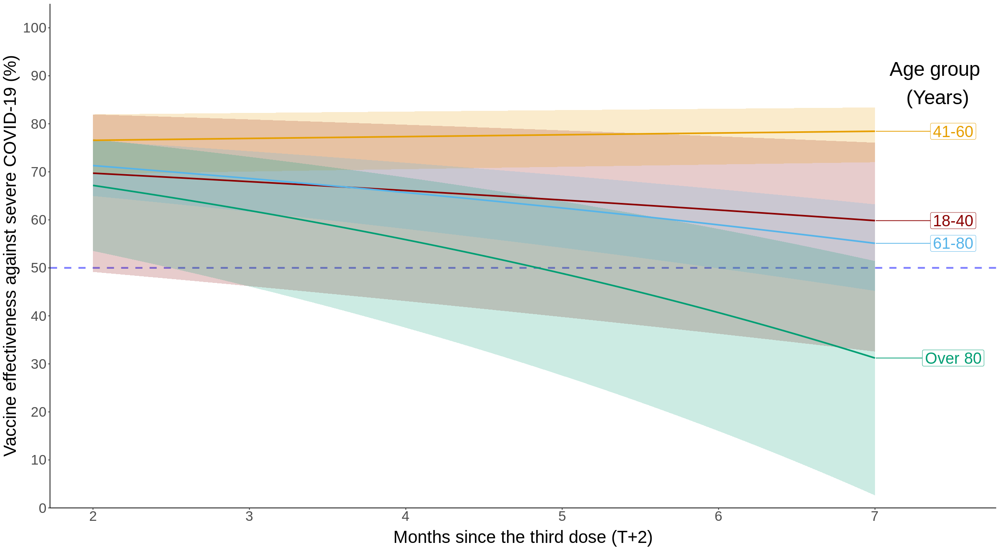

In [296]:
ve_d_svazaz_18_40$Age<-"18-40"
ve_d_svazaz_41_60$Age<-"41-60"
ve_d_svazaz_61_80$Age<-"61-80"
ve_d_svazaz_81_100$Age<-"Over 80"
ve_d_svazaz_all<-rbind(ve_d_svazaz_18_40,ve_d_svazaz_41_60,ve_d_svazaz_61_80,ve_d_svazaz_81_100)
ve_d_svazaz_all<-as.data.table(ve_d_svazaz_all)

ggplot(ve_d_svazaz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_d_svazaz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_d_svazaz_all$month)+2),limits = c(2,max(ve_d_svazaz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=88.5, label= "Age group \n(Years)",size=10)

**SV-AZ-PZ**

In [297]:
d3_d_svazpz<-d3_d[vac_type %in% c("None","SV-AZ-PZ")]

In [298]:
model_d3_d_svazpz_inter<-glm(death ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d3_d_svazpz)

In [299]:
summary(model_d3_d_svazpz_inter)


Call:
glm(formula = death ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d3_d_svazpz, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-11.222   -0.161    0.000    0.000   55.699  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -13.414866   0.061424 -218.399  < 2e-16 ***
vac_typeSV-AZ-PZ        -1.510271   0.071819  -21.029  < 2e-16 ***
month                   -0.086187   0.003619  -23.812  < 2e-16 ***
maleTRUE                 0.585284   0.013103   44.667  < 2e-16 ***
agegroup41-60            1.578827   0.026309   60.010  < 2e-16 ***
agegroup61-80            3.016254   0.025587  117.881  < 2e-16 ***
agegroupOver 80          4.563314   0.027931  163.377  < 2e-16 ***
provinceกระบี่            -1.280209   0.117914  -10.857  < 2e-16 ***
provinceกาญจนบุรี         -0.465152   0.063998   -7.268 3.64e-13 ***
provinceกาฬสินธุ์          -1.057105   0.062793  -

In [300]:
car::vif(model_d3_d_svazpz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.303097,1,1.517596
month,3.803219,1,1.950184
male,1.004900,1,1.002447
agegroup,1.037763,3,1.006197
province,1.071953,76,1.000457
inf_date,3.803430,12,1.057241
vac_type:month,1.945630,1,1.394858


In [301]:
exp(summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ",2])

[1] 0.1918515 0.2208502 0.2542321

In [302]:
(1-exp(summary(model_d3_d_svazpz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svazpz_inter)$coef[2,2]))*100

[1] 74.57679 77.91498 80.81485

In [303]:
se_svazpz <- sqrt(vcov(model_d3_d_svazpz_inter)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ"] + 
                  vcov(model_d3_d_svazpz_inter)["vac_typeSV-AZ-PZ:month","vac_typeSV-AZ-PZ:month"]+ 
                  2*vcov(model_d3_d_svazpz_inter)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"])
se_svazpz

[1] 0.05519997

In [304]:
sqrt(sum(vcov(model_d3_d_svazpz_inter)[c("vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"),c("vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month")]))

[1] 0.05519997

In [305]:
exp(summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+
      summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazpz)

[1] 0.3561766 0.3968732 0.4422196

In [306]:
evalues.OR(exp(summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ",2])[2], 
exp(summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ",2])[1], 
exp(summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.2791498,-0.3081485,-0.2457679
E-values,5.1105445,NA,3.9160114


In [307]:
(1-exp(summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+
         summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazpz))*100

[1] 55.77804 60.31268 64.38234

In [308]:
ve_svazpz<-NULL
for(i in 0:500){
  ve_svazpz<-rbind(ve_svazpz,(1-exp(summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]+
                                  summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_svazpz))*100)
}

In [309]:
ve_svazpz<-cbind(0:500/100,ve_svazpz)
ve_svazpz<-as.data.frame(ve_svazpz)
names(ve_svazpz)<-c("month","lower","estimate","upper")

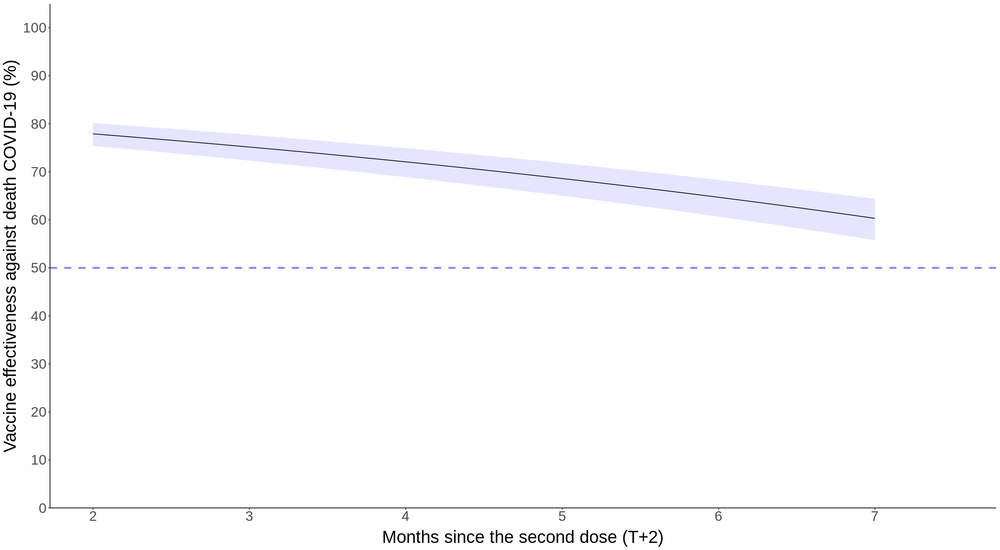

In [310]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_svazpz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [311]:
(log(0.5)-summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ",1]-qnorm(c(0.975,0.50,0.025))*se_svazpz)/summary(model_d3_d_svazpz_inter)$coef["vac_typeSV-AZ-PZ:month",1]+2

[1] 8.047558 8.970472 9.893387

*Stratified by age group*

Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”



Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svazpz_18_40, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-2.461  -0.071   0.000   0.000  14.475  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -14.375931   0.265722 -54.101  < 2e-16 ***
vac_typeSV-AZ-PZ        -1.396861   0.275457  -5.071 3.96e-07 ***
month                   -0.078813   0.013543  -5.819 5.91e-09 ***
maleTRUE                 0.385344   0.048394   7.963 1.69e-15 ***
provinceกระบี่            -0.355700   0.370026  -0.961 0.336410    
provinceกาญจนบุรี          0.327332   0.221244   1.480 0.139004    
provinceกาฬสินธุ์           0.427680   0.197447   2.166 0.030307 *  
provinceกำแพงเพชร        0.230481   0.239545   0.962 0.335970    
provinceขอนแก่น           0.096906   0.181039   0.535 0.592456    
provinceจันทบุรี            0.352327   0.254136   1.386 0.165633    
pr

[1] 0.1441721 0.2473723 0.4244444

[1] 57.55556 75.26277 85.58279

[1] 0.1071375 0.1644184 0.2523246

[1] 74.76754 83.55816 89.28625


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svazpz_41_60, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-6.755  -0.201   0.000   0.000  35.563  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -12.174830   0.117058 -104.007  < 2e-16 ***
vac_typeSV-AZ-PZ        -1.522265   0.125924  -12.089  < 2e-16 ***
month                   -0.089756   0.007010  -12.803  < 2e-16 ***
maleTRUE                 0.459115   0.023796   19.294  < 2e-16 ***
provinceกระบี่            -2.411077   0.410544   -5.873 4.28e-09 ***
provinceกาญจนบุรี          0.095675   0.098735    0.969 0.332545    
provinceกาฬสินธุ์          -0.434351   0.098883   -4.393 1.12e-05 ***
provinceกำแพงเพชร        0.185055   0.093467    1.980 0.047715 *  
provinceขอนแก่น          -0.993254   0.099149  -10.018  < 2e-16 ***
provinceจันทบุรี           -0.468601   0.140539   -3.334 0.00

[1] 0.1704912 0.2182171 0.2793028

[1] 72.06972 78.17829 82.95088

[1] 0.3049782 0.3693429 0.4472915

[1] 55.27085 63.06571 69.50218

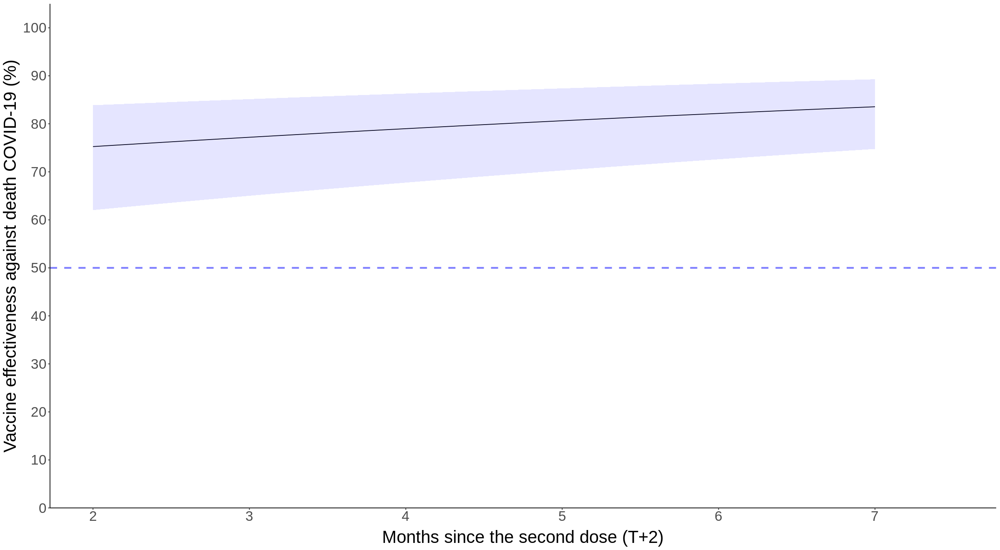


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svazpz_61_80, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-12.24   -0.24    0.00    0.00   54.68  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -10.173169   0.077773 -130.806  < 2e-16 ***
vac_typeSV-AZ-PZ        -1.705201   0.109669  -15.549  < 2e-16 ***
month                   -0.103355   0.005613  -18.414  < 2e-16 ***
maleTRUE                 0.683470   0.020027   34.128  < 2e-16 ***
provinceกระบี่            -0.781580   0.140066   -5.580 2.40e-08 ***
provinceกาญจนบุรี         -1.107046   0.121809   -9.088  < 2e-16 ***
provinceกาฬสินธุ์          -1.423029   0.101462  -14.025  < 2e-16 ***
provinceกำแพงเพชร       -0.737895   0.101007   -7.305 2.76e-13 ***
provinceขอนแก่น          -1.167649   0.064268  -18.168  < 2e-16 ***
provinceจันทบุรี           -0.849336   0.120262   -7.062 1.64

[1] 0.1465851 0.1817358 0.2253155

[1] 77.46845 81.82642 85.34149

[1] 0.2829020 0.3340115 0.3943545

[1] 60.56455 66.59885 71.70980

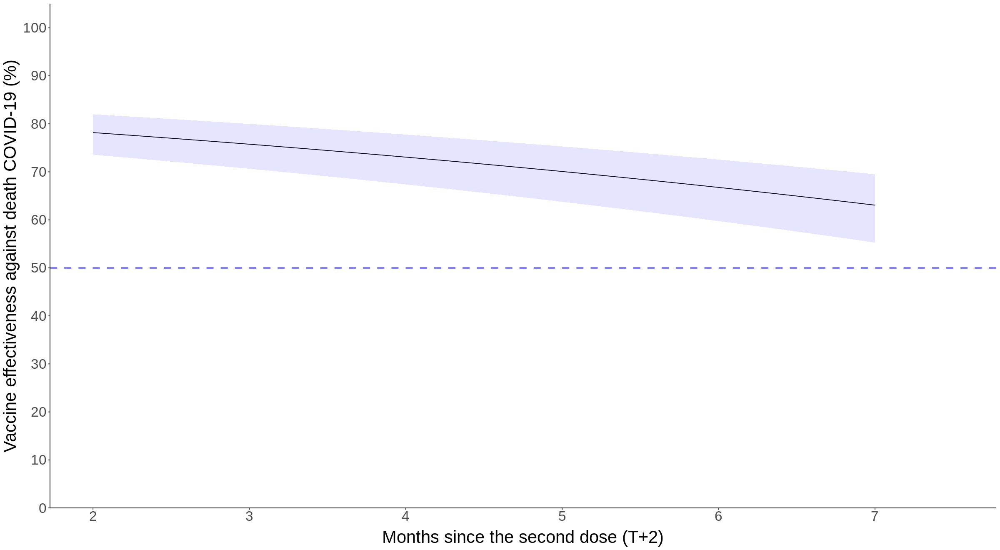


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svazpz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.9623  -0.1737   0.0000   0.0000  28.5601  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.842827   0.134395 -65.797  < 2e-16 ***
vac_typeSV-AZ-PZ        -1.133205   0.173660  -6.525 6.78e-11 ***
month                   -0.062500   0.007316  -8.543  < 2e-16 ***
maleTRUE                 0.633112   0.029622  21.373  < 2e-16 ***
provinceกระบี่            -2.174297   0.380101  -5.720 1.06e-08 ***
provinceกาญจนบุรี         -0.287871   0.154482  -1.863 0.062397 .  
provinceกาฬสินธุ์          -2.439135   0.280307  -8.702  < 2e-16 ***
provinceกำแพงเพชร       -0.892077   0.193359  -4.614 3.96e-06 ***
provinceขอนแก่น          -1.765894   0.130610 -13.520  < 2e-16 ***
provinceจันทบุรี           -0.742437   0.193348  -3.840 0.00

[1] 0.2291057 0.3219994 0.4525581

[1] 54.74419 67.80006 77.08943

[1] 0.7052223 0.9100116 1.1742697

[1] -17.426966   8.998837  29.477769

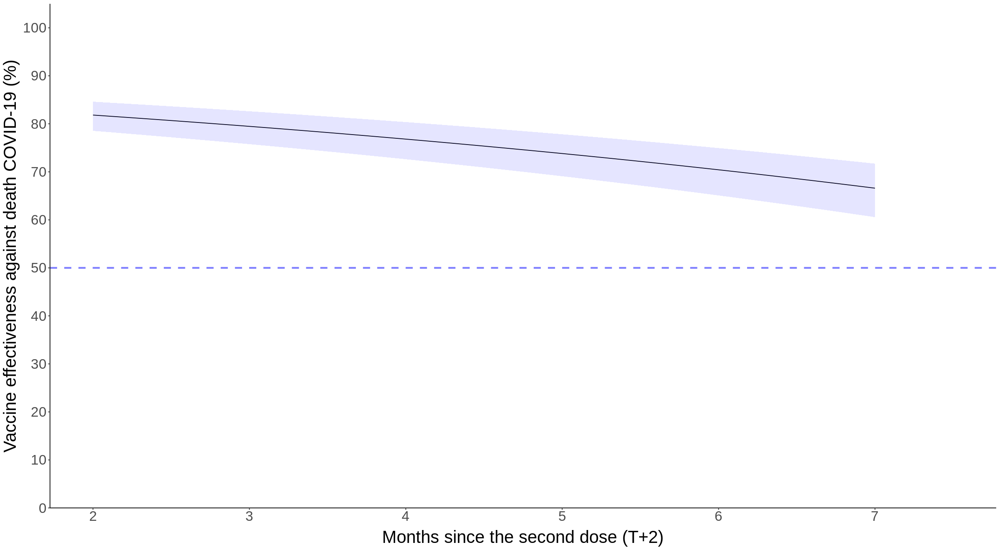

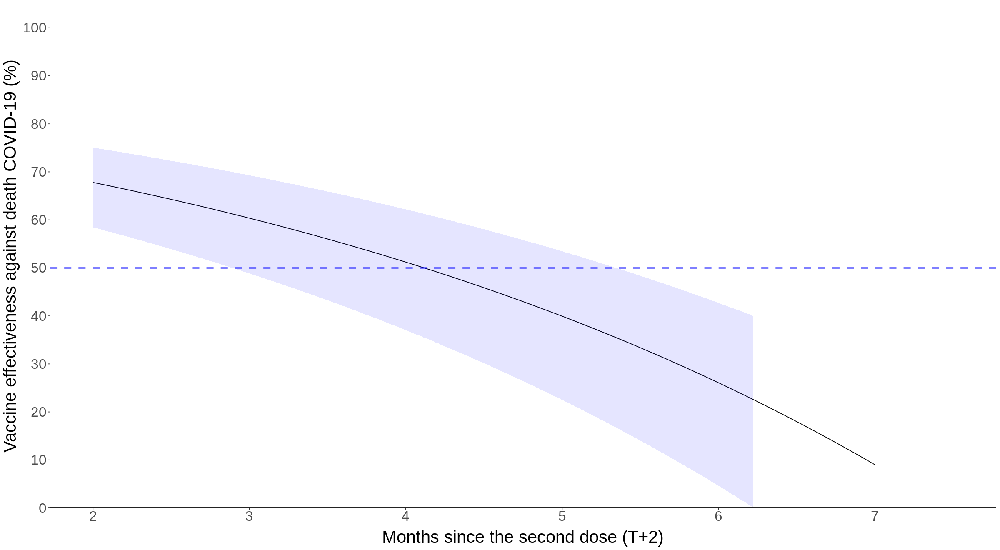

In [312]:
#Stratified by age group: 18-40
d3_d_svazpz_18_40<-d3_d_svazpz[agegroup=="18-40"]

model_d3_d_svazpz_inter_18_40<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_svazpz_18_40)
summary(model_d3_d_svazpz_inter_18_40)

#Initial OR
exp(summary(model_d3_d_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ",2])

#Initial VE
(1-exp(summary(model_d3_d_svazpz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svazpz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazpz_18_40 <- sqrt(vcov(model_d3_d_svazpz_inter_18_40)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ"] + 
                        vcov(model_d3_d_svazpz_inter_18_40)["vac_typeSV-AZ-PZ:month","vac_typeSV-AZ-PZ:month"]+ 
                        2*vcov(model_d3_d_svazpz_inter_18_40)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"])

exp(summary(model_d3_d_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ",1]+
      summary(model_d3_d_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazpz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ",1]+
         summary(model_d3_d_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazpz_18_40))*100

#VE overtime
ve_d_svazpz_18_40<-NULL
for(i in 0:500){
  ve_d_svazpz_18_40<-rbind(ve_d_svazpz_18_40,(1-exp(summary(model_d3_d_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ",1]+
                                              summary(model_d3_d_svazpz_inter_18_40)$coef["vac_typeSV-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazpz_18_40))*100)
}

ve_d_svazpz_18_40<-cbind(0:500/100,ve_d_svazpz_18_40)

ve_d_svazpz_18_40<-as.data.frame(ve_d_svazpz_18_40)
names(ve_d_svazpz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svazpz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d3_d_svazpz_41_60<-d3_d_svazpz[agegroup=="41-60"]

model_d3_d_svazpz_inter_41_60<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_svazpz_41_60)
summary(model_d3_d_svazpz_inter_41_60)

#Initial OR
exp(summary(model_d3_d_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_d_svazpz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svazpz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazpz_41_60 <- sqrt(vcov(model_d3_d_svazpz_inter_41_60)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ"] + 
                        vcov(model_d3_d_svazpz_inter_41_60)["vac_typeSV-AZ-PZ:month","vac_typeSV-AZ-PZ:month"]+ 
                        2*vcov(model_d3_d_svazpz_inter_41_60)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"])

exp(summary(model_d3_d_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ",1]+
      summary(model_d3_d_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazpz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ",1]+
         summary(model_d3_d_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazpz_41_60))*100

#VE overtime
ve_d_svazpz_41_60<-NULL
for(i in 0:500){
  ve_d_svazpz_41_60<-rbind(ve_d_svazpz_41_60,(1-exp(summary(model_d3_d_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ",1]+
                                              summary(model_d3_d_svazpz_inter_41_60)$coef["vac_typeSV-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazpz_41_60))*100)
}

ve_d_svazpz_41_60<-cbind(0:500/100,ve_d_svazpz_41_60)

ve_d_svazpz_41_60<-as.data.frame(ve_d_svazpz_41_60)
names(ve_d_svazpz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svazpz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d3_d_svazpz_61_80<-d3_d_svazpz[agegroup=="61-80"]

model_d3_d_svazpz_inter_61_80<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_svazpz_61_80)
summary(model_d3_d_svazpz_inter_61_80)

#Initial OR
exp(summary(model_d3_d_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_d_svazpz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svazpz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazpz_61_80 <- sqrt(vcov(model_d3_d_svazpz_inter_61_80)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ"] + 
                        vcov(model_d3_d_svazpz_inter_61_80)["vac_typeSV-AZ-PZ:month","vac_typeSV-AZ-PZ:month"]+ 
                        2*vcov(model_d3_d_svazpz_inter_61_80)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"])

exp(summary(model_d3_d_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ",1]+
      summary(model_d3_d_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazpz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ",1]+
         summary(model_d3_d_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazpz_61_80))*100

#VE overtime
ve_d_svazpz_61_80<-NULL
for(i in 0:500){
  ve_d_svazpz_61_80<-rbind(ve_d_svazpz_61_80,(1-exp(summary(model_d3_d_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ",1]+
                                              summary(model_d3_d_svazpz_inter_61_80)$coef["vac_typeSV-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazpz_61_80))*100)
}

ve_d_svazpz_61_80<-cbind(0:500/100,ve_d_svazpz_61_80)

ve_d_svazpz_61_80<-as.data.frame(ve_d_svazpz_61_80)
names(ve_d_svazpz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svazpz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d3_d_svazpz_81_100<-d3_d_svazpz[agegroup=="Over 80"]

model_d3_d_svazpz_inter_81_100<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_svazpz_81_100)
summary(model_d3_d_svazpz_inter_81_100)

#Initial OR
exp(summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_d_svazpz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svazpz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazpz_81_100 <- sqrt(vcov(model_d3_d_svazpz_inter_81_100)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ"] + 
                        vcov(model_d3_d_svazpz_inter_81_100)["vac_typeSV-AZ-PZ:month","vac_typeSV-AZ-PZ:month"]+ 
                        2*vcov(model_d3_d_svazpz_inter_81_100)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"])

exp(summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+
      summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazpz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+
         summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazpz_81_100))*100

#VE overtime
ve_d_svazpz_81_100<-NULL
for(i in 0:500){
  ve_d_svazpz_81_100<-rbind(ve_d_svazpz_81_100,(1-exp(summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+
                                              summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_svazpz_81_100))*100)
}

ve_d_svazpz_81_100<-cbind(0:500/100,ve_d_svazpz_81_100)

ve_d_svazpz_81_100<-as.data.frame(ve_d_svazpz_81_100)
names(ve_d_svazpz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_svazpz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [313]:
summary(model_d3_d_svazpz_inter_81_100)

#Initial OR
exp(summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_d_svazpz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_svazpz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_svazpz_81_100 <- sqrt(vcov(model_d3_d_svazpz_inter_81_100)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ"] + 
                        vcov(model_d3_d_svazpz_inter_81_100)["vac_typeSV-AZ-PZ:month","vac_typeSV-AZ-PZ:month"]+ 
                        2*vcov(model_d3_d_svazpz_inter_81_100)["vac_typeSV-AZ-PZ","vac_typeSV-AZ-PZ:month"])

exp(summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+
      summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_svazpz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ",1]+
         summary(model_d3_d_svazpz_inter_81_100)$coef["vac_typeSV-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_svazpz_81_100))*100



Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_svazpz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.9623  -0.1737   0.0000   0.0000  28.5601  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.842827   0.134395 -65.797  < 2e-16 ***
vac_typeSV-AZ-PZ        -1.133205   0.173660  -6.525 6.78e-11 ***
month                   -0.062500   0.007316  -8.543  < 2e-16 ***
maleTRUE                 0.633112   0.029622  21.373  < 2e-16 ***
provinceกระบี่            -2.174297   0.380101  -5.720 1.06e-08 ***
provinceกาญจนบุรี         -0.287871   0.154482  -1.863 0.062397 .  
provinceกาฬสินธุ์          -2.439135   0.280307  -8.702  < 2e-16 ***
provinceกำแพงเพชร       -0.892077   0.193359  -4.614 3.96e-06 ***
provinceขอนแก่น          -1.765894   0.130610 -13.520  < 2e-16 ***
provinceจันทบุรี           -0.742437   0.193348  -3.840 0.00

[1] 0.2291057 0.3219994 0.4525581

[1] 54.74419 67.80006 77.08943

[1] 0.7052223 0.9100116 1.1742697

[1] -17.426966   8.998837  29.477769

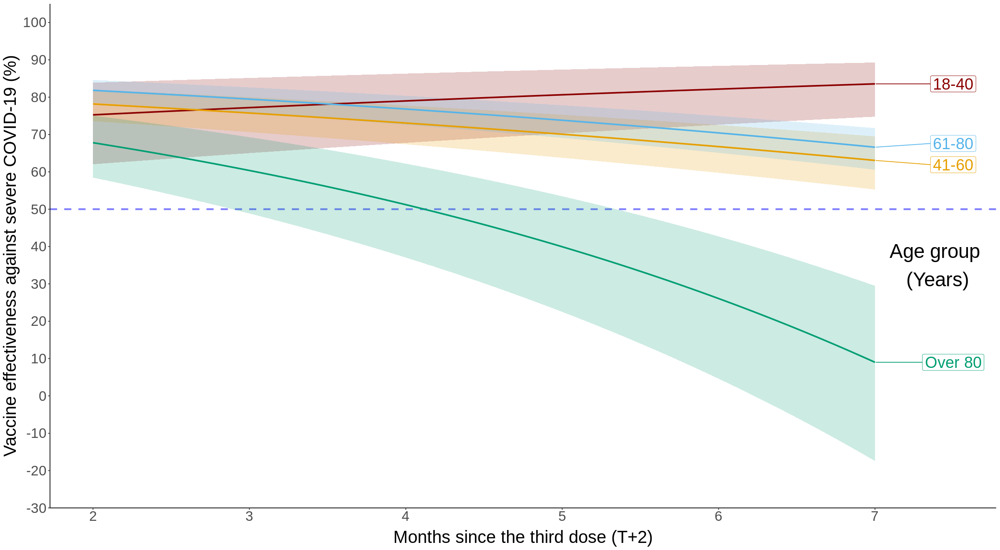

In [314]:
ve_d_svazpz_18_40$Age<-"18-40"
ve_d_svazpz_41_60$Age<-"41-60"
ve_d_svazpz_61_80$Age<-"61-80"
ve_d_svazpz_81_100$Age<-"Over 80"
ve_d_svazpz_all<-rbind(ve_d_svazpz_18_40,ve_d_svazpz_41_60,ve_d_svazpz_61_80,ve_d_svazpz_81_100)
ve_d_svazpz_all<-as.data.table(ve_d_svazpz_all)

ggplot(ve_d_svazpz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_d_svazpz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_d_svazpz_all$month)+2),limits = c(2,max(ve_d_svazpz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-30,105),breaks=c(3:1*-10,0:10*10),name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=35, label= "Age group \n(Years)",size=10)

**SP-SP-PZ**

In [315]:
d3_d_spsppz<-d3_d[vac_type %in% c("None","SP-SP-PZ")]

In [316]:
model_d3_d_spsppz_inter<-glm(death ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d3_d_spsppz)

In [317]:
summary(model_d3_d_spsppz_inter)


Call:
glm(formula = death ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d3_d_spsppz, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-11.282   -0.133    0.000    0.000   55.673  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -13.404989   0.061389 -218.361  < 2e-16 ***
vac_typeSP-SP-PZ        -1.449932   0.111111  -13.049  < 2e-16 ***
month                   -0.085832   0.003629  -23.650  < 2e-16 ***
maleTRUE                 0.588099   0.013184   44.608  < 2e-16 ***
agegroup41-60            1.567170   0.026261   59.676  < 2e-16 ***
agegroup61-80            3.011468   0.025541  117.906  < 2e-16 ***
agegroupOver 80          4.552572   0.027917  163.072  < 2e-16 ***
provinceกระบี่            -1.280768   0.117904  -10.863  < 2e-16 ***
provinceกาญจนบุรี         -0.494112   0.064527   -7.657 1.90e-14 ***
provinceกาฬสินธุ์          -1.055172   0.063175  -

In [318]:
car::vif(model_d3_d_spsppz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.121660,1,1.456592
month,3.740970,1,1.934159
male,1.005075,1,1.002534
agegroup,1.040002,3,1.006559
province,1.069027,76,1.000439
inf_date,3.740328,12,1.056504
vac_type:month,1.986325,1,1.409370


In [319]:
exp(summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ",2])

[1] 0.1886795 0.2345862 0.2916622

In [320]:
(1-exp(summary(model_d3_d_spsppz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_spsppz_inter)$coef[2,2]))*100

[1] 70.83378 76.54138 81.13205

In [321]:
se_spsppz <- sqrt(vcov(model_d3_d_spsppz_inter)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ"] + 
                  vcov(model_d3_d_spsppz_inter)["vac_typeSP-SP-PZ:month","vac_typeSP-SP-PZ:month"]+ 
                  2*vcov(model_d3_d_spsppz_inter)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"])
se_spsppz

[1] 0.08308348

In [322]:
sqrt(sum(vcov(model_d3_d_spsppz_inter)[c("vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"),c("vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month")]))

[1] 0.08308348

In [323]:
exp(summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+
      summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_spsppz)

[1] 0.2274970 0.2677297 0.3150775

In [324]:
evalues.OR(exp(summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ",2])[2], 
exp(summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ",2])[1], 
exp(summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ",2])[3], rare=TRUE)

,point,lower,upper
RR,0.2345862,0.1886795,0.2916622
E-values,7.9922835,NA,6.3142506


In [325]:
(1-exp(summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+
         summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_spsppz))*100

[1] 68.49225 73.22703 77.25030

In [326]:
ve_spsppz<-NULL
for(i in 0:500){
  ve_spsppz<-rbind(ve_spsppz,(1-exp(summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]+
                                  summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_spsppz))*100)
}

In [327]:
ve_spsppz<-cbind(0:500/100,ve_spsppz)
ve_spsppz<-as.data.frame(ve_spsppz)
names(ve_spsppz)<-c("month","lower","estimate","upper")

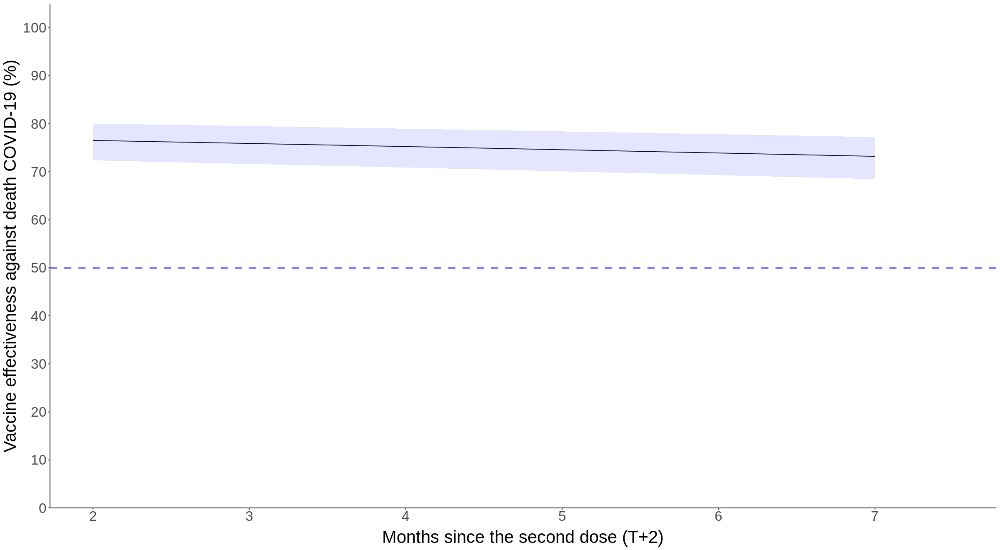

In [328]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_spsppz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [329]:
(log(0.5)-summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ",1]-qnorm(c(0.975,0.50,0.025))*se_spsppz)/summary(model_d3_d_spsppz_inter)$coef["vac_typeSP-SP-PZ:month",1]+2

[1] 24.47154 30.63252 36.79351

Stratified by age group


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_spsppz_18_40, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-2.534  -0.086   0.000   0.000  14.445  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -14.355820   0.264536 -54.268  < 2e-16 ***
vac_typeSP-SP-PZ        -1.178244   0.253529  -4.647 3.36e-06 ***
month                   -0.079137   0.013514  -5.856 4.74e-09 ***
maleTRUE                 0.419861   0.048389   8.677  < 2e-16 ***
provinceกระบี่            -0.398191   0.369129  -1.079 0.280707    
provinceกาญจนบุรี          0.262935   0.219732   1.197 0.231455    
provinceกาฬสินธุ์           0.384260   0.195747   1.963 0.049641 *  
provinceกำแพงเพชร        0.181083   0.238144   0.760 0.447019    
provinceขอนแก่น           0.042778   0.179175   0.239 0.811300    
provinceจันทบุรี            0.307522   0.252823   1.216 0.223850    
pr

[1] 0.1872799 0.3078189 0.5059404

[1] 49.40596 69.21811 81.27201

[1] 0.3868946 0.5655687 0.8267573

[1] 17.32427 43.44313 61.31054


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_spsppz_41_60, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-6.800  -0.157   0.000   0.000  35.560  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -12.171089   0.117053 -103.980  < 2e-16 ***
vac_typeSP-SP-PZ        -1.847903   0.195788   -9.438  < 2e-16 ***
month                   -0.088239   0.007039  -12.536  < 2e-16 ***
maleTRUE                 0.456320   0.023951   19.052  < 2e-16 ***
provinceกระบี่            -2.408759   0.410540   -5.867 4.43e-09 ***
provinceกาญจนบุรี          0.090557   0.098721    0.917 0.358986    
provinceกาฬสินธุ์          -0.450849   0.100154   -4.502 6.75e-06 ***
provinceกำแพงเพชร        0.146343   0.095274    1.536 0.124536    
provinceขอนแก่น          -0.980545   0.099126   -9.892  < 2e-16 ***
provinceจันทบุรี           -0.462450   0.140528   -3.291 0.00

[1] 0.1073522 0.1575672 0.2312706

[1] 76.87294 84.24328 89.26478

[1] 0.1338548 0.1782992 0.2375006

[1] 76.24994 82.17008 86.61452

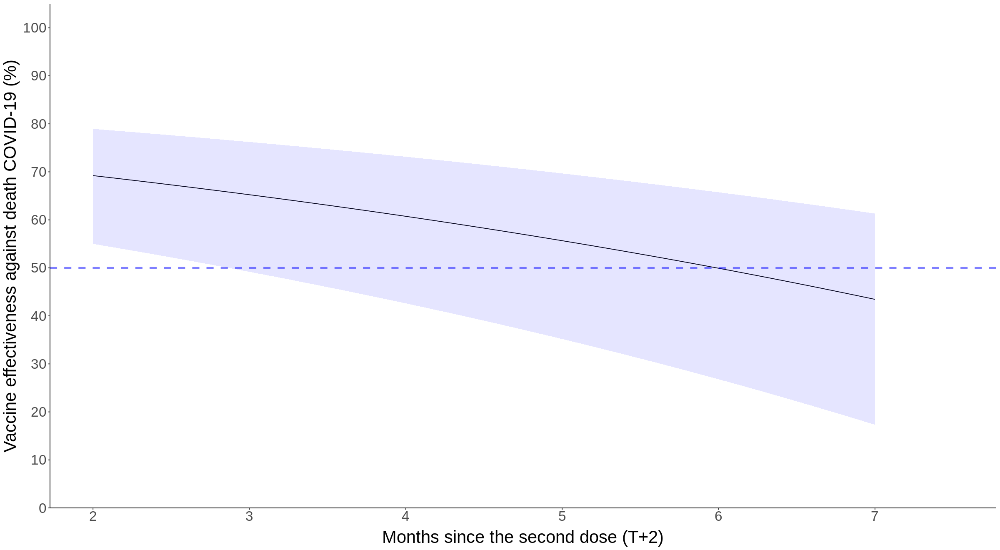


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_spsppz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-12.234   -0.183    0.000    0.000   54.670  

Coefficients:
                        Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -10.17571    0.07778 -130.827  < 2e-16 ***
vac_typeSP-SP-PZ        -1.40285    0.20035   -7.002 2.53e-12 ***
month                   -0.10323    0.00563  -18.336  < 2e-16 ***
maleTRUE                 0.68995    0.02018   34.192  < 2e-16 ***
provinceกระบี่            -0.77911    0.14006   -5.563 2.66e-08 ***
provinceกาญจนบุรี         -1.11468    0.12181   -9.151  < 2e-16 ***
provinceกาฬสินธุ์          -1.39968    0.10144  -13.798  < 2e-16 ***
provinceกำแพงเพชร       -0.73220    0.10143   -7.219 5.26e-13 ***
provinceขอนแก่น          -1.18096    0.06504  -18.157  < 2e-16 ***
provinceจันทบุรี           -0.84264    0.12025   -7.007 2.43e

[1] 0.1660377 0.2458940 0.3641574

[1] 63.58426 75.41060 83.39623

[1] 0.2174687 0.2917148 0.3913093

[1] 60.86907 70.82852 78.25313

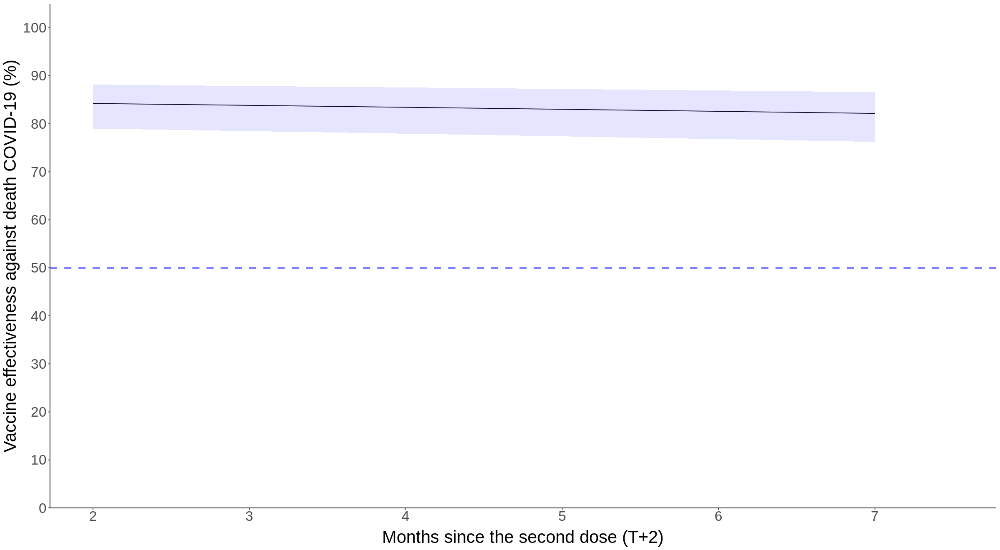


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_spsppz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.9989  -0.1269   0.0000   0.0000  28.5510  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.832529   0.134348 -65.744  < 2e-16 ***
vac_typeSP-SP-PZ        -0.672614   0.279341  -2.408 0.016046 *  
month                   -0.062702   0.007329  -8.555  < 2e-16 ***
maleTRUE                 0.627524   0.029765  21.083  < 2e-16 ***
provinceกระบี่            -2.179104   0.380081  -5.733 9.85e-09 ***
provinceกาญจนบุรี         -0.416418   0.163192  -2.552 0.010720 *  
provinceกาฬสินธุ์          -2.422639   0.280267  -8.644  < 2e-16 ***
provinceกำแพงเพชร       -0.882694   0.193313  -4.566 4.97e-06 ***
provinceขอนแก่น          -1.756054   0.130536 -13.453  < 2e-16 ***
provinceจันทบุรี           -0.640656   0.184150  -3.479 0.00

[1] 0.2951970 0.5103726 0.8823944

[1] 11.76056 48.96274 70.48030

[1] 0.2310108 0.3500928 0.5305595

[1] 46.94405 64.99072 76.89892

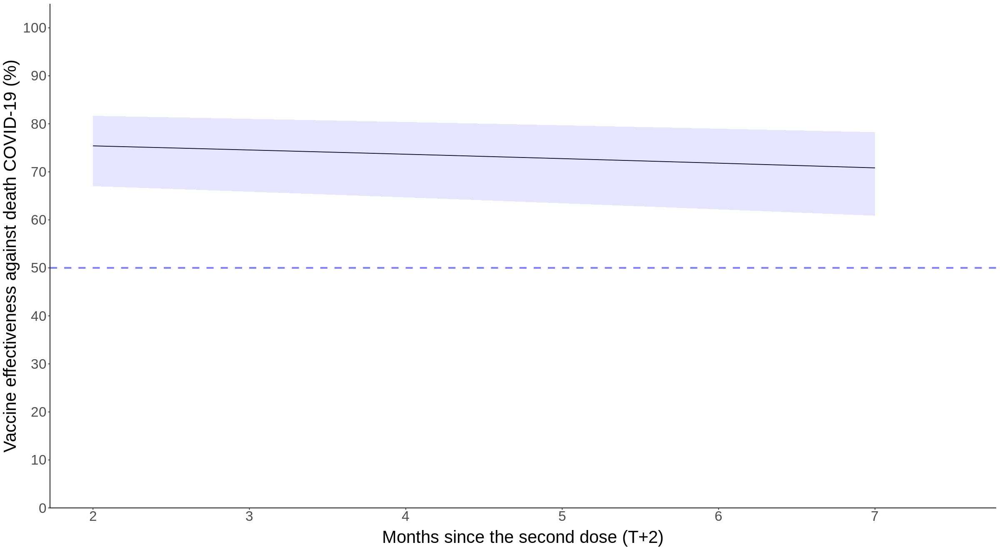

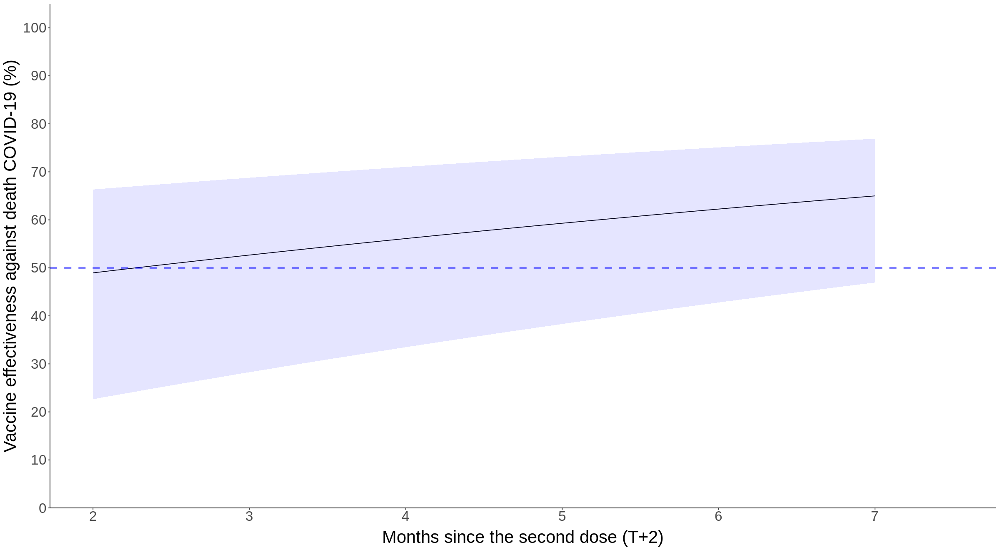

In [330]:
#Stratified by age group: 18-40
d3_d_spsppz_18_40<-d3_d_spsppz[agegroup=="18-40"]

model_d3_d_spsppz_inter_18_40<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_spsppz_18_40)
summary(model_d3_d_spsppz_inter_18_40)

#Initial OR
exp(summary(model_d3_d_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ",2])

#Initial VE
(1-exp(summary(model_d3_d_spsppz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_spsppz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_spsppz_18_40 <- sqrt(vcov(model_d3_d_spsppz_inter_18_40)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ"] + 
                        vcov(model_d3_d_spsppz_inter_18_40)["vac_typeSP-SP-PZ:month","vac_typeSP-SP-PZ:month"]+ 
                        2*vcov(model_d3_d_spsppz_inter_18_40)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"])

exp(summary(model_d3_d_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ",1]+
      summary(model_d3_d_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_spsppz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ",1]+
         summary(model_d3_d_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_spsppz_18_40))*100

#VE overtime
ve_d_spsppz_18_40<-NULL
for(i in 0:500){
  ve_d_spsppz_18_40<-rbind(ve_d_spsppz_18_40,(1-exp(summary(model_d3_d_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ",1]+
                                              summary(model_d3_d_spsppz_inter_18_40)$coef["vac_typeSP-SP-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_spsppz_18_40))*100)
}

ve_d_spsppz_18_40<-cbind(0:500/100,ve_d_spsppz_18_40)

ve_d_spsppz_18_40<-as.data.frame(ve_d_spsppz_18_40)
names(ve_d_spsppz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_spsppz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d3_d_spsppz_41_60<-d3_d_spsppz[agegroup=="41-60"]

model_d3_d_spsppz_inter_41_60<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_spsppz_41_60)
summary(model_d3_d_spsppz_inter_41_60)

#Initial OR
exp(summary(model_d3_d_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ",2])

#initial VE
(1-exp(summary(model_d3_d_spsppz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_spsppz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_spsppz_41_60 <- sqrt(vcov(model_d3_d_spsppz_inter_41_60)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ"] + 
                        vcov(model_d3_d_spsppz_inter_41_60)["vac_typeSP-SP-PZ:month","vac_typeSP-SP-PZ:month"]+ 
                        2*vcov(model_d3_d_spsppz_inter_41_60)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"])

exp(summary(model_d3_d_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ",1]+
      summary(model_d3_d_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_spsppz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ",1]+
         summary(model_d3_d_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_spsppz_41_60))*100

#VE overtime
ve_d_spsppz_41_60<-NULL
for(i in 0:500){
  ve_d_spsppz_41_60<-rbind(ve_d_spsppz_41_60,(1-exp(summary(model_d3_d_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ",1]+
                                              summary(model_d3_d_spsppz_inter_41_60)$coef["vac_typeSP-SP-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_spsppz_41_60))*100)
}

ve_d_spsppz_41_60<-cbind(0:500/100,ve_d_spsppz_41_60)

ve_d_spsppz_41_60<-as.data.frame(ve_d_spsppz_41_60)
names(ve_d_spsppz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_spsppz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d3_d_spsppz_61_80<-d3_d_spsppz[agegroup=="61-80"]

model_d3_d_spsppz_inter_61_80<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_spsppz_61_80)
summary(model_d3_d_spsppz_inter_61_80)

#Initial OR
exp(summary(model_d3_d_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ",2])

#initial VE
(1-exp(summary(model_d3_d_spsppz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_spsppz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_spsppz_61_80 <- sqrt(vcov(model_d3_d_spsppz_inter_61_80)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ"] + 
                        vcov(model_d3_d_spsppz_inter_61_80)["vac_typeSP-SP-PZ:month","vac_typeSP-SP-PZ:month"]+ 
                        2*vcov(model_d3_d_spsppz_inter_61_80)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"])

exp(summary(model_d3_d_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ",1]+
      summary(model_d3_d_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_spsppz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ",1]+
         summary(model_d3_d_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_spsppz_61_80))*100

#VE overtime
ve_d_spsppz_61_80<-NULL
for(i in 0:500){
  ve_d_spsppz_61_80<-rbind(ve_d_spsppz_61_80,(1-exp(summary(model_d3_d_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ",1]+
                                              summary(model_d3_d_spsppz_inter_61_80)$coef["vac_typeSP-SP-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_spsppz_61_80))*100)
}

ve_d_spsppz_61_80<-cbind(0:500/100,ve_d_spsppz_61_80)

ve_d_spsppz_61_80<-as.data.frame(ve_d_spsppz_61_80)
names(ve_d_spsppz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_spsppz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d3_d_spsppz_81_100<-d3_d_spsppz[agegroup=="Over 80"]

model_d3_d_spsppz_inter_81_100<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_spsppz_81_100)
summary(model_d3_d_spsppz_inter_81_100)

#Initial OR
exp(summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",2])

#initial VE
(1-exp(summary(model_d3_d_spsppz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_spsppz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_spsppz_81_100 <- sqrt(vcov(model_d3_d_spsppz_inter_81_100)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ"] + 
                        vcov(model_d3_d_spsppz_inter_81_100)["vac_typeSP-SP-PZ:month","vac_typeSP-SP-PZ:month"]+ 
                        2*vcov(model_d3_d_spsppz_inter_81_100)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"])

exp(summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+
      summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_spsppz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+
         summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_spsppz_81_100))*100

#VE overtime
ve_d_spsppz_81_100<-NULL
for(i in 0:500){
  ve_d_spsppz_81_100<-rbind(ve_d_spsppz_81_100,(1-exp(summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+
                                              summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_spsppz_81_100))*100)
}

ve_d_spsppz_81_100<-cbind(0:500/100,ve_d_spsppz_81_100)

ve_d_spsppz_81_100<-as.data.frame(ve_d_spsppz_81_100)
names(ve_d_spsppz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_spsppz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [331]:
summary(model_d3_d_spsppz_inter_81_100)

#Initial OR
exp(summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",2])

#initial VE
(1-exp(summary(model_d3_d_spsppz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_spsppz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_spsppz_81_100 <- sqrt(vcov(model_d3_d_spsppz_inter_81_100)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ"] + 
                        vcov(model_d3_d_spsppz_inter_81_100)["vac_typeSP-SP-PZ:month","vac_typeSP-SP-PZ:month"]+ 
                        2*vcov(model_d3_d_spsppz_inter_81_100)["vac_typeSP-SP-PZ","vac_typeSP-SP-PZ:month"])

exp(summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+
      summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_spsppz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ",1]+
         summary(model_d3_d_spsppz_inter_81_100)$coef["vac_typeSP-SP-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_spsppz_81_100))*100


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_spsppz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.9989  -0.1269   0.0000   0.0000  28.5510  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.832529   0.134348 -65.744  < 2e-16 ***
vac_typeSP-SP-PZ        -0.672614   0.279341  -2.408 0.016046 *  
month                   -0.062702   0.007329  -8.555  < 2e-16 ***
maleTRUE                 0.627524   0.029765  21.083  < 2e-16 ***
provinceกระบี่            -2.179104   0.380081  -5.733 9.85e-09 ***
provinceกาญจนบุรี         -0.416418   0.163192  -2.552 0.010720 *  
provinceกาฬสินธุ์          -2.422639   0.280267  -8.644  < 2e-16 ***
provinceกำแพงเพชร       -0.882694   0.193313  -4.566 4.97e-06 ***
provinceขอนแก่น          -1.756054   0.130536 -13.453  < 2e-16 ***
provinceจันทบุรี           -0.640656   0.184150  -3.479 0.00

[1] 0.2951970 0.5103726 0.8823944

[1] 11.76056 48.96274 70.48030

[1] 0.2310108 0.3500928 0.5305595

[1] 46.94405 64.99072 76.89892

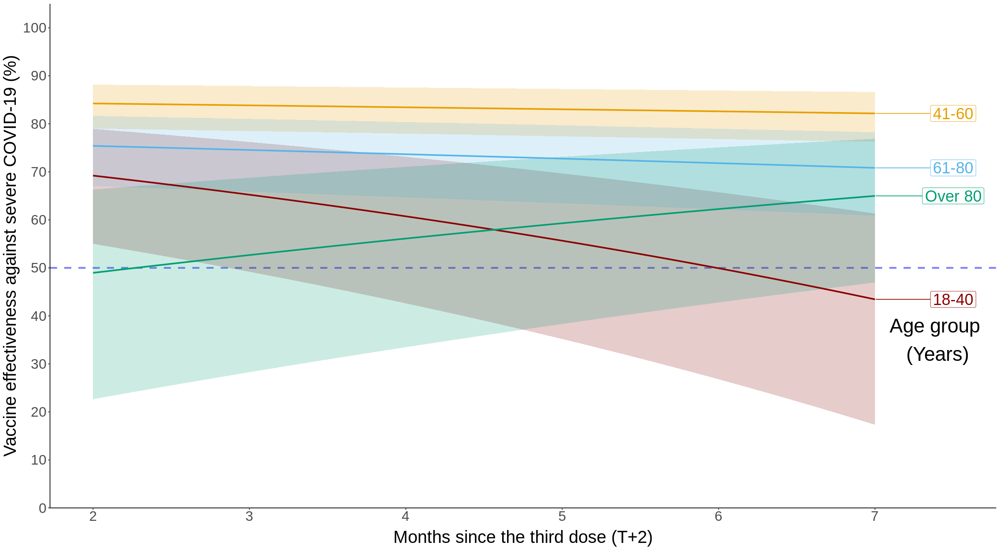

In [332]:
ve_d_spsppz_18_40$Age<-"18-40"
ve_d_spsppz_41_60$Age<-"41-60"
ve_d_spsppz_61_80$Age<-"61-80"
ve_d_spsppz_81_100$Age<-"Over 80"
ve_d_spsppz_all<-rbind(ve_d_spsppz_18_40,ve_d_spsppz_41_60,ve_d_spsppz_61_80,ve_d_spsppz_81_100)
ve_d_spsppz_all<-as.data.table(ve_d_spsppz_all)

ggplot(ve_d_spsppz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_d_spsppz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_d_spsppz_all$month)+2),limits = c(2,max(ve_d_spsppz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=35, label= "Age group \n(Years)",size=10)

**AZ-AZ-PZ**

In [333]:
d3_d_azazpz<-d3_d[vac_type %in% c("None","AZ-AZ-PZ")]

In [334]:
model_d3_d_azazpz_inter<-glm(death ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d3_d_azazpz)

In [335]:
summary(model_d3_d_azazpz_inter)


Call:
glm(formula = death ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d3_d_azazpz, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-11.091   -0.155    0.000    0.000   55.751  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -13.431549   0.061314 -219.063  < 2e-16 ***
vac_typeAZ-AZ-PZ        -2.191308   0.063562  -34.475  < 2e-16 ***
month                   -0.087084   0.003609  -24.132  < 2e-16 ***
maleTRUE                 0.590902   0.013054   45.267  < 2e-16 ***
agegroup41-60            1.575585   0.026313   59.878  < 2e-16 ***
agegroup61-80            3.012092   0.025569  117.804  < 2e-16 ***
agegroupOver 80          4.567000   0.027852  163.973  < 2e-16 ***
provinceกระบี่            -1.277595   0.117833  -10.842  < 2e-16 ***
provinceกาญจนบุรี         -0.453470   0.063744   -7.114 1.13e-12 ***
provinceกาฬสินธุ์          -1.038716   0.063066  -

In [336]:
car::vif(model_d3_d_azazpz_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.594919,1,1.610875
month,3.840264,1,1.959659
male,1.005017,1,1.002505
agegroup,1.040000,3,1.006558
province,1.096608,76,1.000607
inf_date,3.834215,12,1.057596
vac_type:month,2.036711,1,1.427134


In [337]:
exp(summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",2])

[1] 0.09867861 0.11177043 0.12659916

In [338]:
(1-exp(summary(model_d3_d_azazpz_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_azazpz_inter)$coef[2,2]))*100

[1] 87.34008 88.82296 90.13214

In [339]:
se_azazpz <- sqrt(vcov(model_d3_d_azazpz_inter)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ"] + 
                  vcov(model_d3_d_azazpz_inter)["vac_typeAZ-AZ-PZ:month","vac_typeAZ-AZ-PZ:month"]+ 
                  2*vcov(model_d3_d_azazpz_inter)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"])
se_azazpz

[1] 0.04961421

In [340]:
sqrt(sum(vcov(model_d3_d_azazpz_inter)[c("vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"),c("vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month")]))

[1] 0.04961421

In [341]:
exp(summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+
      summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazpz)

[1] 0.1839385 0.2027237 0.2234272

In [342]:
evalues.OR(exp(summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",2])[2], 
exp(summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",2])[1], 
exp(summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.3882296,-0.4013214,-0.3734008
E-values,13.9647960,NA,11.8667665


In [343]:
(1-exp(summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+
         summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazpz))*100

[1] 77.65728 79.72763 81.60615

In [344]:
ve_azazpz<-NULL
for(i in 0:500){
  ve_azazpz<-rbind(ve_azazpz,(1-exp(summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]+
                                  summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_azazpz))*100)
}

In [345]:
ve_azazpz<-cbind(0:500/100,ve_azazpz)
ve_azazpz<-as.data.frame(ve_azazpz)
names(ve_azazpz)<-c("month","lower","estimate","upper")

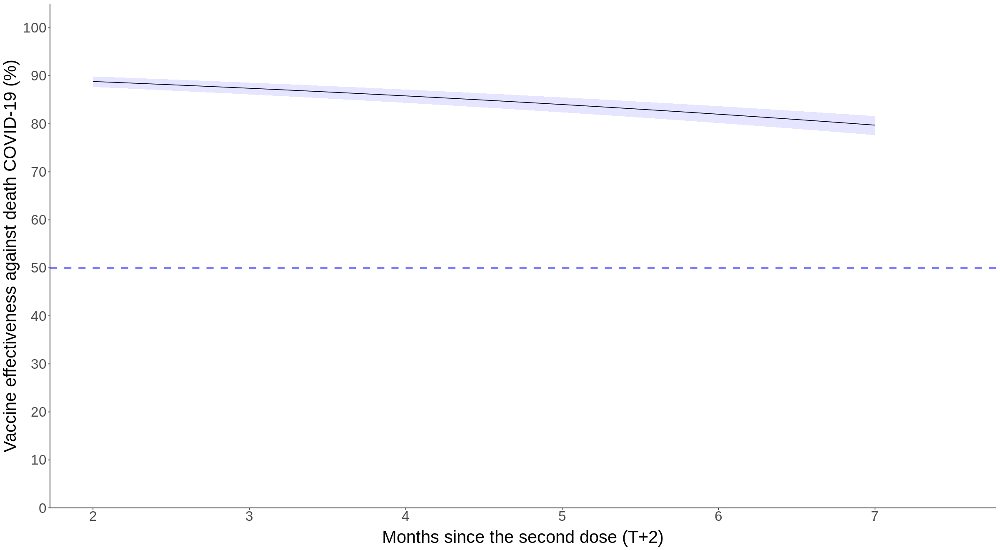

In [346]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azazpz,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [347]:
(log(0.5)-summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ",1]-qnorm(c(0.975,0.50,0.025))*se_azazpz)/summary(model_d3_d_azazpz_inter)$coef["vac_typeAZ-AZ-PZ:month",1]+2

[1] 13.76458 14.58120 15.39782

*Stratified by age group*

Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”



Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_azazpz_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.5142  -0.0708   0.0000   0.0000  14.4474  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -14.36106    0.26410 -54.378  < 2e-16 ***
vac_typeAZ-AZ-PZ        -2.06710    0.31060  -6.655 2.83e-11 ***
month                   -0.07983    0.01353  -5.899 3.65e-09 ***
maleTRUE                 0.42177    0.04859   8.681  < 2e-16 ***
provinceกระบี่            -0.39601    0.36874  -1.074 0.282845    
provinceกาญจนบุรี          0.32378    0.21603   1.499 0.133936    
provinceกาฬสินธุ์           0.39423    0.19504   2.021 0.043253 *  
provinceกำแพงเพชร        0.19626    0.23757   0.826 0.408731    
provinceขอนแก่น           0.06714    0.17842   0.376 0.706708    
provinceจันทบุรี            0.31626    0.25229   1.254 0.210012    
pro

[1] 0.06884819 0.12655285 0.23262228

[1] 76.73777 87.34472 93.11518

[1] 0.4229871 0.6636107 1.0411171

[1] -4.111706 33.638934 57.701288


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_azazpz_41_60, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-6.711  -0.167   0.000   0.000  35.594  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -12.193542   0.116909 -104.299  < 2e-16 ***
vac_typeAZ-AZ-PZ        -2.237604   0.146931  -15.229  < 2e-16 ***
month                   -0.091039   0.007011  -12.984  < 2e-16 ***
maleTRUE                 0.460301   0.023854   19.296  < 2e-16 ***
provinceกระบี่            -2.398112   0.410482   -5.842 5.15e-09 ***
provinceกาญจนบุรี          0.113668   0.098479    1.154 0.248402    
provinceกาฬสินธุ์          -0.435240   0.099939   -4.355 1.33e-05 ***
provinceกำแพงเพชร        0.177450   0.094502    1.878 0.060418 .  
provinceขอนแก่น          -0.959372   0.098914   -9.699  < 2e-16 ***
provinceจันทบุรี           -0.446866   0.140372   -3.183 0.00

[1] 0.08001163 0.10671385 0.14232739

[1] 85.76726 89.32861 91.99884

[1] 0.2800134 0.3480006 0.4324951

[1] 56.75049 65.19994 71.99866

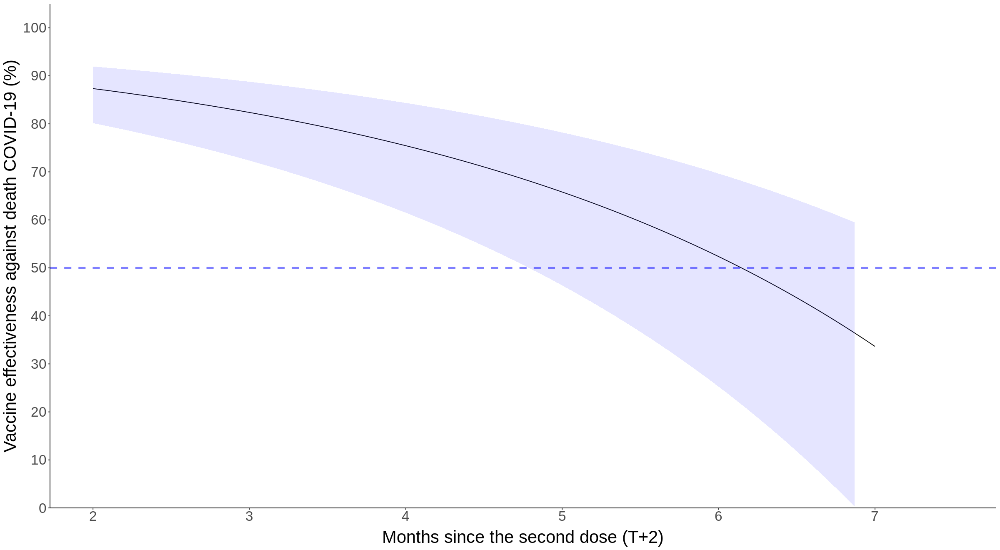


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_azazpz_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-12.036   -0.248    0.000    0.000   54.744  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -10.197324   0.077626 -131.365  < 2e-16 ***
vac_typeAZ-AZ-PZ        -2.406117   0.089625  -26.847  < 2e-16 ***
month                   -0.103643   0.005590  -18.541  < 2e-16 ***
maleTRUE                 0.689563   0.019899   34.653  < 2e-16 ***
provinceกระบี่            -0.780048   0.139931   -5.575 2.48e-08 ***
provinceกาญจนบุรี         -1.030465   0.117790   -8.748  < 2e-16 ***
provinceกาฬสินธุ์          -1.381626   0.101303  -13.639  < 2e-16 ***
provinceกำแพงเพชร       -0.688850   0.099972   -6.890 5.56e-12 ***
provinceขอนแก่น          -1.151642   0.064647  -17.814  < 2e-16 ***
provinceจันทบุรี           -0.837750   0.120108   -

[1] 0.07563934 0.09016468 0.10747940

[1] 89.25206 90.98353 92.43607

[1] 0.1040120 0.1196725 0.1376909

[1] 86.23091 88.03275 89.59880

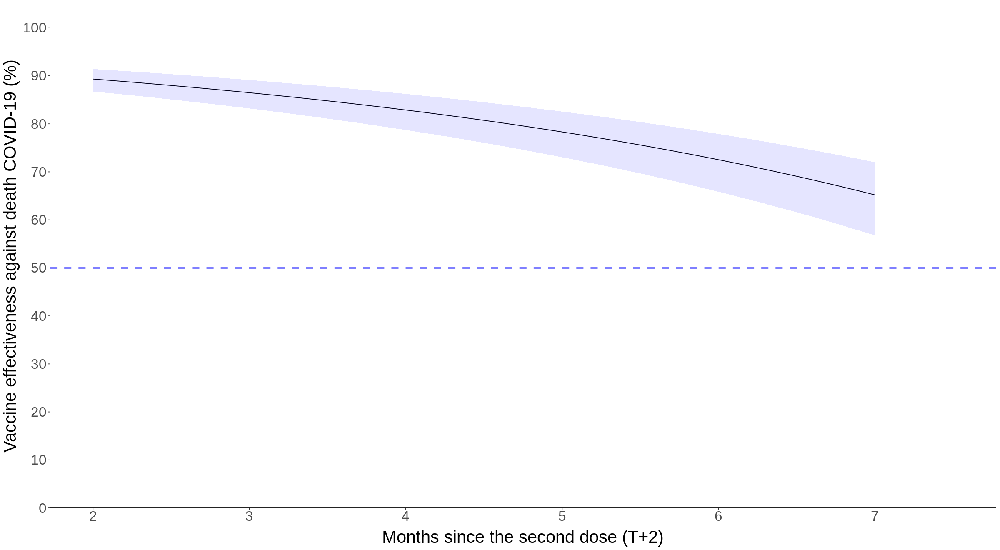


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_azazpz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.8285  -0.1763   0.0000   0.0000  28.6036  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.859932   0.134163 -66.038  < 2e-16 ***
vac_typeAZ-AZ-PZ        -1.924618   0.127137 -15.138  < 2e-16 ***
month                   -0.063140   0.007285  -8.667  < 2e-16 ***
maleTRUE                 0.628942   0.029313  21.456  < 2e-16 ***
provinceกระบี่            -2.167598   0.379980  -5.705 1.17e-08 ***
provinceกาญจนบุรี         -0.399783   0.162911  -2.454 0.014128 *  
provinceกาฬสินธุ์          -2.396021   0.280162  -8.552  < 2e-16 ***
provinceกำแพงเพชร       -0.793337   0.186868  -4.245 2.18e-05 ***
provinceขอนแก่น          -1.728620   0.130303 -13.266  < 2e-16 ***
provinceจันทบุรี           -0.629814   0.183923  -3.424 0.00

[1] 0.1137443 0.1459315 0.1872268

[1] 81.27732 85.40685 88.62557

[1] 0.2265647 0.2751749 0.3342146

[1] 66.57854 72.48251 77.34353

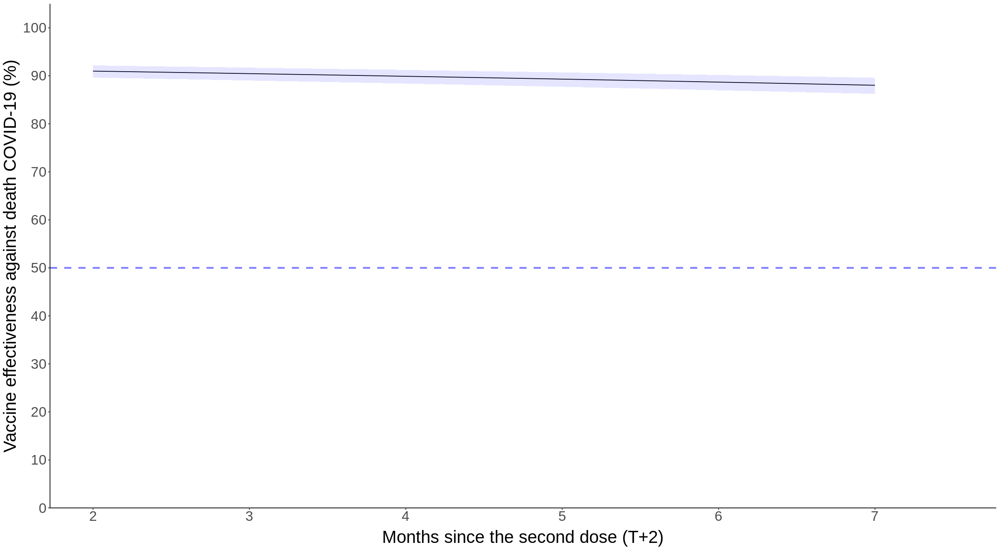

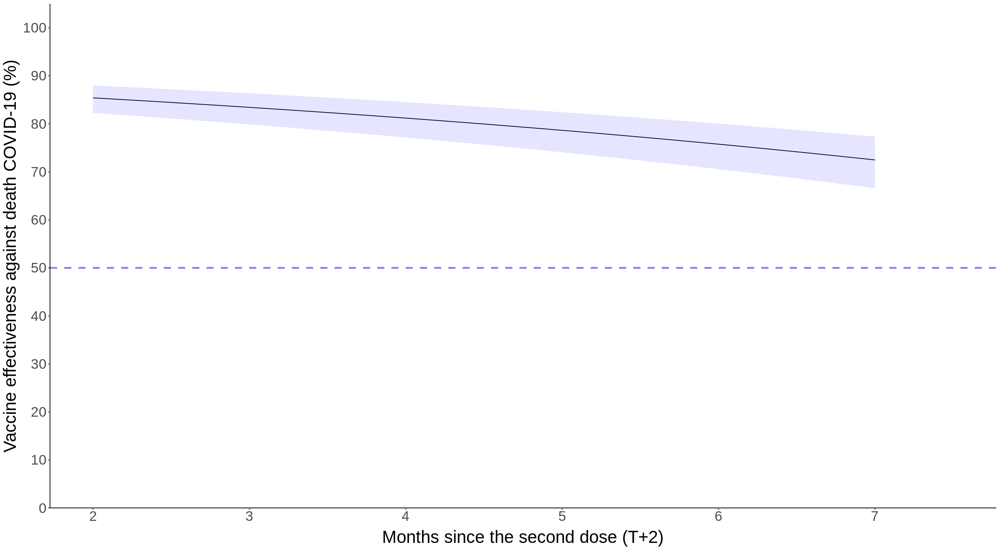

In [348]:
#Stratified by age group: 18-40
d3_d_azazpz_18_40<-d3_d_azazpz[agegroup=="18-40"]

model_d3_d_azazpz_inter_18_40<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_azazpz_18_40)
summary(model_d3_d_azazpz_inter_18_40)

#Initial OR
exp(summary(model_d3_d_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ",2])

#Initial VE
(1-exp(summary(model_d3_d_azazpz_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_azazpz_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazpz_18_40 <- sqrt(vcov(model_d3_d_azazpz_inter_18_40)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ"] + 
                        vcov(model_d3_d_azazpz_inter_18_40)["vac_typeAZ-AZ-PZ:month","vac_typeAZ-AZ-PZ:month"]+ 
                        2*vcov(model_d3_d_azazpz_inter_18_40)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"])

exp(summary(model_d3_d_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ",1]+
      summary(model_d3_d_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazpz_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ",1]+
         summary(model_d3_d_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazpz_18_40))*100

#VE overtime
ve_d_azazpz_18_40<-NULL
for(i in 0:500){
  ve_d_azazpz_18_40<-rbind(ve_d_azazpz_18_40,(1-exp(summary(model_d3_d_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ",1]+
                                              summary(model_d3_d_azazpz_inter_18_40)$coef["vac_typeAZ-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazpz_18_40))*100)
}

ve_d_azazpz_18_40<-cbind(0:500/100,ve_d_azazpz_18_40)

ve_d_azazpz_18_40<-as.data.frame(ve_d_azazpz_18_40)
names(ve_d_azazpz_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_azazpz_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d3_d_azazpz_41_60<-d3_d_azazpz[agegroup=="41-60"]

model_d3_d_azazpz_inter_41_60<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_azazpz_41_60)
summary(model_d3_d_azazpz_inter_41_60)

#Initial OR
exp(summary(model_d3_d_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_d_azazpz_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_azazpz_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazpz_41_60 <- sqrt(vcov(model_d3_d_azazpz_inter_41_60)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ"] + 
                        vcov(model_d3_d_azazpz_inter_41_60)["vac_typeAZ-AZ-PZ:month","vac_typeAZ-AZ-PZ:month"]+ 
                        2*vcov(model_d3_d_azazpz_inter_41_60)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"])

exp(summary(model_d3_d_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ",1]+
      summary(model_d3_d_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazpz_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ",1]+
         summary(model_d3_d_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazpz_41_60))*100

#VE overtime
ve_d_azazpz_41_60<-NULL
for(i in 0:500){
  ve_d_azazpz_41_60<-rbind(ve_d_azazpz_41_60,(1-exp(summary(model_d3_d_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ",1]+
                                              summary(model_d3_d_azazpz_inter_41_60)$coef["vac_typeAZ-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazpz_41_60))*100)
}

ve_d_azazpz_41_60<-cbind(0:500/100,ve_d_azazpz_41_60)

ve_d_azazpz_41_60<-as.data.frame(ve_d_azazpz_41_60)
names(ve_d_azazpz_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_azazpz_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d3_d_azazpz_61_80<-d3_d_azazpz[agegroup=="61-80"]

model_d3_d_azazpz_inter_61_80<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_azazpz_61_80)
summary(model_d3_d_azazpz_inter_61_80)

#Initial OR
exp(summary(model_d3_d_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_d_azazpz_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_azazpz_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazpz_61_80 <- sqrt(vcov(model_d3_d_azazpz_inter_61_80)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ"] + 
                        vcov(model_d3_d_azazpz_inter_61_80)["vac_typeAZ-AZ-PZ:month","vac_typeAZ-AZ-PZ:month"]+ 
                        2*vcov(model_d3_d_azazpz_inter_61_80)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"])

exp(summary(model_d3_d_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",1]+
      summary(model_d3_d_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazpz_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",1]+
         summary(model_d3_d_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazpz_61_80))*100

#VE overtime
ve_d_azazpz_61_80<-NULL
for(i in 0:500){
  ve_d_azazpz_61_80<-rbind(ve_d_azazpz_61_80,(1-exp(summary(model_d3_d_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ",1]+
                                              summary(model_d3_d_azazpz_inter_61_80)$coef["vac_typeAZ-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazpz_61_80))*100)
}

ve_d_azazpz_61_80<-cbind(0:500/100,ve_d_azazpz_61_80)

ve_d_azazpz_61_80<-as.data.frame(ve_d_azazpz_61_80)
names(ve_d_azazpz_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_azazpz_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d3_d_azazpz_81_100<-d3_d_azazpz[agegroup=="Over 80"]

model_d3_d_azazpz_inter_81_100<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_azazpz_81_100)
summary(model_d3_d_azazpz_inter_81_100)

#Initial OR
exp(summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_d_azazpz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_azazpz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazpz_81_100 <- sqrt(vcov(model_d3_d_azazpz_inter_81_100)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ"] + 
                        vcov(model_d3_d_azazpz_inter_81_100)["vac_typeAZ-AZ-PZ:month","vac_typeAZ-AZ-PZ:month"]+ 
                        2*vcov(model_d3_d_azazpz_inter_81_100)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"])

exp(summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",1]+
      summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazpz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",1]+
         summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazpz_81_100))*100

#VE overtime
ve_d_azazpz_81_100<-NULL
for(i in 0:500){
  ve_d_azazpz_81_100<-rbind(ve_d_azazpz_81_100,(1-exp(summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",1]+
                                              summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazpz_81_100))*100)
}

ve_d_azazpz_81_100<-cbind(0:500/100,ve_d_azazpz_81_100)

ve_d_azazpz_81_100<-as.data.frame(ve_d_azazpz_81_100)
names(ve_d_azazpz_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_azazpz_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [349]:
summary(model_d3_d_azazpz_inter_81_100)

#Initial OR
exp(summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",2])

#initial VE
(1-exp(summary(model_d3_d_azazpz_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_azazpz_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazpz_81_100 <- sqrt(vcov(model_d3_d_azazpz_inter_81_100)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ"] + 
                        vcov(model_d3_d_azazpz_inter_81_100)["vac_typeAZ-AZ-PZ:month","vac_typeAZ-AZ-PZ:month"]+ 
                        2*vcov(model_d3_d_azazpz_inter_81_100)["vac_typeAZ-AZ-PZ","vac_typeAZ-AZ-PZ:month"])

exp(summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",1]+
      summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazpz_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ",1]+
         summary(model_d3_d_azazpz_inter_81_100)$coef["vac_typeAZ-AZ-PZ:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazpz_81_100))*100


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_azazpz_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.8285  -0.1763   0.0000   0.0000  28.6036  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)             -8.859932   0.134163 -66.038  < 2e-16 ***
vac_typeAZ-AZ-PZ        -1.924618   0.127137 -15.138  < 2e-16 ***
month                   -0.063140   0.007285  -8.667  < 2e-16 ***
maleTRUE                 0.628942   0.029313  21.456  < 2e-16 ***
provinceกระบี่            -2.167598   0.379980  -5.705 1.17e-08 ***
provinceกาญจนบุรี         -0.399783   0.162911  -2.454 0.014128 *  
provinceกาฬสินธุ์          -2.396021   0.280162  -8.552  < 2e-16 ***
provinceกำแพงเพชร       -0.793337   0.186868  -4.245 2.18e-05 ***
provinceขอนแก่น          -1.728620   0.130303 -13.266  < 2e-16 ***
provinceจันทบุรี           -0.629814   0.183923  -3.424 0.00

[1] 0.1137443 0.1459315 0.1872268

[1] 81.27732 85.40685 88.62557

[1] 0.2265647 0.2751749 0.3342146

[1] 66.57854 72.48251 77.34353

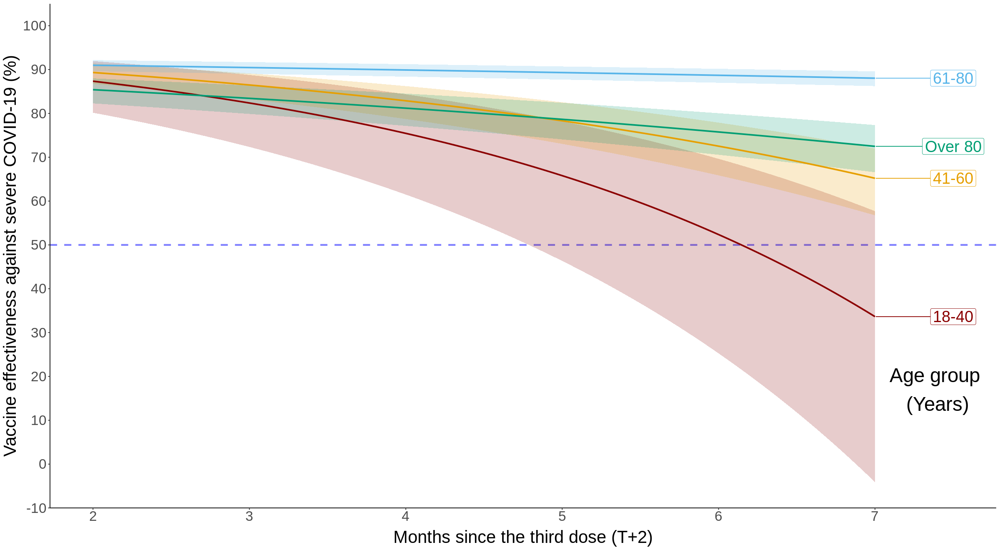

In [350]:
ve_d_azazpz_18_40$Age<-"18-40"
ve_d_azazpz_41_60$Age<-"41-60"
ve_d_azazpz_61_80$Age<-"61-80"
ve_d_azazpz_81_100$Age<-"Over 80"
ve_d_azazpz_all<-rbind(ve_d_azazpz_18_40,ve_d_azazpz_41_60,ve_d_azazpz_61_80,ve_d_azazpz_81_100)
ve_d_azazpz_all<-as.data.table(ve_d_azazpz_all)

ggplot(ve_d_azazpz_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_d_azazpz_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_d_azazpz_all$month)+2),limits = c(2,max(ve_d_azazpz_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(-10,105),breaks=c(-10,0:10*10),name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=17, label= "Age group \n(Years)",size=10)

**AZ-AZ-MN**

In [351]:
d3_d_azazmn<-d3_d[vac_type %in% c("None","AZ-AZ-MN")]

In [352]:
model_d3_d_azazmn_inter<-glm(death ~ vac_type*month+male+agegroup+province+inf_date, binomial, weight=Freq, data=d3_d_azazmn)

In [353]:
summary(model_d3_d_azazmn_inter)


Call:
glm(formula = death ~ vac_type * month + male + agegroup + province + 
    inf_date, family = binomial, data = d3_d_azazmn, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-11.235   -0.094    0.000    0.000   55.695  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -1.342e+01  6.149e-02 -218.230  < 2e-16 ***
vac_typeAZ-AZ-MN       -2.580e+00  1.495e-01  -17.260  < 2e-16 ***
month                  -8.633e-02  3.631e-03  -23.776  < 2e-16 ***
maleTRUE                5.854e-01  1.320e-02   44.345  < 2e-16 ***
agegroup41-60           1.581e+00  2.652e-02   59.604  < 2e-16 ***
agegroup61-80           3.022e+00  2.578e-02  117.224  < 2e-16 ***
agegroupOver 80         4.562e+00  2.813e-02  162.196  < 2e-16 ***
provinceกระบี่           -1.274e+00  1.179e-01  -10.807  < 2e-16 ***
provinceกาญจนบุรี        -4.747e-01  6.453e-02   -7.356 1.90e-13 ***
provinceกาฬสินธุ์         -1.049e+00  6.318e-02  -

In [354]:
car::vif(model_d3_d_azazmn_inter)

there are higher-order terms (interactions) in this model
consider setting type = 'predictor'; see ?vif



,GVIF,Df,GVIF^(1/(2*Df))
vac_type,2.159278,1,1.469448
month,3.725520,1,1.930161
male,1.005125,1,1.002559
agegroup,1.037577,3,1.006167
province,1.074860,76,1.000475
inf_date,3.736814,12,1.056463
vac_type:month,2.071581,1,1.439299


In [355]:
exp(summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN",2])

[1] 0.05652379 0.07576526 0.10155678

In [356]:
(1-exp(summary(model_d3_d_azazmn_inter)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_azazmn_inter)$coef[2,2]))*100

[1] 89.84432 92.42347 94.34762

In [357]:
se_azazmn <- sqrt(vcov(model_d3_d_azazmn_inter)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN"] + 
                  vcov(model_d3_d_azazmn_inter)["vac_typeAZ-AZ-MN:month","vac_typeAZ-AZ-MN:month"]+ 
                  2*vcov(model_d3_d_azazmn_inter)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"])
se_azazmn

[1] 0.1096235

In [358]:
sqrt(sum(vcov(model_d3_d_azazmn_inter)[c("vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"),c("vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month")]))

[1] 0.1096235

In [359]:
exp(summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+
      summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazmn)

[1] 0.1026168 0.1272127 0.1577038

In [360]:
evalues.OR(exp(summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN",2])[2], 
exp(summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN",2])[1], 
exp(summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN",2])[3], rare=TRUE)-evalues.OR(0.5,0.5,0.5,rare=TRUE)

,point,lower,upper
RR,-0.4242347,-0.4434762,-0.3984432
E-values,22.4732624,NA,15.7658195


In [361]:
(1-exp(summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+
         summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazmn))*100

[1] 84.22962 87.27873 89.73832

In [362]:
ve_azazmn<-NULL
for(i in 0:500){
  ve_azazmn<-rbind(ve_azazmn,(1-exp(summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]+
                                  summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN:month",1]*i/100+
                                  qnorm(c(0.975,0.50,0.025))*se_azazmn))*100)
}

In [363]:
ve_azazmn<-cbind(0:500/100,ve_azazmn)
ve_azazmn<-as.data.frame(ve_azazmn)
names(ve_azazmn)<-c("month","lower","estimate","upper")

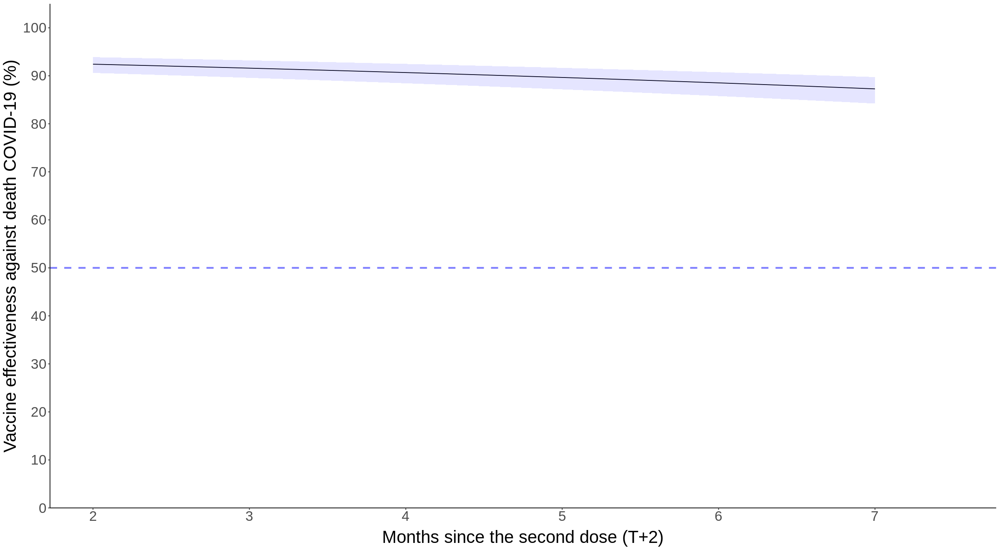

In [364]:
options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_azazmn,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [365]:
(log(0.5)-summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN",1]-qnorm(c(0.975,0.50,0.025))*se_azazmn)/summary(model_d3_d_azazmn_inter)$coef["vac_typeAZ-AZ-MN:month",1]+2

[1] 18.13319 20.20623 22.27927

*Stratified by age group*

Warning message:
“glm.fit: fitted probabilities numerically 0 or 1 occurred”



Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_azazmn_18_40, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-2.4808  -0.0002   0.0000   0.0000  14.4686  

Coefficients:
                        Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -14.37564    0.26575 -54.094  < 2e-16 ***
vac_typeAZ-AZ-MN       -13.48132   96.73107  -0.139 0.889159    
month                   -0.07844    0.01359  -5.771 7.87e-09 ***
maleTRUE                 0.39713    0.04884   8.131 4.26e-16 ***
provinceกระบี่            -0.35599    0.37003  -0.962 0.336020    
provinceกาญจนบุรี          0.33020    0.22124   1.492 0.135570    
provinceกาฬสินธุ์           0.43343    0.19745   2.195 0.028151 *  
provinceกำแพงเพชร        0.23544    0.23954   0.983 0.325681    
provinceขอนแก่น           0.10493    0.18103   0.580 0.562192    
provinceจันทบุรี            0.35328    0.25414   1.390 0.164494    
pro

[1] 6.419567e-89 1.396812e-06 3.039275e+76

[1] -3.039275e+78  9.999986e+01  1.000000e+02

[1] 2.759719e-64 2.018889e-05 1.476930e+54

[1] -1.476930e+56  9.999798e+01  1.000000e+02

Warning message in max(ids, na.rm = TRUE):
“no non-missing arguments to max; returning -Inf”



Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_azazmn_41_60, weights = Freq)

Deviance Residuals: 
   Min      1Q  Median      3Q     Max  
-6.750  -0.088   0.000   0.000  35.579  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -12.180971   0.117152 -103.976  < 2e-16 ***
vac_typeAZ-AZ-MN        -2.920114   0.414950   -7.037 1.96e-12 ***
month                   -0.089153   0.007046  -12.653  < 2e-16 ***
maleTRUE                 0.455690   0.024024   18.968  < 2e-16 ***
provinceกระบี่            -2.396777   0.410568   -5.838 5.29e-09 ***
provinceกาญจนบุรี          0.114049   0.098833    1.154 0.248518    
provinceกาฬสินธุ์          -0.439154   0.100268   -4.380 1.19e-05 ***
provinceกำแพงเพชร        0.161255   0.095397    1.690 0.090959 .  
provinceขอนแก่น          -0.963796   0.099242   -9.712  < 2e-16 ***
provinceจันทบุรี           -0.449742   0.140610   -3.199 0.00

[1] 0.02391137 0.05392754 0.12162327

[1] 87.83767 94.60725 97.60886

[1] 0.09072133 0.16297302 0.29276692

[1] 70.72331 83.70270 90.92787

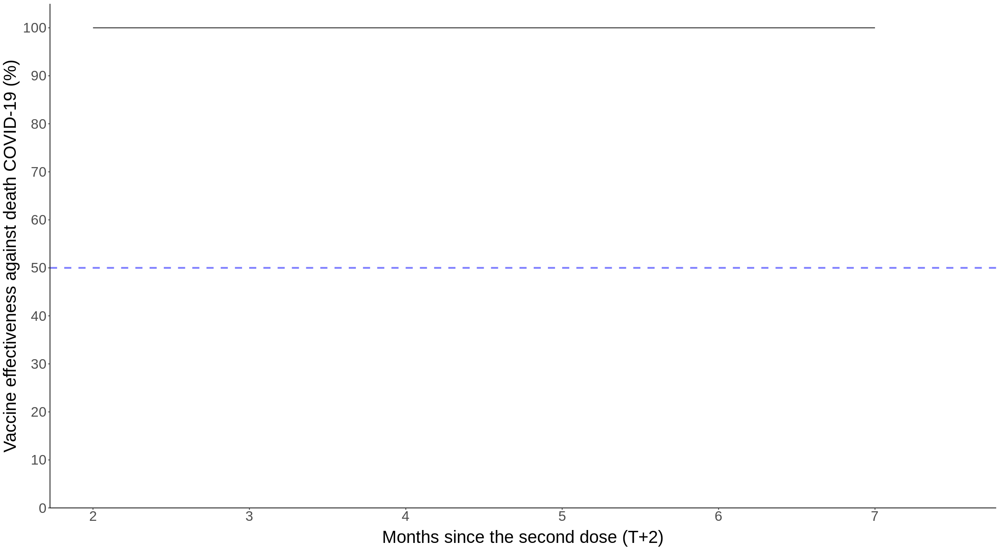


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_azazmn_61_80, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-12.214   -0.151    0.000    0.000   54.685  

Coefficients:
                         Estimate Std. Error  z value Pr(>|z|)    
(Intercept)            -10.178315   0.077761 -130.891  < 2e-16 ***
vac_typeAZ-AZ-MN        -2.690866   0.192946  -13.946  < 2e-16 ***
month                   -0.103699   0.005628  -18.427  < 2e-16 ***
maleTRUE                 0.687991   0.020164   34.120  < 2e-16 ***
provinceกระบี่            -0.775848   0.140045   -5.540 3.02e-08 ***
provinceกาญจนบุรี         -1.098743   0.121784   -9.022  < 2e-16 ***
provinceกาฬสินธุ์          -1.397130   0.101421  -13.776  < 2e-16 ***
provinceกำแพงเพชร       -0.727334   0.101419   -7.172 7.41e-13 ***
provinceขอนแก่น          -1.175072   0.065012  -18.075  < 2e-16 ***
provinceจันทบุรี           -0.840631   0.120232   -

[1] 0.04646601 0.06782217 0.09899380

[1] 90.10062 93.21778 95.35340

[1] 0.07993968 0.10578754 0.13999308

[1] 86.00069 89.42125 92.00603

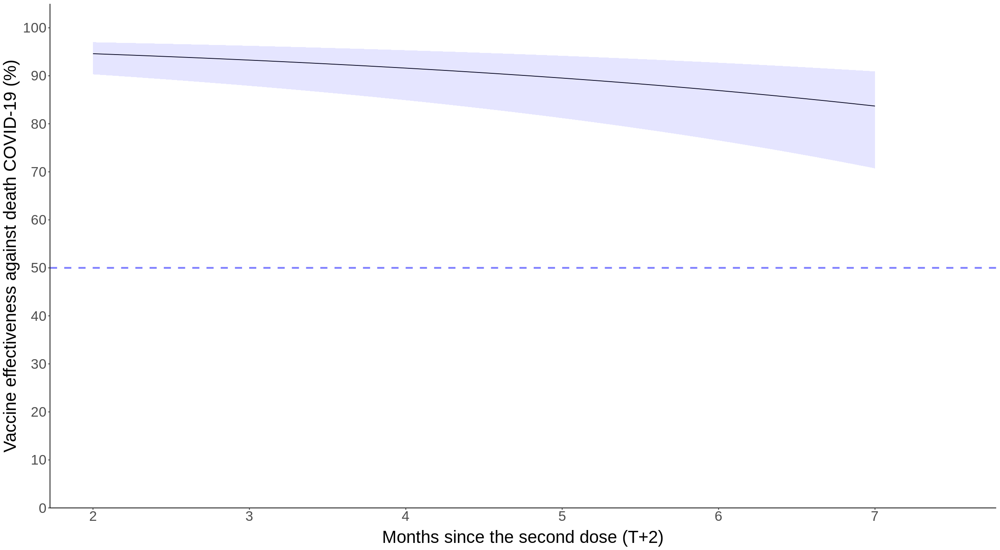


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_azazmn_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.9340  -0.0904   0.0000   0.0000  28.5693  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -8.839e+00  1.344e-01 -65.785  < 2e-16 ***
vac_typeAZ-AZ-MN       -2.248e+00  2.917e-01  -7.705 1.31e-14 ***
month                  -6.275e-02  7.330e-03  -8.560  < 2e-16 ***
maleTRUE                6.245e-01  2.975e-02  20.987  < 2e-16 ***
provinceกระบี่           -2.169e+00  3.801e-01  -5.707 1.15e-08 ***
provinceกาญจนบุรี        -3.953e-01  1.632e-01  -2.423 0.015408 *  
provinceกาฬสินธุ์         -2.414e+00  2.803e-01  -8.612  < 2e-16 ***
provinceกำแพงเพชร      -8.724e-01  1.933e-01  -4.513 6.40e-06 ***
provinceขอนแก่น         -1.746e+00  1.305e-01 -13.373  < 2e-16 ***
provinceจันทบุรี          -7.319e-01  1.933e-01  -3.786 0.00

[1] 0.05964596 0.10565297 0.18714679

[1] 81.28532 89.43470 94.03540

[1] 0.08561072 0.13044678 0.19876438

[1] 80.12356 86.95532 91.43893

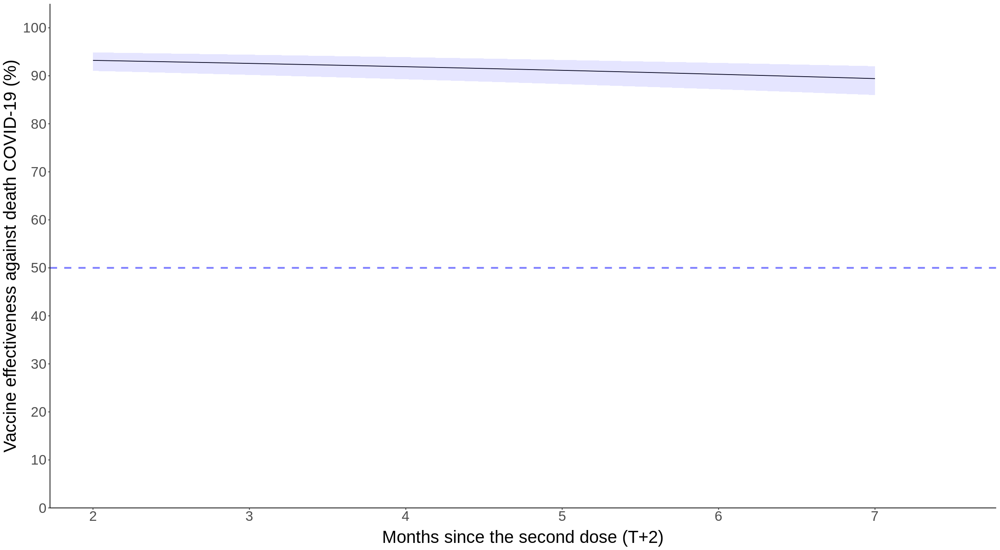

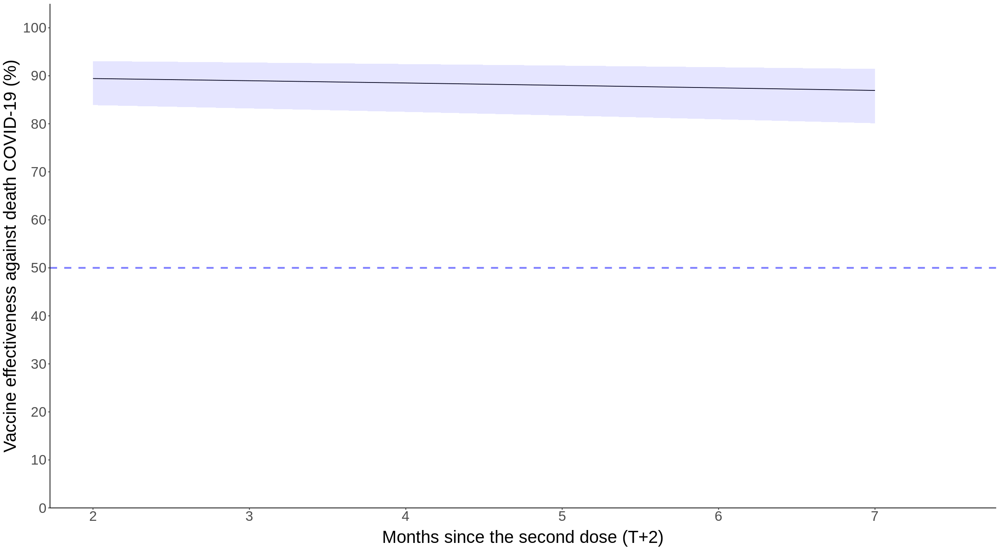

In [366]:
#Stratified by age group: 18-40
d3_d_azazmn_18_40<-d3_d_azazmn[agegroup=="18-40"]

model_d3_d_azazmn_inter_18_40<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_azazmn_18_40)
summary(model_d3_d_azazmn_inter_18_40)

#Initial OR
exp(summary(model_d3_d_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN",2])

#Initial VE
(1-exp(summary(model_d3_d_azazmn_inter_18_40)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_azazmn_inter_18_40)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazmn_18_40 <- sqrt(vcov(model_d3_d_azazmn_inter_18_40)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN"] + 
                        vcov(model_d3_d_azazmn_inter_18_40)["vac_typeAZ-AZ-MN:month","vac_typeAZ-AZ-MN:month"]+ 
                        2*vcov(model_d3_d_azazmn_inter_18_40)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"])

exp(summary(model_d3_d_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN",1]+
      summary(model_d3_d_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazmn_18_40)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN",1]+
         summary(model_d3_d_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazmn_18_40))*100

#VE overtime
ve_d_azazmn_18_40<-NULL
for(i in 0:500){
  ve_d_azazmn_18_40<-rbind(ve_d_azazmn_18_40,(1-exp(summary(model_d3_d_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN",1]+
                                              summary(model_d3_d_azazmn_inter_18_40)$coef["vac_typeAZ-AZ-MN:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazmn_18_40))*100)
}

ve_d_azazmn_18_40<-cbind(0:500/100,ve_d_azazmn_18_40)

ve_d_azazmn_18_40<-as.data.frame(ve_d_azazmn_18_40)
names(ve_d_azazmn_18_40)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_azazmn_18_40,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 41_60
d3_d_azazmn_41_60<-d3_d_azazmn[agegroup=="41-60"]

model_d3_d_azazmn_inter_41_60<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_azazmn_41_60)
summary(model_d3_d_azazmn_inter_41_60)

#Initial OR
exp(summary(model_d3_d_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN",2])

#initial VE
(1-exp(summary(model_d3_d_azazmn_inter_41_60)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_azazmn_inter_41_60)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazmn_41_60 <- sqrt(vcov(model_d3_d_azazmn_inter_41_60)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN"] + 
                        vcov(model_d3_d_azazmn_inter_41_60)["vac_typeAZ-AZ-MN:month","vac_typeAZ-AZ-MN:month"]+ 
                        2*vcov(model_d3_d_azazmn_inter_41_60)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"])

exp(summary(model_d3_d_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN",1]+
      summary(model_d3_d_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazmn_41_60)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN",1]+
         summary(model_d3_d_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazmn_41_60))*100

#VE overtime
ve_d_azazmn_41_60<-NULL
for(i in 0:500){
  ve_d_azazmn_41_60<-rbind(ve_d_azazmn_41_60,(1-exp(summary(model_d3_d_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN",1]+
                                              summary(model_d3_d_azazmn_inter_41_60)$coef["vac_typeAZ-AZ-MN:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazmn_41_60))*100)
}

ve_d_azazmn_41_60<-cbind(0:500/100,ve_d_azazmn_41_60)

ve_d_azazmn_41_60<-as.data.frame(ve_d_azazmn_41_60)
names(ve_d_azazmn_41_60)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_azazmn_41_60,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 61_80
d3_d_azazmn_61_80<-d3_d_azazmn[agegroup=="61-80"]

model_d3_d_azazmn_inter_61_80<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_azazmn_61_80)
summary(model_d3_d_azazmn_inter_61_80)

#Initial OR
exp(summary(model_d3_d_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN",2])

#initial VE
(1-exp(summary(model_d3_d_azazmn_inter_61_80)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_azazmn_inter_61_80)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazmn_61_80 <- sqrt(vcov(model_d3_d_azazmn_inter_61_80)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN"] + 
                        vcov(model_d3_d_azazmn_inter_61_80)["vac_typeAZ-AZ-MN:month","vac_typeAZ-AZ-MN:month"]+ 
                        2*vcov(model_d3_d_azazmn_inter_61_80)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"])

exp(summary(model_d3_d_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN",1]+
      summary(model_d3_d_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazmn_61_80)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN",1]+
         summary(model_d3_d_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazmn_61_80))*100

#VE overtime
ve_d_azazmn_61_80<-NULL
for(i in 0:500){
  ve_d_azazmn_61_80<-rbind(ve_d_azazmn_61_80,(1-exp(summary(model_d3_d_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN",1]+
                                              summary(model_d3_d_azazmn_inter_61_80)$coef["vac_typeAZ-AZ-MN:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazmn_61_80))*100)
}

ve_d_azazmn_61_80<-cbind(0:500/100,ve_d_azazmn_61_80)

ve_d_azazmn_61_80<-as.data.frame(ve_d_azazmn_61_80)
names(ve_d_azazmn_61_80)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_azazmn_61_80,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

######

#Stratified by age group: 81_100
d3_d_azazmn_81_100<-d3_d_azazmn[agegroup=="Over 80"]

model_d3_d_azazmn_inter_81_100<-glm(death ~ vac_type*month+male+province+inf_date, binomial, weight=Freq, data=d3_d_azazmn_81_100)
summary(model_d3_d_azazmn_inter_81_100)

#Initial OR
exp(summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",2])

#initial VE
(1-exp(summary(model_d3_d_azazmn_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_azazmn_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazmn_81_100 <- sqrt(vcov(model_d3_d_azazmn_inter_81_100)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN"] + 
                        vcov(model_d3_d_azazmn_inter_81_100)["vac_typeAZ-AZ-MN:month","vac_typeAZ-AZ-MN:month"]+ 
                        2*vcov(model_d3_d_azazmn_inter_81_100)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"])

exp(summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+
      summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazmn_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+
         summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazmn_81_100))*100

#VE overtime
ve_d_azazmn_81_100<-NULL
for(i in 0:500){
  ve_d_azazmn_81_100<-rbind(ve_d_azazmn_81_100,(1-exp(summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+
                                              summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN:month",1]*i/100+
                                              qnorm(c(0.975,0.50,0.025))*se_azazmn_81_100))*100)
}

ve_d_azazmn_81_100<-cbind(0:500/100,ve_d_azazmn_81_100)

ve_d_azazmn_81_100<-as.data.frame(ve_d_azazmn_81_100)
names(ve_d_azazmn_81_100)<-c("month","lower","estimate","upper")

options(repr.plot.width=20, repr.plot.height=11)
ggplot(data=ve_d_azazmn_81_100,aes(x=month+2,y=estimate,ymin=lower,ymax=upper))+
  geom_line()+
  geom_ribbon(fill="blue",alpha=0.1,show.legend = FALSE)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:7,limits = c(2,7+0.5),name = "Months since the second dose (T+2)")+
  scale_y_continuous(expand=c(0,0), limits = c(0,105),breaks = 0:10*10,name = "Vaccine effectiveness against death COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))

In [367]:
summary(model_d3_d_azazmn_inter_81_100)

#Initial OR
exp(summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+qnorm(c(0.025,0.50,0.975))*summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",2])

#initial VE
(1-exp(summary(model_d3_d_azazmn_inter_81_100)$coef[2,1]+qnorm(c(0.975,0.50,0.025))*summary(model_d3_d_azazmn_inter_81_100)$coef[2,2]))*100

#OR at 7 month after the last dose (T=5)
se_azazmn_81_100 <- sqrt(vcov(model_d3_d_azazmn_inter_81_100)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN"] + 
                        vcov(model_d3_d_azazmn_inter_81_100)["vac_typeAZ-AZ-MN:month","vac_typeAZ-AZ-MN:month"]+ 
                        2*vcov(model_d3_d_azazmn_inter_81_100)["vac_typeAZ-AZ-MN","vac_typeAZ-AZ-MN:month"])

exp(summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+
      summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN:month",1]*5+
      qnorm(c(0.025,0.50,0.975))*se_azazmn_81_100)

#VE at 7 month after the last dose (T=5)
(1-exp(summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN",1]+
         summary(model_d3_d_azazmn_inter_81_100)$coef["vac_typeAZ-AZ-MN:month",1]*5+
         qnorm(c(0.975,0.50,0.025))*se_azazmn_81_100))*100


Call:
glm(formula = death ~ vac_type * month + male + province + inf_date, 
    family = binomial, data = d3_d_azazmn_81_100, weights = Freq)

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-7.9340  -0.0904   0.0000   0.0000  28.5693  

Coefficients:
                         Estimate Std. Error z value Pr(>|z|)    
(Intercept)            -8.839e+00  1.344e-01 -65.785  < 2e-16 ***
vac_typeAZ-AZ-MN       -2.248e+00  2.917e-01  -7.705 1.31e-14 ***
month                  -6.275e-02  7.330e-03  -8.560  < 2e-16 ***
maleTRUE                6.245e-01  2.975e-02  20.987  < 2e-16 ***
provinceกระบี่           -2.169e+00  3.801e-01  -5.707 1.15e-08 ***
provinceกาญจนบุรี        -3.953e-01  1.632e-01  -2.423 0.015408 *  
provinceกาฬสินธุ์         -2.414e+00  2.803e-01  -8.612  < 2e-16 ***
provinceกำแพงเพชร      -8.724e-01  1.933e-01  -4.513 6.40e-06 ***
provinceขอนแก่น         -1.746e+00  1.305e-01 -13.373  < 2e-16 ***
provinceจันทบุรี          -7.319e-01  1.933e-01  -3.786 0.00

[1] 0.05964596 0.10565297 0.18714679

[1] 81.28532 89.43470 94.03540

[1] 0.08561072 0.13044678 0.19876438

[1] 80.12356 86.95532 91.43893

Warning message in max(ids, na.rm = TRUE):
“no non-missing arguments to max; returning -Inf”


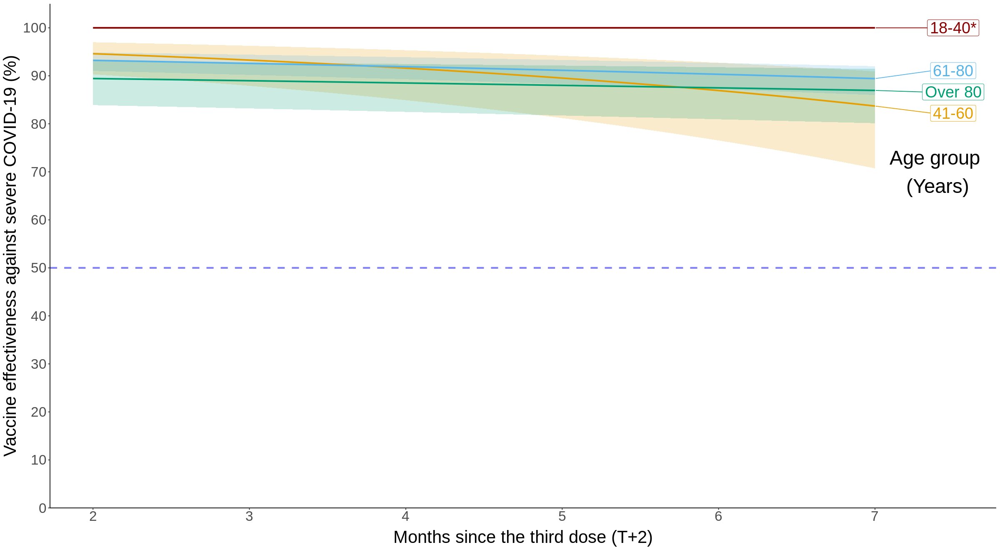

In [368]:
ve_d_azazmn_18_40$Age<-"18-40*"
ve_d_azazmn_41_60$Age<-"41-60"
ve_d_azazmn_61_80$Age<-"61-80"
ve_d_azazmn_81_100$Age<-"Over 80"
ve_d_azazmn_all<-rbind(ve_d_azazmn_18_40,ve_d_azazmn_41_60,ve_d_azazmn_61_80,ve_d_azazmn_81_100)
ve_d_azazmn_all<-as.data.table(ve_d_azazmn_all)

ggplot(ve_d_azazmn_all)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Age,fill=Age),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Age),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(ve_d_azazmn_all[order(-month)],by=c("Age")),
                   aes(label = Age,x=month+2,y=estimate,col=Age),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(ve_d_azazmn_all$month)+2),limits = c(2,max(ve_d_azazmn_all$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against severe COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))+
  annotate("text", x=7.4, y=70, label= "Age group \n(Years)",size=10)

**Summary**

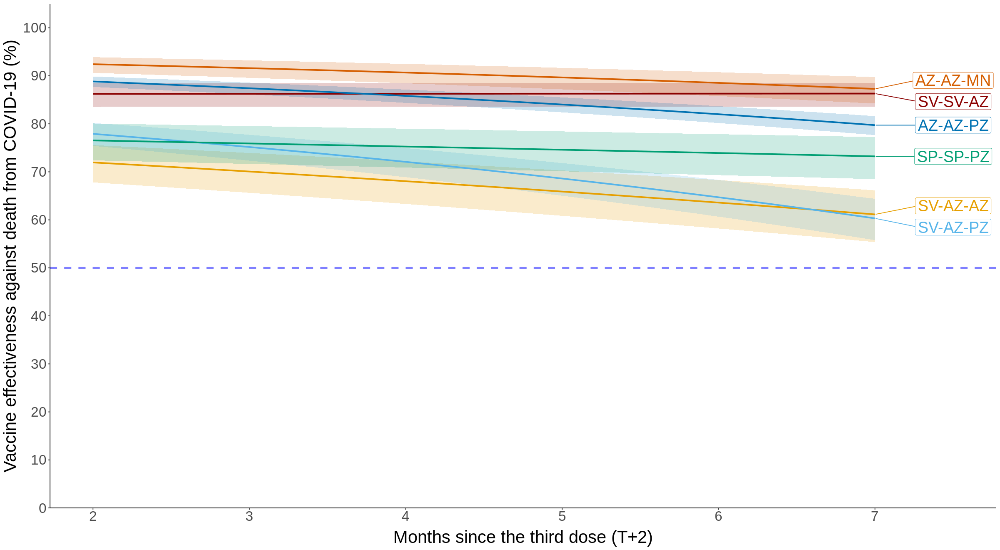

In [369]:
ve_svsvaz$Vaccination<-"SV-SV-AZ"
ve_svazaz$Vaccination<-"SV-AZ-AZ"
ve_svazpz$Vaccination<-"SV-AZ-PZ"
ve_spsppz$Vaccination<-"SP-SP-PZ"
ve_azazpz$Vaccination<-"AZ-AZ-PZ"
ve_azazmn$Vaccination<-"AZ-AZ-MN"
d3_sm<-rbind(ve_svsvaz,
ve_svazaz,
ve_svazpz,
ve_spsppz,
ve_azazpz,
ve_azazmn)

d3_sm$Vaccination<-factor(d3_sm$Vaccination,levels=c("SV-SV-AZ","SV-AZ-AZ","SV-AZ-PZ","SP-SP-PZ","AZ-AZ-PZ","AZ-AZ-MN"))

d3_sm<-as.data.table(d3_sm)

d3_sm<-d3_sm[month<=5]

ggplot(d3_sm)+
  geom_hline(yintercept = 50,col="blue",linetype=2,size=1.2,alpha=0.5)+
  geom_ribbon(aes(x=month+2,y=estimate,ymin=lower,ymax=upper,group=Vaccination,fill=Vaccination),alpha=0.2,show.legend = FALSE)+
  geom_line(aes(x=month+2,y=estimate,col=Vaccination),size=1.1,show.legend = FALSE)+
  geom_label_repel(data = unique(d3_sm[order(-month)],by=c("Vaccination")),
                   aes(label = Vaccination,x=month+2,y=estimate,col=Vaccination),
                   nudge_x = 0.5,
                   size=8,
                   na.rm = TRUE,show.legend = FALSE)+
  scale_fill_manual(values = safe_colorblind_palette)+
  scale_color_manual(values = safe_colorblind_palette)+
  scale_x_continuous(breaks = 2:(max(d3_sm$month)+2),limits = c(2,max(d3_sm$month)+2.5),name = "Months since the third dose (T+2)")+
  scale_y_continuous(expand=c(0,0),limits=c(0,105),breaks=0:10*10,name = "Vaccine effectiveness against death from COVID-19 (%)")+
  theme_classic()+
  theme(axis.text.x = element_text(size=20),
        axis.title.x = element_text(size=25,margin = margin(t = 10, r = 0, b = 0, l = 0)),
        axis.text.y = element_text(size=20),
        axis.title.y = element_text(size=25,margin = margin(t = 0, r = 5, b = 0, l = 0)))